# <font color=blue>Data Expo 2008 «Airline on-time performance»</font>

## by [<font color=orange>Mostafa Abobakr</font>](https://cutt.ly/MostafaALinkedIn)

## Preliminary Wrangling

This dataset reports flights in the United States, including carriers, arrival and departure delays, and reasons for delays, during year 2008.

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
np.random.seed(123) # for reproducing same random results

**Motivation:** We will use the dataset to gain insights that could help make improvements against the flights delaying's, or to make backed findings about the best carriers with less delaying's.

In [2]:
#reading 2008.csv then copying to a dataframe
flights_2008 = pd.read_csv('2008.csv')
df = flights_2008.copy()
print(df.shape)
print(df.info())
df.head()

(7009728, 29)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7009728 entries, 0 to 7009727
Data columns (total 29 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Year               int64  
 1   Month              int64  
 2   DayofMonth         int64  
 3   DayOfWeek          int64  
 4   DepTime            float64
 5   CRSDepTime         int64  
 6   ArrTime            float64
 7   CRSArrTime         int64  
 8   UniqueCarrier      object 
 9   FlightNum          int64  
 10  TailNum            object 
 11  ActualElapsedTime  float64
 12  CRSElapsedTime     float64
 13  AirTime            float64
 14  ArrDelay           float64
 15  DepDelay           float64
 16  Origin             object 
 17  Dest               object 
 18  Distance           int64  
 19  TaxiIn             float64
 20  TaxiOut            float64
 21  Cancelled          int64  
 22  CancellationCode   object 
 23  Diverted           int64  
 24  CarrierDelay       float64
 25  Weat

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,2008,1,3,4,2003.0,1955,2211.0,2225,WN,335,...,4.0,8.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
1,2008,1,3,4,754.0,735,1002.0,1000,WN,3231,...,5.0,10.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
2,2008,1,3,4,628.0,620,804.0,750,WN,448,...,3.0,17.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
3,2008,1,3,4,926.0,930,1054.0,1100,WN,1746,...,3.0,7.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
4,2008,1,3,4,1829.0,1755,1959.0,1925,WN,3920,...,3.0,10.0,0,NaN,0,2.0,0.0,0.0,0.0,32.0


In [3]:
# finding duplicated data points
df[df.duplicated()]

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
938221,2008,2,28,4,829.0,835,1341.0,1350,F9,728,...,6.0,14.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
938223,2008,2,28,4,1427.0,1435,1640.0,1636,F9,727,...,9.0,16.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
938225,2008,2,28,4,1854.0,1807,1946.0,1902,F9,773,...,8.0,13.0,0,NaN,0,44.0,0.0,0.0,0.0,0.0
938227,2008,2,28,4,2027.0,1942,2314.0,2229,F9,780,...,10.0,13.0,0,NaN,0,1.0,0.0,44.0,0.0,0.0


<font size=3 color=blue>I decided to move to work on `DB Browser for SQlite` to work more rapidly with this huge data points number of over 7 Million, and to get needed columns for my investigation, with the code
    <font size=2.5 color=pur>

> `SELECT` FlightNum,Tailnum,
		Month,DayofMonth,DayOfWeek, c.Description `as` Carrier, ArrDelay,
		Cancelled,CancellationCode,Diverted,
		CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,
		Origin,Dest,Distance,TaxiIn,TaxiOut<br>
> `FROM` '2008' `as` flights<br>
> `JOIN` carriers `as` c<br>
> `ON` flights.UniqueCarrier = c.Code;</font>

I reduced dataset from 29 to be 19 columns, and I made a left join with _carriers.csv_ data there to get carrier names instead of there codes. I exported the columns to 2008_flights.csv later, then I came back again to jupyter notebook to complete the work.</font>


In [4]:
# reduced dataset with 19 columns with carriers names after left joining carriers.csv via SQLite 

flights_sql = pd.read_csv('2008_flights.csv')
flights = flights_sql.copy()

# removing duplicated datapoints found within jupyter notebook before the SQLite work 

flights.drop(index=[938221,938223,938225,938227],inplace=True)
flights.reset_index(drop=True,inplace=True)
print(flights.shape)
print(flights.info())
flights.head()

(7009724, 19)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7009724 entries, 0 to 7009723
Data columns (total 19 columns):
 #   Column            Dtype  
---  ------            -----  
 0   FlightNum         int64  
 1   TailNum           object 
 2   Month             int64  
 3   DayofMonth        int64  
 4   DayOfWeek         int64  
 5   Carrier           object 
 6   ArrDelay          float64
 7   Cancelled         int64  
 8   CancellationCode  object 
 9   Diverted          int64  
 10  CarrierDelay      float64
 11  WeatherDelay      float64
 12  NASDelay          float64
 13  SecurityDelay     float64
 14  Origin            object 
 15  Dest              object 
 16  Distance          int64  
 17  TaxiIn            float64
 18  TaxiOut           float64
dtypes: float64(7), int64(7), object(5)
memory usage: 1016.1+ MB
None


,FlightNum,TailNum,Month,DayofMonth,DayOfWeek,Carrier,ArrDelay,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,Origin,Dest,Distance,TaxiIn,TaxiOut
0,335,N712SW,1,3,4,Southwest Airlines Co.,-14.0,0,NaN,0,NaN,NaN,NaN,NaN,IAD,TPA,810,4.0,8.0
1,3231,N772SW,1,3,4,Southwest Airlines Co.,2.0,0,NaN,0,NaN,NaN,NaN,NaN,IAD,TPA,810,5.0,10.0
2,448,N428WN,1,3,4,Southwest Airlines Co.,14.0,0,NaN,0,NaN,NaN,NaN,NaN,IND,BWI,515,3.0,17.0
3,1746,N612SW,1,3,4,Southwest Airlines Co.,-6.0,0,NaN,0,NaN,NaN,NaN,NaN,IND,BWI,515,3.0,7.0
4,3920,N464WN,1,3,4,Southwest Airlines Co.,34.0,0,NaN,0,2.0,0.0,0.0,0.0,IND,BWI,515,3.0,10.0


In [5]:
# extracting the columns thought as helpful for this investigating

investigate_cols = ['Month', 'Carrier', 'ArrDelay',
                    'Cancelled','CancellationCode',
                    'CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']

df_inv = flights[investigate_cols].copy()
print(df_inv.shape)
print(df_inv.info())
df_inv.head()

(7009724, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7009724 entries, 0 to 7009723
Data columns (total 9 columns):
 #   Column            Dtype  
---  ------            -----  
 0   Month             int64  
 1   Carrier           object 
 2   ArrDelay          float64
 3   Cancelled         int64  
 4   CancellationCode  object 
 5   CarrierDelay      float64
 6   WeatherDelay      float64
 7   NASDelay          float64
 8   SecurityDelay     float64
dtypes: float64(5), int64(2), object(2)
memory usage: 481.3+ MB
None


,Month,Carrier,ArrDelay,Cancelled,CancellationCode,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,1,Southwest Airlines Co.,-14.0,0,NaN,NaN,NaN,NaN,NaN
1,1,Southwest Airlines Co.,2.0,0,NaN,NaN,NaN,NaN,NaN
2,1,Southwest Airlines Co.,14.0,0,NaN,NaN,NaN,NaN,NaN
3,1,Southwest Airlines Co.,-6.0,0,NaN,NaN,NaN,NaN,NaN
4,1,Southwest Airlines Co.,34.0,0,NaN,2.0,0.0,0.0,0.0


In [6]:
#  replacing Months numbers with names                   ---- months
months = { 10:'Oct', 11:'Nov', 12:'Dec',1:'Jan', 2:'Feb', 3:'Mar',
            4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep'}
df_inv['Month'] = df_inv['Month'].replace(list(months.keys()),
                                          list(months.values()))

# changing 'Month' type column to ordered category       ----- converting 'Month' to category
months_order = ['Jan','Feb','Mar','Apr','May','Jun',
                'Jul','Aug','Sep','Oct','Nov','Dec']
months_cat = pd.api.types.CategoricalDtype(ordered=True, categories=months_order)
df_inv['Month'] = df_inv['Month'].astype(months_cat)

In [7]:
# preparing for plots of Carrier for the whole data points df_inv (7,009,724 rows)
print('(df_inv carrier counts)','\n')
print(df_inv['Carrier'].value_counts().sort_index())

(df_inv carrier counts) 

AirTran Airways Corporation                                                             261684
Alaska Airlines Inc.                                                                    151102
Aloha Airlines Inc.                                                                       7800
American Airlines Inc.                                                                  604885
American Eagle Airlines Inc.                                                            490693
Atlantic Southeast Airlines                                                             280575
Comair Inc.                                                                             197607
Continental Air Lines Inc.                                                              298455
Delta Air Lines Inc.                                                                    451931
Expressjet Airlines Inc.                                                                374510
Frontier Airlines Inc.  

In [8]:
# shortening long carrier name 'US Airways Inc. (Merged with America West 9/05. Reporting for both starting 10/07.)'
# within the whole data points dataframe df_inv  (7,009,728 rows)

long_str = 'US Airways Inc. (Merged with America West 9/05. Reporting for both starting 10/07.)'
short_str = 'US Airways Inc.'

df_inv['Carrier'] = df_inv['Carrier'].replace(long_str,short_str)

In [9]:
# exporting df_inv to 'csv' file
#df_inv.to_csv('2008_investigate_cols.csv',index = False)

In [10]:
# descriptive statistics for numeric variables
df_inv.describe()

,ArrDelay,Cancelled,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
count,6.855025e+06,7.009724e+06,1.524733e+06,1.524733e+06,1.524733e+06,1.524733e+06
mean,8.168445e+00,1.960619e-02,1.577205e+01,3.039035e+00,1.716462e+01,7.497444e-02
std,3.850194e+01,1.386427e-01,4.009913e+01,1.950289e+01,3.189497e+01,1.837941e+00
min,-5.190000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,-1.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,-2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.000000e+00,0.000000e+00
75%,1.200000e+01,0.000000e+00,1.600000e+01,0.000000e+00,2.100000e+01,0.000000e+00
max,2.461000e+03,1.000000e+00,2.436000e+03,1.352000e+03,1.357000e+03,3.920000e+02


In [11]:
# data points of cancelled flights           ************* cancelled flights 'airline_cancelled' (137,434 rows)
cancel_cols = ['Month','Carrier','CancellationCode']
airline_cancelled = df_inv.loc[df_inv['Cancelled']==1,cancel_cols].copy()
airline_cancelled.reset_index(drop=True,inplace=True)
print(airline_cancelled.shape)
print(airline_cancelled.info())
airline_cancelled.head()

(137434, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137434 entries, 0 to 137433
Data columns (total 3 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   Month             137434 non-null  category
 1   Carrier           137434 non-null  object  
 2   CancellationCode  137434 non-null  object  
dtypes: category(1), object(2)
memory usage: 2.2+ MB
None


,Month,Carrier,CancellationCode
0,Jan,Southwest Airlines Co.,A
1,Jan,Southwest Airlines Co.,A
2,Jan,Southwest Airlines Co.,A
3,Jan,Southwest Airlines Co.,C
4,Jan,Southwest Airlines Co.,A


In [12]:
# descriptive statistics for variables of cancelled flights
airline_cancelled.describe()

,Month,Carrier,CancellationCode
count,137434,137434,137434
unique,12,20,4
top,Feb,American Eagle Airlines Inc.,B
freq,20596,18331,54904


In [13]:
# on-time flights, or data points with arrival delays less than 15 minutes and not null ** on-time (5,330,292 rows)
on_time = df_inv[(df_inv['ArrDelay'] < 15) & (~df_inv['ArrDelay'].isna())].copy()
on_time.reset_index(drop=True,inplace=True)
print(on_time.shape)
print(on_time.info())
on_time.head()

(5330292, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5330292 entries, 0 to 5330291
Data columns (total 9 columns):
 #   Column            Dtype   
---  ------            -----   
 0   Month             category
 1   Carrier           object  
 2   ArrDelay          float64 
 3   Cancelled         int64   
 4   CancellationCode  object  
 5   CarrierDelay      float64 
 6   WeatherDelay      float64 
 7   NASDelay          float64 
 8   SecurityDelay     float64 
dtypes: category(1), float64(5), int64(1), object(2)
memory usage: 330.4+ MB
None


,Month,Carrier,ArrDelay,Cancelled,CancellationCode,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,Jan,Southwest Airlines Co.,-14.0,0,NaN,NaN,NaN,NaN,NaN
1,Jan,Southwest Airlines Co.,2.0,0,NaN,NaN,NaN,NaN,NaN
2,Jan,Southwest Airlines Co.,14.0,0,NaN,NaN,NaN,NaN,NaN
3,Jan,Southwest Airlines Co.,-6.0,0,NaN,NaN,NaN,NaN,NaN
4,Jan,Southwest Airlines Co.,11.0,0,NaN,NaN,NaN,NaN,NaN


In [14]:
# descriptive statistics for numeric variables with ArrDelay less than 15 minutes (on-time)
on_time.describe()

,ArrDelay,Cancelled,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
count,5.330292e+06,5330292.0,0.0,0.0,0.0,0.0
mean,-5.748843e+00,0.0,NaN,NaN,NaN,NaN
std,1.004538e+01,0.0,NaN,NaN,NaN,NaN
min,-5.190000e+02,0.0,NaN,NaN,NaN,NaN
25%,-1.200000e+01,0.0,NaN,NaN,NaN,NaN
50%,-6.000000e+00,0.0,NaN,NaN,NaN,NaN
75%,1.000000e+00,0.0,NaN,NaN,NaN,NaN
max,1.400000e+01,0.0,NaN,NaN,NaN,NaN


In [15]:
# extracting data points with arrival delays that equal 15 minutes or more
df_inv_15 = df_inv[df_inv['ArrDelay']>=15].copy()
df_inv_15.drop(columns=['Cancelled','CancellationCode'],inplace=True)

df_inv_15.reset_index(drop=True,inplace=True)
print(df_inv_15.shape)
print(df_inv_15.info())
df_inv_15.head()

(1524733, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1524733 entries, 0 to 1524732
Data columns (total 7 columns):
 #   Column         Non-Null Count    Dtype   
---  ------         --------------    -----   
 0   Month          1524733 non-null  category
 1   Carrier        1524733 non-null  object  
 2   ArrDelay       1524733 non-null  float64 
 3   CarrierDelay   1524733 non-null  float64 
 4   WeatherDelay   1524733 non-null  float64 
 5   NASDelay       1524733 non-null  float64 
 6   SecurityDelay  1524733 non-null  float64 
dtypes: category(1), float64(5), object(1)
memory usage: 71.3+ MB
None


,Month,Carrier,ArrDelay,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,Jan,Southwest Airlines Co.,34.0,2.0,0.0,0.0,0.0
1,Jan,Southwest Airlines Co.,57.0,10.0,0.0,0.0,0.0
2,Jan,Southwest Airlines Co.,80.0,8.0,0.0,0.0,0.0
3,Jan,Southwest Airlines Co.,15.0,3.0,0.0,0.0,0.0
4,Jan,Southwest Airlines Co.,16.0,0.0,0.0,0.0,0.0


In [16]:
df_inv_15.Month.unique()

['Jan', 'Feb', 'Mar', 'Apr', 'May', ..., 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
Length: 12
Categories (12, object): ['Jan' < 'Feb' < 'Mar' < 'Apr' ... 'Sep' < 'Oct' < 'Nov' < 'Dec']

In [17]:
# descriptive statistics for numeric variables with ArrDelay equals 15 minutes or more
df_inv_15.describe()

,ArrDelay,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
count,1.524733e+06,1.524733e+06,1.524733e+06,1.524733e+06,1.524733e+06
mean,5.682169e+01,1.577205e+01,3.039035e+00,1.716462e+01,7.497444e-02
std,5.716356e+01,4.009913e+01,1.950289e+01,3.189497e+01,1.837941e+00
min,1.500000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.300000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,3.700000e+01,0.000000e+00,0.000000e+00,6.000000e+00,0.000000e+00
75%,6.900000e+01,1.600000e+01,0.000000e+00,2.100000e+01,0.000000e+00
max,2.461000e+03,2.436000e+03,1.352000e+03,1.357000e+03,3.920000e+02


In [18]:
# sampling 500 flights so that plots are clearer and
# they render faster

samples = np.random.choice(df_inv_15.shape[0], 500, replace = False)
df_inv_15_samp = df_inv_15.loc[samples,:]

At the previous cell, I was creating a sample of 500 data points to make the rendering faster.

### <font color='blue'>What is the structure of your dataset?</font>

There are __7,009,724 rows__ of data points in the dataset after removing 4 duplicted data points, with __29 features__ or variables, below are their names with a brief description for each:

- 1:	__Year__	2008
- 2:	__Month__	1-12
- 3:	__DayofMonth__	1-31
- 4:	__DayOfWeek__	1 (Monday) - 7 (Sunday)
- 5:	__DepTime__	actual departure time (local, hhmm)
- 6:	__CRSDepTime__	scheduled departure time (local, hhmm), scheduled time that an aircraft should lift off from the origin airport.
- 7:	__ArrTime__	actual arrival time (local, hhmm)
- 8:	__CRSArrTime__	scheduled arrival time (local, hhmm), scheduled time that an aircraft should cross a certain point (landing or metering fix)
- 9:	__UniqueCarrier__	unique carrier code,  the Carrier Code most recently used by a carrier. A numeric suffix is used to distinguish duplicate codes, for example, PA, PA (1), PA (2).
- 10:	__FlightNum__	flight number
- 11:	__TailNum__	plane tail number
- 12:	__ActualElapsedTime__	in minutes, time computed from gate departure time to gate arrival time.
- 13:	__CRSElapsedTime__	in minutes
- 14:	__AirTime__	in minutes, total time an aircraft is in the air between an origin-destination airport pair, i.e. from wheels-off at the origin airport to wheels-down at the destination airport.

- 15:	__ArrDelay__	arrival delay, in minutes, equals the difference of the actual arrival time minus the scheduled arrival time. <font color='orange'>**A flight is considered on-time when it arrives less than 15 minutes after its published arrival time**.</font>
- 16:	__DepDelay__	departure delay, in minutes, difference between the scheduled departure time and the actual departure time
- 17:	__Origin__	origin IATA airport code
- 18:	__Dest__	destination IATA airport code
- 19:	__Distance__	in miles
- 20:	__TaxiIn__	taxi in time, in minutes, time elapsed between wheels down and arrival at the destination airport gate
- 21:	__TaxiOut__	taxi out time in minutes, time elapsed between departure from the origin airport gate and wheels off.
- 22:	__Cancelled__	was the flight cancelled?
- 23:	__CancellationCode__	reason for cancellation (A = carrier, B = weather, C = NAS, D = security)
- 24:	__Diverted__	1 = yes, 0 = no; a flight that is required to land at a destination other than the original scheduled destination for reasons beyond the control of the pilot/company.
- 25:	__CarrierDelay__	in minutes
- 26:	__WeatherDelay__	in minutes
- 27:	__NASDelay__	in minutes, National Air System Delay
- 28:	__SecurityDelay__	in minutes
- 29:	__LateAircraftDelay__	in minutes

'CRS' in features _CRSDepTime_, _CRSArrTime_ and _CRSElapsedTime_, refers to "Computer Reservation System". CRS provide information on airline schedules, fares and seat availability to travel agencies and allow agents to book seats and issue tickets.

ALso we have more 3 supplemental datasets in case of we wanted more investigation, they are [airports.csv](https://web.archive.org/web/20191229040110/http://stat-computing.org/dataexpo/2009/airports.csv) for the airports descriptions, [carriers.csv](https://web.archive.org/web/20191229040110/http://stat-computing.org/dataexpo/2009/carriers.csv) which is listing the carriers codes with names, and [plane-data.csv](https://web.archive.org/web/20191229040110/http://stat-computing.org/dataexpo/2009/plane-data.csv) that holds information about individual planes. We could use the first two supplemental datasets, but we will not use the last plane-data.csv in our investigation.

After that I reduced data features in data set to be 19. I reduced them again to be 9 features. Then I derived a dataframe for cancelled flights, an other for ontime flights, and an other for delayed flights (15 min. arrival delay or more) with delay causes data.

### <font color='blue'>What is/are the main feature(s) of interest in your dataset?</font>

I'm most interested in figuring out what features (like month, carrier, arrival delay, delay and cancellation causes), are best for making improvements against the flights delaying's, or to make backed findings about the best carriers with less delaying's.

### <font color='blue'>What features in the dataset do you think will help support your investigation into your feature(s) of interest?</font>

- 2:	*__Month__*	1-12
- 9:	*__UniqueCarrier__*	unique carrier code,  the Carrier Code most recently used by a carrier. A numeric suffix is used to distinguish duplicate codes, for example, PA, PA (1), PA (2).
- 15:	*__ArrDelay__*	arrival delay, in minutes, equals the difference of the actual arrival time minus the scheduled arrival time. A flight is considered on-time when it arrives less than 15 minutes after its published arrival time.
- 25:	*__CarrierDelay__*	in minutes
- 26:	*__WeatherDelay__*	in minutes
- 27:	*__NASDelay__*	in minutes, National Air System Delay
- 28:	*__SecurityDelay__*	in minutes

As well by joining _carriers.csv_, we could make use of _carrier **Description**_ feature to name a column for carrier instead of using the code in _UniqueCarrier_ column.

Also I could make use of:
- 22:	*__Cancelled__*	was the flight cancelled?
- 23:	*__CancellationCode__*	reason for cancellation (A = carrier, B = weather, C = NAS, D = security)

## <font color='blue'>Univariate Exploration</font>


 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


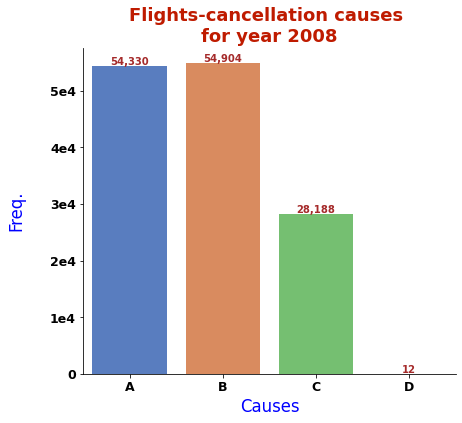

In [19]:
# univariate plots of CancellationCode or flight cancellation causes codes for the whole data points df_inv (7,009,728 rows)
# A = carrier, B = weather, C = NAS, D = security

plt.figure(figsize=(20,6))
default_color = sns.color_palette()[0]

ax = sns.countplot(data = df_inv, x = 'CancellationCode',
                  order = df_inv['CancellationCode'].value_counts().sort_index().index,
                  color = default_color,palette='muted')
ax.set_box_aspect(3.5/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine()

plt.title("Flights-cancellation causes \nfor year 2008",
          fontsize=18,
          color='#BF1B00',
          weight='bold')

plt.xlabel('Causes',fontsize=16.5,color='blue')
plt.ylabel('Freq.\n ',fontsize=16.5,color='blue')

plt.yticks([0,10000,20000,30000,40000,50000],
           [0]+[str(n)+'e4' for n in range(1,6)],#'1e4','2e4','3e4','4e4','5e4'],
           fontsize=12.5,weight='bold')

# Recalculating the causes_counts
causes_counts = df_inv['CancellationCode'].value_counts().sort_index()
# get the current tick locations and labels
locs, labels = plt.xticks(fontsize=12.5,weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = causes_counts[label.get_text()]
    # print the annotation just above the top of the bar
    plt.text(loc, count+250, s=f"{count:,}", ha = 'center', color='brown',weight='bold');
    
#ax.set_xticklabels(causes);
print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

We can find that the carrier delay with code 'A' as well the weather delay with code 'B' are the most common to cancel a flight. Each of them caused alone more than 54 thousands flights to be cancelled. So I think they will become of interest for investigation more than other delay causes.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:132: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  figlegend = self.fig.legend(handles, labels, **kwargs)



 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


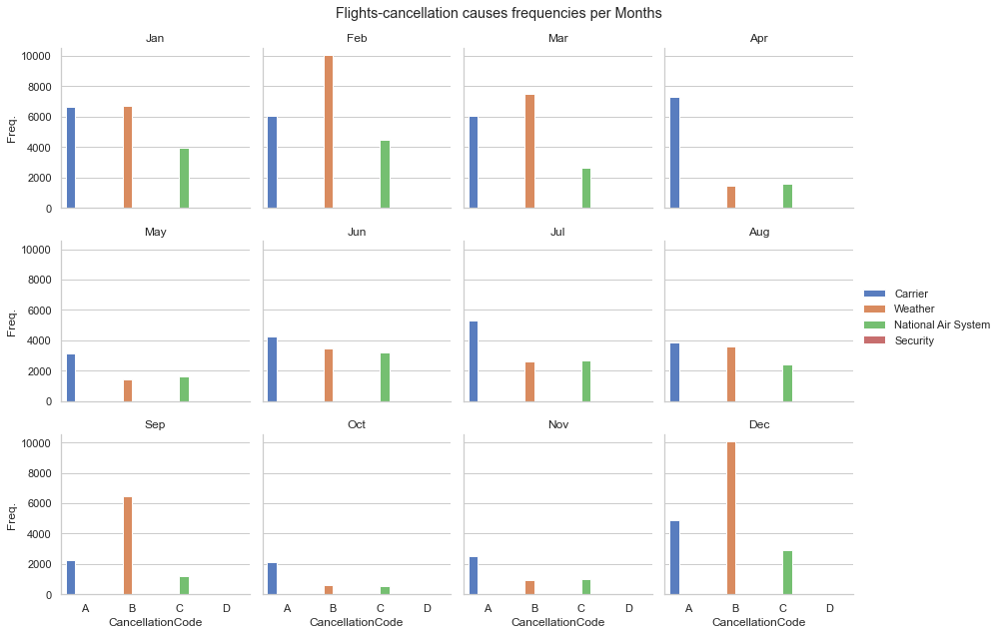

In [20]:
# # univariate plots of CancellationCode or flight cancellation-causes codes within Months
# for the whole data points df_inv (7,009,728 rows)
# A = carrier, B = weather, C = NAS, D = security

sns.set(style='whitegrid')
g = sns.FacetGrid(data=df_inv,col='Month'
                  ,col_wrap=4
                 )#,xlim=(0,300))
g.fig.suptitle('Flights-cancellation causes frequencies per Months')

order = df_inv['CancellationCode'].value_counts().sort_index().index

g.map(sns.countplot,'CancellationCode', order = order,
                    hue=df_inv['CancellationCode'],hue_order= order,
                    color = default_color,palette='muted')
g.set_titles('{col_name}')
g.add_legend(labels=['Carrier', 'Weather', 'National Air System', 'Security'])
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

It clearly shows here that the weather had the highest impact to cancel flights within 5 months, notably in 'Dec' and'Feb'. 'Carrier' had the highest cause to cancel flights within 7 months,notably in 'Apr', 'May' and 'Nov'. 'NAS' or national air system had the second highest impact to cancel flights within 4 months.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:132: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  figlegend = self.fig.legend(handles, labels, **kwargs)



 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


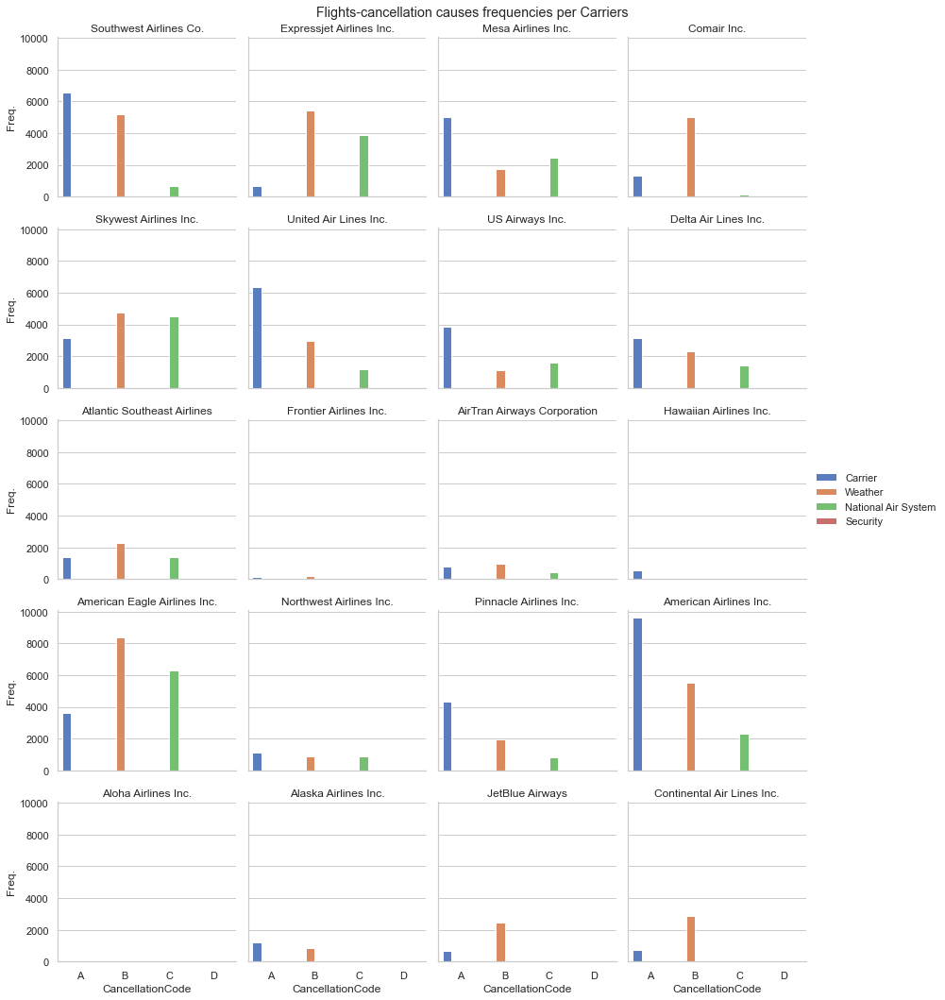

In [21]:
# # univariate plots of CancellationCode or flight cancellation-causes codes within Carriers
# for the whole data points df_inv (7,009,728 rows)
# A = carrier, B = weather, C = NAS, D = security

sns.set(style='whitegrid')
g = sns.FacetGrid(data=df_inv,col='Carrier'
                  ,col_wrap=4
                 )#,xlim=(0,300))
g.fig.suptitle('Flights-cancellation causes frequencies per Carriers')

order = df_inv['CancellationCode'].value_counts().sort_index().index

g.map(sns.countplot,'CancellationCode', order = order,
                    hue=df_inv['CancellationCode'],hue_order= order,
                    color = default_color,palette='muted')
g.set_titles('{col_name}')
g.add_legend(labels=['Carrier', 'Weather', 'National Air System', 'Security'])
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

It clearly shows here that the 'Weather' and 'Carrier' had the highest impact to cancel flights within different carriers. However, 'Carrier' had the highest impact on a larger number of carriers than the weather impact on carriers individual level. 'NAS' or national air system had the second highest impact, or the third in some other carriers, to cancel flights.

'Aloha Airlines Inc.' doesn't seem to had cancelled-flights, or may it had a little few that couldn't show up on the bar plot.

Security-delayed flights have the same last note, as well the bars that doesn't show up on 'Frontier Airlines Inc.' , 'Hawaiian Airlines Inc.', and 'Alaska Airlines Inc.'

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:132: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  figlegend = self.fig.legend(handles, labels, **kwargs)



 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


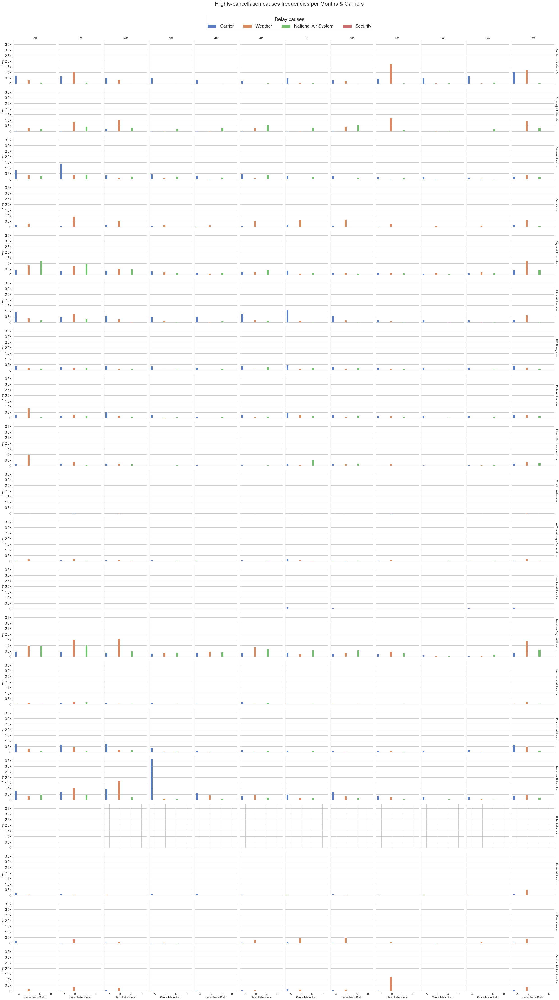

In [22]:
# # univariate plots of CancellationCode or flight cancellation-causes codes within Months per Carriers 
# for the whole data points df_inv (7,009,724 rows)
# A = carrier, B = weather, C = NAS, D = security

sns.set(style='whitegrid')
g = sns.FacetGrid(data=df_inv,col='Month',row='Carrier',
                  #col_wrap=6,
                  margin_titles=True)#,xlim=(0,300))
g.fig.suptitle('Flights-cancellation causes frequencies per Months & Carriers',fontsize=24,x=0.385,y=1.025)

order = df_inv['CancellationCode'].value_counts().sort_index().index

g.map(sns.countplot,'CancellationCode', order = order,
                    hue=df_inv['CancellationCode'],hue_order= order,
                    color = default_color,palette='muted')

# # we can use 'catplot' instead of FacetGrid and g.map() like below

# g = sns.catplot(data=df_inv,kind='count',
#                 x='CancellationCode', order=order,
#                 col='Month',#col_wrap=6,
#                 row='Carrier',margin_titles=True,
#                 hue='CancellationCode',hue_order=order,palette = 'muted',
#                 size = 4)

g.set_titles(col_template='{col_name}',row_template='{row_name}')

g.set_ylabels('Freq.')
g.set(yticks = np.arange(0,40,5)*100)
yticklabels = [str(n/1000) + 'k' for n in g.axes[0,0].get_yticks()]
g.set_yticklabels(labels = [0] +yticklabels[1:],fontsize=15.5)

g.add_legend(labels=['Carrier', 'Weather', 'National Air System', 'Security'],
             title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4,
             prop={'size':20},
             bbox_to_anchor=(0.385,1.013),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22);


print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

The Faceted bar charts here of the 12 months columns and 20 carriers rows, were intended to show the frequencies of flights cancellation-causes within the months per each carrier. But, as seen, the plot is hardly can be interpreted, especially on smaller screens. Also, It took much time for the plot to be showed up, as well it may take some time of investigating because of harder seeing and navigating through.

So we will get away for a while in our investigation from this kind of plotting.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


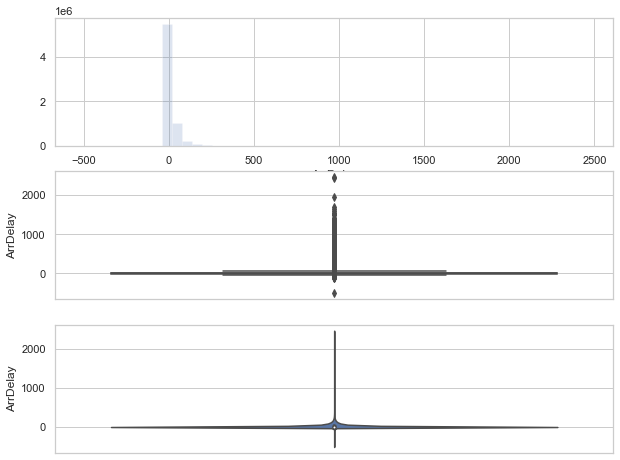

In [23]:
# univariate plots of ArrDelay arrival delay for the whole data points df_inv  (7,009,728 rows)
plt.figure(figsize=(10,8))

# histogram
plt.subplot(3,1,1)
sns.distplot(df_inv['ArrDelay'],kde=False,hist_kws={'histtype':'bar','alpha':0.1875})

# boxplot
plt.subplot(3,1,2)
sns.boxplot(data=df_inv , y='ArrDelay',color=sns.color_palette()[0])

# violinplot
plt.subplot(3,1,3)
sns.violinplot(data=df_inv , y='ArrDelay',color=sns.color_palette()[0]);


From the plots, we can find that there are a lot of high as well fewer low outliers that could make interpreting the plots harder, so we can limit the axis representing 'ArrDelay' to be i.e. from -250 minutes to 250 or 400 minutes. Also we can reduce the data points by counting the arrival delays that equals 15 minutes or more, because the arrival with a delay that is less than 15 minutes is counted on-time arrival too.

In [24]:
# finding arrival-delays outliers
delays = [2500,2000,1500,1000,500,400,350,250]

print(f"\nFrom {len(df_inv_15):,} flights of 15 minutes arrival delay or more:\n*****")
for delay in delays[::-1]:
    print(f"'{df_inv_15[df_inv_15.ArrDelay > delay].shape[0]:,}' flights",
          'exceeded "{}" min. arrival delay'.format(delay))
    

#     print('Flights that exceeded "{}" minutes arrival delay are'.format(delay),
#           f"'{df_inv_15[df_inv_15.ArrDelay > delay].shape[0]:,}' from",
#           f"{len(df_inv_15):,} flights of 15 minutes arrival delay or more.")


From 1,524,733 flights of 15 minutes arrival delay or more:
*****
'20,726' flights exceeded "250" min. arrival delay
'5,824' flights exceeded "350" min. arrival delay
'3,439' flights exceeded "400" min. arrival delay
'1,562' flights exceeded "500" min. arrival delay
'189' flights exceeded "1000" min. arrival delay
'9' flights exceeded "1500" min. arrival delay
'2' flights exceeded "2000" min. arrival delay
'0' flights exceeded "2500" min. arrival delay


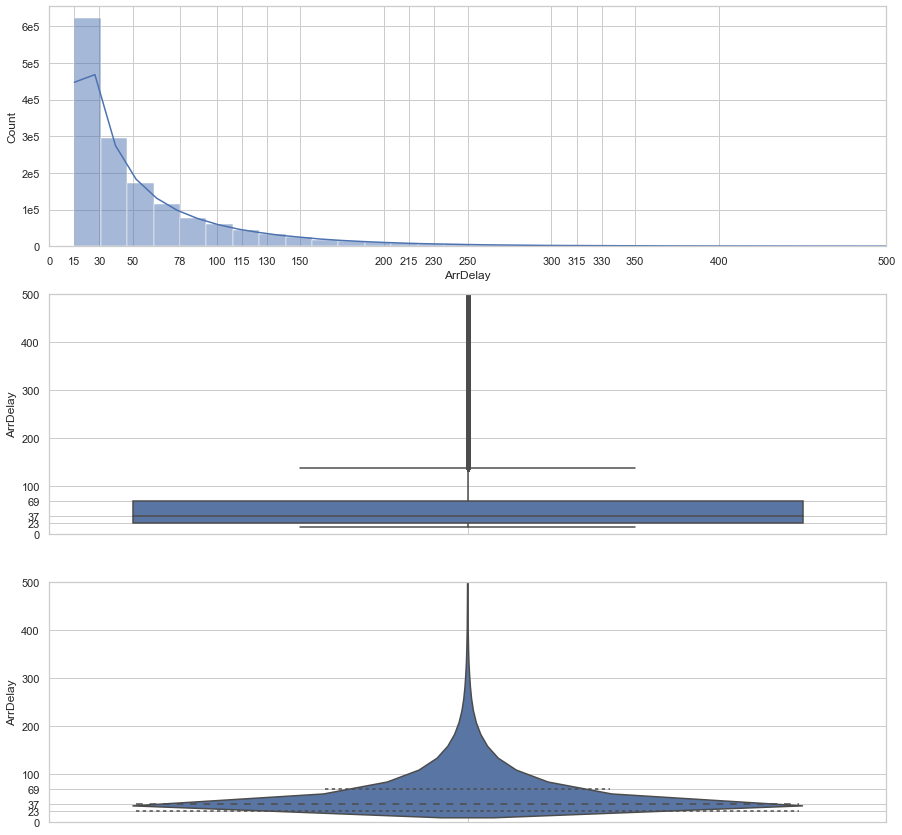

In [25]:
# univariate plots of ArrDelay arrival delay for the whole data points df_inv_15 (1,524,733 rows)
# with limiting visualization up to 500 minutes

plt.figure(figsize=(15,15))

# histogram with kde distribution line
plt.subplot(3,1,1)
ax = sns.histplot(df_inv_15['ArrDelay'],bins=155,kde=True)#,hist_kws={'histtype':'bar','alpha':0.1875})
plt.xticks([0, 15, 30,50,78,100,115,130,150,200,215,230,250,300,315,330,350,400,500])
plt.xlim([0,500])
plt.yticks([0,100000,200000,300000,400000,500000,600000],
           [0,'1e5','2e5','3e5','4e5','5e5','6e5'])
#ax.set_xticklabels([],minor=True)

# boxplot
plt.subplot(3,1,2)
sns.boxplot(data=df_inv_15 , y='ArrDelay',color=sns.color_palette()[0])
plt.yticks([0,23, 37,69,100,200,300,400,500])
plt.ylim([0,500])
plt.grid(True)

# violinplot
plt.subplot(3,1,3)
sns.violinplot(data=df_inv_15 , y='ArrDelay',color=sns.color_palette()[0],inner="quartile")
plt.yticks([0,23, 37,69,100,200,300,400,500])
plt.ylim([0,500])
plt.grid(True);


From the plots of reduced data points with 15 minutes or more arrival delay, we can see from the unimodal histogram with the kernel density estimation (kde) line, that most arrival delays are of 15 minutes to about 78 minutes. Also we can find the median for those data points is 37 minutes as from the boxplot. The violin plot clearly assures the huge distribution around the median till now.

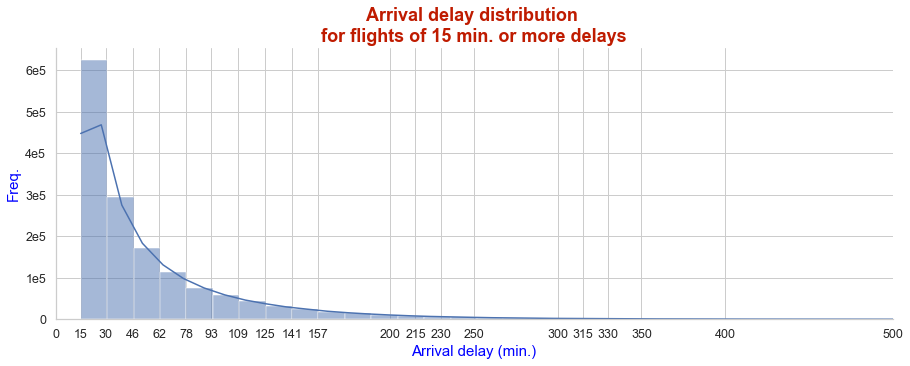

In [26]:
# polishing histogram

plt.figure(figsize=(15,5))

sns.histplot(df_inv_15['ArrDelay'],bins=155,kde=True,
             color=sns.color_palette()[0])#,hist_kws={'histtype':'bar','alpha':0.1875}),color='skyblue'
sns.despine()

plt.title('Arrival delay distribution \nfor flights of 15 min. or more delays',
               fontsize=18,color='#BF1B00',weight='bold')

plt.xlabel('Arrival delay (min.)',color='blue',fontsize=15)
plt.xlim([0,500])
plt.xticks([0, 15, 30,46,62,78,93,109,125,141,157,200,215,230,250,300,315,330,350,400,500],
           fontsize='12.5')


plt.ylabel('Freq.',color='blue',fontsize=15);
plt.yticks(np.arange(0,7,1)*10**5,
           [0]+[str(n)+'e5' for n in range(1,7,1)],
           #[0,'1e5','2e5','3e5','4e5','5e5','6e5'],
           fontsize='12.5');

The histogram is polished version from the previos subplot figure.

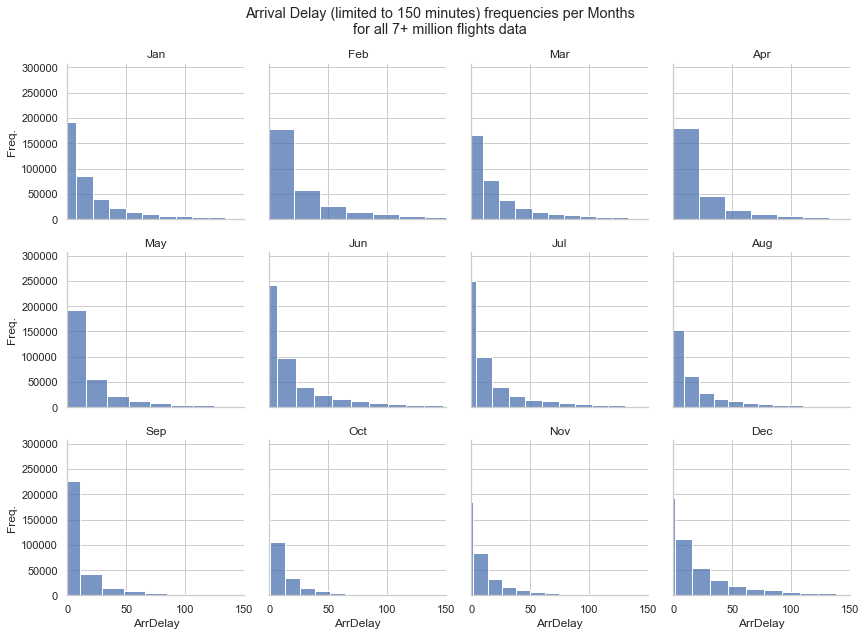

In [27]:
# ArrDelay histograms limited to 150 minutes per Months for all 7+ million original data
sns.set(style='whitegrid')
g = sns.FacetGrid(data=df_inv,col='Month'
                  ,col_wrap=4,
                  xlim=(0,150))
g.fig.suptitle('Arrival Delay (limited to 150 minutes) frequencies per Months\nfor all 7+ million flights data')
g.map(sns.histplot,'ArrDelay',bins=115,)
g.set_titles('{col_name}')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

We can see from the faceted histograms, that some months had much more lower arrival delays values than others. Also we may need to adjust the bins widths to be at least close to the same, to get a clearer vision helping in making more correct decisions. We can also limit our investigation points.

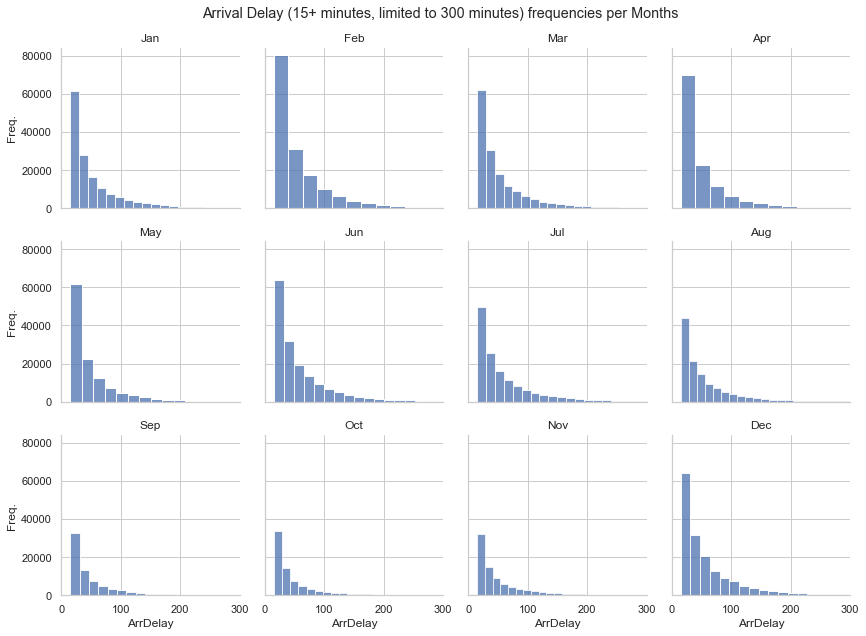

In [28]:
# ArrDelay histograms limited to 300 minutes per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Month'
                  ,col_wrap=4
                  ,xlim=(0,300))
g.fig.suptitle('Arrival Delay (15+ minutes, limited to 300 minutes) frequencies per Months')
g.map(sns.histplot,'ArrDelay',bins=100,)
g.set_titles('{col_name}')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

We may apply the same previous note on these faceted histograms too.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


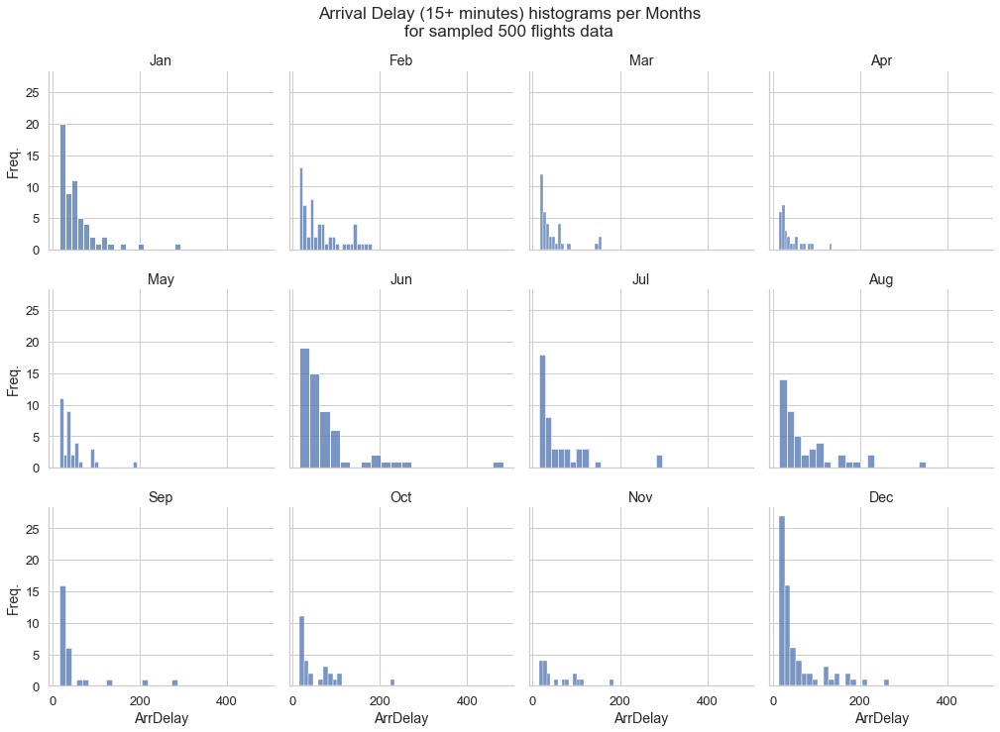

In [29]:
# ArrDelay histograms per Months for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15_samp,col='Month',
                  col_wrap=4,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) histograms per Months\nfor sampled 500 flights data')
g.map(sns.histplot,'ArrDelay',bins=20,)
g.set_titles('{col_name}')
g.set_ylabels('Freq.');

We may apply the same previous note on these faceted histograms too.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


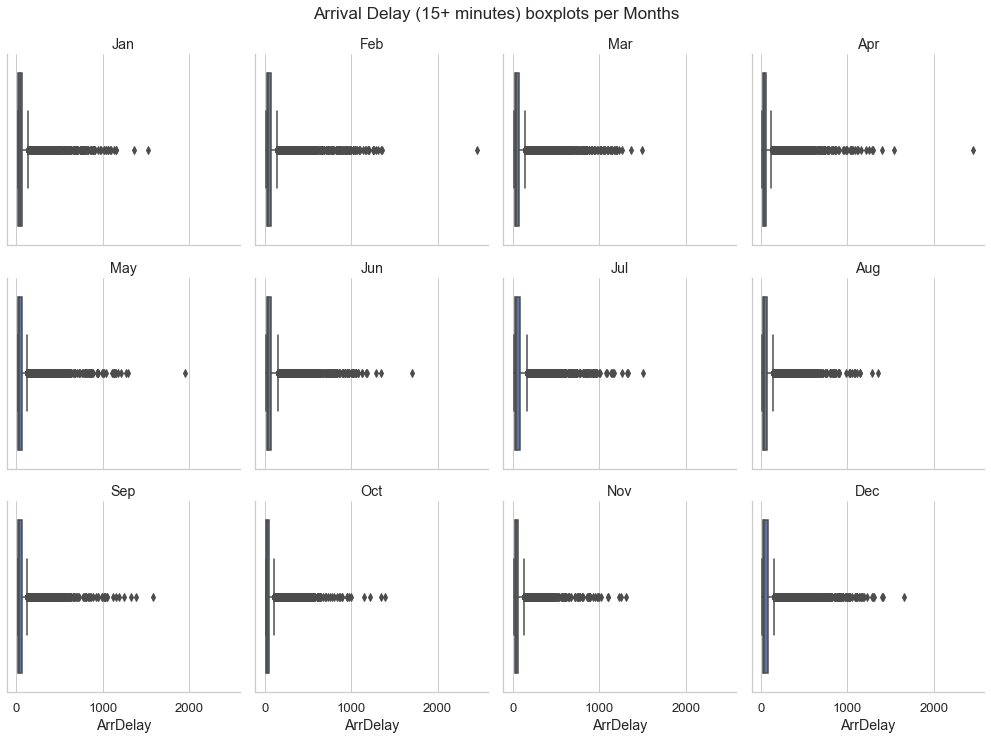

In [30]:
# ArrDelay boxplots per Months for flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Month',
                  col_wrap=4,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) boxplots per Months')
g.map(sns.boxplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

We can know little things from those narrow IQR boxes. However, we can know more about outliers from these faceted boxplots. It will be of more convenience to have a look on the sampled data boxplots.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


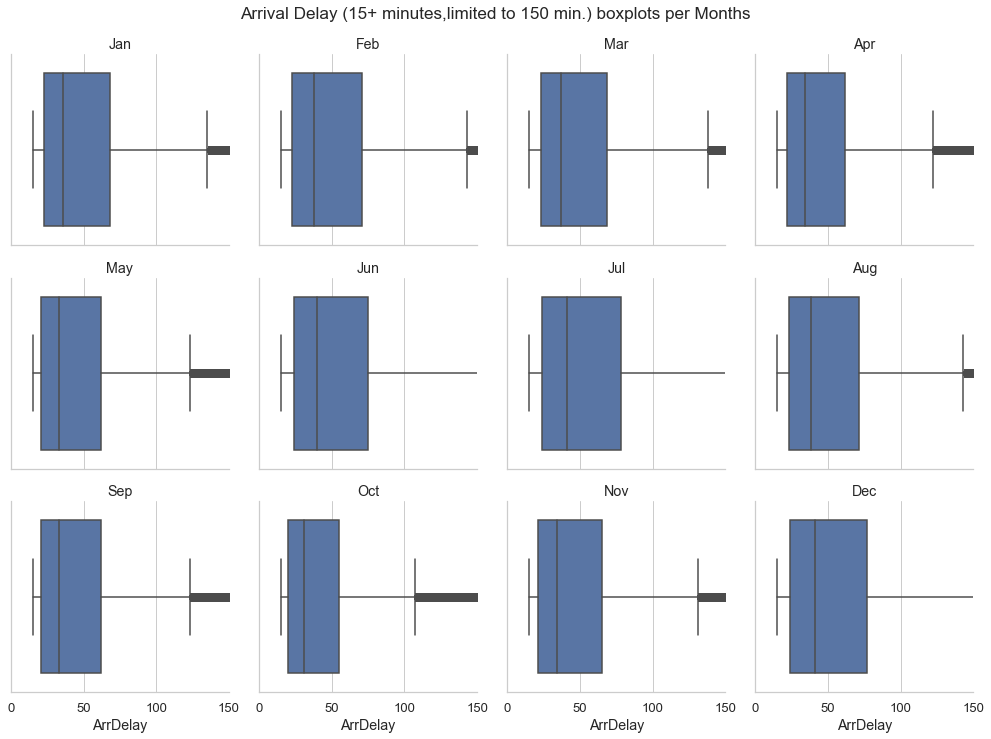

In [31]:
# ArrDelay limited to 150 min. boxplots per Months for flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Month',
                  col_wrap=4,
                  size=3.5,xlim=(0,150),
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes,limited to 150 min.) boxplots per Months')
g.map(sns.boxplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

After limiting ranges, the vision became clearer on the IQR boxes.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


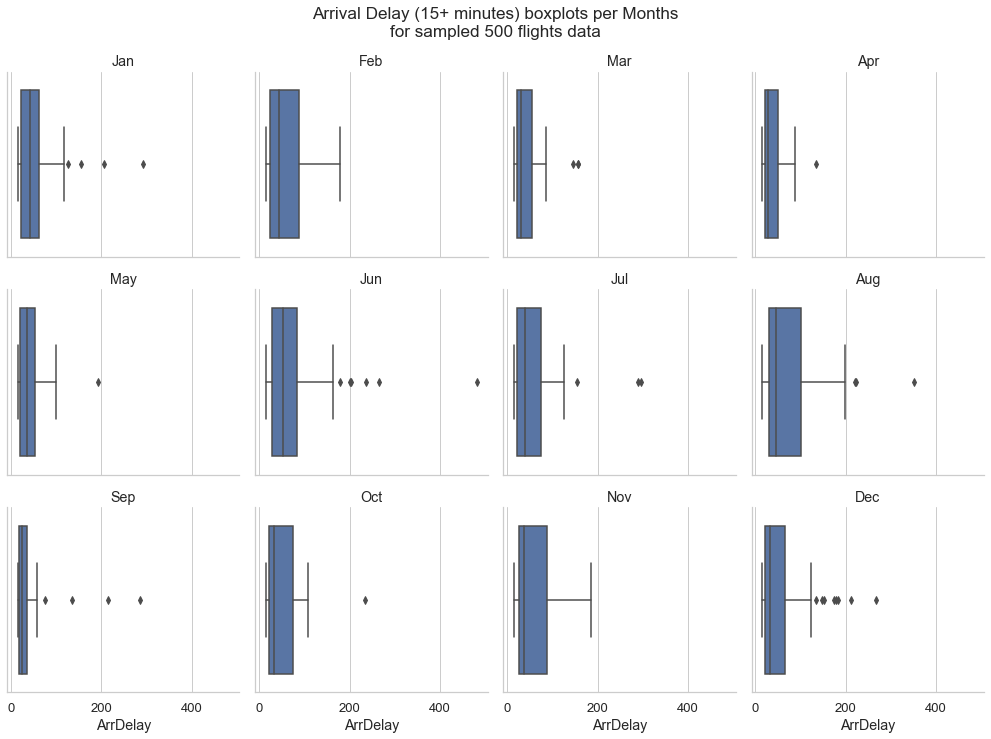

In [32]:
# ArrDelay boxplots per Months for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15_samp,col='Month',
                  col_wrap=4,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) boxplots per Months\nfor sampled 500 flights data')
g.map(sns.boxplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

The vision here is clearer on the sample IQR boxes.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


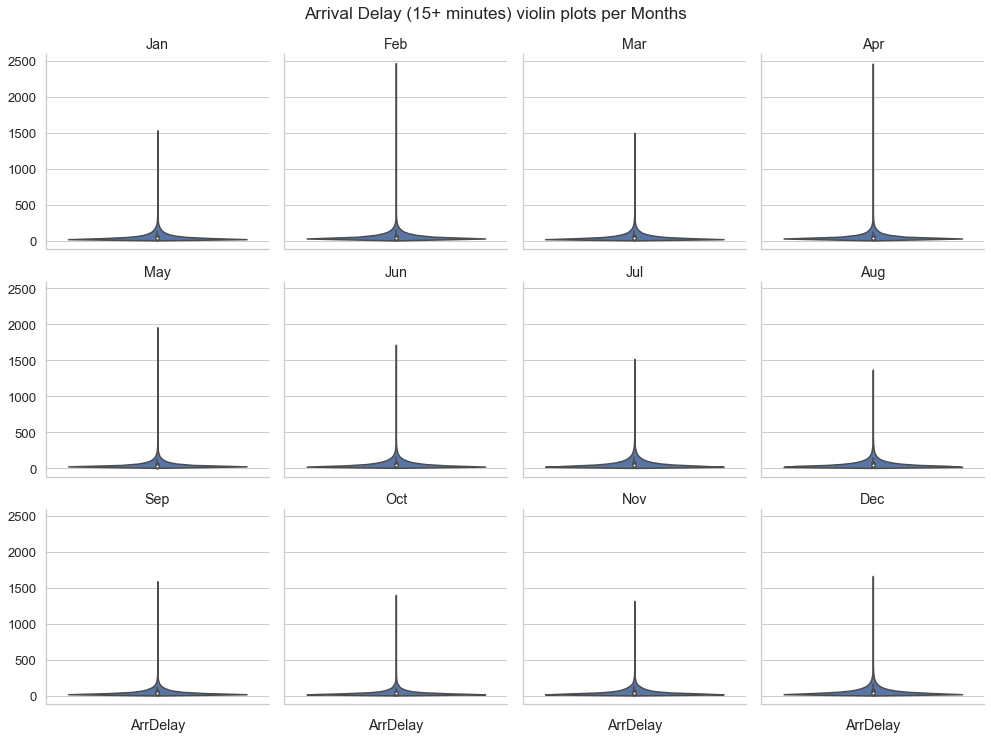

In [33]:
# ArrDelay violinplots per Months for flights with 15+ minutes arrival delay
#colors = (color for color in sns.color_palette()[0:4])
def my_violin(y,*args,**kwargs):
    #color=next(colors)
    sns.violinplot(y=y,)#color=color)#,orient='v')
    
sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Month',
                  col_wrap=4,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) violin plots per Months')
g.map(my_violin,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

We can know little from those small faceted violin plots. However, we can know more about range due to outliers from these faceted violinplots. It will be of more convenience to have a look on the sampled data violinplots.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


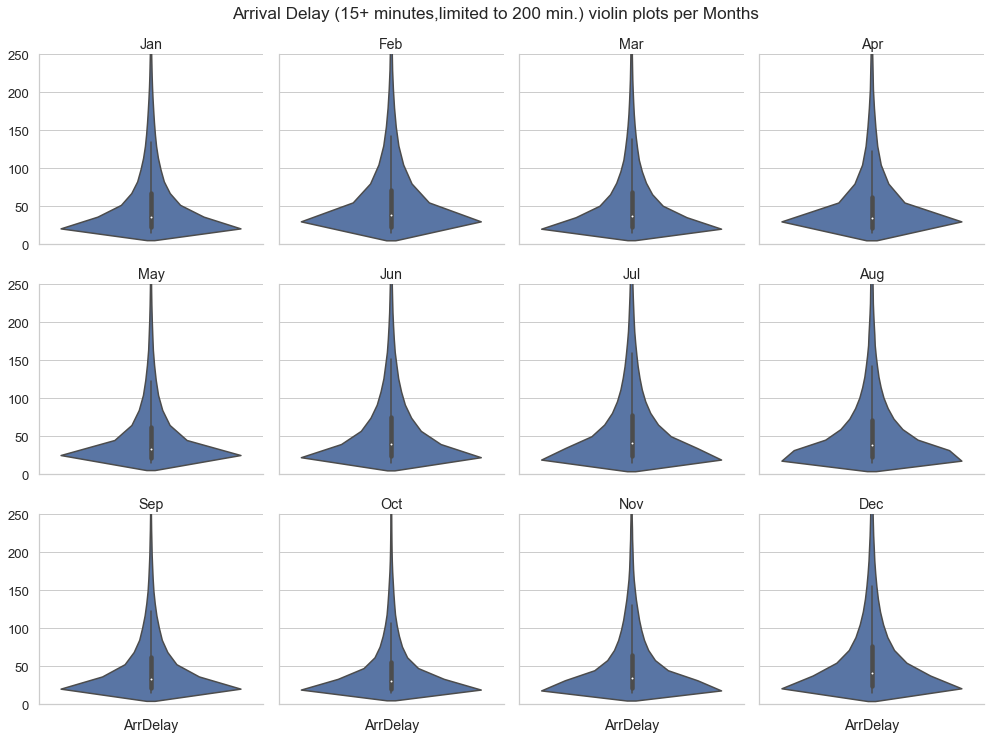

In [34]:
# ArrDelay violinplots limited to 200 min. per Months for flights with 15+ minutes arrival delay

#colors = (color for color in sns.color_palette()[0:4])
def my_violin(y,*args,**kwargs):
    #color=next(colors)
    sns.violinplot(y=y,)#inner="quartile")#color=color)#,orient='v')

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Month',
                  col_wrap=4,
                  size=3.5,ylim=(0,250),
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes,limited to 200 min.) violin plots per Months')
g.map(my_violin,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

After limiting ranges, the vision became clearer on the violins distributions.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


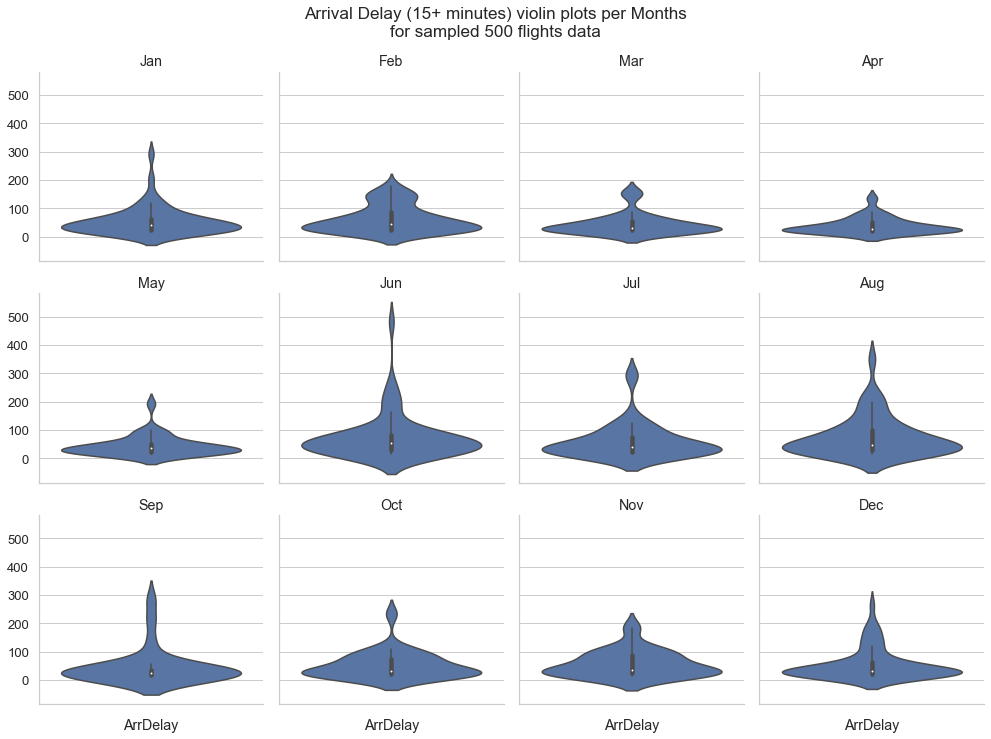

In [35]:
# ArrDelay violinplots per Months for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15_samp,col='Month',
                  col_wrap=4,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) violin plots per Months\nfor sampled 500 flights data')
g.map(my_violin,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

The vision here is clearer on the violins distributions of sample data.

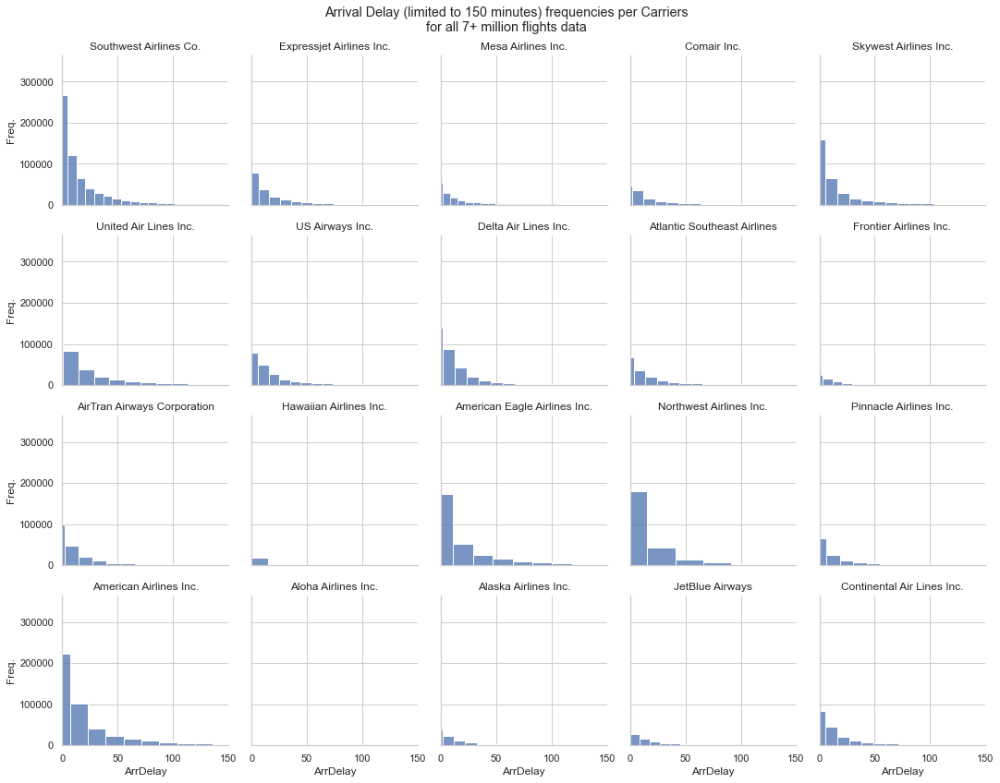

In [36]:
# ArrDelay histograms limited to 150 minutes per Carriers for all 7+ million original data
sns.set(style='whitegrid')
g = sns.FacetGrid(data=df_inv,col='Carrier'
                  ,col_wrap=5
                  ,xlim=(0,150))
g.fig.suptitle('Arrival Delay (limited to 150 minutes) frequencies per Carriers\nfor all 7+ million flights data')
g.map(sns.histplot,'ArrDelay',bins=100,)
g.set_titles('{col_name}')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

We can see from the faceted histograms, that some carriers had much more lower arrival delays values than others, for example 'Southwest Airlines Co.', indicating to more flights, or just more lower arrival delays values. Also we may need to adjust the bins widths to be close to the same, to get a clearer vision helping in making more correct decisions. We can also limit our investigation points more.

'Aloha Airlines Inc.' arrival delays was not represented clearly here. Leading to think if it hadn't any delays at all, or if it had very small counts of delays that can be cut out of comparing.

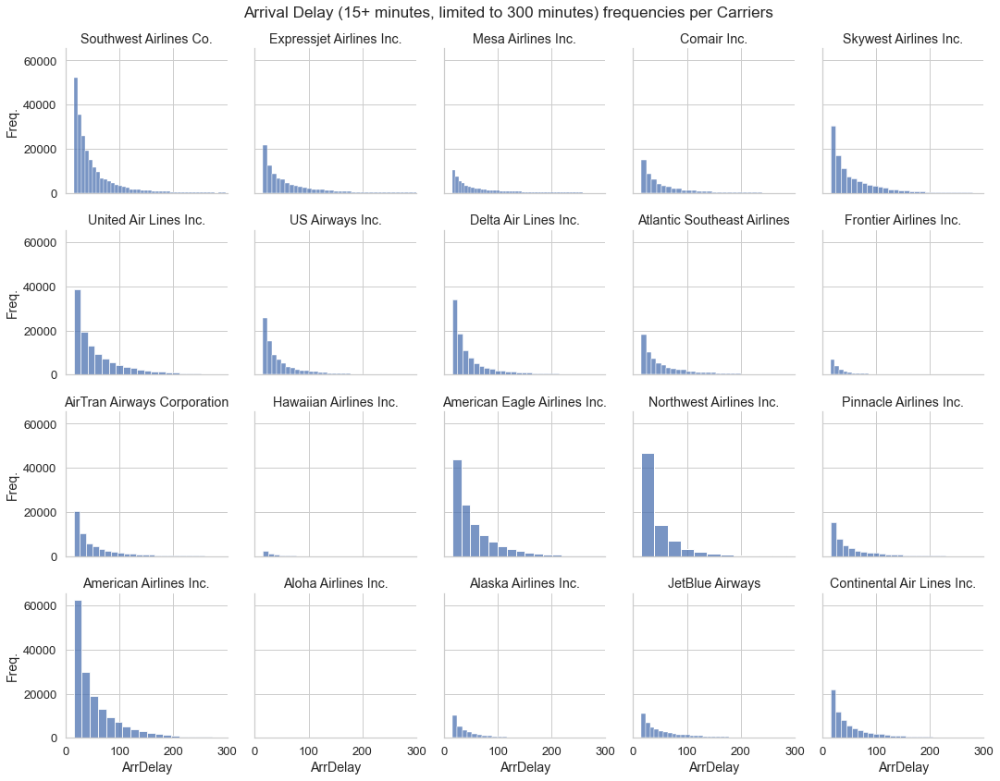

In [37]:
# ArrDelay histograms limited to 300 minutes per Carriers for flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Carrier',
                  col_wrap=5,
                  xlim=(0,300))
g.fig.suptitle('Arrival Delay (15+ minutes, limited to 300 minutes) frequencies per Carriers')
g.map(sns.histplot,'ArrDelay',bins=100,)
g.set_titles('{col_name}')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

We may apply the same previous note on these faceted histograms too. Also 'Aloha Airlines Inc.' was not represented here clearly too.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


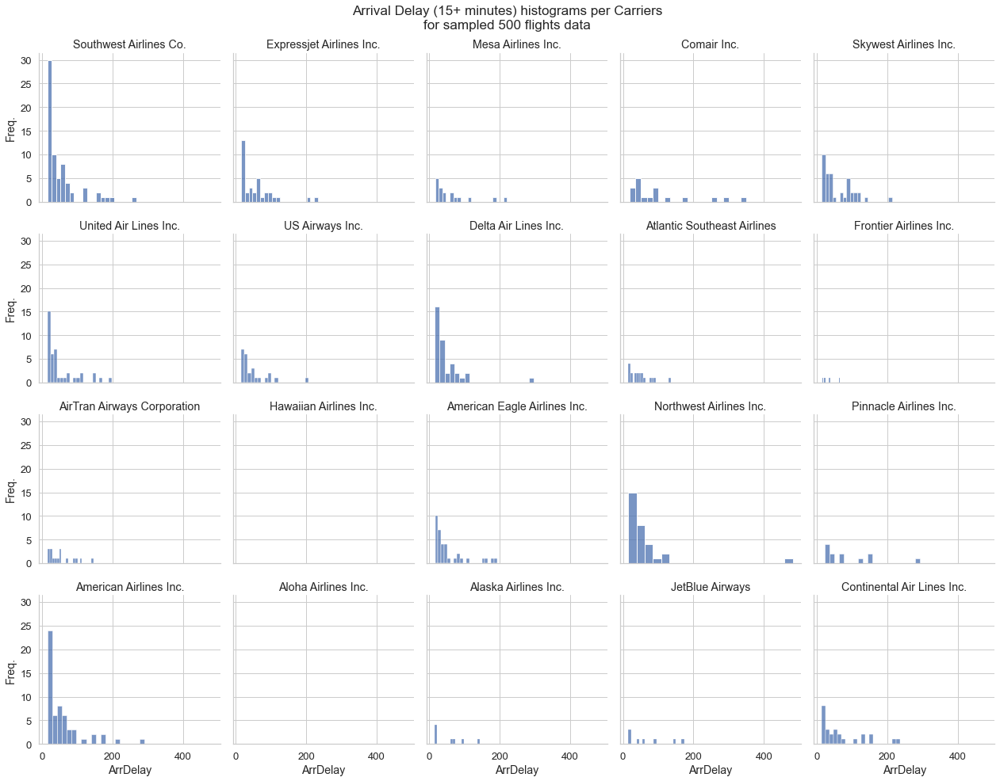

In [38]:
# ArrDelay histograms per Carriers for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15_samp,col='Carrier',col_order=df_inv_15.Carrier.unique(),
                  col_wrap=5,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) histograms per Carriers\nfor sampled 500 flights data')
g.map(sns.histplot,'ArrDelay',bins=20,)
g.set_titles('{col_name}')
g.set_ylabels('Freq.');

We may apply the same previous note on these faceted histograms too. Also 'Aloha Airlines Inc.' was not represented here too, this could lead to it wasn't selected unintendingly in the sample data, or to think if it had very small counts of delays that can be cut out of comparing, or both things.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


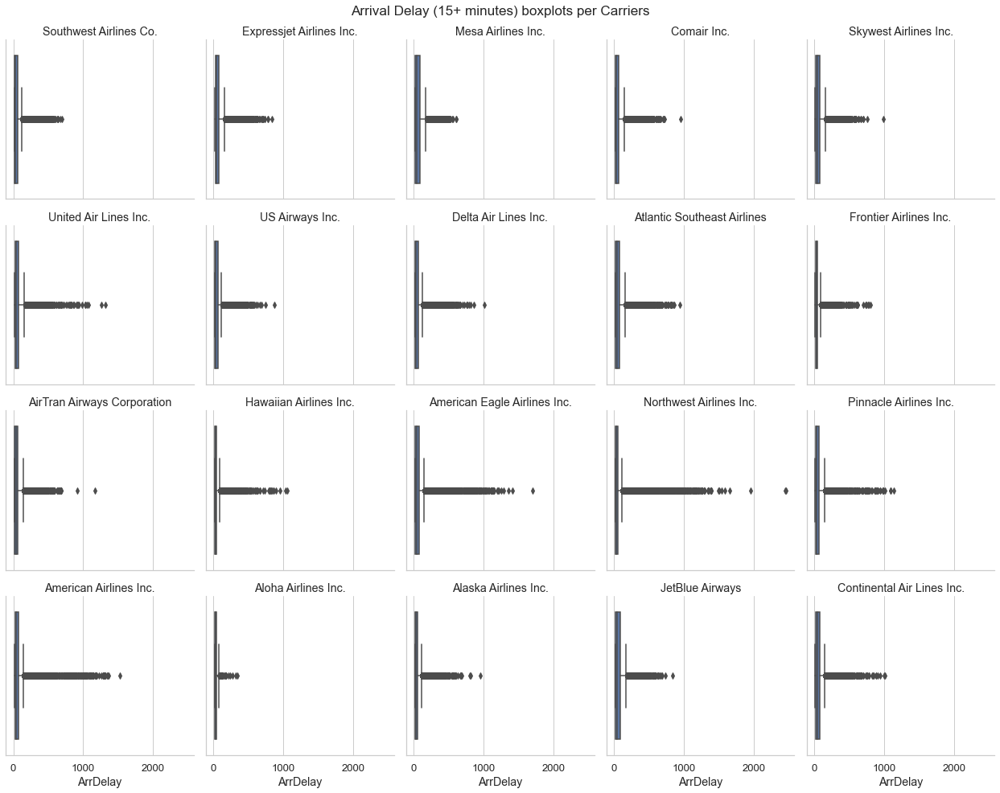

In [39]:
# ArrDelay boxplots per Carriers for flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Carrier',
                  col_wrap=5,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) boxplots per Carriers')
g.map(sns.boxplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

We can know little things from those narrow IQR boxes. However, we can know more about outliers ranges from these faceted boxplots. It will be of more convenience to have a look on the sampled data boxplots.

'Aloha Airlines Inc.' was represented here, even it was not represented in the sample. It had small counts of delays compared to other carriers delays.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


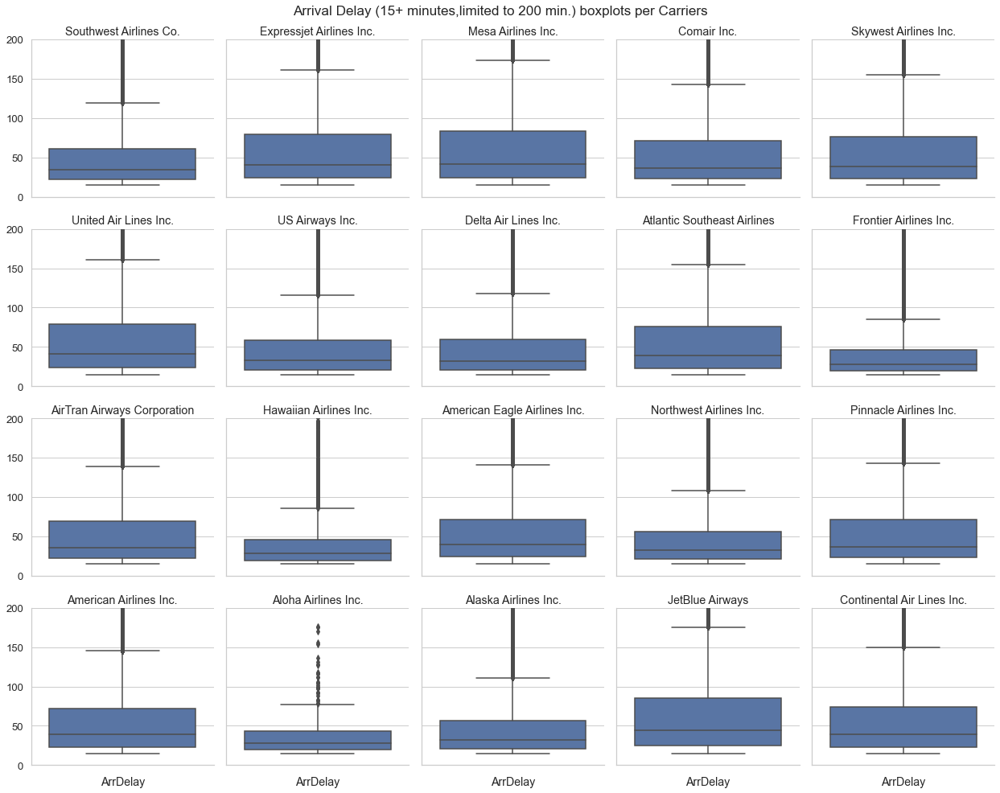

In [40]:
# ArrDelay (15+ minutes,limited to 200 min.) boxplots per Carriers for flights with 15+ minutes arrival delay

#colors = (color for color in sns.color_palette()[0:4])
def my_box(y,*args,**kwargs):
    #color=next(colors)
    sns.boxplot(y=y,)#color=color)#,orient='v')

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Carrier',
                  col_wrap=5,
                  size=3.5,ylim=(0,200),
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes,limited to 200 min.) boxplots per Carriers')
g.map(my_box,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

After limiting ranges, the vision became clearer on the IQR boxes.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


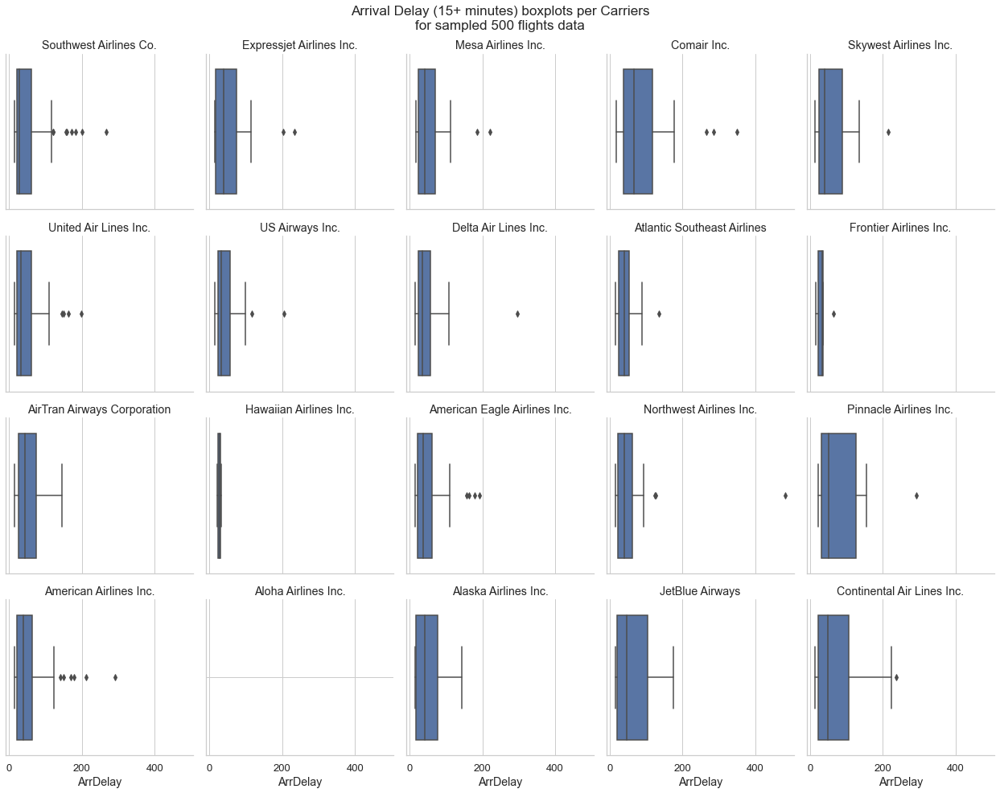

In [41]:
# ArrDelay boxplots per Carriers for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15_samp,col='Carrier',col_order=df_inv_15.Carrier.unique(),
                  col_wrap=5,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) boxplots per Carriers\nfor sampled 500 flights data')
g.map(sns.boxplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

The vision here is clearer on the IQR boxes. Also because of stated before, **it sounds that 'Aloha Airlines Inc.' was not represented in the sample data.**

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


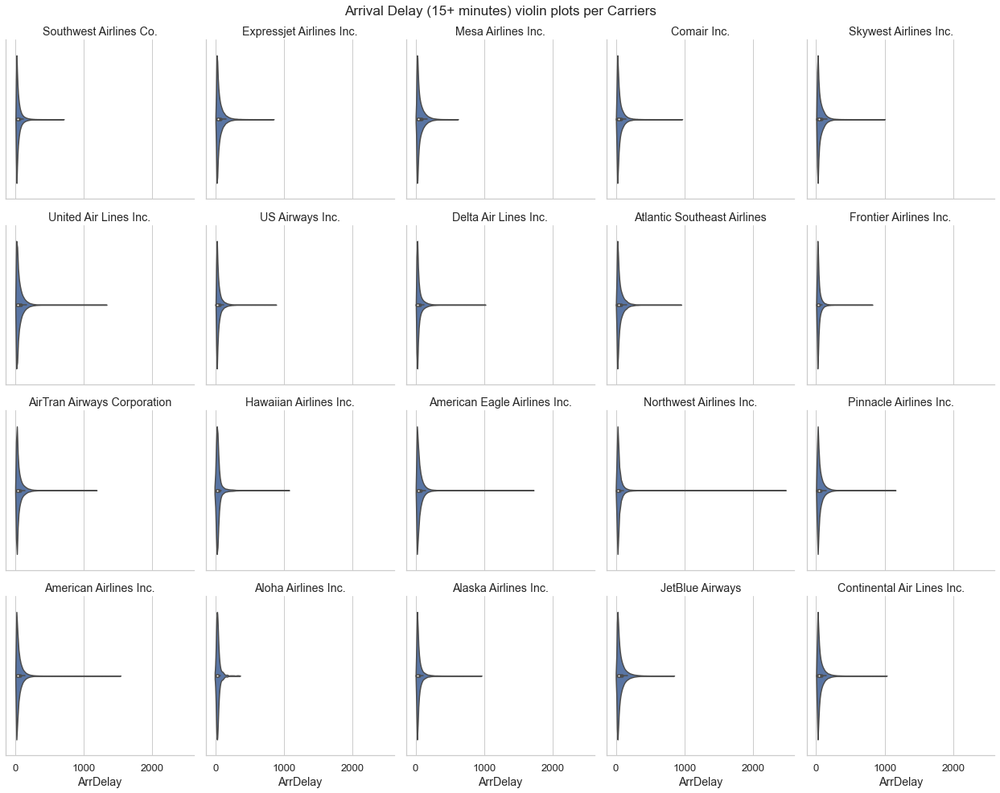

In [42]:
# ArrDelay violinplots per Carriers for flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Carrier',
                  col_wrap=5,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) violin plots per Carriers')
g.map(sns.violinplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

We can know little from those small faceted violin plots. However, we can know more about range due to outliers from these faceted violinplots. It will be of more convenience to have a look on the sampled data violinplots.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")


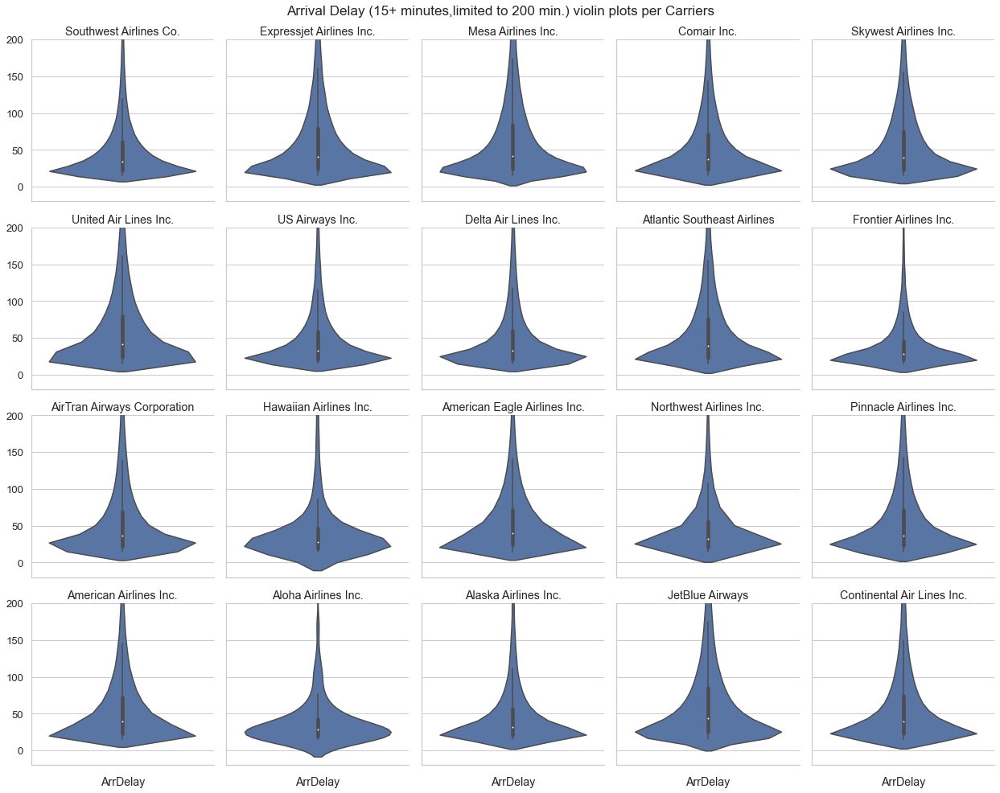

In [43]:
# ArrDelay (15+ minutes,limited to 200 min.) violinplots per Carriers for flights with 15+ minutes arrival delay

#colors = (color for color in sns.color_palette()[0:4])
def my_violin(y,*args,**kwargs):
    #color=next(colors)
    sns.violinplot(y=y,)#color=color)#,orient='v')

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15,col='Carrier',
                  col_wrap=5,
                  size=3.5,ylim=(-20,200),
                  gridspec_kws={'grid':True,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes,limited to 200 min.) violin plots per Carriers')
g.map(my_violin,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

After limiting ranges, the vision became clearer on the violins distributions.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:408: UserWarning: `gridspec_kws` ignored when using `col_wrap`
  warnings.warn("`gridspec_kws` ignored when using `col_wrap`")
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


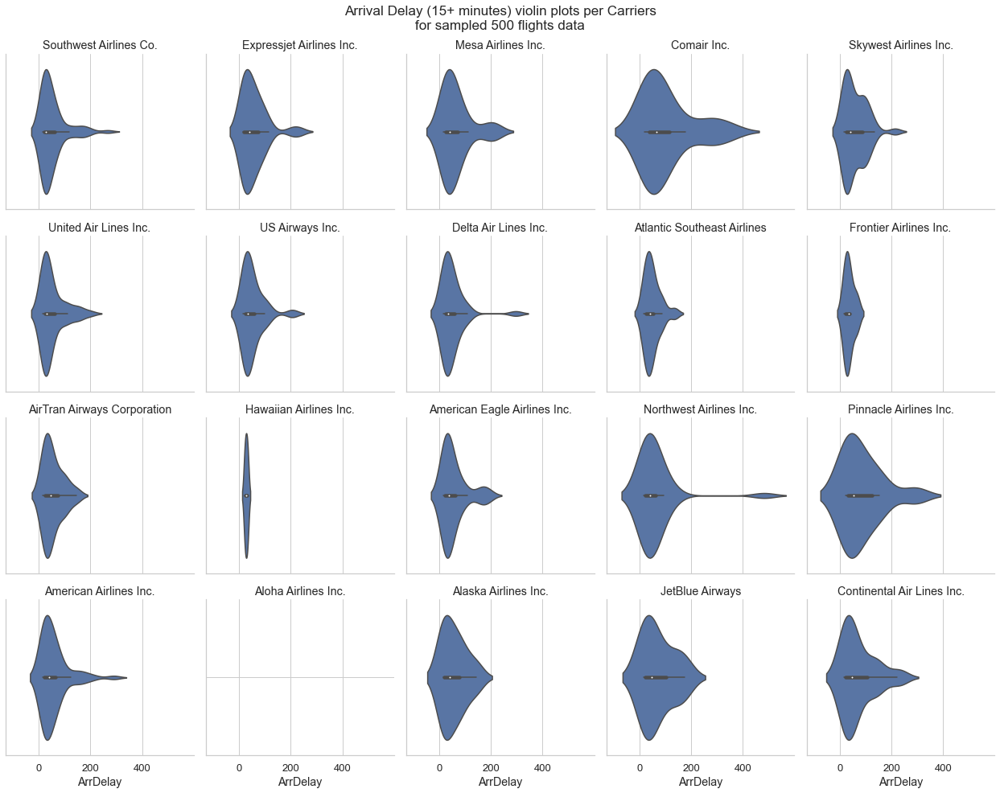

In [44]:
# ArrDelay violinplots per Carriers for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv_15_samp,col='Carrier',col_order=df_inv_15.Carrier.unique(),
                  col_wrap=5,
                  size=3.5,
                  gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
g.fig.suptitle('Arrival Delay (15+ minutes) violin plots per Carriers\nfor sampled 500 flights data')
g.map(sns.violinplot,'ArrDelay')#,bins=20,)
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

The vision here is clearer on the violins distributions.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\categorical.py:3747: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


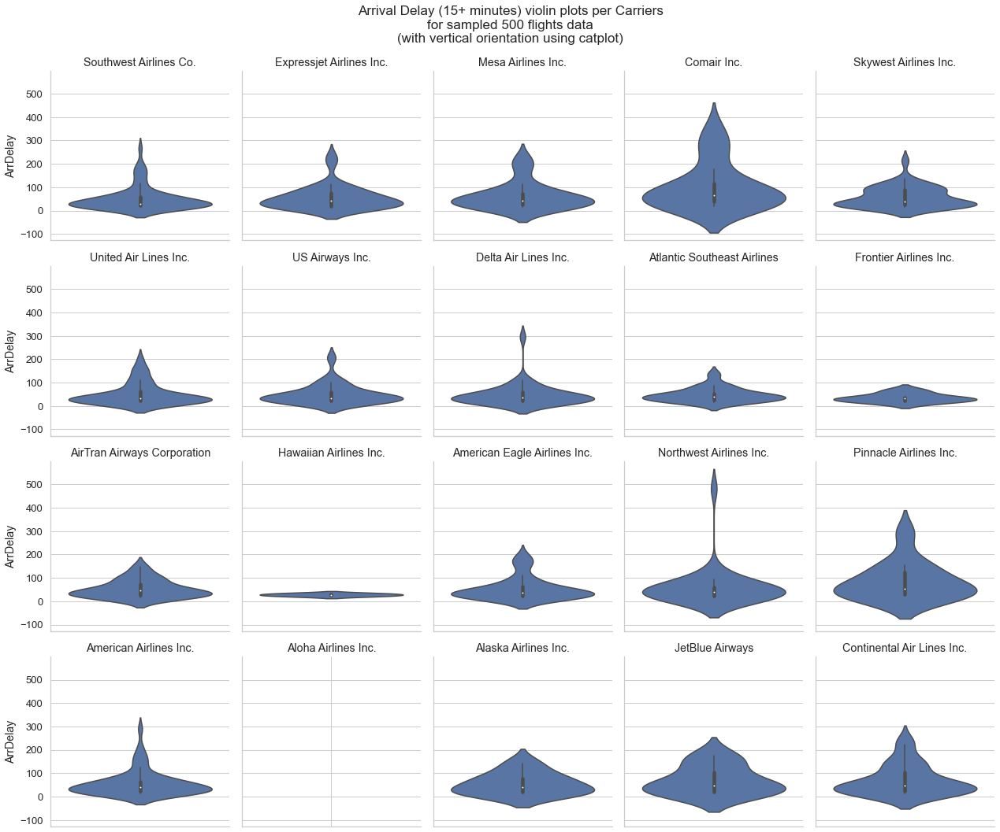

In [45]:
# ArrDelay violinplots per Carriers for sampled 500 data points of flights with 15+ minutes arrival delay 
# the same last plot but with vertical orientation (using catplot)

sns.set(font_scale=1.19,style='whitegrid')
g = sns.catplot(kind = 'violin',data=df_inv_15_samp,col='Carrier',col_order=df_inv_15.Carrier.unique(),col_wrap=5,
                y='ArrDelay',#orient='v',
                size=3.5,
                gridspec_kws={'grid':1,'style':'whitegrid',})
# g = sns.FacetGrid(data=df_inv_15_samp,col='Carrier',col_order=df_inv_15.Carrier.unique(),
#                   col_wrap=5,
#                   size=3.5,
#                   gridspec_kws={'grid':1,'style':'whitegrid',})#'style':'whitegrid',
#sns.set(style='white')
title = 'Arrival Delay (15+ minutes) violin plots per Carriers\nfor sampled 500 flights data'
g.fig.suptitle(title + '\n(with vertical orientation using catplot)',y=1.05)
#g.map(sns.violinplot,y=df_inv_15_samp['ArrDelay'],orient='v')   # vertical orientation
g.set_titles('{col_name}');
#g.set_ylabels('Freq.');

This is the same last faceted violin plots but with vertical orientation.

In [46]:
# finding zero delays or less of delay causes 

delay_causes_cols = ['CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']
causes = ['Carrier','Weather','National Air\nSystem','Security']

print(f"\nFrom {len(df_inv_15):,} flights of 15 minutes arrival delay or more:\n*****") 
for i,col in enumerate(delay_causes_cols):
    outliers = df_inv_15[df_inv_15[col] <=0].shape[0]
    print(f"'{outliers:,}' flights",
          'had "{}" min. or less of {} delay'.format(0,causes[i].replace('\n',' ').lower()))


From 1,524,733 flights of 15 minutes arrival delay or more:
*****
'854,113' flights had "0" min. or less of carrier delay
'1,424,748' flights had "0" min. or less of weather delay
'596,703' flights had "0" min. or less of national air system delay
'1,518,531' flights had "0" min. or less of security delay


In [47]:
# finding causes-delay times outliers
delays = [2500,2000,1500,1000,500,400,350,250]
zero_or_null = [0,np.NaN]

for i,col in enumerate(delay_causes_cols):
    total = df_inv_15[~df_inv_15[col].isin(zero_or_null)]
    print('\nFrom {:,} {}-delay times:\n*****'.format(len(total),causes[i].replace('\n',' ').lower()))
    
    for delay in delays[::-1]:
        outliers = df_inv_15[df_inv_15[col] > delay].shape[0]
        print(f"'{outliers:,}' flights",
              'exceeded "{}" min. {} delay'.format(delay,causes[i].replace('\n',' ').lower()))
        if outliers == 0:
            break


From 670,620 carrier-delay times:
*****
'6,445' flights exceeded "250" min. carrier delay
'2,642' flights exceeded "350" min. carrier delay
'1,837' flights exceeded "400" min. carrier delay
'1,026' flights exceeded "500" min. carrier delay
'116' flights exceeded "1000" min. carrier delay
'6' flights exceeded "1500" min. carrier delay
'1' flights exceeded "2000" min. carrier delay
'0' flights exceeded "2500" min. carrier delay

From 99,985 weather-delay times:
*****
'1,535' flights exceeded "250" min. weather delay
'500' flights exceeded "350" min. weather delay
'315' flights exceeded "400" min. weather delay
'156' flights exceeded "500" min. weather delay
'12' flights exceeded "1000" min. weather delay
'0' flights exceeded "1500" min. weather delay

From 928,030 national air system-delay times:
*****
'3,299' flights exceeded "250" min. national air system delay
'721' flights exceeded "350" min. national air system delay
'359' flights exceeded "400" min. national air system delay
'100'

In [48]:
# preparing for analyzing causes delays in df_inv_15  (filtering from 1,524,733 rows)
# looking if there were a lot of zeros or missing values affected the plots

print('Dataset Length: ',df_inv_15.shape[0],'\n')

for delay_col in delay_causes_cols:
    mask = df_inv_15[delay_col].isin(zero_or_null)
    # counting zeros and nulls in delay causes columns 
    print(df_inv_15[mask][delay_col].value_counts(dropna=False))

Dataset Length:  1524733 

0.0    854113
Name: CarrierDelay, dtype: int64
0.0    1424748
Name: WeatherDelay, dtype: int64
0.0    596703
Name: NASDelay, dtype: int64
0.0    1518531
Name: SecurityDelay, dtype: int64


In [49]:
df_inv_15

,Month,Carrier,ArrDelay,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,Jan,Southwest Airlines Co.,34.0,2.0,0.0,0.0,0.0
1,Jan,Southwest Airlines Co.,57.0,10.0,0.0,0.0,0.0
2,Jan,Southwest Airlines Co.,80.0,8.0,0.0,0.0,0.0
3,Jan,Southwest Airlines Co.,15.0,3.0,0.0,0.0,0.0
4,Jan,Southwest Airlines Co.,16.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
1524728,Dec,Delta Air Lines Inc.,19.0,0.0,0.0,19.0,0.0
1524729,Dec,Delta Air Lines Inc.,75.0,0.0,57.0,18.0,0.0
1524730,Dec,Delta Air Lines Inc.,99.0,1.0,0.0,19.0,0.0
1524731,Dec,Delta Air Lines Inc.,15.0,0.0,0.0,15.0,0.0


In [50]:
# preparing data to visualize univariate plots of delay causes frequencies


# preparing df_inv_15  (1,524,733  rows)
id_vars = list(set(df_inv_15.columns)-set(delay_causes_cols))

melt_15 = df_inv_15.melt(id_vars= id_vars,
                         value_vars=delay_causes_cols,
                         var_name='Cause', value_name='Minutes')

# removing zero and missed minutes of delay causes,
# all ArrDelay values already are 15 minutes or more, from previous preparing
zero_or_null = [0,np.NaN]
z_melt_mask = melt_15['Minutes'].isin(zero_or_null)  #--------- 'z_melt_mask' zero and missing mask for melt_15

melt_15 = melt_15[~z_melt_mask].copy()
melt_15.reset_index(drop=True,inplace=True)

# rearranging melt_15 columns
cols = ['Month','Carrier','ArrDelay','Cause','Minutes']
melt_15 = melt_15[cols].copy()

# replacing 'Cause' column values with the causes labels
melt_15['Cause'] = melt_15['Cause'].replace(delay_causes_cols,['Carrier','Weather','National Air System','Security'])

# converting 'Month' to category
melt_15['Month'] = melt_15['Month'].astype(months_cat)

#melt_15.to_csv('2008_melt_15.csv',index=False)
print(melt_15.shape)
melt_15

(1704837, 5)


,Month,Carrier,ArrDelay,Cause,Minutes
0,Jan,Southwest Airlines Co.,34.0,Carrier,2.0
1,Jan,Southwest Airlines Co.,57.0,Carrier,10.0
2,Jan,Southwest Airlines Co.,80.0,Carrier,8.0
3,Jan,Southwest Airlines Co.,15.0,Carrier,3.0
4,Jan,Southwest Airlines Co.,37.0,Carrier,12.0
...,...,...,...,...,...
1704832,Dec,Continental Air Lines Inc.,84.0,Security,6.0
1704833,Dec,Continental Air Lines Inc.,21.0,Security,21.0
1704834,Dec,Continental Air Lines Inc.,15.0,Security,15.0
1704835,Dec,Continental Air Lines Inc.,15.0,Security,11.0


In [51]:
# melting delay causes columns in flights sample data points 'df_inv_15_samp' ------------ melt_samp_15 (from 'df_inv_15_samp')
melt_samp_15 = df_inv_15_samp.melt(id_vars= id_vars,
                                   value_vars=delay_causes_cols,
                                   var_name='Cause', value_name='Minutes')
# removing zero and missed minutes
# all ArrDelay values already are 15 minutes or more
z_melt_samp_mask = melt_samp_15['Minutes'].isin(zero_or_null)  #----- 'z_melt_samp_mask' zero and missing mask for melt_samp_15 

# converting 'Month' to category
melt_15['Month'] = melt_15['Month'].astype(months_cat)
melt_samp_15 = melt_samp_15[~z_melt_samp_mask].copy()
melt_samp_15.reset_index(drop=True,inplace=True)

# replacing 'Cause' column values with the causes labels
melt_samp_15['Cause'] = melt_samp_15['Cause'].replace(delay_causes_cols,['Carrier','Weather','National Air System','Security'])

# rearranging melt_samp_15 columns
cols = ['Month','Carrier','ArrDelay','Cause','Minutes']
melt_samp_15 = melt_samp_15[cols].copy()
melt_samp_15

,Month,Carrier,ArrDelay,Cause,Minutes
0,Jan,American Airlines Inc.,50.0,Carrier,17.0
1,Sep,Expressjet Airlines Inc.,18.0,Carrier,9.0
2,Jan,United Air Lines Inc.,24.0,Carrier,7.0
3,Oct,Skywest Airlines Inc.,35.0,Carrier,35.0
4,Oct,Atlantic Southeast Airlines,26.0,Carrier,3.0
...,...,...,...,...,...
561,Mar,JetBlue Airways,145.0,National Air System,145.0
562,Jan,Skywest Airlines Inc.,15.0,Security,15.0
563,Jan,Southwest Airlines Co.,79.0,Security,13.0
564,Dec,US Airways Inc.,24.0,Security,13.0


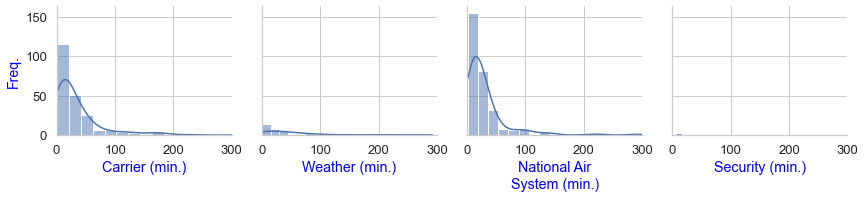

In [52]:
# Initial look at causes delays distributions of sample data

# univarite faceted distribution plots of delay causes for sample data points
# limiting to 300 minutes

# histplots
g = sns.FacetGrid(data = melt_samp_15 ,col = 'Cause',
                 xlim=(0,300))

g.map(sns.histplot,'Minutes',bins=20,kde=True)
#g.set_titles('{col_name}')
g.set_titles('')
g.set_ylabels('Freq.',color='blue')

# getting individual delays names for labeling x axis
# xaxis_labels = melt_samp_15['Cause'].unique()
#g.xaxis.set_ticks_position('top');
#g.axes().spines['bottom'].set_position('top')
for i in range(4):
    g.axes[0,i].set_xlabel(causes[i]+' (min.)',color='blue')
    g.axes[0,i].grid(True);

The faceted histograms show distributions of delay-causes delays (up to 300 minutes) for the 500 data points sample, or 'df_inv_15_samp'. At a glance, they had higher frequencies of lower-delays values for "Carrier" and "NAS" than other delay causes.
They should be limited to 150, 200 or even 100 minutes for a clearer vision. Also we should check if there were zeros or missing values affected the plots.

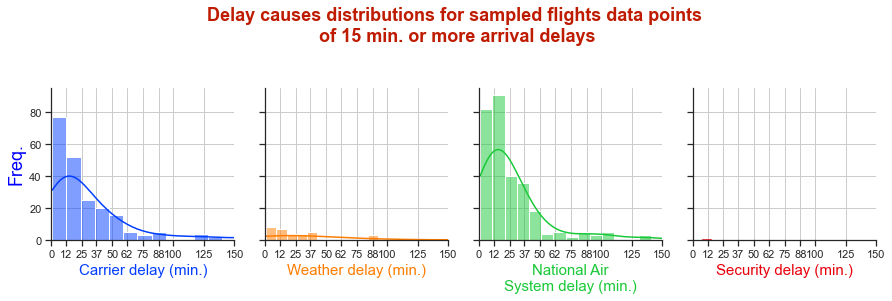

In [53]:
# plotting faceted univariate plots of the previously melted 'delay-causes columns' for sample data (500 rows)
# with limiting up to 150 minutes for delay cause in the analysed sample

# histplots

sns.set_theme(style='ticks')

g = sns.FacetGrid(data = melt_samp_15 ,
                  col = 'Cause',hue='Cause',palette='bright',
                  xlim=(0,150),
                  height=4,aspect=.77)
sns.set(font_scale=1.19)             
g.fig.suptitle('Delay causes distributions for sampled flights data points \nof 15 min. or more arrival delays',
               fontsize=18,color='#BF1B00',weight='bold')

g.map(sns.histplot,'Minutes',bins=35,kde=True,)
#g.set_titles('{col_name}')

g.set_titles('')

xticks = [0,12,25,37,50,62,75,88,100,125,150]
g.set(xticks=xticks)
#g.fig.xticklabels(xticks,fontsize=12.5)
#g.axes[0,i].set_xticklabels(xticks,color='blue',fontsize=12.5)

#g.xaxis.set_ticks_position('top');
#g.axes().spines['bottom'].set_position('top')

g.set_ylabels('Freq.',color='blue',fontsize=18)

for i in range(4):
    g.axes[0,i].set_xlabel(causes[i]+' delay (min.)',fontsize=15,color=sns.color_palette('bright')[i])
    g.axes[0,i].grid(True);

After limiting to 150 minutes, the faceted histograms of data sample clearly show the higher frequencies, respectively, for "NAS" and "Carrier" lower-delays values distributions, than other delay-causes delays, within the data points sample or 'df_inv_15_samp'.

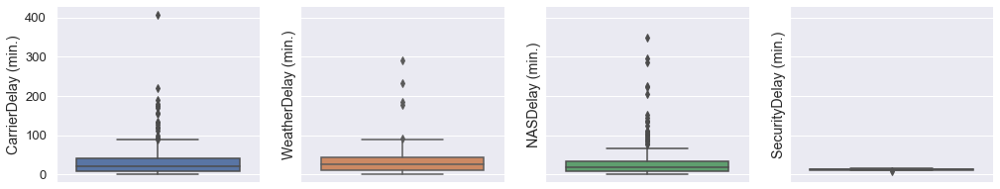

In [54]:
# plotting faceted univariate boxplots of the previously melted 'delay-causes columns' for sample data (500 rows)

# creating my_box function for coloring different causes-delays boxplots, and adjusting vertical orientation
colors = (color for color in sns.color_palette()[0:4])
def my_box(y,color=None,*args,**kwargs):
    color=next(colors)
    sns.boxplot(y=y,color=color,*args,**kwargs)#,orient='v')

# plotting
g = sns.FacetGrid(data = melt_samp_15 ,
                  col = 'Cause',
                  #ylim=(-15,100),
                  height=3.5,aspect=1)
#g.map(sns.boxplot,'Minutes')
g.map(my_box,'Minutes')

sns.set(font_scale=1.19,style='whitegrid')
sns.despine(bottom=True)
#g.set_titles('{col_name}')
g.set_titles('')
# yticks = [-15,0,10,20,35,50,70,100]
# g.set(yticks=yticks)

#g.xaxis.set_ticks_position('top');
#g.axes().spines['bottom'].set_position('top')
for i in range(4):
    g.axes[0,i].set_ylabel(delay_causes_cols[i]+' (min.)')
    #g.axes[0,i].grid(True);

g.set_xlabels('');
g.fig.subplots_adjust(wspace=.2);                       # adjusing faceted plots width spacing
#.set_ylabels('Est. Distributions');

The boxplots for the sample data show more outliers for 'Carrier' and 'NAS' then 'Weather' delays. However, 'Security'-delays doesn't seem to have much points in the sample comparing to other delays points.

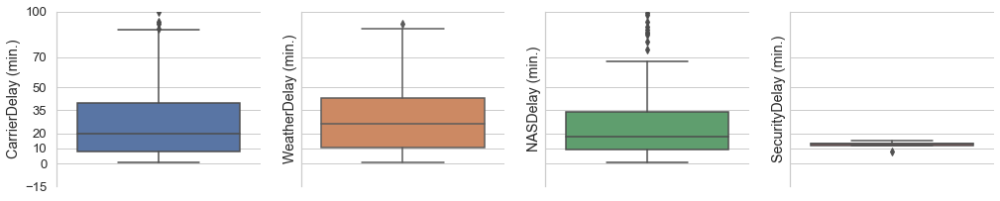

In [55]:
# plotting faceted univariate boxplots of the previously melted 'delay-causes columns' for sample data (500 rows)
# with limiting up to 100 minutes for delay cause in the analysed sample

# creating my_box function for coloring different causes-delays boxplots, and adjusting vertical orientation
colors = (color for color in sns.color_palette()[0:4])
def my_box(y,color=None,*args,**kwargs):
    color=next(colors)
    sns.boxplot(y=y,color=color,*args,**kwargs)#,orient='v')

# plotting
g = sns.FacetGrid(data = melt_samp_15 ,
                  col = 'Cause',
                  ylim=(-15,100),
                  height=3.5,aspect=1)
#g.map(sns.boxplot,'Minutes')
g.map(my_box,'Minutes')

sns.set(font_scale=1.19,style='whitegrid')
sns.despine(bottom=True)
#g.set_titles('{col_name}')
g.set_titles('')
yticks = [-15,0,10,20,35,50,70,100]
g.set(yticks=yticks)

#g.xaxis.set_ticks_position('top');
#g.axes().spines['bottom'].set_position('top')
for i in range(4):
    g.axes[0,i].set_ylabel(delay_causes_cols[i]+' (min.)')
    #g.axes[0,i].grid(True);

g.set_xlabels('');
g.fig.subplots_adjust(wspace=.2);                       # adjusing faceted plots width spacing
#.set_ylabels('Est. Distributions');

Those limited-ranges boxplots of the data sample show that delays due to 'Weather' had a wider IQR range from 10 min. to about 45 min., also with a higher median value than other delay causes, even 'Carrier' and 'NAS'. 'Carrier' came second then 'NAS' in related to IQR. At last 'Security' cause came with a small IQR. 

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


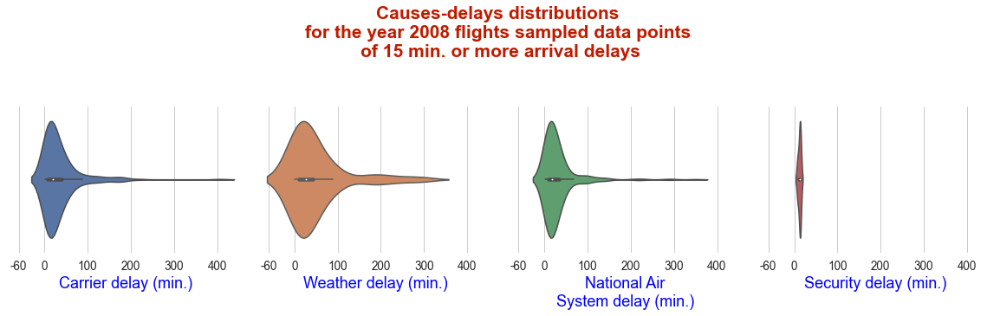

In [56]:
# faceted univariate violinplots of the previously melted 'delay-causes columns' for sample data (500 rows)

# creating my_violin function for coloring different causes-delays violinplots, and adjusting vertical orientation
colors = (color for color in sns.color_palette()[0:4])
def my_violin(y,color=None,*args,**kwargs):
    color=next(colors)
    sns.violinplot(y=y,color=color)#,orient='v')

# plotting
g = sns.FacetGrid(data = melt_samp_15,
                  col = 'Cause',hue='Cause',#row='Month',
                  height=4.5,aspect=.9)

title = 'Causes-delays distributions \nfor the year 2008 flights sampled data points \nof 15 min. or more arrival delays'
g.fig.suptitle(title,
               fontsize=21,
               color='#BF1B00',
               weight='bold',y=1.04)

sns.despine(left=True,bottom=True)
sns.set(style='whitegrid')

g.map(sns.violinplot,'Minutes')#,orient='v')

# g.set_titles('{col_name}')

g.set_titles('')
xticks = [-60,0,100,200,300,400]
g.set(xticks=xticks)
g.set_xticklabels(xticks,fontsize=13.5)

g.set_ylabels('');

for i in range(4):
    g.axes[0,i].set_xlabel(causes[i]+' delay (min.)',fontsize=18,color='blue')
    #g.axes[0,i].grid(True);
#g.set_axis_labels(x_var='causes', y_var='None')
#g.set_ylabels('Est. Distributions');
    
#g.xaxis.set_ticks_position('top')
#g.axes().spines['bottom'].set_position('top')

#g.set_grid(True,axis='y');

The violinplots of the data points sample show that delays due to 'Weather' had a wider distribution from about 10 min to 350 min. 'Carrier' came second here then 'NAS' in related to delays distribution. At last 'Security' cause came with a small delays distribution.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


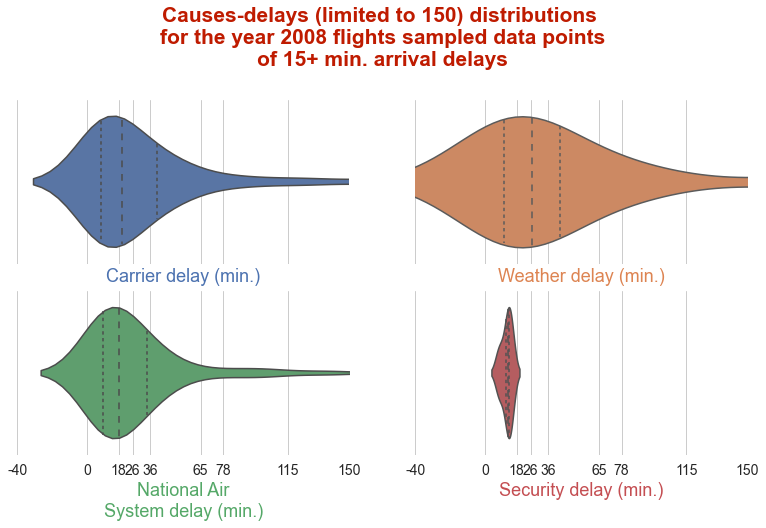

In [57]:
# faceted univariate violinplots of the previously melted 'delay-causes columns' for sample data (500 rows)

# creating my_violin function for coloring different causes-delays violinplots, and adjusting vertical orientation
colors = (color for color in sns.color_palette()[0:4])
def my_violin(y,color=None,*args,**kwargs):
    color=next(colors)
    sns.violinplot(y=y,color=color)#,orient='v')

# plotting
g = sns.FacetGrid(data = melt_samp_15,
                  col = 'Cause',col_wrap=2,
                  hue='Cause',#row='Month',
                  height=3.5,aspect=1.5)

title = 'Causes-delays (limited to 150) distributions \nfor the year 2008 flights sampled data points'
g.fig.suptitle(title + '\nof 15+ min. arrival delays',
               fontsize=21,
               color='#BF1B00',
               weight='bold')#,y=1.04)

sns.despine(left=True,bottom=True)
sns.set(style='whitegrid')#,font_scale=1.19,

g.map(sns.violinplot,'Minutes',inner='quartile')#,orient='v')

# g.set_titles('{col_name}')

g.set_titles('')
xticks = [-40,0,18,26,36,65,78,115,150]#,200,250]
g.set(xticks=xticks,xlim=(-40,150))
g.set_xticklabels(xticks,fontsize=14)

#g.set_xlabels('');

g.fig.subplots_adjust(wspace=.2)

xlabel = (label for label in causes)
colors = (color for color in sns.color_palette()[0:4])
for i in range(4):
    g.axes[i].set_xlabel(next(xlabel)+' delay (min.)',fontsize=18,color=next(colors));
    #g.axes[1,i].set_xlabel(causes[i]+' delay (min.)',fontsize=18,color=next(colors))
    #g.axes[0,i].grid(True);
#g.set_axis_labels(x_var='causes', y_var='None')
#g.set_ylabels('Est. Distributions');
    
#g.xaxis.set_ticks_position('top')
#g.axes().spines['bottom'].set_position('top')

#g.set_grid(True,axis='y');

Those limited-ranges violinplots of the data sample show that delays due to 'Weather' had a wider distribution of the values greater than the highest delays median, 26 min.

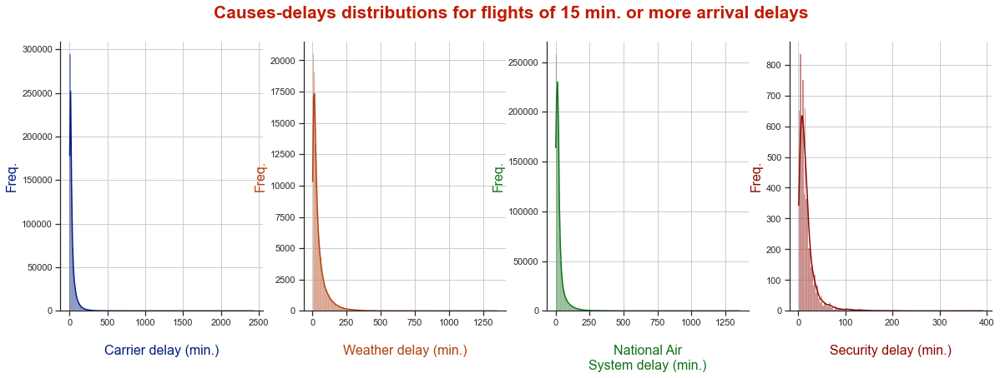

In [58]:
# plotting delay causes distributions in df_inv_15 without zero or missing values (filtering from 1,524,733 rows)
# limiting max minutes to 3000 to avoid  a number of outliers

# histograms
plt.figure(figsize=(20,5.95))

sns.set(style='ticks')
plt.suptitle('Causes-delays distributions for flights of 15 min. or more arrival delays',
               fontsize=21,color='#BF1B00',weight='bold')

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(1,4,i+1)
    sns.histplot(cause_col,bins=155,kde=True,color=sns.color_palette('dark')[i])
    
    sns.despine()
    #plt.xlim((0,3800))
    #xtick = [0,300,700,1300,1800,2400,3000,3800]
    #plt.xticks(xtick,xtick,fontsize=13.5)
    
    #plt.ylim((0,850))
    #ytick = [0,450,850]
    #plt.yticks(ytick,ytick,fontsize=13.5)

    #plt.yticks(np.arange(0,1100,250),fontsize=12.5)
    
    plt.xlabel('\n'+causes[i]+' delay (min.)',color=sns.color_palette('dark')[i],fontsize=16)
    plt.ylabel('Freq.',color=sns.color_palette('dark')[i],fontsize=16)#,color='blue'
    plt.grid(True)

plt.subplots_adjust(wspace=.2) #################################################

This faceted histograms plot show distributions of arrival delay causes delays for the 1,524,733 flights data points with 15 min. arrival delay or more, 'df_inv_15'.
At a glance, the plot show more higher frequencies for "Carrier" and "NAS" lower delays values than other delay-causes delays. However, 'Carrier' delays had the highest range distribution or spread, up to about 2500 min., may leading to a number of outliers. At last place 'Security' delays had the lowest frequencies and distribution among all other delay causes.
We can limit plotting minutes to 500 minutes for more insights. Also we should check if there were zeros or missing values affected the plots.

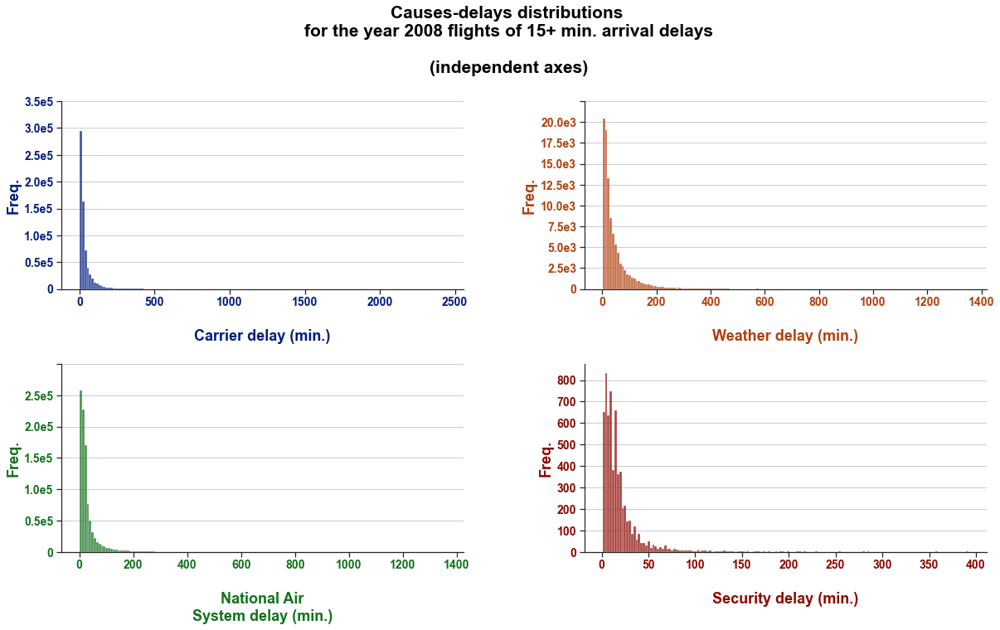

In [59]:
# plotting delay causes distributions in df_inv_15 without zero or missing values (filtering from 1,524,733 rows)
# limiting max minutes to 3000 to avoid  a number of outliers

# histograms
plt.figure(figsize=(20,10))

sns.set(style='ticks')

title='Causes-delays distributions \nfor the year 2008 flights of 15+ min. arrival delays'
plt.suptitle(title+'\n\n(independent axes)',y=1.04,
             fontsize=21,color='black',# '#BF1B00',
             weight='bold')

colors = (color for color in sns.color_palette('dark'))    

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(2,2,i+1)
    
    color = next(colors)
    ax = sns.histplot(cause_col,bins=155,kde=False,color = color)
    
    sns.despine()
    
    plt.xlabel('\n'+causes[i]+' delay (min.)',color=color,fontsize=18,weight='bold')
    plt.ylabel('Freq.',color=color,fontsize=18,weight='bold')
    
    #plt.xlim((0,2500))
    #xtick = [0,300,700,1300,1800,2400,3000,3800]
    #plt.xticks(xtick,xtick,fontsize=13.5)
    plt.xticks(fontsize=14,weight='bold',color=color)
    
    #plt.ylim((0,300000))
    #ytick = [0,450,850]
    #plt.yticks(ytick,ytick,fontsize=13.5)
    
    plt.yticks(fontsize=14,weight='bold',color=color)
    
    # adjusting yticklabels
    if i == 0:
        yticks = (ax.get_yticks()).astype('int')
        yticklabels = [0] + [str(n/100000)+'e5' for n in yticks[1:]]
        plt.yticks(ticks=yticks,
                   labels=yticklabels,
                   fontsize=14,weight='bold',color=color)
    elif i == 1:
        yticks = (ax.get_yticks()).astype('int')
        yticklabels = [0] + [str(n/1000)+'e3' for n in yticks[1:9]] +['']
        plt.yticks(ticks=yticks,
                   labels=yticklabels,
                   fontsize=14,weight='bold',color=color)
    elif i == 2:
        yticks = (ax.get_yticks()).astype('int')
        yticklabels = [0] + [str(n/100000)+'e5' for n in yticks[1:6]] +['']
        plt.yticks(ticks=yticks,
                   labels=yticklabels,
                   fontsize=14,weight='bold',color=color)
        
    plt.grid(True,axis='y')

plt.subplots_adjust(hspace=.4,wspace=.3)

A more polished version from the above histograms.

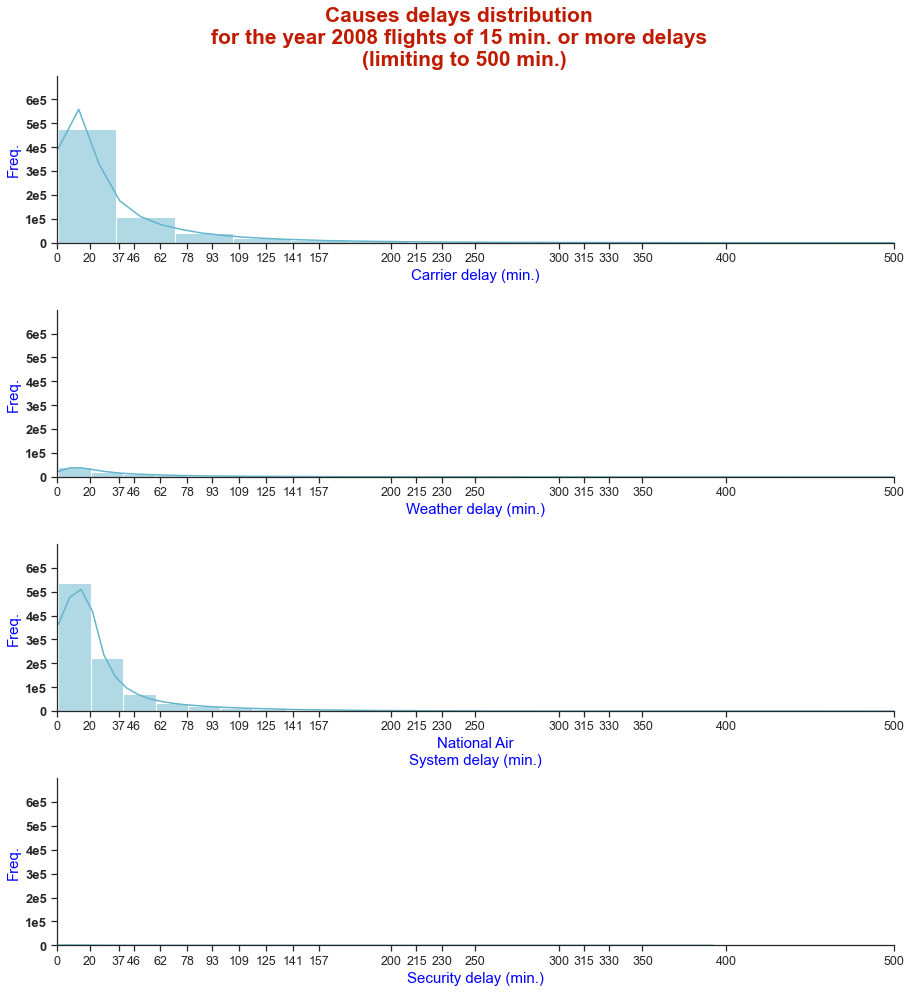

In [60]:
# polished histogram

sns.set_theme(style='ticks')
plt.figure(figsize=(15,16))

plt.suptitle('Causes delays distribution \nfor the year 2008 flights of 15 min. or more delays \n (limiting to 500 min.)',
               fontsize=21,color='#BF1B00',weight='bold',y=.94)   
        
for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(4,1,i+1)
    sns.histplot(cause_col,bins=70,kde=True,
                 color=sns.color_palette()[9])#,hist_kws={'histtype':'bar','alpha':0.1875}),color='skyblue'
    sns.despine()
    plt.xlabel(causes[i]+' delay (min.)',color='blue',fontsize=15)
    plt.ylabel('Freq.',color='blue',fontsize=15);
    plt.xlim([0,500])
    plt.xticks([0, 20, 37,46,62,78,93,109,125,141,157,200,215,230,250,300,315,330,350,400,500],
               fontsize='12.5')
    plt.ylim((0,700000))
    plt.yticks(np.arange(0,7,1)*10**5,
               [0]+[str(n)+'e5' for n in range(1,7,1)],
               #[0,'1e5','2e5','3e5','4e5','5e5','6e5'],
               fontsize=13,weight='bold')
plt.subplots_adjust(hspace=.4);

After limiting minutes axes to 500 min.,the vertical histograms clearly enhance later conclusions, showing higher frequencies for "Carrier" and "NAS" distributions for the lower causes-delays values, where 'NAS' delays excel in this, among other causes-delays.

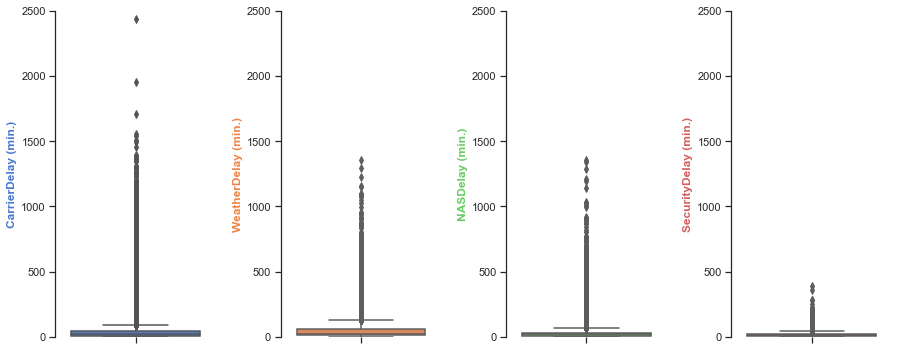

In [61]:
# plotting boxplots delay causes distributions in df_inv_15 without zero or missing values (filtering from 1,524,733 rows)
# with shared 2500 minutes axis

# boxplots
plt.figure(figsize=(15,6))

sns.set(style='ticks')

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(1,4,i+1)
    sns.boxplot(y=cause_col,color=sns.color_palette('muted')[i])
    
    sns.despine(bottom=True)
    #ytick = [0,200,500,1000,1500]
    #plt.yticks(xtick,xtick)
    plt.ylim((0,2500))
    plt.ylabel(delay_col + ' (min.)',color=sns.color_palette('muted')[i],weight='bold')
    #plt.ylabel('Est. Distributions')
plt.subplots_adjust(wspace=.4)

The boxplots show the spread of causes-delays minutes. Carrier-delays exceeded with the highest spread and outliers.

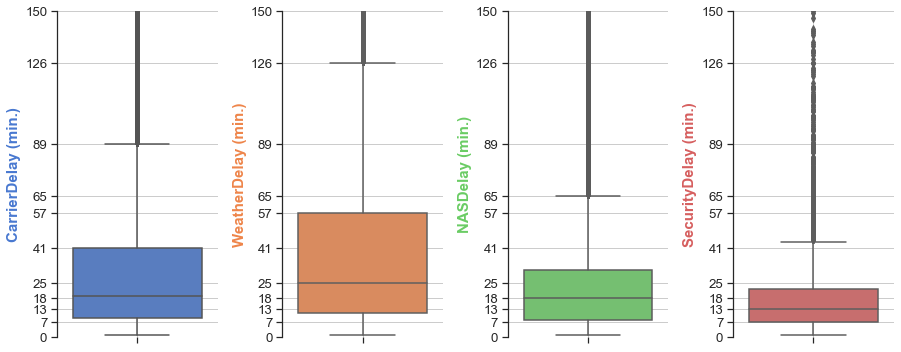

In [62]:
# plotting boxplots delay causes distributions in df_inv_15 without zero or missing values (filtering from 1,524,733 rows)
# limiting axis to 150 min.

# boxplots
plt.figure(figsize=(15,6))

sns.set(style='ticks')

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(1,4,i+1)
    sns.boxplot(y=cause_col,color=sns.color_palette('muted')[i])
    
    sns.despine(bottom=True)
    
    ytick = [0,7,13,18,25,41,57,65,89,126,150]
    plt.yticks(ytick,ytick,fontsize=13.25)
    plt.ylim((0,150))
    plt.ylabel(delay_col + ' (min.)',color=sns.color_palette('muted')[i],weight='bold',fontsize=15)
    #plt.ylabel('Est. Distributions')
    plt.grid()
plt.subplots_adjust(wspace=.4)

A polished limited ranges boxplots shows the wider IQR and the higher median of Weather-delays over all causes.

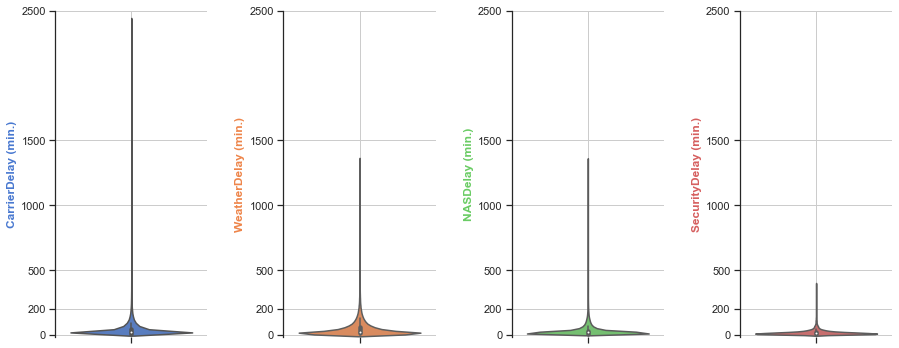

In [63]:
# plotting violinplots delay causes distributions in df_inv_15 without zero or missing causes-delays values
# (filtering from 1,524,733 rows)
# limiting max minutes to 2500

# violinplots
plt.figure(figsize=(15,6))

sns.set(style='ticks')

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(1,4,i+1)
    sns.violinplot(y=cause_col,color=sns.color_palette('muted')[i])#,palette='deep'
    sns.despine(bottom=True)
    
    ytick = [-50,0,200,500,1000,1500,2500]
    plt.yticks(ytick,ytick)
    plt.ylim((-15,2500))
    plt.ylabel(delay_col+' (min.)',color=sns.color_palette('muted')[i],weight='bold')
    plt.grid(True)
    #plt.ylabel('Est. Distributions')
plt.subplots_adjust(wspace=.5)

The violinplots show the spread of causes delay minutes. 'Carrier' delays exceed with the highest spread and outliers, as deduced before, but we need to focus the plot more on a limited range to make interpretting the distributions around the medians easier.  

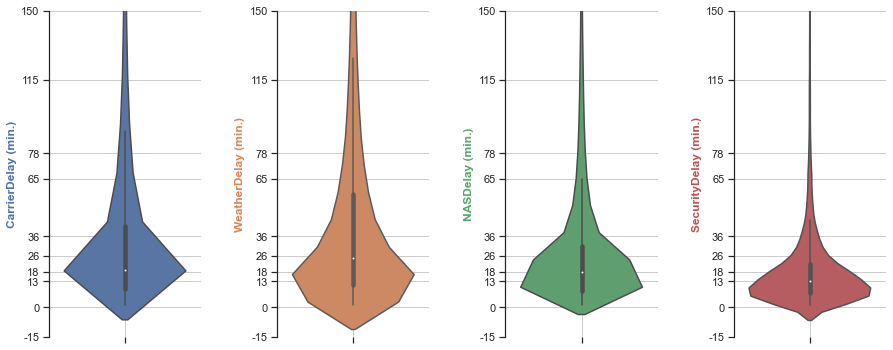

In [64]:
# plotting violinplots delay causes distributions in df_inv_15 without zero or missing causes-delays values
# (filtering from 1,524,733 rows)


# violinplots
plt.figure(figsize=(15,6))

sns.set(style='ticks')

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(1,4,i+1)
    sns.violinplot(y=cause_col,color=sns.color_palette()[i])#,palette='deep'
    sns.despine(bottom=True)
    
    ytick = [-15,0,13,18,26,36,65,78,115,150,200,250]
    plt.yticks(ytick,ytick)
    plt.ylim((-15,150))
    plt.ylabel(delay_col+' (min.)',color=sns.color_palette()[i],weight='bold')
    plt.grid(True)
    #plt.ylabel('Est. Distributions')
plt.subplots_adjust(wspace=.5)

Sharing the violinplots axes assures the previous conclusions about general delays ranges distributions.

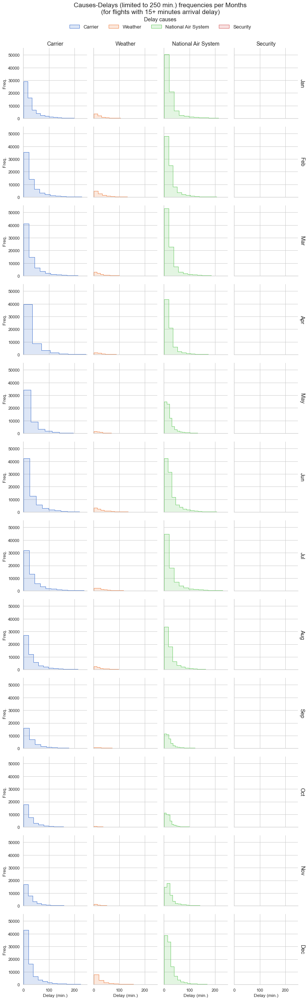

In [65]:
# delay-causes delays histograms limited to 250 minutes per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Cause',col_order=order,
                  row='Month',margin_titles=True,
                  hue='Cause',hue_order=order,
                  #col_wrap=4,
                  xlim=(0,250),
                  palette='muted',
                 )#size=4)#height=5,aspect=.77)
sns.set(font_scale=1.19)
title = 'Causes-Delays (limited to 250 min.) frequencies per Months\n(for flights with 15+ minutes arrival delay)'
g.fig.suptitle(title,x=.331,y=1.015)
g.map(sns.histplot,'Minutes',element ='step',fill=True,alpha=.185,bins=70)
g.set_titles(col_template='{col_name}',row_template='{row_name}')
g.add_legend(title = 'Delay causes',loc='upper center',ncol=4,bbox_to_anchor=(0.331,1.005))
g.set_xlabels('Delay (min.)')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

In general as the plot shows, 'Carrier' and 'NAS' had the largest counts of lower-values delays for different months, 'NAS' exceeds in this almost all months. 

To have the plot more controlled without much of scrolling, it would be better to plot all causes-delays histograms per the month on one faceted subplot instead of dividing the same month delay-causes on 4 different histograms.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


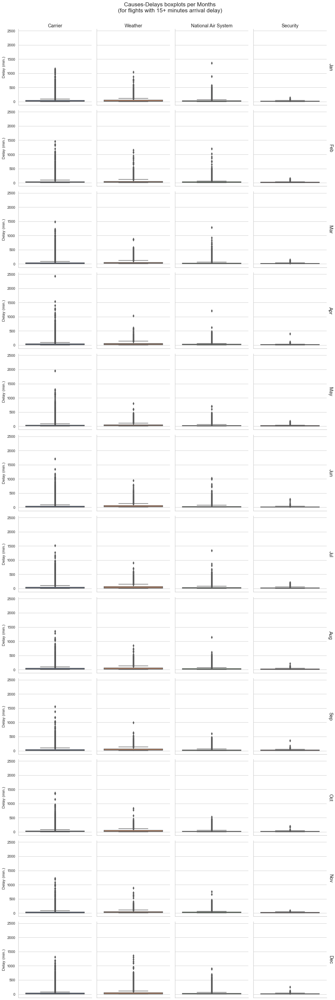

In [66]:
# delay-causes delays boxplots per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
colors = [color for color in sns.color_palette('muted')[0:4]] * 12
colors = (color for color in colors)

def my_box_2(y,*args,**kwargs):
    color=next(colors)
    sns.boxplot(y=y,color=color)
    
# g = sns.catplot(kind='box',
#                 data=melt_15,col='Cause',col_order=order,
#                 row='Month',margin_titles=True,
#                 order=order,
#                 hue='Cause',hue_order=order,
#                 y='Minutes',
#                 #col_wrap=4,
#                 #xlim=(0,250),
#                 palette='muted',
#                 size=3.5)#height=5,aspect=.77)

g = sns.FacetGrid(#kind='box',color=next(colors),
                  data=melt_15,col='Cause',col_order=order,
                  row='Month',margin_titles=True,
                  #hue='Cause',hue_order=order,#hue_kws={'color': [color for color in list(sns.color_palette('muted')[0:4])]},
                  #y='Minutes',
                  #col_wrap=4,
                  palette='muted',
                  size=3.5)#height=5,aspect=.77)

sns.set(font_scale=1.19)
title = 'Causes-Delays boxplots per Months\n(for flights with 15+ minutes arrival delay)'
g.fig.suptitle(title,y=1)#,x=.5,y=1.015)
g.map(my_box_2,'Minutes')#,orient='v')
g.set_titles(col_template='{col_name}',row_template='{row_name}')
#g.add_legend(title = 'Delay causes',loc='upper center',ncol=4,bbox_to_anchor=(0.331,1.005))
g.set_ylabels('Delay (min.)')
g.set_xlabels('');
#g.set_ylabels('Freq.');#,color='blue',fontsize=15);

We can see the ranges of outliers, but the IQR boxes are collapsed and it is hard to spot the quartile ranges.

So I am going to limit the ranges.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


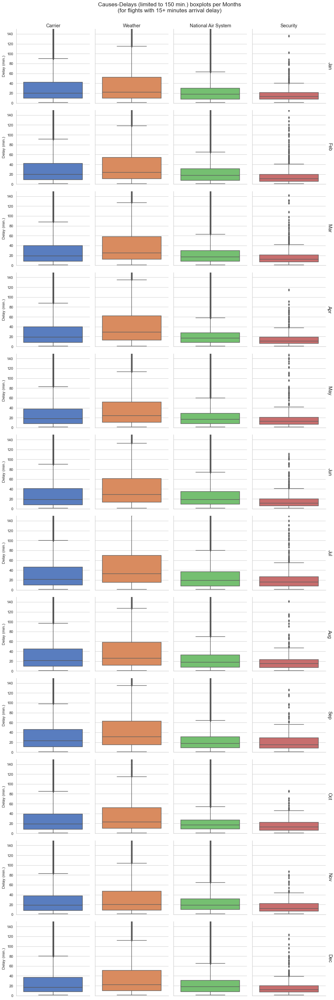

In [67]:
# delay-causes delays boxplots limited to 150 minutes per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
colors = [color for color in sns.color_palette('muted')[0:4]] * 12
colors = (color for color in colors)
    
# g = sns.catplot(kind='box',color=next(colors),
#                 data=melt_15,col='Cause',col_order=order,
#                 row='Month',margin_titles=True,
#                 hue='Cause',hue_order=order,#hue_kws={'color': [color for color in list(sns.color_palette('muted')[0:4])]},
#                 y='Minutes',
#                 #col_wrap=4,
#                 palette='muted',
#                 size=3.5)#height=5,aspect=.77)

g = sns.FacetGrid(#kind='box',color=next(colors),
                  data=melt_15,col='Cause',col_order=order,
                  row='Month',margin_titles=True,
                  #hue='Cause',hue_order=order,#hue_kws={'color': [color for color in list(sns.color_palette('muted')[0:4])]},
                  #y='Minutes',
                  #col_wrap=4,
                  palette='muted',
                  size=3.5)#height=5,aspect=.77)

sns.set(font_scale=1.19)
g.set(ylim=(0,150),)
title = 'Causes-Delays (limited to 150 min.) boxplots per Months\n(for flights with 15+ minutes arrival delay)'
g.fig.suptitle(title,y=1)#.015)#x=.5,)
g.map(my_box_2,'Minutes')#,*args,**kwargs)#,order=order,orient='v')
g.set_titles(col_template='{col_name}',row_template='{row_name}')
#g.add_legend(title = 'Delay causes',loc='upper center',ncol=4,bbox_to_anchor=(0.5,1.005))#0.331
g.set_ylabels('Delay (min.)')
g.set_xlabels('');
#g.set_ylabels('Freq.');#,color='blue',fontsize=15);

In general as the plot shows, 'Weather' and 'Carrier' had the largest delays-medians for different months.

To have the plot more controlled without much of scrolling, it would be better to plot all causes-delays boxplots per the month on one faceted subplot instead of dividing the same month delay-causes on 4 different boxplots.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


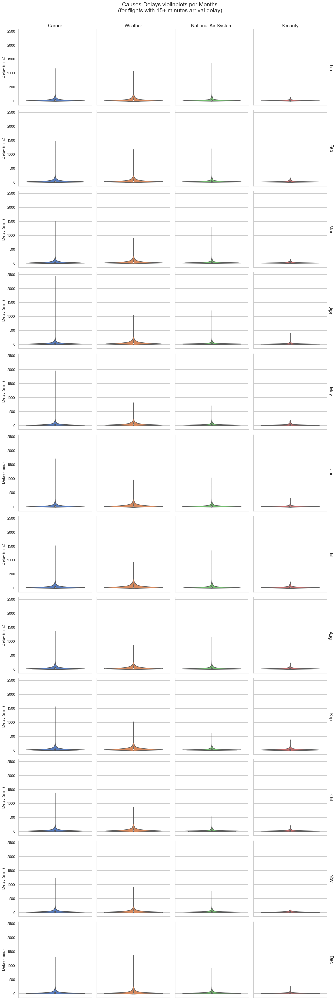

In [68]:
# delay-causes delays boxplots per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
colors = [color for color in sns.color_palette('muted')[0:4]] * 12
colors = (color for color in colors)

def my_violin_2(y,*args,**kwargs):
    color=next(colors)
    sns.violinplot(y=y,color=color)

# g = sns.catplot(kind='violin',
#                 data=melt_15,col='Cause',col_order=order,
#                 row='Month',margin_titles=True,
#                 order=order,
#                 hue='Cause',hue_order=order,
#                 y='Minutes',
#                 #col_wrap=4,
#                 #xlim=(0,250),
#                 palette='muted',
#                 size=3.5)#height=5,aspect=.77)

g = sns.FacetGrid(#kind='box',color=next(colors),
                  data=melt_15,col='Cause',col_order=order,
                  row='Month',margin_titles=True,
                  #hue='Cause',hue_order=order,#hue_kws={'color': [color for color in list(sns.color_palette('muted')[0:4])]},
                  #y='Minutes',
                  #col_wrap=4,
                  palette='muted',
                  size=3.5)#height=5,aspect=.77)

sns.set(font_scale=1.19)
title = 'Causes-Delays violinplots per Months\n(for flights with 15+ minutes arrival delay)'
g.fig.suptitle(title,y=1)#,x=.5,y=1.015)
g.map(my_violin_2,'Minutes')#,orient='v')
g.set_titles(col_template='{col_name}',row_template='{row_name}')
#g.add_legend(title = 'Delay causes',loc='upper center',ncol=4,bbox_to_anchor=(0.331,1.005))
g.set_ylabels('Delay (min.)')
g.set_xlabels('');
#g.set_ylabels('Freq.');#,color='blue',fontsize=15);

We can see the ranges of outliers, but the violins distrubutions are very tight and they are hard to investigate.

So I am going to limit the ranges.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:316: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


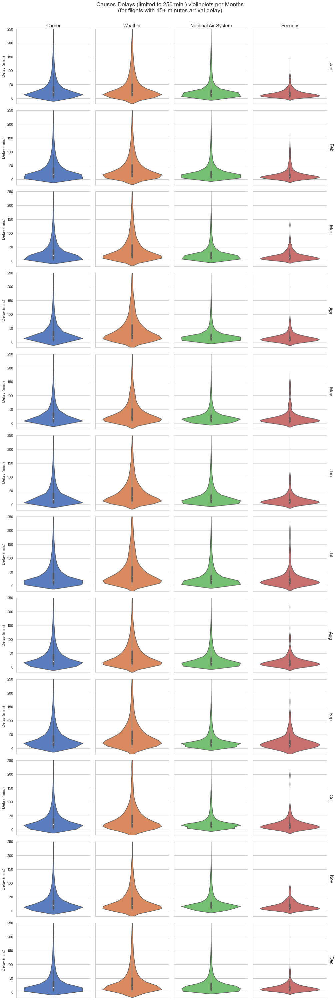

In [69]:
# delay-causes delays boxplots limited to 250 minutes per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
colors = [color for color in sns.color_palette('muted')[0:4]] * 12
colors = (color for color in colors)

# g = sns.catplot(kind='violin',color=next(colors),
#                 data=melt_15,col='Cause',col_order=order,
#                 row='Month',margin_titles=True,
#                 hue='Cause',hue_order=order,#hue_kws={'color': [color for color in list(sns.color_palette('muted')[0:4])]},
#                 y='Minutes',
#                 #col_wrap=4,
#                 palette='muted',
#                 size=3.5)#height=5,aspect=.77)

g = sns.FacetGrid(#kind='box',color=next(colors),
                  data=melt_15,col='Cause',col_order=order,
                  row='Month',margin_titles=True,
                  #hue='Cause',hue_order=order,#hue_kws={'color': [color for color in list(sns.color_palette('muted')[0:4])]},
                  #y='Minutes',
                  #col_wrap=4,
                  palette='muted',
                  size=3.5)#height=5,aspect=.77)

sns.set(font_scale=1.19)
g.set(ylim=(-20,250),)
title = 'Causes-Delays (limited to 250 min.) violinplots per Months\n(for flights with 15+ minutes arrival delay)'
g.fig.suptitle(title,y=1)#,x=.5,y=1.015)
g.map(my_violin_2,'Minutes')#,color=next(colors))#,order=order,orient='v')
g.set_titles(col_template='{col_name}',row_template='{row_name}')
#g.add_legend(title = 'Delay causes',loc='upper center',ncol=4,bbox_to_anchor=(0.5,1.005))#0.331
g.set_ylabels('Delay (min.)')
g.set_xlabels('');
#g.set_ylabels('Freq.');#,color='blue',fontsize=15);

In general as the plot shows, Some delays had more distributions than others for different months. However the vision here is confusing because of much scrolling.

To have the plot more controlled without much of scrolling, it would be better to plot all causes-delays violinplots per the month on one faceted subplot instead of dividing the same month delay-causes on 4 different violinplots.

**As for months, we can make the last faceted plots for causes-delays per 'Airlines' or 'Carriers corporations'. But we will have 20 rows for 'Carriers' instead of 12 for 'Months'. So, it is better to plot those causes-delays on multivariate plots, or faceted bivariate plots.**

### <font color='blue'>Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?</font>

> __Most arrival delays were of 15 minutes to about 78 minutes__ , the median for the data points arrival delays is 37 minutes as from the boxplot and 'describe' table. The violin plot clearly assures the huge distribution near to the median.

>* __From 1,524,733 flights__ of 15 minutes arrival delay or more:<br>
'20,726' flights exceeded "250" min. arrival delay<br>
'5,824' flights exceeded "350" min. arrival delay<br>
'3,439' flights exceeded "400" min. arrival delay<br>
'1,562' flights exceeded "500" min. arrival delay<br>
'189' flights exceeded "1000" min. arrival delay<br>
'9' flights exceeded "1500" min. arrival delay<br>
'2' flights exceeded "2000" min. arrival delay<br>
'0' flights exceeded "2500" min. arrival delay

> __More higher frequencies were for "Carrier" and "National Air System" lower-delays values__ than other delay-causes delays. However, 'Carrier' delays had the highest range distribution or spread, up to about 2500 min., leading to a higher number of outliers. At last place 'Security' delays had the lowest frequencies and distribution among all other delay causes.

> __Delays due to 'Weather' had a wider IQR range__, from about 10 min. to about 45 min. as well a wider distribution from about 10 min to 350 min, for sampled data, also with a higher median and a wider range from the median to the third quartile, even than 'Carrier' and 'NAS' delays. 'Carrier' delays came second then 'NAS' in related to IQR and distributions in the same range, but with much more distributions around or below their lower medians. At last 'Security' delays came with a small IQR as well a more lower delays values around and below the lowest median.

> __'Carrier' delays exceeded with the highest spread and outliers.__

>* __From 1,524,733 flights__ of 15 minutes arrival delay or more:<br>
'854,113' flights had "0" min. or less of carrier delay<br>
'1,424,748' flights had "0" min. or less of weather delay<br>
'596,703' flights had "0" min. or less of national air system delay<br>
'1,518,531' flights had "0" min. or less of security delay

>* __From 670,620 carrier-delay times:__<br>
'6,445' flights exceeded "250" min. carrier delay<br>
'2,642' flights exceeded "350" min. carrier delay<br>
'1,837' flights exceeded "400" min. carrier delay<br>
'1,026' flights exceeded "500" min. carrier delay<br>
'116' flights exceeded "1000" min. carrier delay<br>
'6' flights exceeded "1500" min. carrier delay<br>
'1' flights exceeded "2000" min. carrier delay<br>
'0' flights exceeded "2500" min. carrier delay
>* __From 99,985 weather-delay times:__<br>
'1,535' flights exceeded "250" min. weather delay<br>
'500' flights exceeded "350" min. weather delay<br>
'315' flights exceeded "400" min. weather delay<br>
'156' flights exceeded "500" min. weather delay<br>
'12' flights exceeded "1000" min. weather delay<br>
'0' flights exceeded "1500" min. weather delay
>* __From 928,030 national air system-delay times:__<br>
'3,299' flights exceeded "250" min. national air system delay<br>
'721' flights exceeded "350" min. national air system delay<br>
'359' flights exceeded "400" min. national air system delay<br>
'100' flights exceeded "500" min. national air system delay<br>
'9' flights exceeded "1000" min. national air system delay<br>
'0' flights exceeded "1500" min. national air system delay<br>
>* __From 6,202 security-delay times:__<br>
'5' flights exceeded "250" min. security delay<br>
'2' flights exceeded "350" min. security delay<br>
'0' flights exceeded "400" min. security delay<br>

> __Finally I didn't need to make a transformation in this section, except some work of sampling data points and limiting values.__
### <font color='blue'>Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?</font>

> __'Carrier' delays had a wide spread range with a bit surprising delays-outliers values__

> I decided to move to work on DB Browser for SQlite to work more rapidly with this huge data points number of over 7 Million, and to get needed columns for my investigation, with the code. I reduced dataset from 29 to be 19 columns, and I made a left join with carriers.csv data there to get carrier names instead of there codes. I exported the columns to 2008_flights.csv later, then I came back again to jupyter notebook to complete the work.

> I extracted the columns I thought as helpful for this investigation, they were _['Month', 'Carrier', 'ArrDelay', 'Cancelled','CancellationCode','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']_ into __'df_inv'__ dataframe.

> __From 'df_inv', I derived:__<br>
__1__ _**'airline_cancelled'**_ dataframe for data points of cancelled flights data<br>
__2__ _**'on_time'**_ dataframe for flights with less than 15 min. arrival delay and not null, or data points with arrival delays less than 15 minutes and not null<br>
__3__ _**'df_inv_15'**_ for flights with arrival delays that equal 15 minutes or more, then i **sampled 'df_inv_15_samp'** from them. I melted the delay-causes columns within 'Cause' column, and I put their values in 'Minutes' column. Next, I removed 'Minutes' with zero, less or null values, _**producing 'melt_15' and 'melt_samp_15'**_ dataframes _for using new created columns from melting in investigating relationships among delay-causes and other features like month, carrier, and arrival delay._

## <font color='blue'>Bivariate Exploration</font>


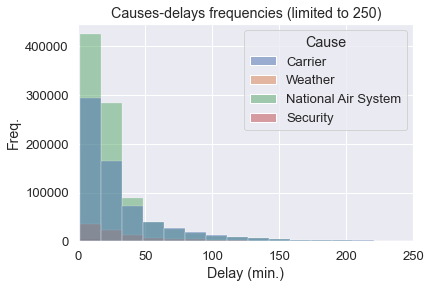

In [70]:
# delay-causes delays bivariate histogram for flights with 15+ minutes arrival delay
sns.histplot(data=melt_15,x='Minutes',hue='Cause',bins=155)
plt.xlim((0,250))
plt.title('Causes-delays frequencies (limited to 250)')
plt.xlabel('Delay (min.)')
plt.ylabel('Freq.');

The polished bivariate histogram assures that 'NAS' delays had more lower-values frequencies, then 'Carrier', for flights with 15+ minutes arrival delay.

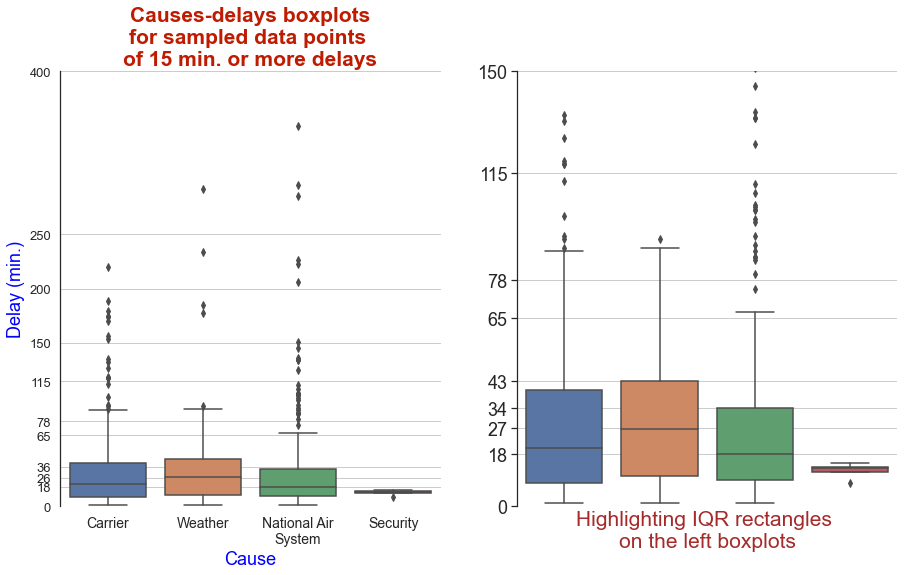

In [71]:
# plotting bivariate boxplots of the previously melted 'delay-causes columns' for sample data (500 rows)

sns.set_style('white')
plt.figure(figsize=(15,8))

plt.subplot(121)

sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= melt_samp_15,
                 y='Minutes',x='Cause',palette='deep')
plt.title('Causes-delays boxplots\nfor sampled data points \nof 15 min. or more delays',
          fontsize=21,
          color='#BF1B00',
          weight='bold')
#yticks=[0,15,35,45,60,100,150,200,250,400]
#plt.yticks(yticks,yticks)

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
ax.set_ylim([0,400])
ax.set_xticklabels(causes)
plt.ylabel('Delay (min.)',fontsize=18,color='blue')
plt.xlabel('Cause',fontsize=18,color='blue')
yticks=[0,18,26,36,65,78,115,150,200,250,400]

plt.yticks(yticks,yticks,fontsize=13)
plt.xticks(fontsize=14)
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 

sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= melt_samp_15,
                 y='Minutes',x='Cause',palette='deep')

sns.despine(bottom=True)
plt.yticks(fontsize=18)
ax.set_yticks([0,18,27,34,43,65,78,115,150,200,250])
ax.set_ylim([0,150])

ax.grid(True,axis ='y');
ax.set_xticks([])
plt.xlabel('Highlighting IQR rectangles \non the left boxplots',fontsize=21,color='Brown')
plt.ylabel('')
plt.subplots_adjust(wspace=.2);

This is a polished bivariate version for the previous univariate boxplots of sample data.

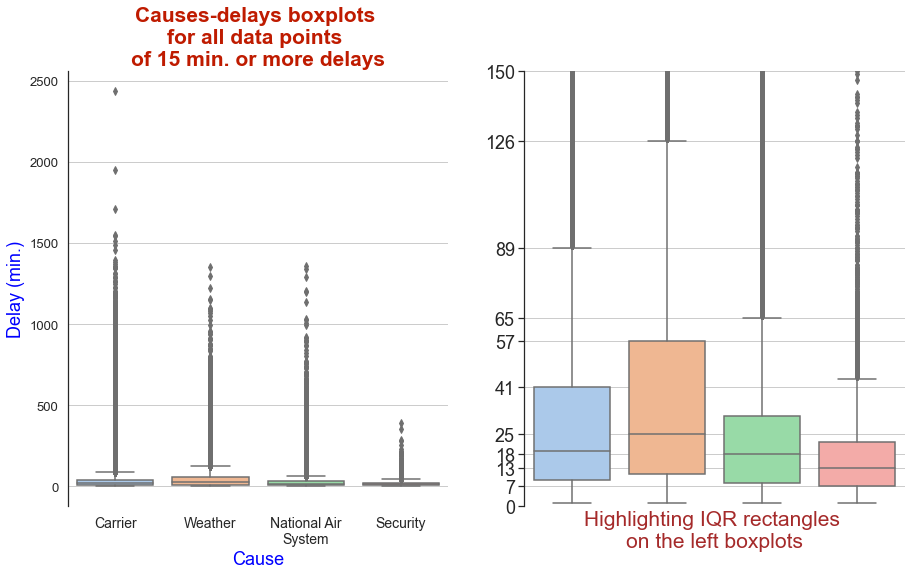

In [72]:
# plotting bivariate boxplots of the previously melted 'delay-causes columns' for sample data (500 rows)

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= melt_15,
                 y='Minutes',x='Cause',palette='pastel')
plt.title('Causes-delays boxplots \nfor all data points \nof 15 min. or more delays',
          fontsize=21,
          color='#BF1B00',
          weight='bold')

plt.ylabel('Delay (min.)',fontsize=18,color='blue')
plt.xlabel('Cause',fontsize=18,color='blue')

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

#ax.set_ylim([0,400])
#yticks=[0,18,26,36,65,78,115,150,200,250,400]
#plt.yticks(yticks,yticks,fontsize=13)

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 

sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= melt_15,
                 y='Minutes',x='Cause',palette='pastel')

sns.despine(bottom=True)
plt.yticks(fontsize=18)
ax.set_yticks([0,7,13,18,25,41,57,65,89,126,150])
ax.set_ylim([0,150])

ax.grid(True,axis ='y');
ax.set_xticks([])
plt.xlabel('Highlighting IQR rectangles \non the left boxplots',fontsize=21,color='Brown')
plt.ylabel('')
plt.subplots_adjust(wspace=.2);

A polished bivariate version of the univariate boxplots shows the wider IQR and the higher median of Weather-delays over all causes.

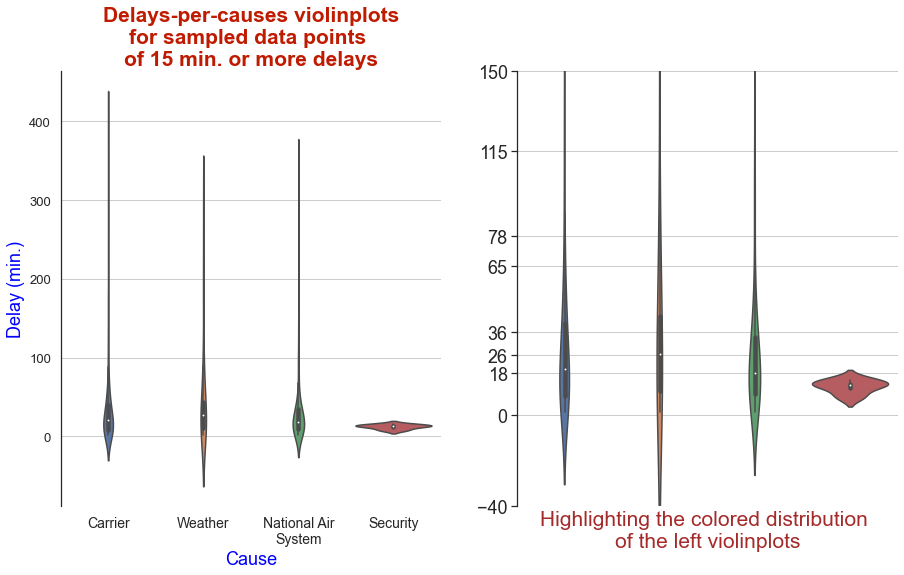

In [73]:
# plotting bivariate boxplots of the previously melted 'delay-causes columns' for sample data (500 rows)

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.violinplot(data= melt_samp_15,
                 y='Minutes',x='Cause',palette='deep')
plt.title('Delays-per-causes violinplots\nfor sampled data points \nof 15 min. or more delays',
          fontsize=21,
          color='#BF1B00',
          weight='bold')

plt.ylabel('Delay (min.)',fontsize=18,color='blue')
plt.xlabel('Cause',fontsize=18,color='blue')

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)


#ax.set_ylim([-40,400])
#yticks=[-40,0,18,26,36,65,78,115,150,200,250,400]
#plt.yticks(yticks,yticks,fontsize=13)

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 

sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_samp_15,
                 y='Minutes',x='Cause',palette='deep')

sns.despine(bottom=True)
plt.yticks(fontsize=18)
ax.set_yticks([-40,0,18,26,36,65,78,115,150,200,250])
ax.set_ylim([-40,150])

ax.grid(True,axis ='y');
ax.set_xticks([])
plt.xlabel('Highlighting the colored distribution \nof the left violinplots',fontsize=21,color='Brown')
plt.ylabel('')
plt.subplots_adjust(wspace=.2);

This is a bivariate version for the previous univariate sample data violinplots, however they appear here much narrower.

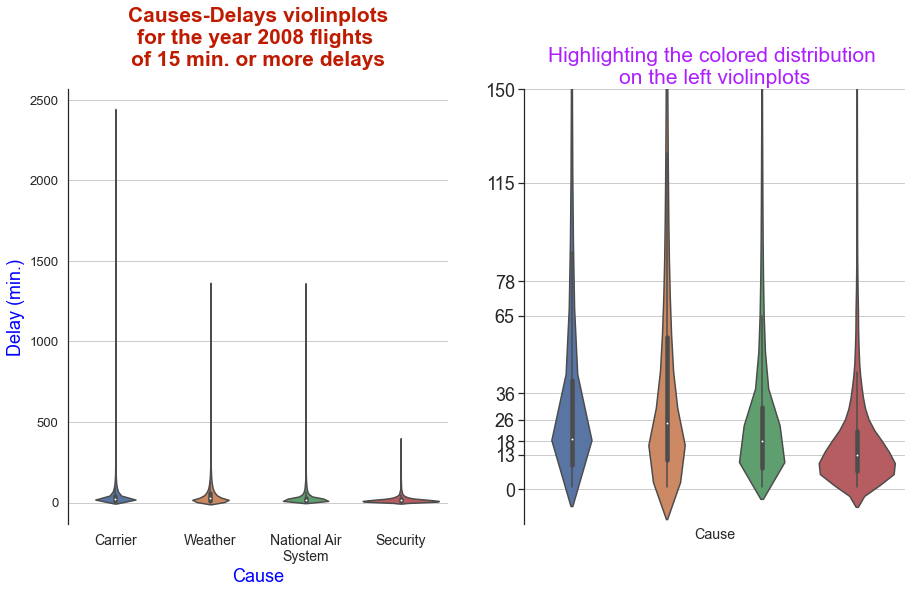

In [74]:
# plotting univariate boxplots of the previously melted 'delay-causes columns' for sample data (500 rows)

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.violinplot(data= melt_15,
                 y='Minutes',x='Cause',palette='deep')

plt.title('Causes-Delays violinplots\nfor the year 2008 flights \nof 15 min. or more delays',
          fontsize=21,
          color='#BF1B00',
          weight='bold',y=1.04)

plt.xlabel('Cause',fontsize=18,color='blue')
plt.ylabel('Delay (min.)',fontsize=18,color='blue')

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

#ax.set_ylim([-40,400])
#yticks=[-40,0,18,26,36,65,78,115,150,200,250,400]
#plt.yticks(yticks,yticks,fontsize=13)

sns.despine(left=True)
ax.grid(True,axis ='y')

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 


# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_15,
                 y='Minutes',x='Cause',palette='deep')

sns.despine(bottom=True)
plt.yticks(fontsize=18)
ax.set_yticks([-15,0,13,18,26,36,65,78,115,150,200,250])
ax.set_ylim([-13,150])

ax.grid(True,axis ='y');
ax.set_xticks([])
plt.title('Highlighting the colored distribution \non the left violinplots',fontsize=21,color='#AD1FFF')
plt.ylabel('')
plt.subplots_adjust(wspace=.2);

A bivariate polished version of the univariate violinplots shows the wider range from the median to the third quartile in "Weather IQR Box" and the higher median of 'Weather' over all causes, as well the much more distributions around the lower medians of other-causes delay.

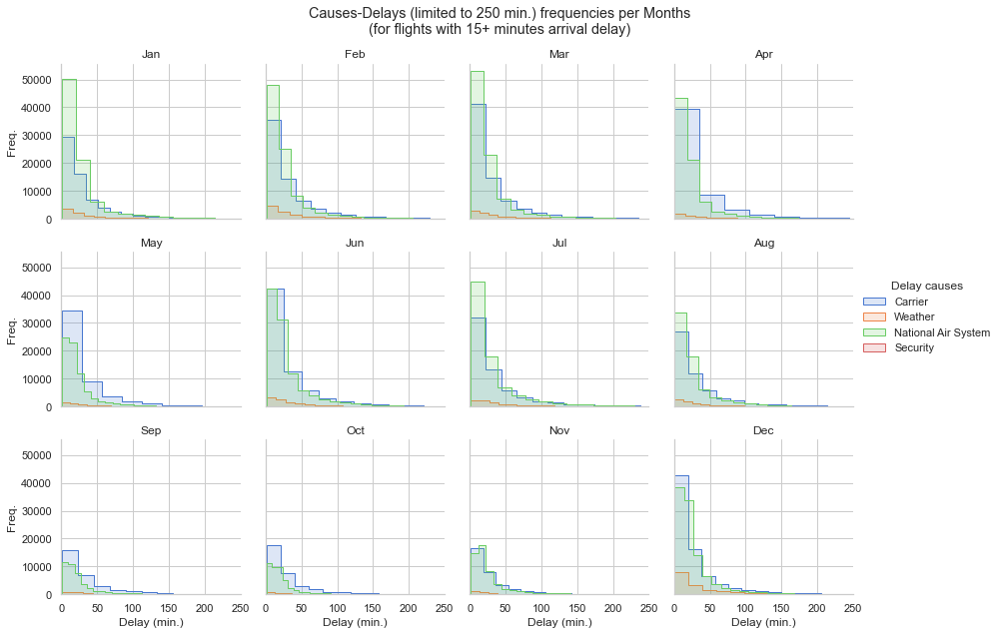

In [75]:
# delay-causes delays bivariate histograms limited to 250 minutes per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Month',
                  hue='Cause',#hue_order=order,
                  col_wrap=4,
                  xlim=(0,250),
                  palette='muted')

g.fig.suptitle('Causes-Delays (limited to 250 min.) frequencies per Months\n(for flights with 15+ minutes arrival delay)')
g.map(sns.histplot,'Minutes',element ='step',fill=True,alpha=.185,bins=70)
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xlabels('Delay (min.)')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

In general as the plot shows, 'Carrier' and 'NAS' had the largest counts of lower-values delays for different months, 'NAS' exceeds in this almost all months. We can see from the faceted histograms that some months had much more lower causes-delays values than others. Also we may need to adjust the bins widths more to be close to the same, and get a clearer vision helping in making more correct decisions. We can also limit our investigation points.

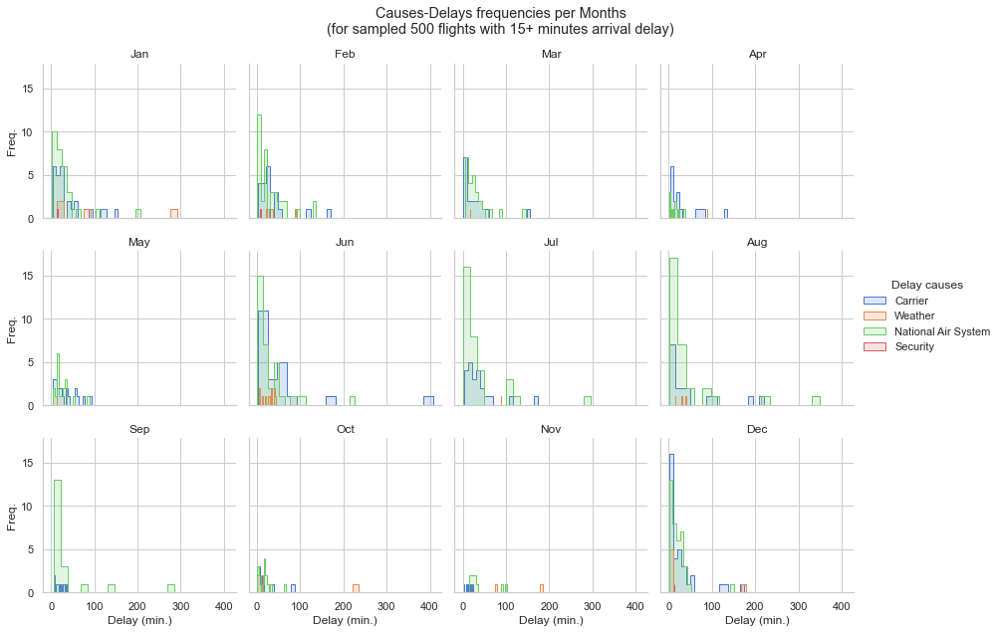

In [76]:
# delay-causes delays bivariate histograms per Months for sampled 
# 500 data points of flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_samp_15,col='Month',
                  hue='Cause',#hue_order=order,
                  col_wrap=4,
                  #xlim=(0,250),
                  palette='muted')
title = 'Causes-Delays frequencies per Months\n(for sampled 500 flights with 15+ minutes arrival delay)'
g.fig.suptitle(title)
g.map(sns.histplot,'Minutes',element ='step',fill=True,alpha=.185,bins=18)
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xlabels('Delay (min.)')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);


We may apply the same previous note on these faceted histograms too.

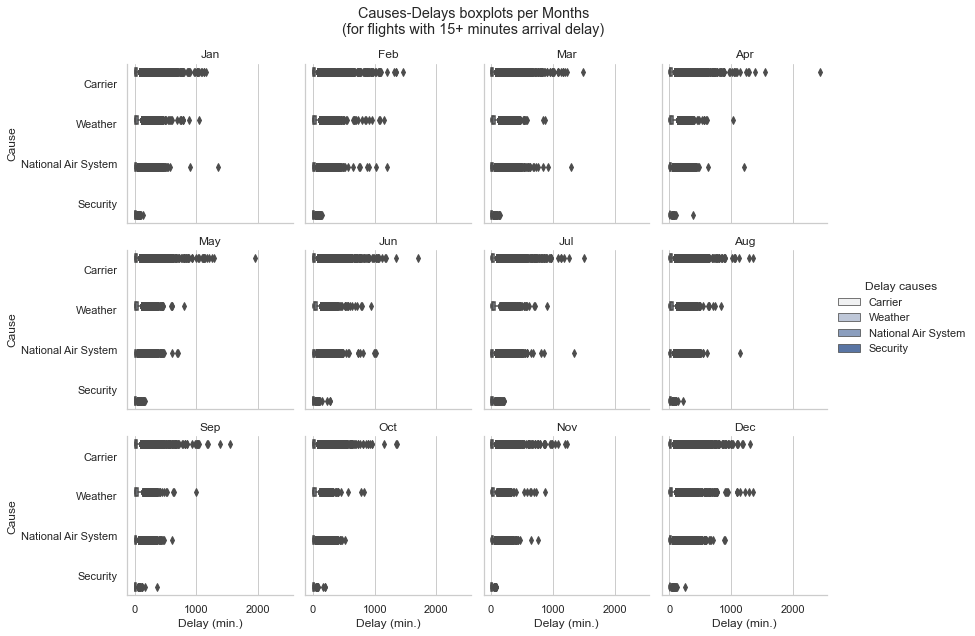

In [77]:
# delay-causes delays boxplots per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Month',
                  
                  col_wrap=4,
                  #xlim=(0,250),
                  palette='muted')

g.fig.suptitle('Causes-Delays boxplots per Months\n(for flights with 15+ minutes arrival delay)')
g.map(sns.boxplot,'Minutes','Cause',order=order,hue=melt_15['Cause'],hue_order=order,orient='h')
g.set_titles('{col_name}')
g.set_xlabels('Delay (min.)')
g.add_legend(title = 'Delay causes');
#g.set_ylabels('Freq.');#,color='blue',fontsize=15);


We can know little things from those narrow IQR boxes. However, we can know more about outliers ranges from these faceted boxplots. It will be of more convenience to have a look on the sampled data boxplots, or limited ranges.

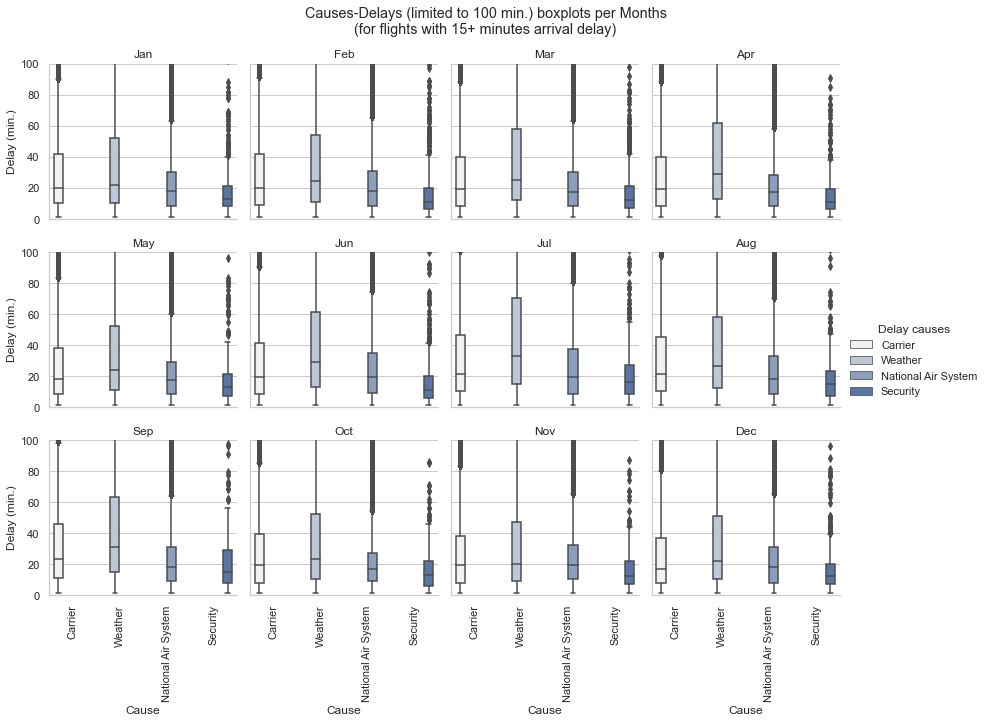

In [78]:
# delay-causes delays boxplots per Months for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Month',
                  
                  col_wrap=4,
                  ylim=(0,100),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays (limited to 100 min.) boxplots per Months\n(for flights with 15+ minutes arrival delay)')
g.map(sns.boxplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);


The boxplots show that 'Weather'-delays had the highest medians and the largest third quartile ranges in all months. Then came 'Carrier'-delays, except about 3 or 4 months where 'NAS'-delays had larger medians, but smaller third quartile ranges also. At last 'Security'-delays had lowest medians and third quartile ranges across months.

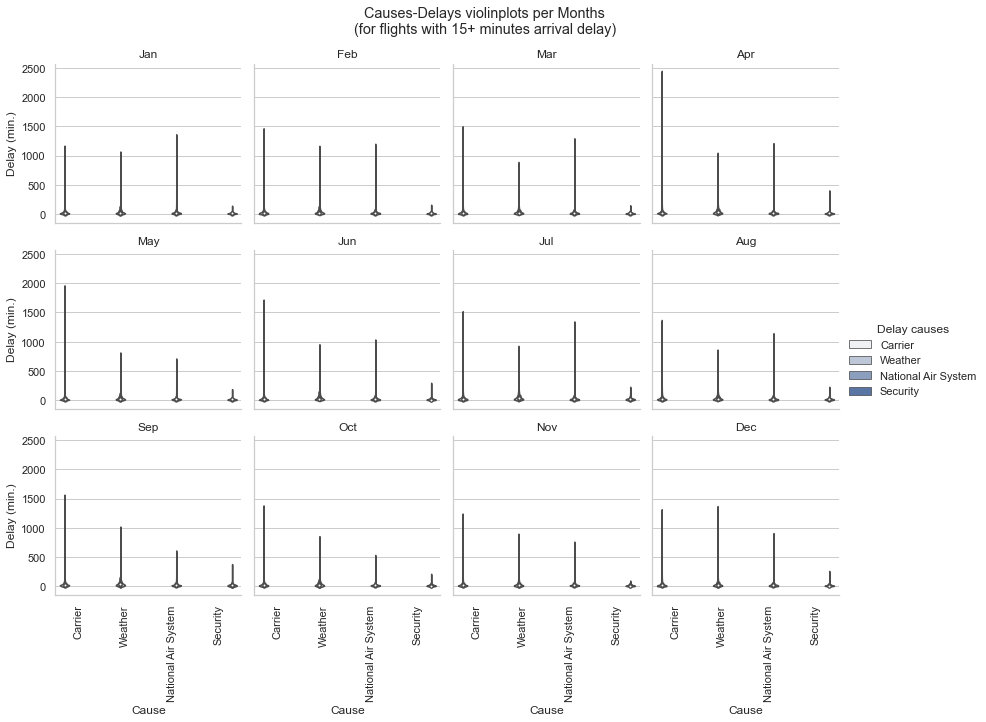

In [79]:
# Causes-delays violinplots per Months for flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Month',
                  
                  col_wrap=4,
                  #ylim=(0,100),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays violinplots per Months\n(for flights with 15+ minutes arrival delay)')
g.map(sns.violinplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);

We can know little from those small faceted violin plots. However, we can know more about ranges due to outliers from these faceted violinplots. It will be of more convenience to have a look on the sampled data violinplots, or limiting the ranges.

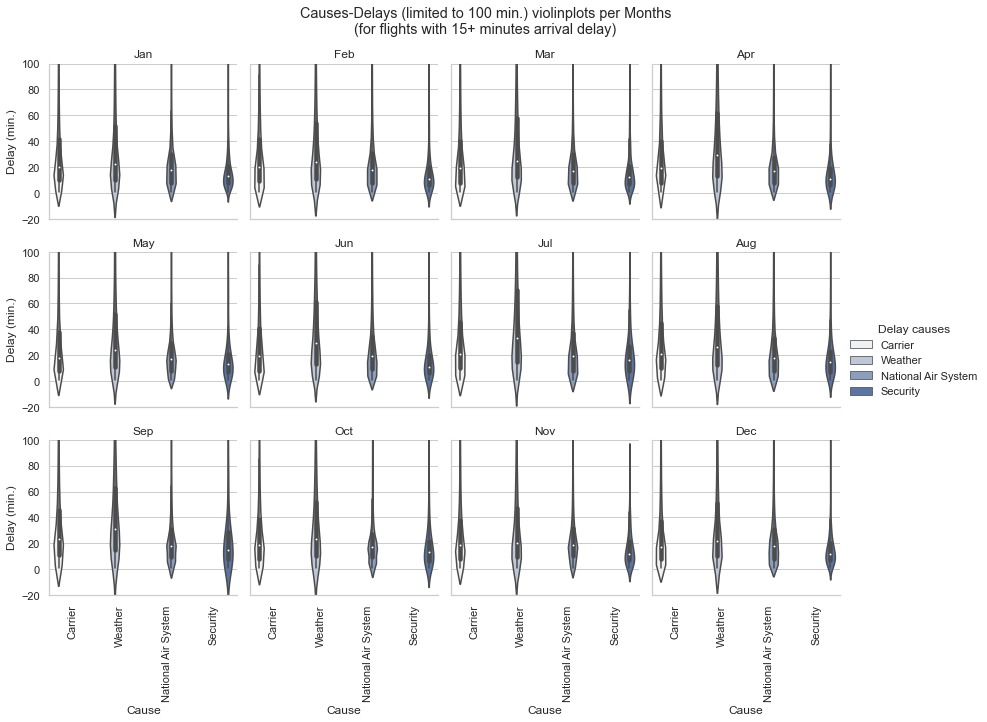

In [80]:
# Causes-delays (limited to 100 min.) violinplots per Months for flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Month',
                  
                  col_wrap=4,
                  ylim=(-20,100),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays (limited to 100 min.) violinplots per Months\n(for flights with 15+ minutes arrival delay)')
g.map(sns.violinplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);

The vision here is clearer on the violins distributions, but it may be better to check the sample data.

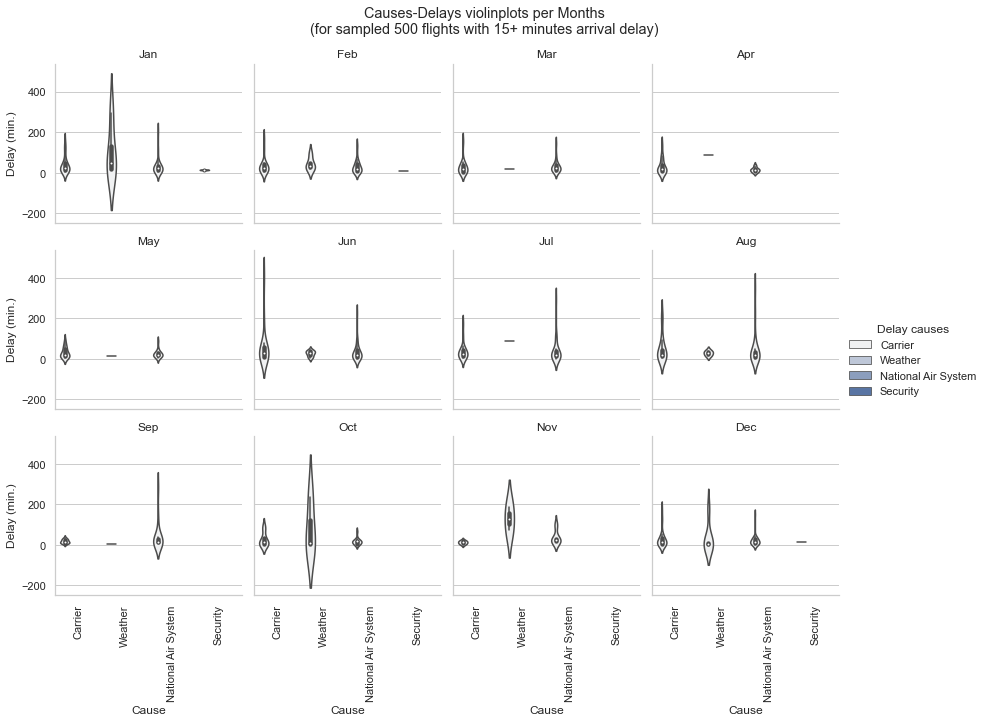

In [81]:
# Causes-delays violinplots per Months for sampled
# 500 flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_samp_15,col='Month',
                  
                  col_wrap=4,
                  #ylim=(-20,100),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays violinplots per Months\n(for sampled 500 flights with 15+ minutes arrival delay)')
g.map(sns.violinplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);

Of sampled data, Weather-delays violins distributions are the highest at all within 'Jan','Oct' and 'Nov'.

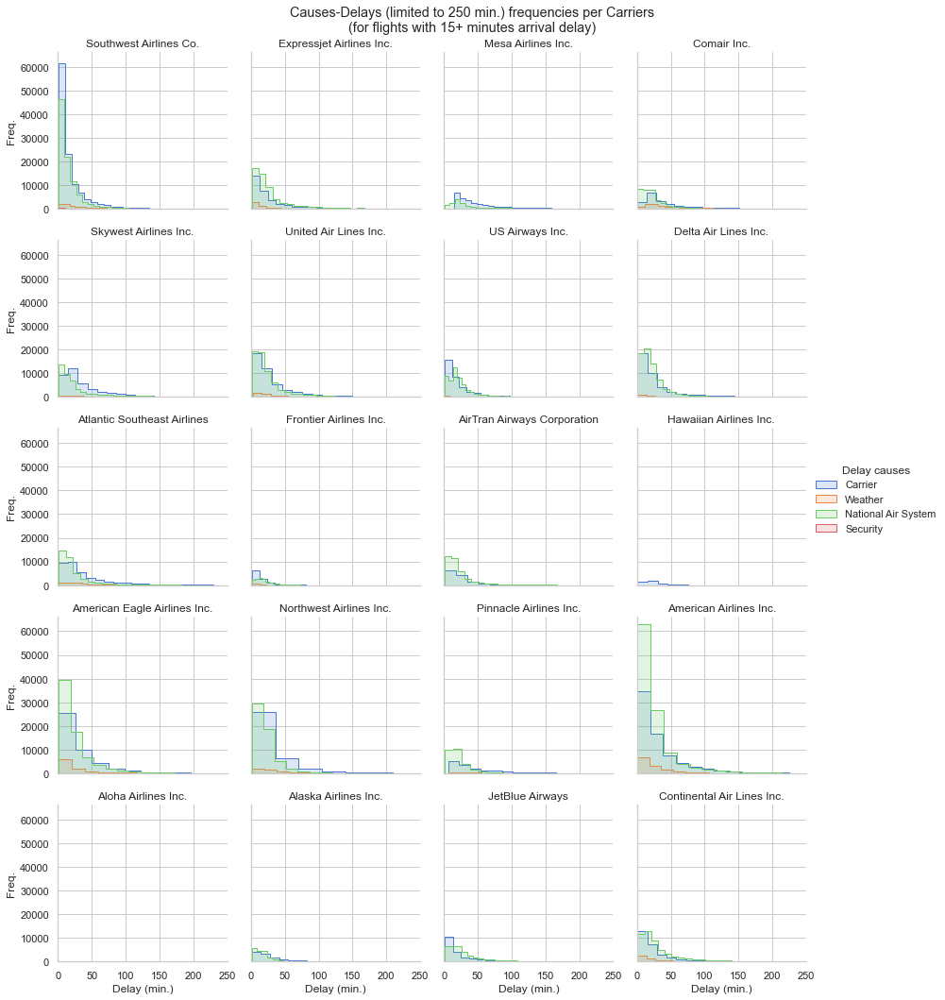

In [82]:
# delay-causes delays histograms limited to 250 minutes per carriers for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Carrier',
                  hue='Cause',#hue_order=order,
                  col_wrap=4,
                  xlim=(0,250),
                  palette='muted')

g.fig.suptitle('Causes-Delays (limited to 250 min.) frequencies per Carriers\n(for flights with 15+ minutes arrival delay)')
g.map(sns.histplot,'Minutes',element ='step',fill=True,alpha=.185,bins=70)
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xlabels('Delay (min.)')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

In general as the plot shows, 'Carrier' and 'NAS' had the largest counts of lower-values delays for different carriers, especially in cases of 'Southwest Airlines Co.' and 'American Airlines Inc.' carriers. We can see from the faceted histograms that some carriers had much more lower causes-delays values than others. Also we may need to adjust the bins widths more to be close to the same, and get a clearer vision helping in making more correct decisions. We can also limit our investigation points.

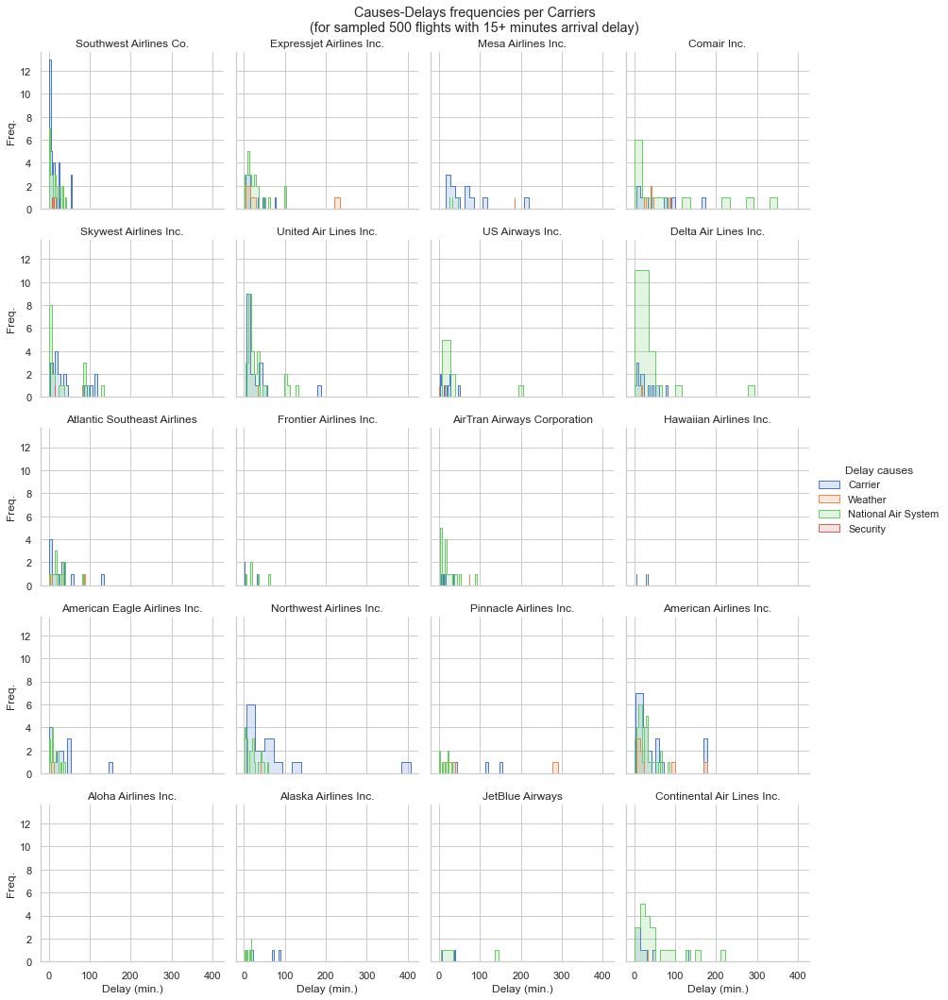

In [83]:
# delay-causes delays histograms per Carriers 
# for sampled 500 data points of flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_samp_15,col='Carrier',col_order=melt_15.Carrier.unique(),
                  hue='Cause',#hue_order=order,
                  col_wrap=4,
                  #xlim=(0,250),
                  palette='muted')
title = 'Causes-Delays frequencies per Carriers\n(for sampled 500 flights with 15+ minutes arrival delay)'
g.fig.suptitle(title)
g.map(sns.histplot,'Minutes',element ='step',fill=True,alpha=.185,bins=18)
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xlabels('Delay (min.)')
g.set_ylabels('Freq.');#,color='blue',fontsize=15);


We may apply the same previous note on these faceted histograms too. 'Aloha Airlines Inc. ' is not represented here because of stated previously when investigating the arrival delays faceted boxplots per Months before.

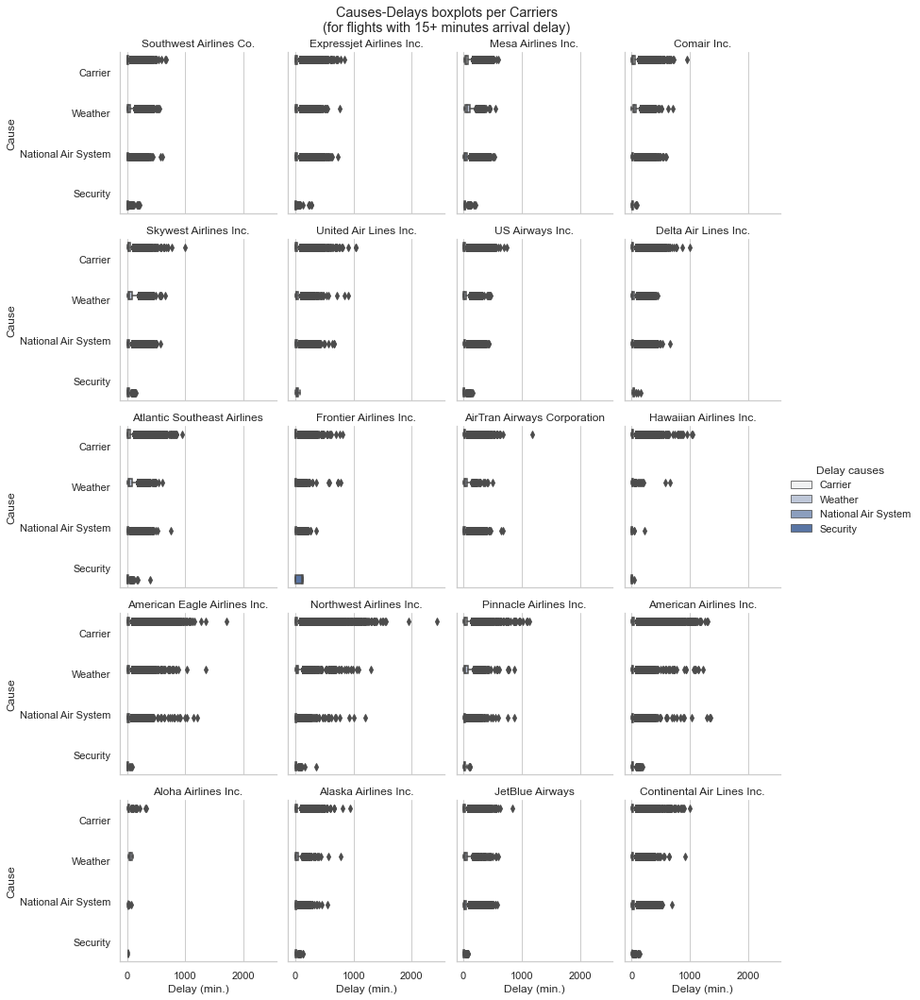

In [84]:
# delay-causes delays boxplots per Carriers for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Carrier',
                  
                  col_wrap=4,
                  #xlim=(0,250),
                  palette='muted')

g.fig.suptitle('Causes-Delays boxplots per Carriers\n(for flights with 15+ minutes arrival delay)')
g.map(sns.boxplot,'Minutes','Cause',order=order,hue=melt_15['Cause'],hue_order=order,orient='h')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes');
g.set_xlabels('Delay (min.)');#,color='blue',fontsize=15);


We can know little things from those narrow IQR boxes. However, we can know more about outliers ranges from these faceted boxplots. It will be of more convenience to have a look on the sampled data boxplots, or limited ranges.

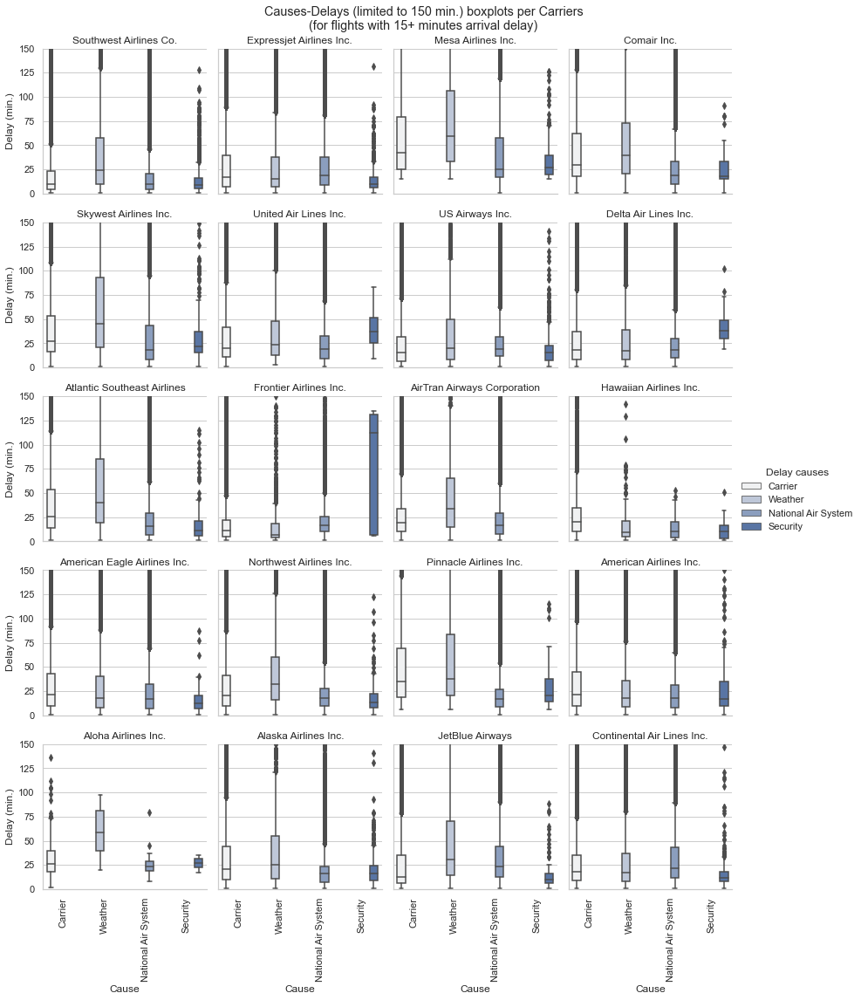

In [85]:
# delay-causes delays (limited to 150 min.) boxplots per Carriers for flights with 15+ minutes arrival delay
sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Carrier',
                  
                  col_wrap=4,
                  ylim=(0,150),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays (limited to 150 min.) boxplots per Carriers\n(for flights with 15+ minutes arrival delay)')
g.map(sns.boxplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);


The boxplots show that 'Weather'-delays had the highest medians in 11 from 20 carriers. 

We have got other some of notables from the plot, there weren't any 'Security'-delays in 'AirTran Airways Corporation' carrier. However, in 'Frontier Airlines Inc.', the highest median, as well the largest second and third quartiles ranges, are for 'Security'-delays against other delay-causes, in the carrier. 'Security'-delays in the same carrier had the largest range from the second to the third quartiles all over the faceted plots here.

I think it would be better to make one canvas plot combines all these boxplots for carriers on one 'X' axis.


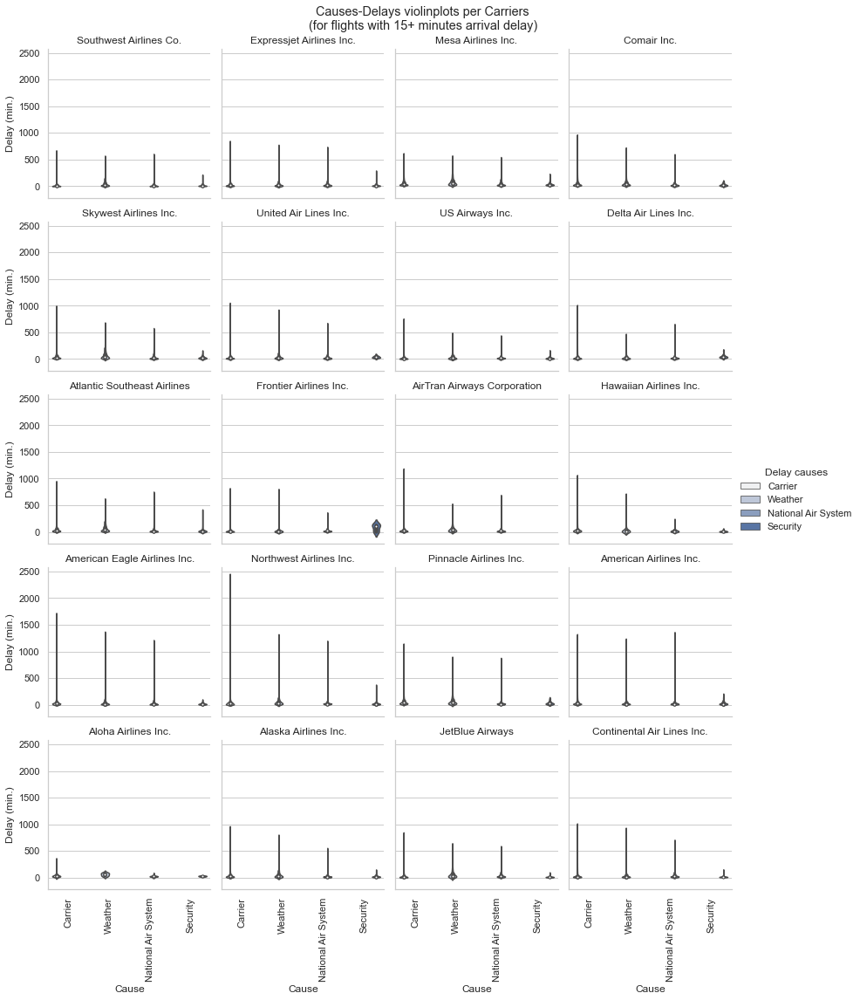

In [86]:
# Causes-delays violinplots per Carriers for flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Carrier',
                  
                  col_wrap=4,
                  #ylim=(0,100),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays violinplots per Carriers\n(for flights with 15+ minutes arrival delay)')
g.map(sns.violinplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);

We can know little from those small faceted violin plots. However, we can know more about ranges due to outliers from these faceted violinplots, like in case of carrier-delays in 'Northwest Airlines Inc.'. It will be of more convenience to have a look on the sampled data violinplots, or limiting the ranges.

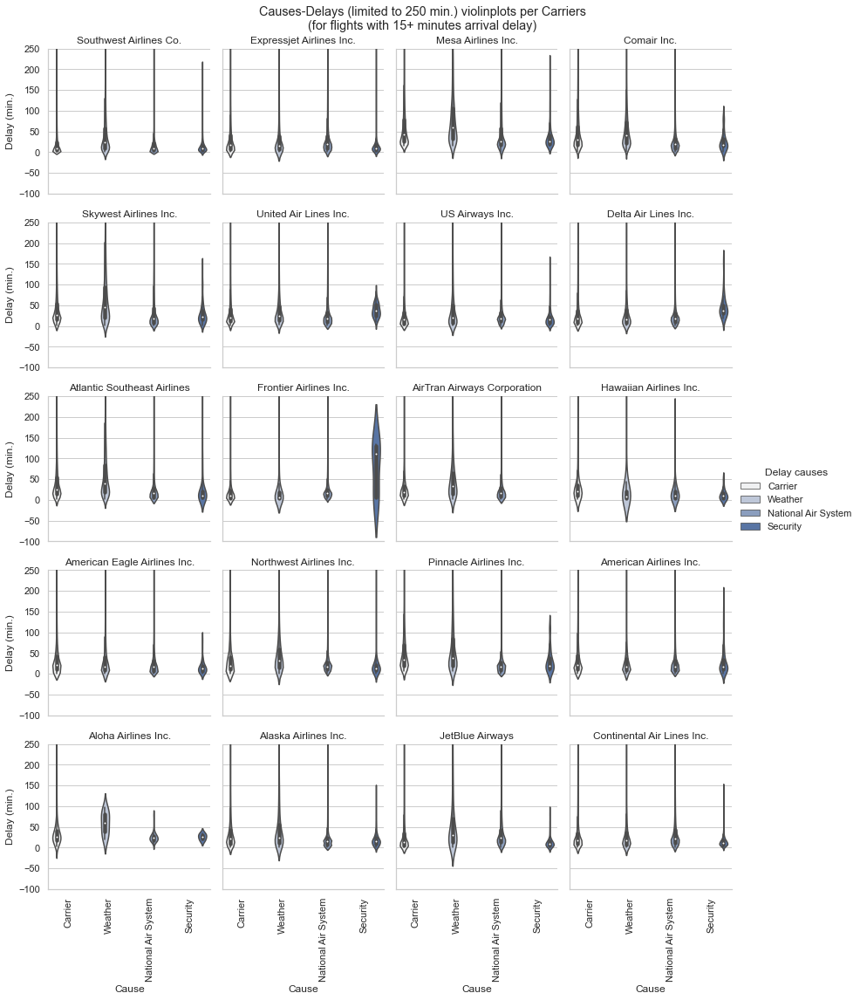

In [87]:
# Causes-delays (limited to 250 min.) violinplots per Carriers for flights with 15+ minutes arrival delay

sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_15,col='Carrier',
                  
                  col_wrap=4,
                  ylim=(-100,250),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays (limited to 250 min.) violinplots per Carriers\n(for flights with 15+ minutes arrival delay)')
g.map(sns.violinplot,'Cause','Minutes',order=order,hue=melt_15['Cause'],hue_order=order,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);

The vision here is clearer on the violins distributions, but it may be better to check the sample data.

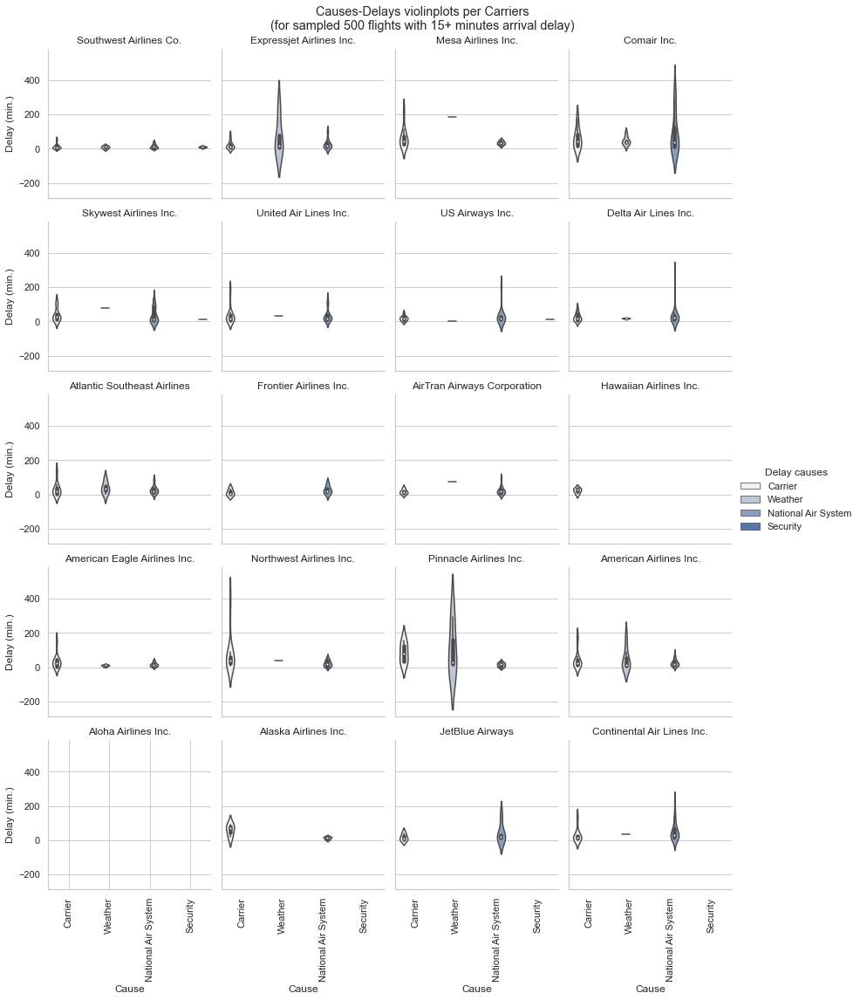

In [88]:
# # Causes-delays violinplots per Carriers for sampled
# # 500 flights with 15+ minutes arrival delay

# sns.set(style='whitegrid')

order = melt_15.Cause.unique()
g = sns.FacetGrid(data=melt_samp_15,col='Carrier',col_order = melt_15.Carrier.unique(),
                  
                  col_wrap=4,
                  #ylim=(-20,100),
                 )#palette='muted')

g.fig.suptitle('Causes-Delays violinplots per Carriers\n(for sampled 500 flights with 15+ minutes arrival delay)')
g.map(sns.violinplot,'Cause','Minutes',order=order,hue=melt_samp_15['Cause'],hue_order=order,)#,orient='v')#,palette='rocket_r')
g.set_titles('{col_name}')
g.add_legend(title = 'Delay causes')
g.set_xticklabels(rotation = 90)
g.set_ylabels('Delay (min.)');#,color='blue',fontsize=15);


# using catplot instead of FacetGrid directly

# sns.set(font_scale=1.19,style='whitegrid')
# g = sns.catplot(kind = 'violin',data=df_inv_15_samp,col='Carrier',col_order=df_inv_15.Carrier.unique(),col_wrap=5,
#                 y='ArrDelay',orient='v',
#                 size=3.5,
#                 gridspec_kws={'grid':1,'style':'whitegrid',})

# title = 'Arrival Delay (15+ minutes) violin plots per Carriers\nfor sampled 500 flights data'
# g.fig.suptitle(title + '\n(with vertical orientation using catplot)',y=1.05)

# g.set_titles('{col_name}');

Of sampled data, Weather-delays violins distributions are the highest at all within 'Pinnacle Airlines Inc.', and 'Expressjet Airlines Inc.' carriers. However, there may be a lack in representing all causes-delays data relatively, like the cases of security-delays in 'Mesa Airlines Inc.' and 'Comair Inc.' violin plots of sampled data.

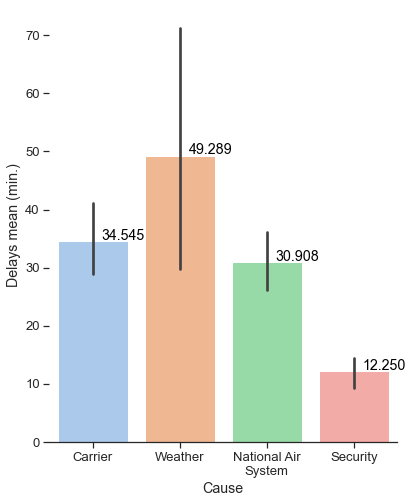

In [89]:
# bivarite bar plot for delay causes time means
# for the 500 sample data points (500 rows) from df_inv_15 

plt.figure(figsize=(15,8))
sns.set(font_scale=1.19,style='ticks')

ax = sns.barplot(data = melt_samp_15, x='Cause',y='Minutes', palette='pastel')

ax.set_box_aspect(5/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine(left=True)

plt.xlabel('Cause')
plt.ylabel('Delays mean (min.)')
#ytick = [0,3.5,4,5,10,15,20]
#plt.yticks(ytick,ytick)
#plt.grid(True)

# Recalculating the causes_means
means_15_samp = melt_samp_15.groupby('Cause').mean()

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct mean
    mean_15_samp = means_15_samp.loc[label.get_text(),'Minutes']

    # print the annotation just above the top of the bar
    plt.text(loc+.1, mean_15_samp+.2, s='{:0.3f}'.format(mean_15_samp), ha = 'left', color = 'black')

ax.set_xticklabels(causes);

From the bar plot of melted sample 'melt_samp_15' of 500 data points, we can find that weather-delays had the highest mean amongst other causes-delays. Carrier-delays had the second highest delays mean, then NAS's came third. At last, security-delays had the lowest delays mean.

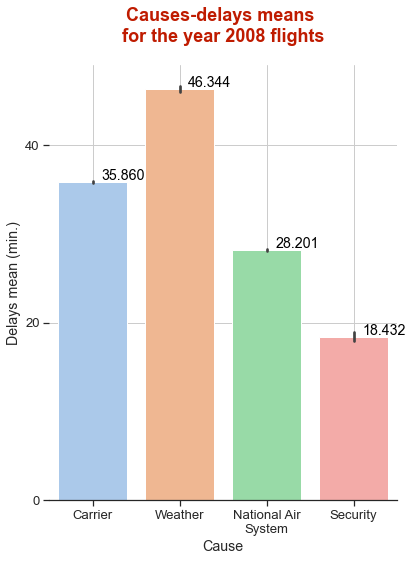

In [90]:
# bivarite bar plot for delay causes time means
# for all data points in df_inv_15 (1,524,733  rows)  [15 minutes or more arrival delays]

plt.figure(figsize=(15,8))
sns.set(font_scale=1.19,style='ticks')

ax = sns.barplot(data = melt_15, x='Cause',y='Minutes', palette='pastel')
ax.set_box_aspect(5/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine(left=True)
plt.title('Causes-delays means \nfor the year 2008 flights',fontsize=18,
          color='#BF1B00',weight='bold',y=1.04)
plt.xlabel('Cause')
plt.ylabel('Delays mean (min.)')


ytick = [0,20,40]
plt.yticks(ytick,ytick)
plt.grid(True)

# Recalculating means
means_15 = melt_15.groupby('Cause').mean()

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct mean
    mean_15 = means_15.loc[label.get_text(),'Minutes']

    # print the annotation just above the top of the bar
    plt.text(loc+.1, mean_15+.2, s='{:0.3f}'.format(mean_15), ha = 'left', color = 'black')

ax.set_xticklabels(causes);

From 'df_inv_15' dataframe, I melted delay-causes columns into 'melt_15', representing all flights data points with 15 min. or more arrival delay that had at least 1 minute delay due to one or more delay-causes represented on the bar plot.

As we saw for sampled points before, the same means order appears here also. We can find that weather-delays had the highest mean amongst other causes-delays. Carrier-delays had the second highest delays mean, then NAS's came third. At last, security-delays had the lowest delays mean.

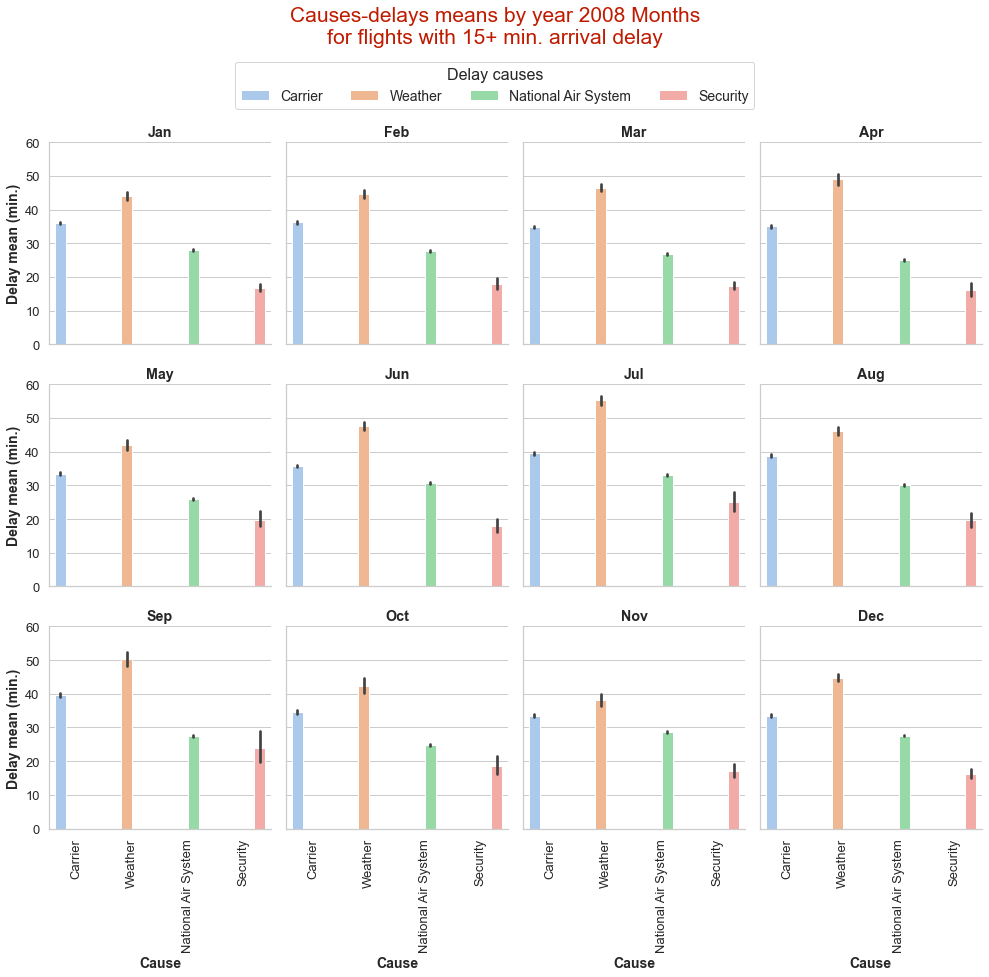

In [91]:
# # bivariate plots of Causes-delays means by Months for year 2008 flights with arrival delay of 15+ minutes
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='bar',
                data=melt_15,col='Month',
                col_wrap=4,
                x='Cause',order=order,
                y='Minutes',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,60))
               )

g.fig.suptitle('Causes-delays means by year 2008 Months\nfor flights with 15+ min. arrival delay',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.137)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(#causes,
                  rotation=90,fontsize=13,
                 )#,weight='bold'
g.set_ylabels('Delay mean (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

On the plot, it clearly shows that the 'Weather'-delays are the highest on average within different 2008 months, notably in 'Jul' and 'Sep'. Then 'Carrier'-delays, 'NAS' or national air system-delays, and 'Security'-delays at last, come in order respectively.

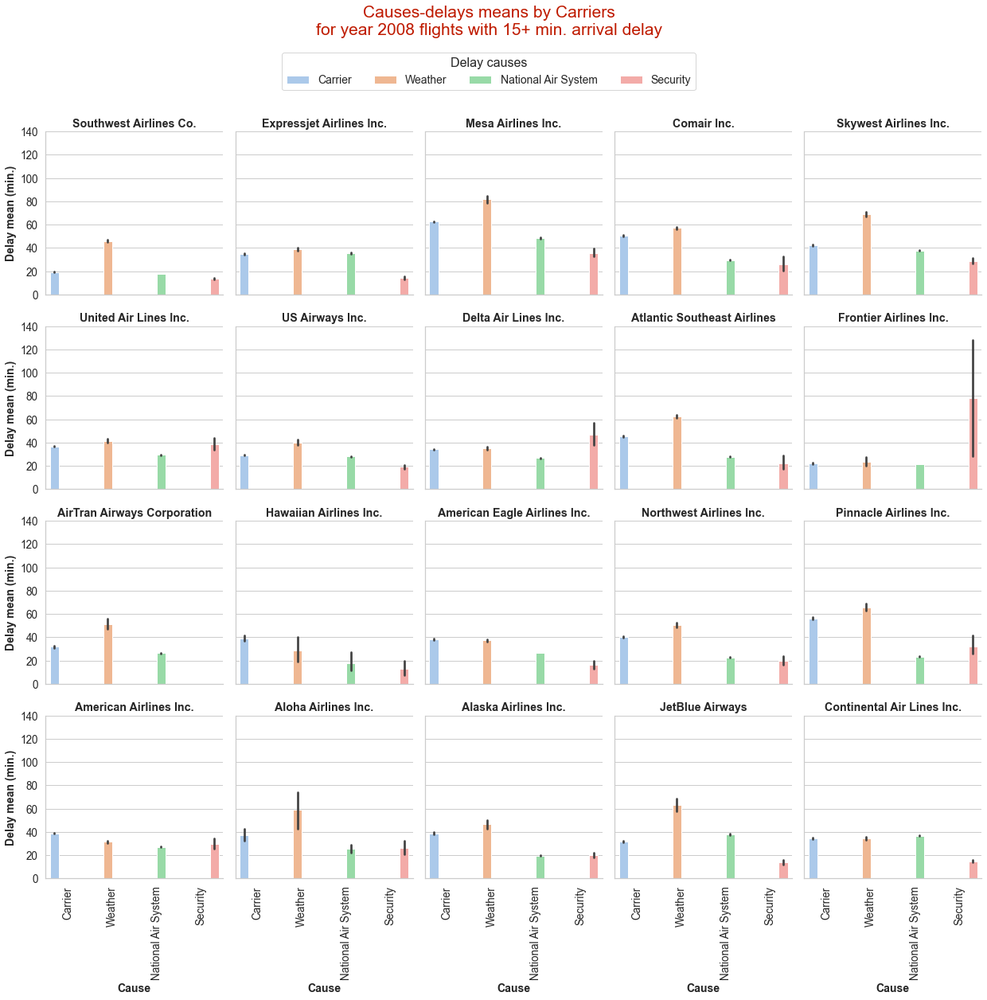

In [92]:
# # bivariate plots of Causes-delays means by Carriers for year 2008 flights with arrival delay of 15+ minutes
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='bar',
                data=melt_15,col='Carrier',
                col_wrap=5,
                x='Cause',order=order,
                y='Minutes',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,#facet_kws=dict(ylim=(0,60))
               )

g.fig.suptitle('Causes-delays means by Carriers\nfor year 2008 flights with 15+ min. arrival delay',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.125)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', 
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(#causes,
                  rotation=90,fontsize=13.5)#,weight='bold'
g.set_ylabels('Delay mean (min.)',weight='bold',fontsize=14)

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13.5);#fontsize=12,color='blue',weight='bold';

On the plot, it clearly shows that, in general, the 'Weather'-delays are the highest on average within almost the majority of carriers. Then, also in general , 'Carrier'-delays, 'NAS' or national air system-delays, and 'Security'-delays at last, come in order, except in few carriers.

Unlike the rule, 'Security'-delays were the highest on average within 'Frontier Airlines Inc.' and 'Delta Air Lines Inc.'. 'Security'-delays also may were the second or the third in other carriers, such as 'United Air Lines Inc.' and
'American Airlines Inc.'.

However, 'AirTran Airways Corporation' flights doesn't seem to be delayed due to security at all.

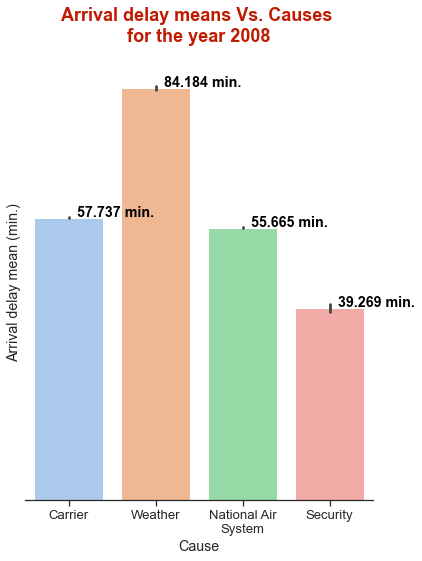

In [93]:
# bivarite bar plot for delay causes time means
# for all flights of 15 minutes or more arrival delays (1,524,733  rows) 

plt.figure(figsize=(15,8))
sns.set(font_scale=1.19,style='ticks')

ax = sns.barplot(data = melt_15, x='Cause',y='ArrDelay', palette='pastel')
ax.set_box_aspect(5/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine(left=True)
plt.title('Arrival delay means Vs. Causes \nfor the year 2008',fontsize=18,
          color='#BF1B00',weight='bold',y=1.04)
plt.xlabel('Cause')
plt.ylabel('Arrival delay mean (min.)')

#ytick = [0,3.5,4,5,10,15,20]
#plt.yticks(ytick,ytick)
#plt.grid(True)

plt.yticks([])

# Recalculating the causes_means
means_15 = melt_15.groupby('Cause').mean()

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct mean
    mean_15 = means_15.loc[label.get_text(),'ArrDelay']

    # print the annotation just above the top of the bar
    plt.text(loc+.1, mean_15+.2, s='{:0.3f} min.'.format(mean_15), ha = 'left', color = 'black',weight='bold')

ax.set_xticklabels(causes);

Here, I measure the total flights arrival delays means in 'df_inv_15' that had a delay due to one or more delay-causes
on the bar plot.

It clearly shows that flights that had weather-delays were probably to have the most arrival delays in general. In the second stage, flights with carrier-delays are more probably to arrive before weather-delayed flights. At third, National Air System-delays stand and the NAS-delayed flights are more probably to arrive earlier than the first both causes. At last, in general, security-delayed flights are more probably to arrive before other delayed flights.


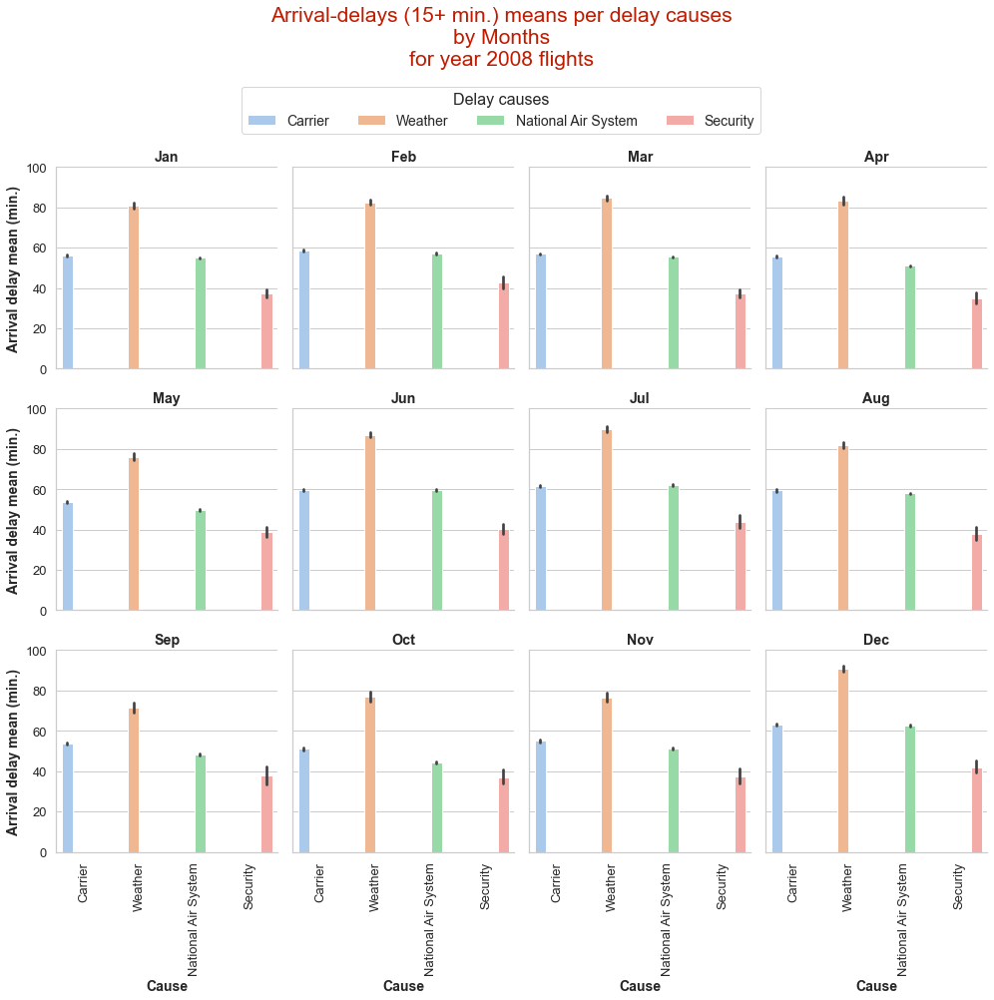

In [94]:
# # bivariate plots of Arrival-delays means per delay causes by Months for year 2008 flights with arrival delay of 15+ minutes
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='bar',
                data=melt_15,col='Month',
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,#facet_kws=dict(ylim=(0,60))
               )

g.fig.suptitle('Arrival-delays (15+ min.) means per delay causes\nby Months\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(#causes,
                  rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay mean (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

On the plot, on average amongst other causes, it clearly shows that the 'Weather' had the highest impact on flights arrival delays within different 2008 months. Then 'Carrier', 'NAS' or national air system, and 'Security' at last, come in order respectively in general, except for 'Jul' where 'Carrier' was third after 'NAS'.

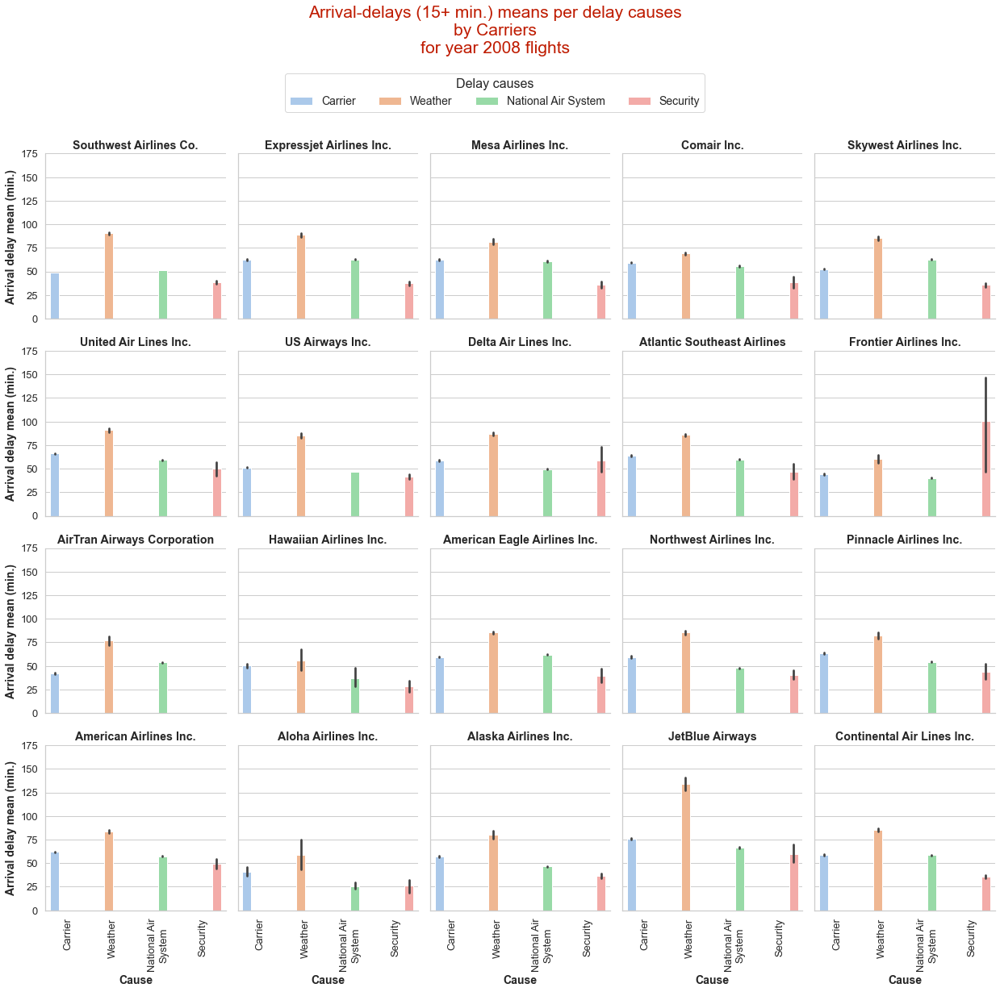

In [95]:
# # bivariate plots of Arrival-delays means per delay causes by Carriers for year 2008 flights with arrival delay of 15+ minutes
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='bar',
                data=melt_15,col='Carrier',
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,#facet_kws=dict(ylim=(0,60))
                )

g.fig.suptitle('Arrival-delays (15+ min.) means per delay causes\nby Carriers\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay mean (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

On the plot, on average amongst other causes, it clearly shows in general that, the 'Weather' had the highest impact on flights arrival delays within almost all carriers, except in case of 'Frontier Airlines Inc.' where probably by far,'Security' went up with the highest impact on flights arrival delays. Then, also on average, 'Carrier' and 'NAS' or national air system, are swapping the second and the third highest impacts, except in few carriers where 'Security' may exceed like in 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.

However, 'AirTran Airways Corporation' flights doesn't seem to be delayed due to security at all.

In [96]:
# preparing 'zeros_mask' for not counting ArrDelay with zero-causes delays in df_inv_15
delays_mask = df_inv_15['CarrierDelay'] + df_inv_15['WeatherDelay'] + df_inv_15['NASDelay'] + df_inv_15['SecurityDelay']
zeros_mask =(delays_mask).isin(zero_or_null)

# preparing 'zeros_mask' for not counting ArrDelay with zero-causes delays in df_inv_15_samp

samp_delays_mask =  df_inv_15_samp['CarrierDelay'] + df_inv_15['WeatherDelay'] + \
                    df_inv_15_samp['NASDelay'] + df_inv_15_samp['SecurityDelay']
samp_zeros_mask =(samp_delays_mask).isin(zero_or_null)

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/2063619563.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  g = sns.PairGrid(data = df_inv_15_samp[~samp_zeros_mask],


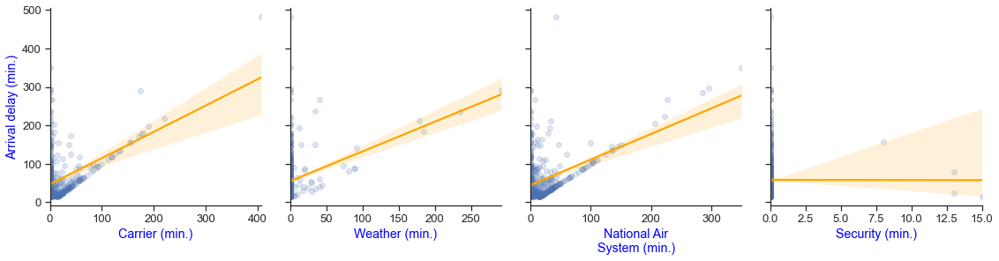

In [97]:
# bivariate plots of ArrDelay against delay causes                        ***** using sampling data for faster scattering
# for the 500 data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 300 minutes for causes and 400 minutes arrival delay

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~samp_zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
#g.set(xlim=(0,300),ylim=(0,400))
g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue')

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' (min.)',color='blue');

The scattering plot is for causes-delays against arrival delays within the sample of 500 data points, or 'df_inv_15_samp'

It shows some kind of linearity at some point about 50 minutes cause-delay for 'Carrier' and 'NAS' delays with moderate correlations to arrival delays. Also it shows a more spread range for carrier-delays overall, then 'NAS'-delays, and at third weather-delays with a weaker correlation to arrival delay. Security-delays doesn't seem to have a significant correlation to arrival delays, with a small distribution range compared to other delay-causes. 

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/1624003397.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],


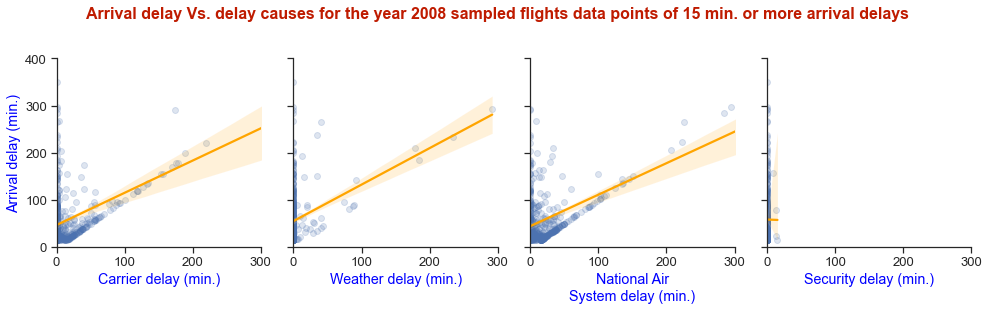

In [98]:
# bivariate plots of ArrDelay against delay causes
# for the 500 data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes

#sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=3.5)#height=3.3,aspect=.9)
suptitle = 'Arrival delay Vs. delay causes for the year 2008 sampled flights data points of 15 min. or more arrival delays'

plt.suptitle(suptitle,fontsize=16,color='#BF1B00',weight='bold',y=1.15)

g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
g.set(xlim=(0,300),ylim=(0,400))
g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue')

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (min.)',color='blue');

More polished version of the previous 'df_inv_15_samp' Paired Grid, with limited axes, and unified 'X' axis.

The plot shows the more stronger moderate correlation between arrival delays and carrier-delays, than the moderate one between arrival delays and NAS-delays.

In [99]:
# creating a function for generating different colored paired regplots

colors = (color for color in list(sns.color_palette()))

def my_reg(x,y,color=None,*args,**kwargs):
    color= next(colors)
    sns.regplot(x,y ,color=color,*args,**kwargs)
        
# ************************************************************************ previous work
# seaborn.pairplot() changing the color of each graph

#colors = iter(['xkcd:red purple', 'xkcd:pale teal', 'xkcd:warm purple',
#       'xkcd:light forest green', 'xkcd:blue with a hint of purple',
#       'xkcd:light peach', 'xkcd:dusky purple', 'xkcd:pale mauve',
#       'xkcd:bright sky blue', 'xkcd:baby poop green', 'xkcd:brownish',
#       'xkcd:moss green', 'xkcd:deep blue', 'xkcd:melon',
#       'xkcd:faded green', 'xkcd:cyan', 'xkcd:brown green',
#       'xkcd:purple blue', 'xkcd:baby shit green', 'xkcd:greyish blue'])

#colors = iter(['xkcd:sns.color_palette()[0]', 'xkcd:sns.color_palette()[1]', 'xkcd:sns.color_palette()[2]',
#               'xkcd:sns.color_palette()[3]', 'xkcd:sns.color_palette()[4]', 'xkcd:sns.color_palette()[5]',
#               'xkcd:sns.color_palette()[6]', 'xkcd:sns.color_palette()[7]', 'xkcd:sns.color_palette()[8]',
#               'xkcd:sns.color_palette()[9]'])
#colors = iter([sns.color_palette()[0],sns.color_palette()[1],sns.color_palette()[2],
#               sns.color_palette()[3],sns.color_palette()[4],sns.color_palette()[5],
#               sns.color_palette()[6],sns.color_palette()[7],sns.color_palette()[8],
#               sns.color_palette()[9]])

#colors.reset()
#colors = np.nditer([list(sns.color_palette())])#iter(sns.color_palette())

#def my_scatter(x,y, **kwargs):
#    kwargs['color'] = next(colors)
#    plt.scatter(x,y, **kwargs)

#def my_hist(x, **kwargs):
#    kwargs['color'] = next(colors)
#   plt.hist(x, **kwargs)

#iris = sns.load_dataset("iris")
#g = sns.PairGrid(iris)
#g.map_diag(my_hist)
#g.map_offdiag(my_scatter)

# * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * trying iterators
#itr.reset()
#lst = [1,2,3,4,5]
#itr = numpy.nditer([lst])itr.next()
#itr.finished
#itr.reset()
#next(itr)
#next(lst)

#colors = iter(list(sns.color_palette()))    ---- extracts points individually not the whole palette tri-tuple

#colors = np.nditer([list(sns.color_palette())])
#colors.next()
#next(colors)

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/1506443603.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: Futur

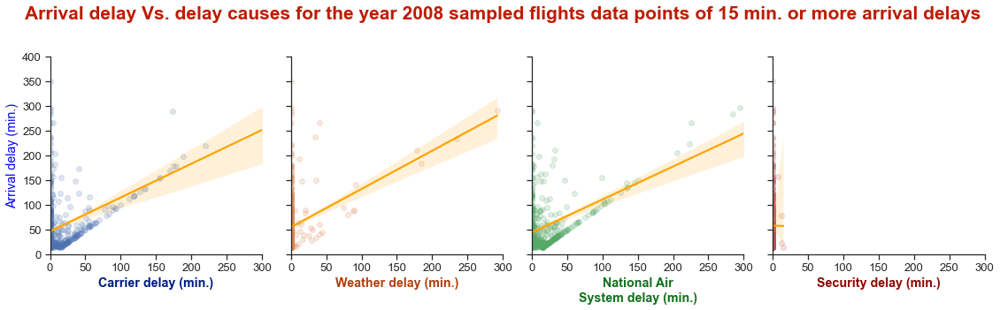

In [100]:
# creating a function for generating different colored paired regplots
colors = (color for color in sns.color_palette())

def my_reg(x,y,color=None,*args,**kwargs):
    color= next(colors)
    sns.regplot(x,y ,color=color,*args,**kwargs)
    
# bivariate plots of ArrDelay against delay causes for the 500 data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes ----------------- using PairGrid with grading delay causes colors

#sns.set(font_scale=1.19,style='ticks')
g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4,
                 palette=sns.color_palette())

suptitle = 'Arrival delay Vs. delay causes for the year 2008 sampled flights data points of 15 min. or more arrival delays'

plt.suptitle(suptitle,fontsize=21,color='#BF1B00',weight='bold',y=1.15)

g.map(my_reg,scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"})
g.set(xlim=(0,300),ylim=(0,400))

# labeling axis
g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue')
for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (min.)',color=sns.color_palette('dark')[i],weight='bold');

Colored version of the previous 'df_inv_15_samp' limited-axes Paired Grid.

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/2559357596.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\_decorators.py:36: Futur

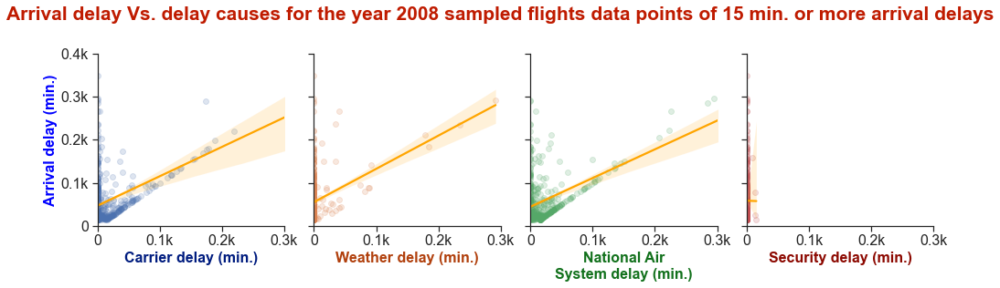

In [101]:
# bivariate plots of ArrDelay against delay causes for the 500 data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes ----------------- using PairGrid with grading delay causes colors

# creating a function for generating different colored paired regplots
colors = (color for color in sns.color_palette())

def my_reg(x,y,color=None,*args,**kwargs):
    color= next(colors)
    sns.regplot(x,y ,color=color,*args,**kwargs)
    
#sns.set(font_scale=1.19,style='ticks')
colors = (color for color in sns.color_palette())
g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=3.5,
                 palette=sns.color_palette())

suptitle = 'Arrival delay Vs. delay causes for the year 2008 sampled flights data points of 15 min. or more arrival delays'

plt.suptitle(suptitle,fontsize=21,color='#BF1B00',weight='bold',y=1.15)

g.map(my_reg,scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"})

# xticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][0].get_xticks()[1:]]
# yticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()[1:]]

g.set(#ylabel='Arrival delay (min.)',
      xlim=(0,300),ylim=(0,400),
      #yticks = np.arange(0,4.5,1)*100,
      #xticks=np.arange(0,3.5,1)*100,
      #yticklabels=yticklabels,
      #xticklabels=xticklabels,
     )

# labeling y axis and adjusting ytick labels
g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue',fontsize=16,weight='bold')
g.axes[0,0].set_yticks(ticks = np.arange(0,4.5,1)*100)
yticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()[1:]]
g.axes[0,0].set_yticklabels(labels = yticklabels,fontsize=16)

# labeling x axes and adjusting xtick labels
for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (min.)',color=sns.color_palette('dark')[i],fontsize=16,weight='bold')
    g.axes[0,i].set_xticks(ticks = np.arange(0,3.5,1)*100)
    xticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][i].get_xticks()[1:]]
    g.axes[0,i].set_xticklabels(xticklabels,fontsize=16);

More polished version of the previous 'df_inv_15_samp' limited-axes colored Paired Grid.

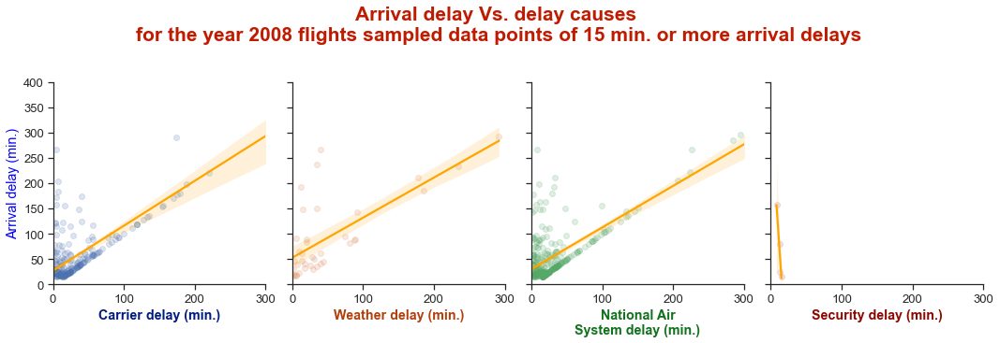

In [102]:
#  ------------------------------------ using FacetGrid with grading delay causes colors
g = sns.FacetGrid(data = melt_samp_15,
                  hue='Cause',
                  col = 'Cause',#palette=sns.color_palette(),
                  despine=True,col_wrap=4,
                  height=5,aspect=.75)#aspect=.77)

suptitle = 'Arrival delay Vs. delay causes \nfor the year 2008 flights sampled data points of 15 min. or more arrival delays'

plt.suptitle(suptitle,fontsize=21,color='#BF1B00',weight='bold')#,y=1.15)

g.map(sns.regplot,'Minutes','ArrDelay',scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
g.set(xlim=(0,300),ylim=(0,400))
g.set_titles('')
g.axes[0].set_ylabel('Arrival delay (min.)',color='blue')    #when using col_wrap your index is one dimensional
                                                            # if not then two dimensions

for i in range(4):
    g.axes[i].set_xlabel(causes[i]+ ' delay (min.)',color=sns.color_palette('dark')[i],weight='bold');

The same colored version of the previous 'df_inv_15_samp' limited-axes Paired Grid, using Facet Grid and 'melt_samp_15' instead, where causes-delays columns were melted with removing zeros and Nulls, into 'melt_samp_15' dataframe.

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/779458090.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],


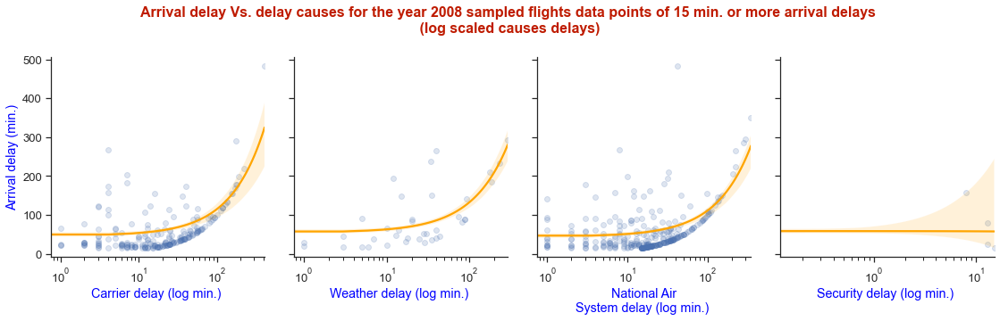

In [103]:
# bivariate plots of ArrDelay against delay causes
# for the 500 data points sample df_inv_15_samp (500 rows)
# with log scale

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
title = 'Arrival delay Vs. delay causes for the year 2008 sampled flights data points of 15 min. or more arrival delays' 

plt.suptitle(title+'\n (log scaled causes delays)',fontsize=16,color='#BF1B00',weight='bold',y=1.15)
g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
# log scale
g.set(xscale='log')#,yscale='log')

g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue')

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (log min.) ',color='blue');

The scattering plot here is also for causes-delays against arrival delays within the sample of 500 data points, or 'df_inv_15_samp', **after log scaling** causes-delays axes against original arrival delays.

The same previous findings appeared again but between the log scaled values and original arrival delays. However, the kind of linearity started about from 10<sup>1.1</sup> logarithmic minutes of delay-causes. 

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/1550254202.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],


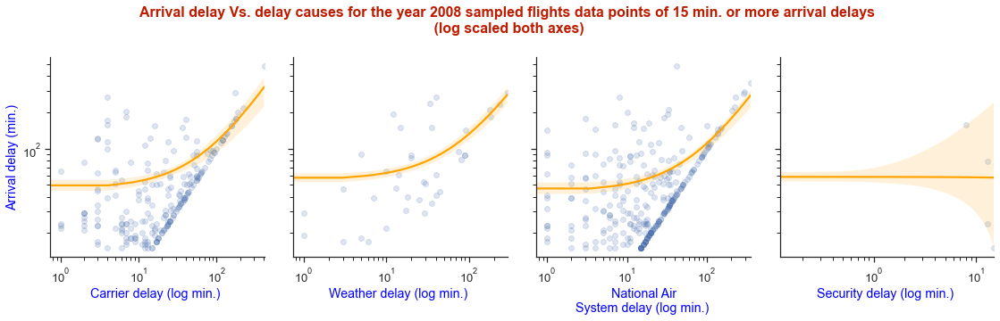

In [104]:
# bivariate plots of ArrDelay against delay causes
# for the 500 data points sample df_inv_15_samp (500 rows)
# with log scale

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
title = 'Arrival delay Vs. delay causes for the year 2008 sampled flights data points of 15 min. or more arrival delays' 

plt.suptitle(title+'\n (log scaled both axes)',fontsize=16,color='#BF1B00',weight='bold',y=1.15)
g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
# log scale
g.set(xscale='log',yscale='log')

g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue')

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (log min.) ',color='blue');

The scattering plot here is also for causes-delays against arrival delays within the sample of 500 data points, or 'df_inv_15_samp', **but after log scaling** both axes of arrival delays and delays of different delat causes

Almost the same previous findings appeared again but between the log scaled values. However, the kind of linearity started about from 10<sup>1.1</sup> logarithmic minutes of delay-causes.

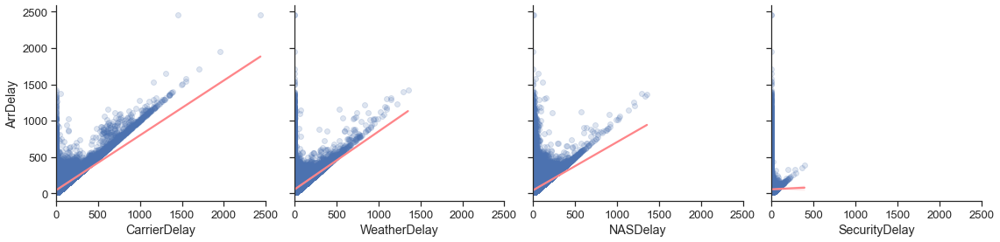

In [105]:
# bivariate plots of ArrDelay against delay causes
# for df_inv_15, the data points of 15 minutes ArrDelay or more (1,524,733  rows)


sns.set(font_scale=1.19,style='ticks')
g = sns.PairGrid(data = df_inv_15[~zeros_mask],
                 x_vars = delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True,
                 height=4)

g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "#fe8589"});
g.set(xlim=(0,2500));

This paired-grid scattering plot with unified axes represents causes-delays against arrival delays of the all extracted 1,524,733 flights, of 15 min. or more arrival delay, or 'df_inv_15' dataframe.

It assures some kind of linearity between arrival delays, and some point before 250 minutes of delays of different delay-causes. Also it shows 'Carrier' and NAS-delays with moderate correlations to arrival delays, and also a more spread range for carrier-delays overall, even than NAS-delays which come secondly and with higher frequencies of lower values, and at third weather-delays with a weaker correlation to arrival delay. Security-delays seems not to have a significant correlation to arrival delays, with a small distribution range compared to other delay-causes.

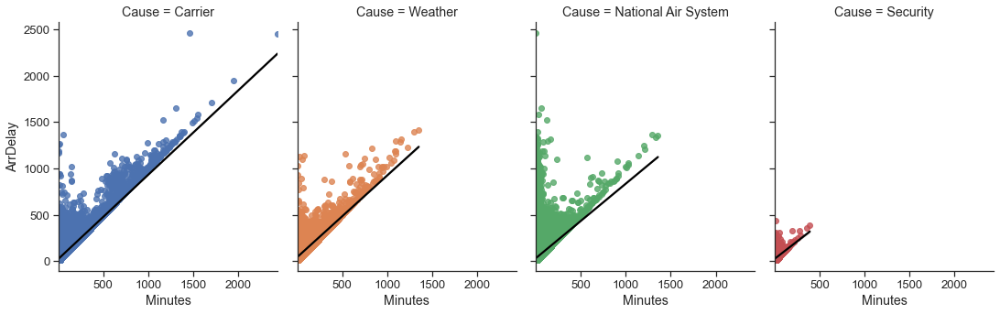

In [106]:
#  ------------------------------------ using FacetGrid with grading delay causes colors

g = sns.FacetGrid(data = melt_15 , col='Cause',hue = 'Cause',
                  height = 5,aspect=.77) #,col_wrap=2)
g.map(sns.regplot, 'Minutes','ArrDelay',line_kws={"color": "black"})
#g.add_legend()

Colored version of the last 'df_inv_15' unified-axes Paired Grid, using Facet Grid and 'melt_15' instead, where causes-delays columns were melted with removing zeros and Nulls, into 'melt_15' dataframe.

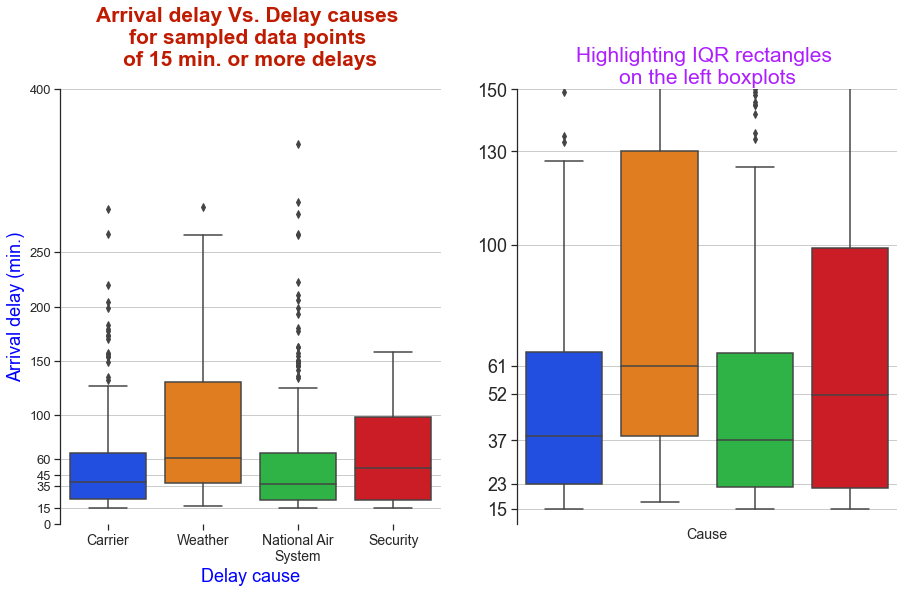

In [107]:
# boxplot of ArrDelay against delay causes
# for the 500 data points sample df_inv_15_samp (500 rows)

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= melt_samp_15,
                 y='ArrDelay',x='Cause',palette='bright')
plt.title('Arrival delay Vs. Delay causes \nfor sampled data points \nof 15 min. or more delays',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
yticks=[0,15,35,45,60,100,150,200,250,400]
plt.yticks(yticks,yticks)

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
ax.set_ylim([0,400])
ax.set_xticklabels(causes)
plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('Delay cause',fontsize=18,color='blue')
plt.yticks(fontsize=13)
plt.xticks(fontsize=14)
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 

sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= melt_samp_15,
                 y='ArrDelay',x='Cause',palette='bright')

sns.despine(bottom=True)
plt.yticks(fontsize=18)
ax.set_yticks([15,23,37,52,61,100,130,150,200,250])
ax.set_ylim([10,150])

ax.grid(True,axis ='y');
ax.set_xticks([])

plt.title('Highlighting IQR rectangles \non the left boxplots',fontsize=21,color='#AD1FFF')
plt.ylabel('')
plt.subplots_adjust(wspace=.2);

The boxplots are for arrival delays given by delay-causes within the sample of 500 data points of 15+ minutes arrival delay, or 'df_inv_15_samp', after melting delay-causes columns, to get at last 'melt_samp_15' without rows with nulls or zero minutes delay per the different causes.

They show a higher median and a more third quartile range for arrival delays due to 'Weather' than all other causes. The surprising here (and this was a weird point when checking the sample), is the higher median of about 52 minutes for arrival-delays due to 'Security' at the second stage after 'Weather', exceeding arrival-delays medians due to 'Carrier' and 'NAS'. 

We may need to revise all data points to investigate more about that.

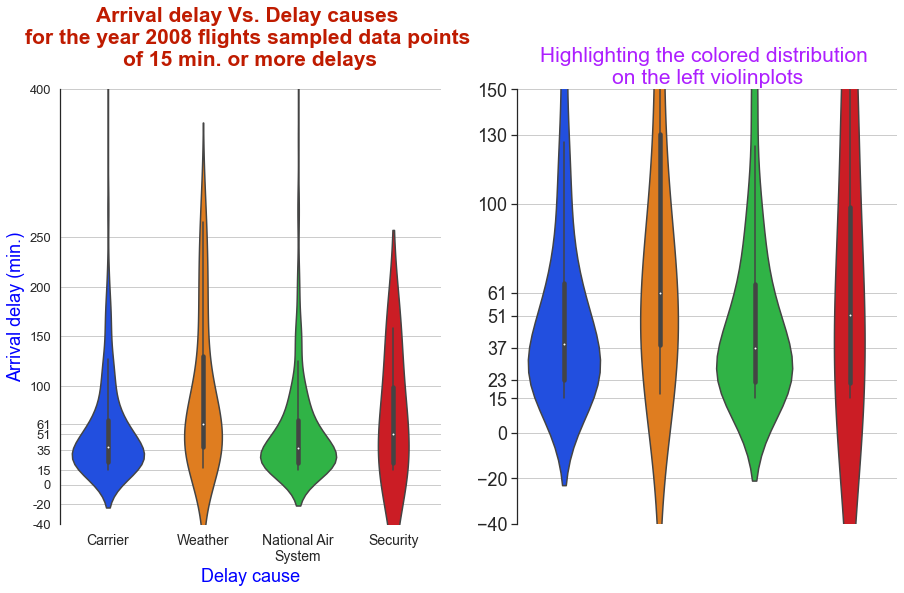

In [108]:
# bivariate boxplots of ArrDelay against delay causes
# for the 500 data points sample df_inv_15_samp (500 rows)

plt.figure(figsize=(15,8))
plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main violinplot
ax = sns.violinplot(data= melt_samp_15,
                 y='ArrDelay',x='Cause',palette='bright')
sns.despine(left=True)

plt.title('Arrival delay Vs. Delay causes \nfor the year 2008 flights sampled data points \nof 15 min. or more delays',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('Delay cause',fontsize=18,color='blue')

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

ax.set_ylim([-40,400])
yticks=[-40,-20,0,15,35,51,61,100,150,200,250,400]
plt.yticks(yticks,yticks,fontsize=13)

ax.grid(True,axis ='y')

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 


# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_samp_15,
                 y='ArrDelay',x='Cause',palette='bright')

sns.despine(bottom=True)
plt.title('Highlighting the colored distribution \non the left violinplots',fontsize=21,color='#AD1FFF')

plt.xlabel('',fontsize=18,weight='bold')
plt.ylabel('')

ax.set_xticks([])

plt.yticks(fontsize=18)
ax.set_yticks([-40,-20,0,15,23,37,51,61,100,130,150])
ax.set_ylim([-40,150])

ax.grid(True,axis ='y')
plt.subplots_adjust(wspace=.2);

The violinplots are for arrival delays given by delay-causes within the sampled and melted data at the previous two cells.

They indicate higher median (which is about 60 minutes) with a wider distribution for arrival delays due to weather, than other delay causes, from about 200 minutes to about 350 minutes. However, arrival delays due to 'Carrier' and 'NAS' had much more distributions around and below their lower-medians, indicating the higher frequencies of lower-values of arrival-delays due to both of those delay causes.

The surprising here too when checking the sample, is about arrival delays due to 'Security'. The plot show that they had the largest distribution from about 100 to 200 minutes, exceeding arrival delays distributions in the same range for all other delay causes.

I think we may need to investigate the whole points delays to see if that was true.

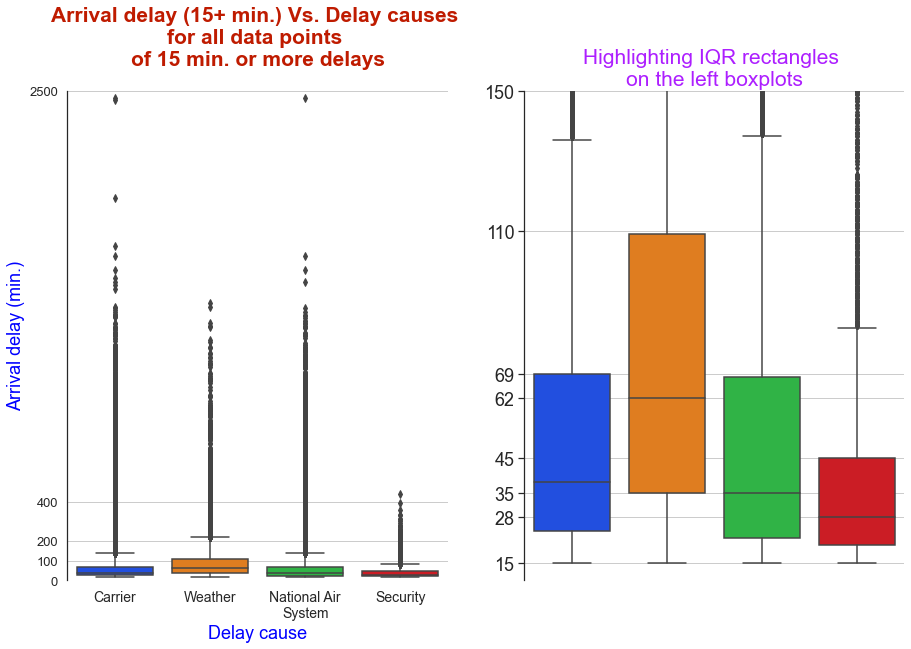

In [109]:
# boxplot of ArrDelay against delay causes
# for all data points df_inv_15 (1,524,733 rows)

plt.figure(figsize=(15,9))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= melt_15,
                 y='ArrDelay',x='Cause',palette='bright')
plt.title('Arrival delay (15+ min.) Vs. Delay causes \nfor all data points \nof 15 min. or more delays',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
yticks=[0,100,200,400,2500]
plt.yticks(yticks,yticks)

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
ax.set_ylim([0,2500])
#plt.yscale('log')
ax.set_xticklabels(causes)
plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('Delay cause',fontsize=18,color='blue')
plt.yticks(fontsize=13)
plt.xticks(fontsize=14)
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 

sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= melt_15,
                 y='ArrDelay',x='Cause',palette='bright')

sns.despine(bottom=True)

plt.title('Highlighting IQR rectangles \non the left boxplots',fontsize=21,color='#AD1FFF')
plt.xlabel('',fontsize=18)
plt.ylabel('')

plt.yticks(fontsize=18)
ax.set_yticks([15,28,35,45,62,69,110,150])
ax.set_ylim([10,150])
ax.set_xticks([])

ax.grid(True,axis ='y');

plt.subplots_adjust(wspace=.2);

The boxplots here are for arrival delays given by delay-causes, but for all delayed flights data points of 15+ minutes arrival delay, or 'df_inv_15', after melting delay-causes columns, to get at last 'melt_15' without rows with nulls or zero minutes delay per the different causes.

The same finding appears again here as when the data sample checked before, a higher median with a more third quartile range for arrival delays due to 'Weather' than all other causes. Arrival delays due to 'Carrier and NAS' were the most to reach higher outliers values in general. Probably, this made them to have a wider general ranges because of outliers. However, arrival delays due to weather still have the highest median with a larger third quartile range as stated before.

But unlike when checking the sample, the data points population plots here show arrival-delays due to 'Security' have lower median, ranges, as well outliers, than arrival-delays due to other delay-causes, unlike the finding before, and I think the result here is more reasonable in general.

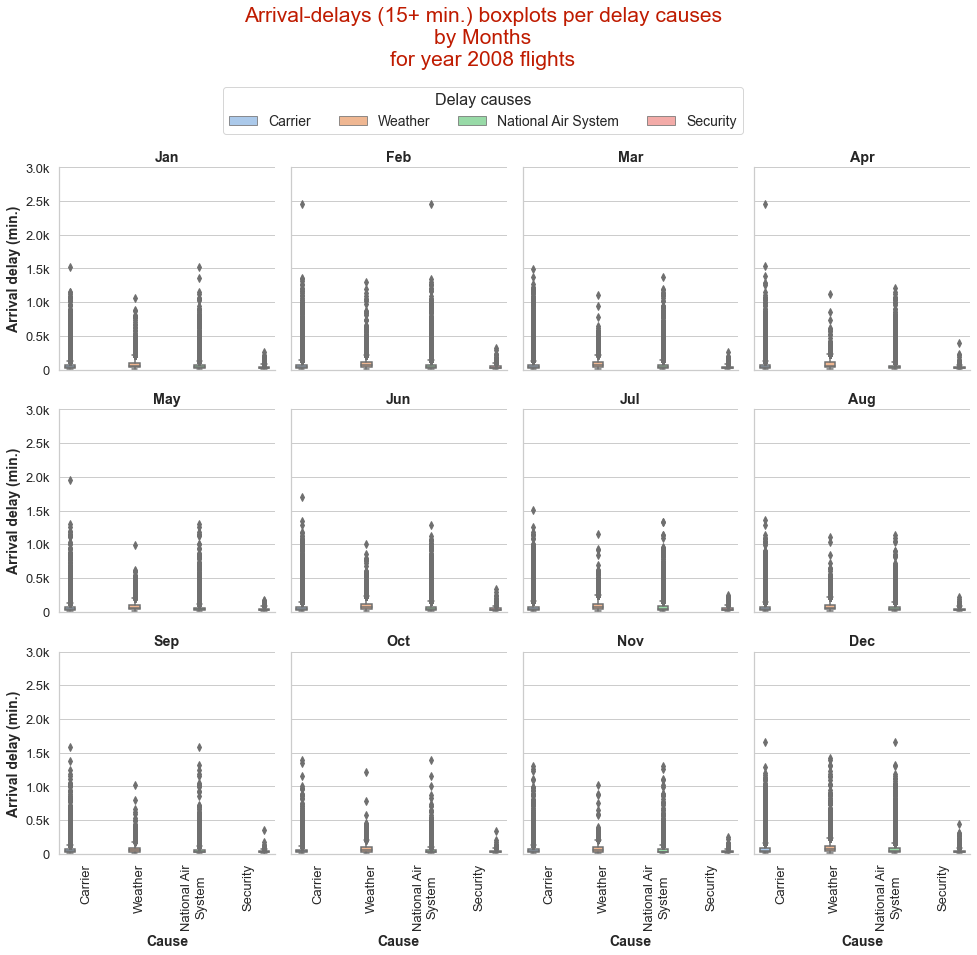

In [110]:
# # bivariate plots of Arrival-delays (15+ min.) boxplots per delay causes by Months for year 2008 flights
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='box',
                data=melt_15,col='Month',
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,3000))
               )

g.fig.suptitle('Arrival-delays (15+ min.) boxplots per delay causes\nby Months\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

We can know little things from those narrow IQR boxes. However, we can know more about outliers ranges from these faceted boxplots. It will be of more convenience to have a look on the sampled data boxplots, or limited ranges.

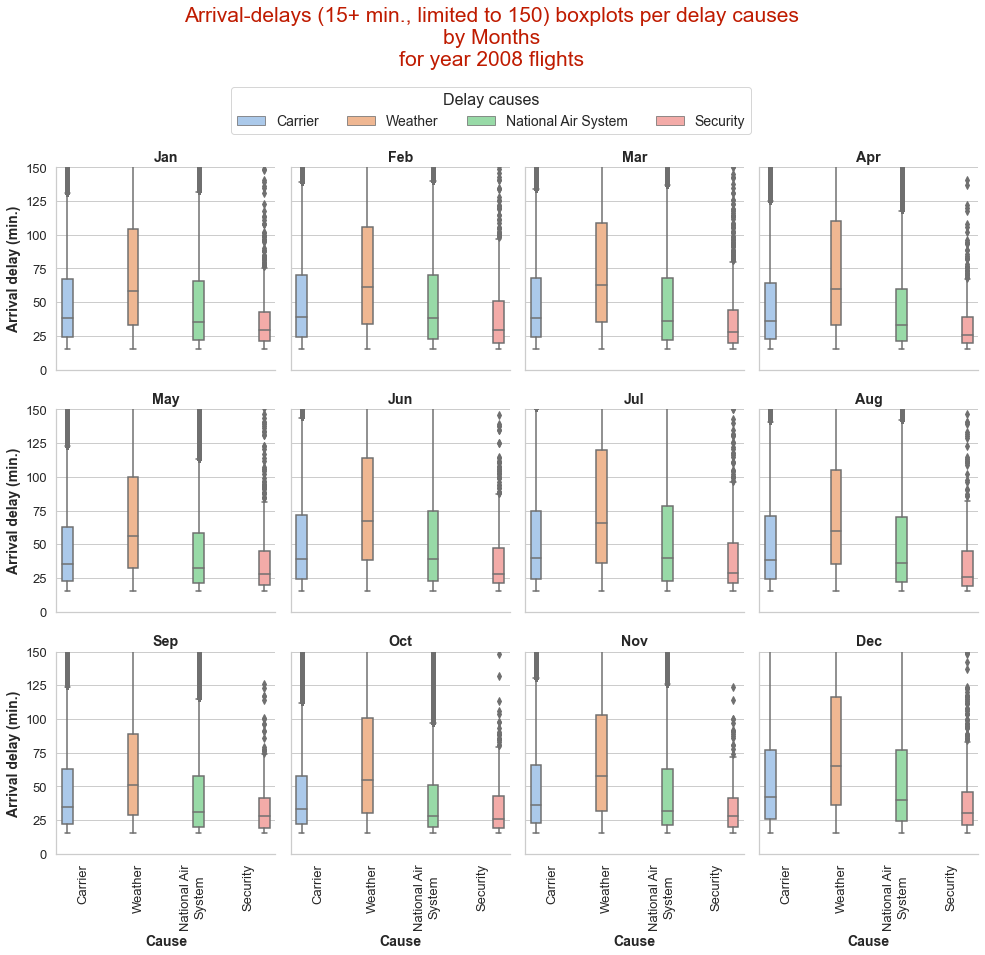

In [111]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) boxplots  per delay causes by Months for year 2008 flights
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='box',
                data=melt_15,col='Month',
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,150))
               )

g.fig.suptitle('Arrival-delays (15+ min., limited to 150) boxplots per delay causes\nby Months\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

In [112]:
# investigating ArrDelay mean per delay causes for 'Jun' and 'Jul'
melt_15[melt_15.Month.isin(['Jun','Jul'])].groupby(['Month','Cause'])['ArrDelay'].median().dropna().to_frame('ArrDelay mean')

ArrDelay mean
Month Cause                             
Jun   Carrier                       39.0
      National Air System           39.0
      Security                      28.0
      Weather                       67.0
Jul   Carrier                       40.0
      National Air System           40.0
      Security                      29.0
      Weather                       66.0

On the plot, amongst other causes, it clearly shows that flights arrival delays due to 'Weather' had the highest medians, with the widest third quartile ranges starting from those medians, within all 2008 months. Then 'Carrier', 'NAS' or national air system, and 'Security'-delays at last, come in order respectively in general, where it differed for 'Jun', and 'Jul' when the median of arrival-delays due to 'Carrier' was equal to arrival-delays' median due to 'NAS', for both months.

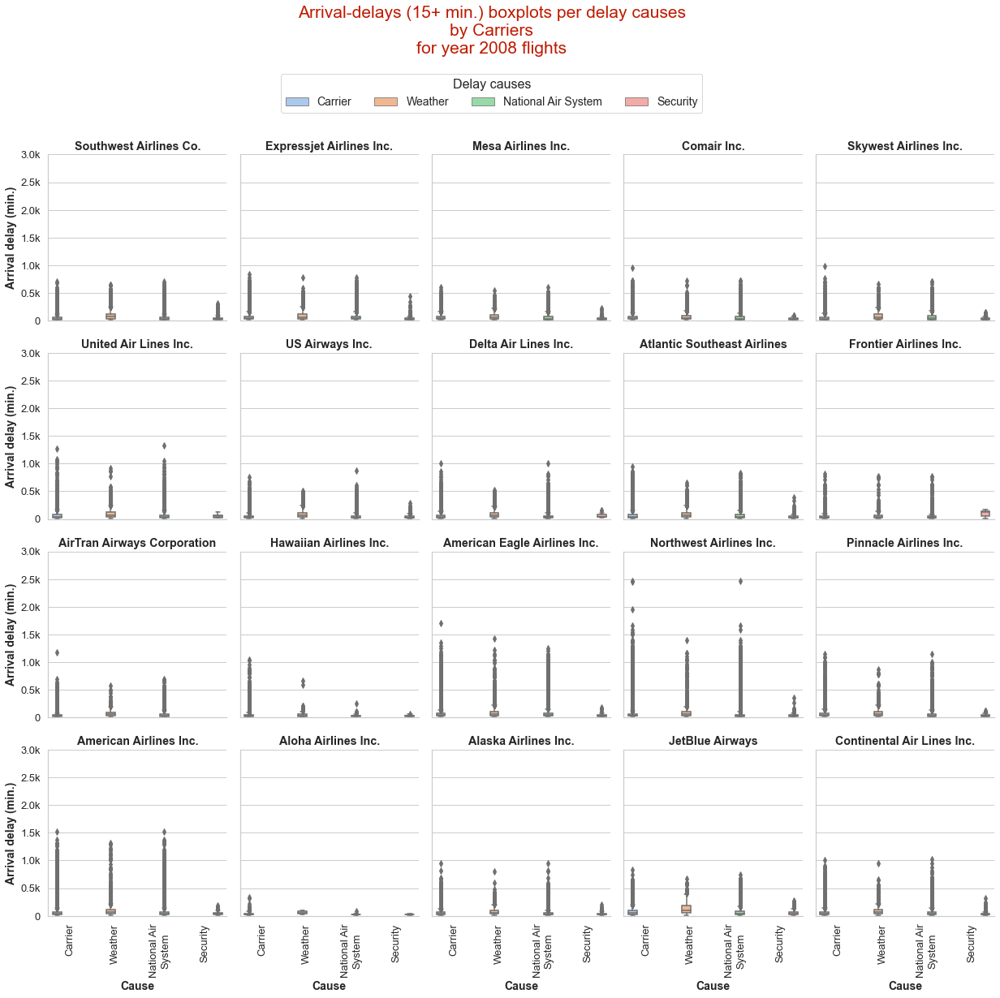

In [113]:
# # bivariate plots of Arrival-delays (15+ min.) boxplots per delay causes by Carriers for year 2008 flights 
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='box',
                data=melt_15,col='Carrier',
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,3000))
                )

g.fig.suptitle('Arrival-delays (15+ min.) boxplots per delay causes\nby Carriers\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

We can know little things from those narrow IQR boxes. However, we can know more about outliers ranges from these faceted boxplots. It will be of more convenience to have a look on the sampled data boxplots, or limited ranges.

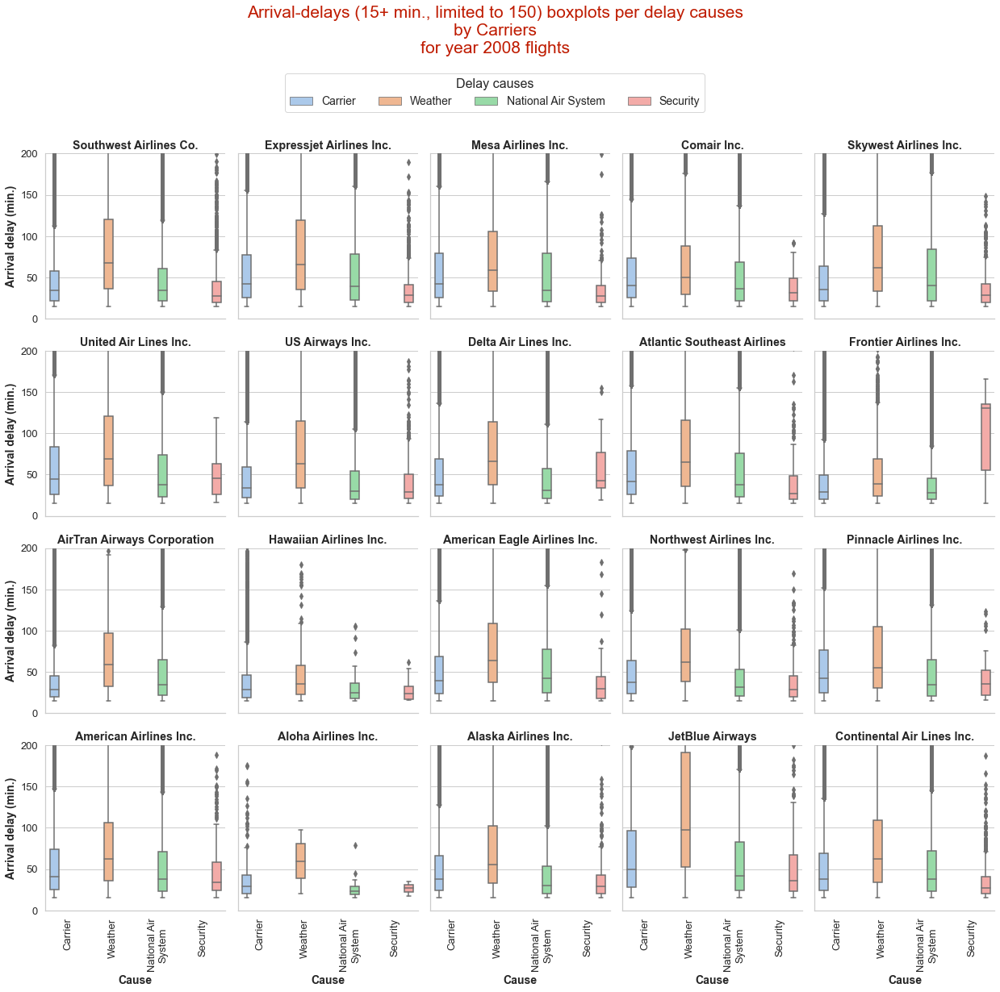

In [114]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) boxplots  per delay causes by Carriers for year 2008 flights
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='box',
                data=melt_15,col='Carrier',
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,200))
                )

g.fig.suptitle('Arrival-delays (15+ min., limited to 150) boxplots per delay causes\nby Carriers\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
#ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

On the plot, amongst other causes, it clearly shows in general that, flights arrival delays due to 'Weather' had the highest medians, with the widest third quartile ranges starting from those medians, within almost all carriers, notably in 'JetBlue Airways', except in case of 'Frontier Airlines Inc.' where  flights arrival delays due to 'Security' went up with the highest median and the widest second quartile range. Then, also in general, arrival delays due to 'Carrier' and 'NAS' or national air system, were swapping the second and the third highest medians, except in few carriers where arrival delays due to 'Security' may had greater medians like in 'United Air Lines Inc.', 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.

As before, 'AirTran Airways Corporation' flights doesn't seem to be delayed due to security at all.

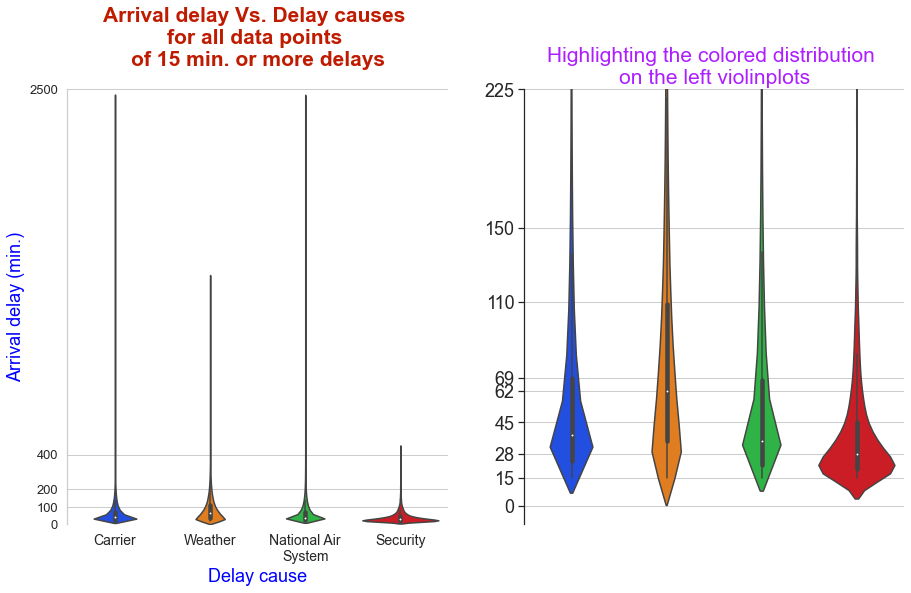

In [115]:
# bivariate violinplots of ArrDelay against delay causes
# for all data points df_inv_15 (1,524,733 rows)

plt.figure(figsize=(15,8))
plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main violinplot
ax = sns.violinplot(data= melt_15,
                 y='ArrDelay',x='Cause',palette='bright')
yticks=[0,100,200,400,2500]
plt.yticks(yticks,yticks)
plt.title('Arrival delay Vs. Delay causes \nfor all data points \nof 15 min. or more delays',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)

#ax.set_yticks([0,35,45,50,60,100,150,200,250,400])
ax.set_ylim([0,2500])
ax.set_xticklabels(causes)
plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('Delay cause',fontsize=18,color='blue')
plt.yticks(fontsize=13)
plt.xticks(fontsize=14)
#ax.set_yticklabels([0,30,33,35,36,40,50,60,100,150,200,250,400])

#leg = ax.legend(['Carrier','Weather','National Air System','Security'],
#                loc=1,bbox_to_anchor =(1.7,-0.1),ncol=4)
#for line in leg.get_lines():
#    line.set_linewidth(7.0)
#   lgd.set_color('black') 

sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_15,
                    y='ArrDelay',x='Cause',palette='bright')

sns.despine(bottom=True)
plt.title('Highlighting the colored distribution \non the left violinplots',fontsize=21,color='#AD1FFF')

plt.xlabel('',fontsize=18,weight='bold')
plt.ylabel('')
ax.set_ylim([-10,225])
plt.yticks(fontsize=18)
ax.set_yticks([0,15,28,45,62,69,110,150,225])
ax.set_xticks([])

ax.grid(True,axis ='y');
plt.subplots_adjust(wspace=.2);

The violinplots here are for arrival delays given by delay-causes, within the melted population data of delayed flights at the previous two cells.

They indicate higher median (which is about 62 minutes) with a wider distribution for arrival delays due to weather, than other delay causes, from about 55 minutes to about 225 minutes. However, arrival delays due to 'Carrier' and 'NAS' had much more distributions around and below their lower-medians, indicating the higher frequencies of lower-values of arrival-delays due to both of those delay causes.

Now, by investigating the data population, the surprising findings about arrival delays due to 'Security' from checking the sample is gone. The plot show here that they had the lowest median with the largest distribution around and below this lowest median.

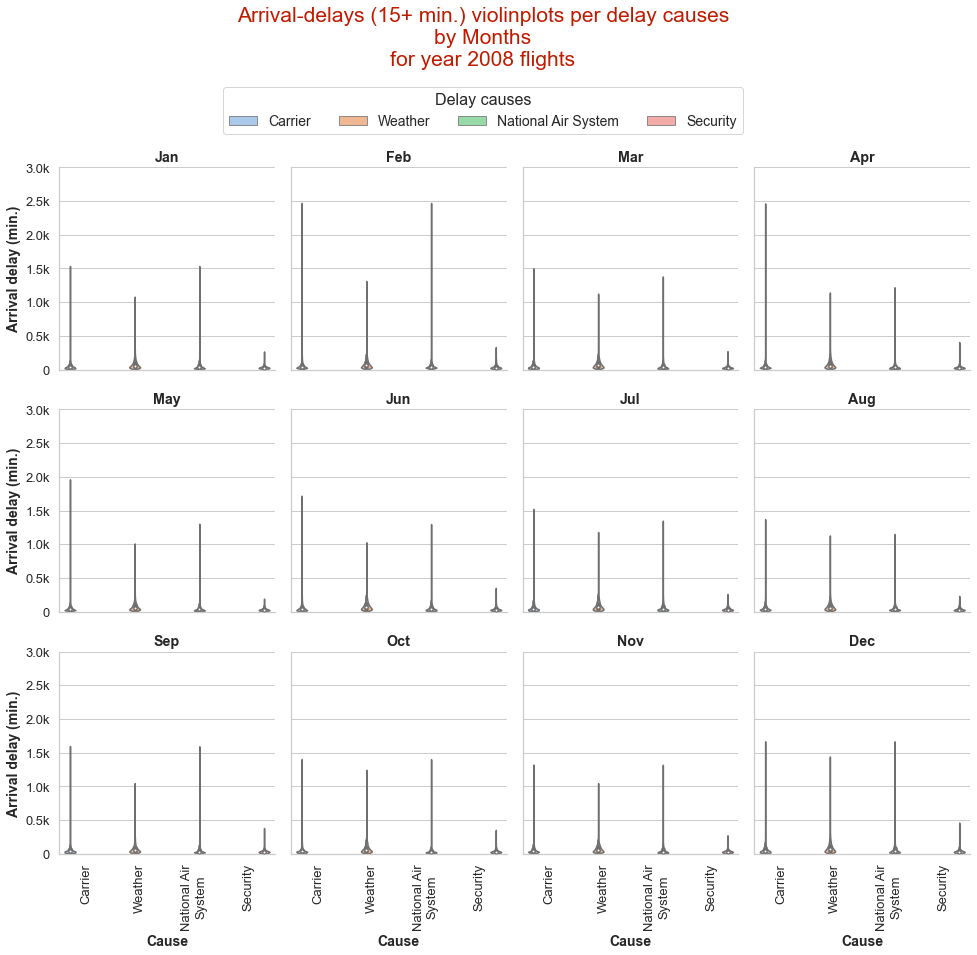

In [116]:
# # bivariate plots of Arrival-delays (15+ min.) violinlots per delay causes by Months for year 2008 flights
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='violin',
                data=melt_15,col='Month',
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,3000))
               )

g.fig.suptitle('Arrival-delays (15+ min.) violinplots per delay causes\nby Months\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

We can know little from those small faceted violin plots. However, we can know more about ranges due to outliers from these faceted violinplots. It will be of more convenience to have a look on the sampled data violinplots, or limiting the ranges.

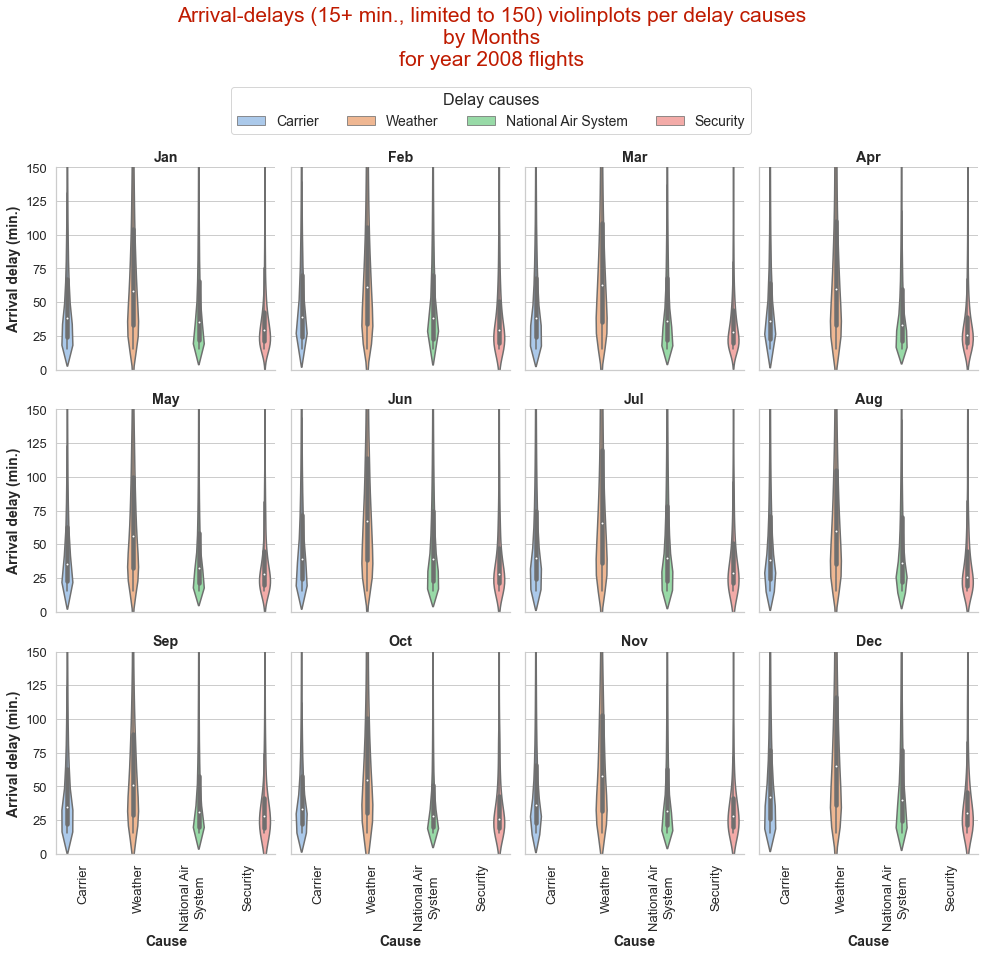

In [117]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) violinplots  per delay causes by Months for year 2008 flights 
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='violin',
                data=melt_15,col='Month',
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,150))
               )

g.fig.suptitle('Arrival-delays (15+ min., limited to 150) violinplots per delay causes\nby Months\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

The vision here is clearer on the violins distributions, as well it could be better to check the sample data.

However here from the faceted violin plots, arrival delays due to 'Weather' seem to have much more higher medians and more greater values distributions, than other arrival delays along all months. Unlike arrival delays due to 'Carrier' or 'NAS' which had more lower-medians, and more lower-values distributions.

As usual for all months, arrival delays due to 'Security' had the lowest medians with much of lower-values distributed under the medians.

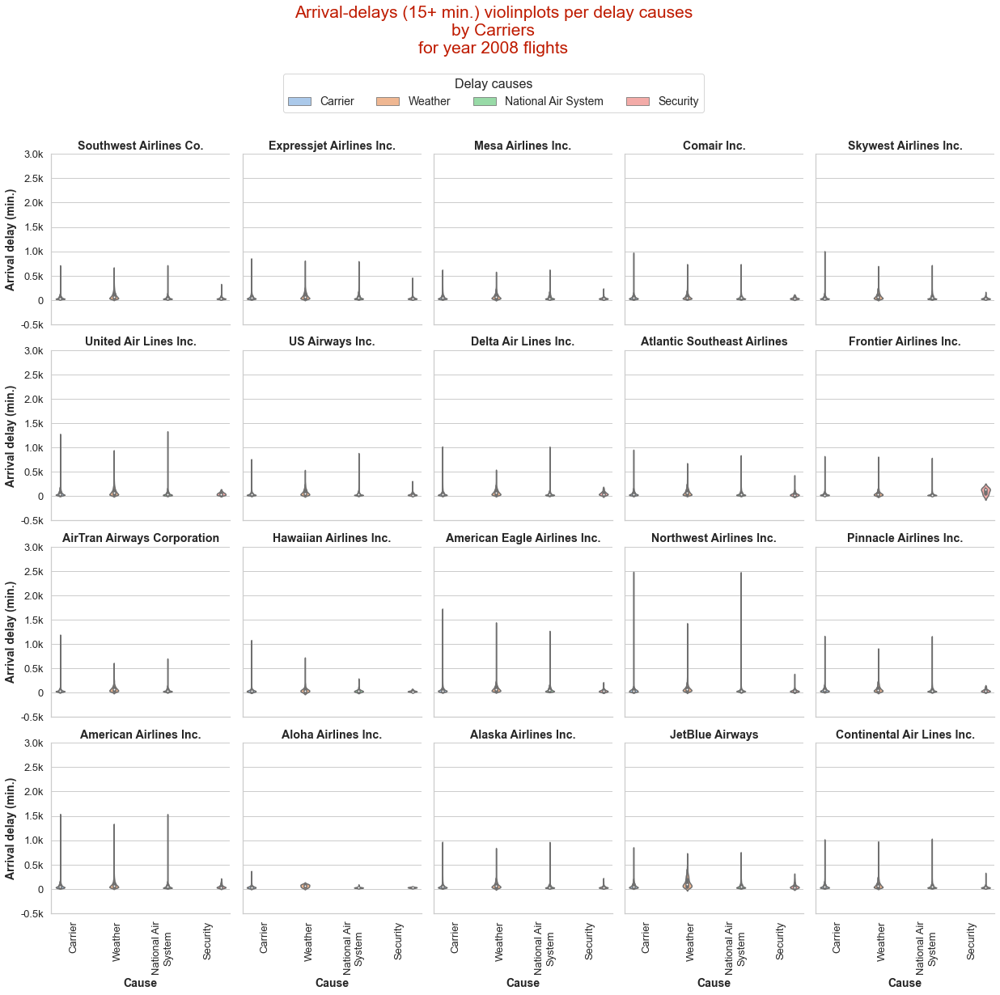

In [118]:
# # bivariate plots of Arrival-delays (15+ min.) violinplots per delay causes by Carriers for year 2008 flights 
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='violin',
                data=melt_15,col='Carrier',
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,#facet_kws=dict(ylim=(0,3000))
                )

g.fig.suptitle('Arrival-delays (15+ min.) violinplots per delay causes\nby Carriers\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

#ytickslabels = (g.axes[0].get_yticks()).astype('int')
#ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
ytickslabels = [str(n/1000) + 'k' for n in g.axes[0].get_yticks()]
ytickslabels = [label.replace('0.0k','0') for label in ytickslabels]
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

We can know little from those small faceted violin plots. However, we can know more about ranges due to outliers from these faceted violinplots, like in case of carrier-delays in 'Northwest Airlines Inc.'. It will be of more convenience to have a look on the sampled data violinplots, or limiting the ranges.

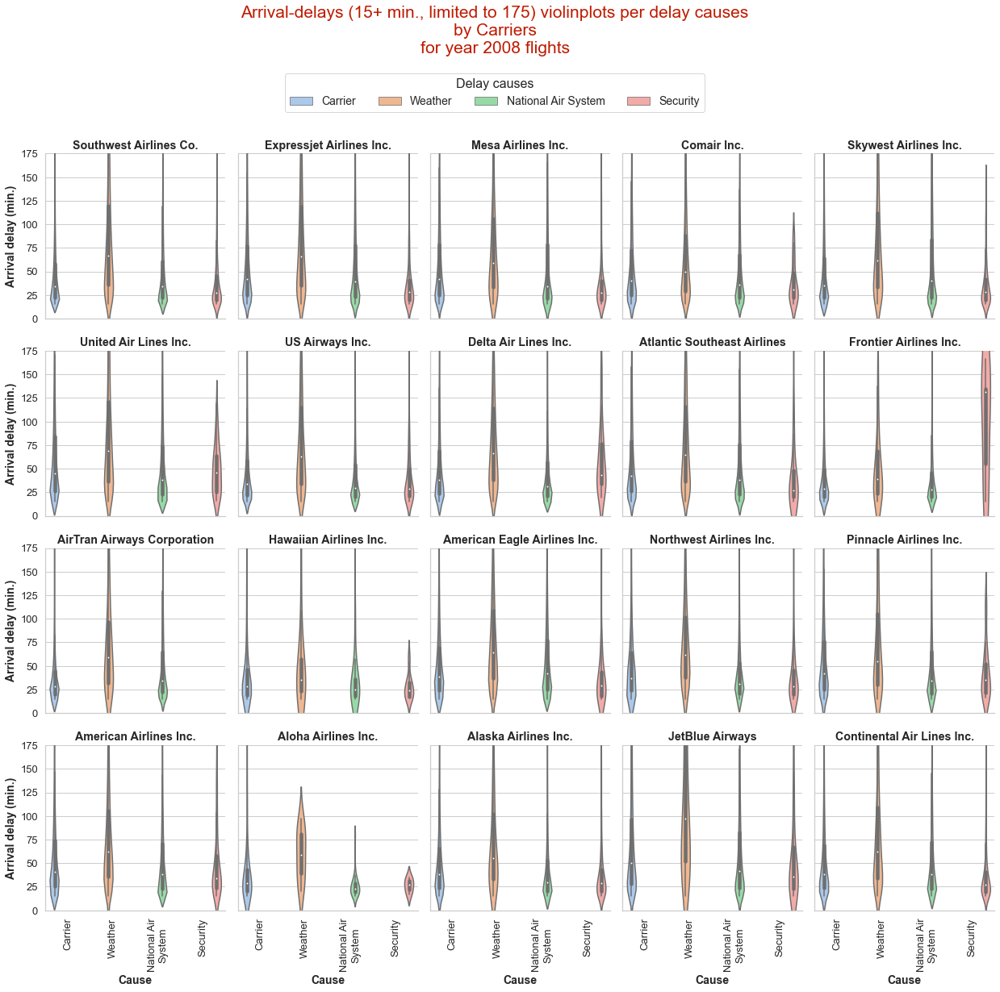

In [119]:
# # bivariate plots of Arrival-delays (15+ min., limited to 175) violinplots  per delay causes by Carriers for year 2008 flights
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='violin',
                data=melt_15,col='Carrier',
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',
                height=3.5,facet_kws=dict(ylim=(0,175))
                )

g.fig.suptitle('Arrival-delays (15+ min., limited to 175) violinplots per delay causes\nby Carriers\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels(causes,rotation=90,fontsize=13,)#va='center',ha='center')#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
#ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

On the plot, amongst other causes, it clearly shows in general that, flights arrival delays due to 'Weather' had the highest medians, with the widest third quartile ranges starting from those medians and higher greater-values distributions, within almost all carriers, notably in 'JetBlue Airways', except in case of 'Frontier Airlines Inc.' where  flights arrival delays due to 'Security' went up with the highest median and the widest second quartile range, and higher greater-values distribution. Then, also in general, arrival delays due to 'Carrier' and 'NAS' or national air system, were swapping the second and the third highest medians, as well lower-values distributions, except in few carriers where arrival delays due to 'Security' may had greater medians, and more greater-values distributions, like in 'United Air Lines Inc.', 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.

As before, 'AirTran Airways Corporation' flights doesn't seem to be delayed due to security at all.

In [120]:
# ArrDelay means per months for all flights
month_arr_means = df_inv[['Month','ArrDelay']].groupby('Month').mean()
month_arr_means

,ArrDelay
Month,
Jan,10.188856
Feb,13.077779
Mar,11.192365
Apr,6.807297
May,5.978448
Jun,13.266756
Jul,9.975050
Aug,6.910915
Sep,0.697733


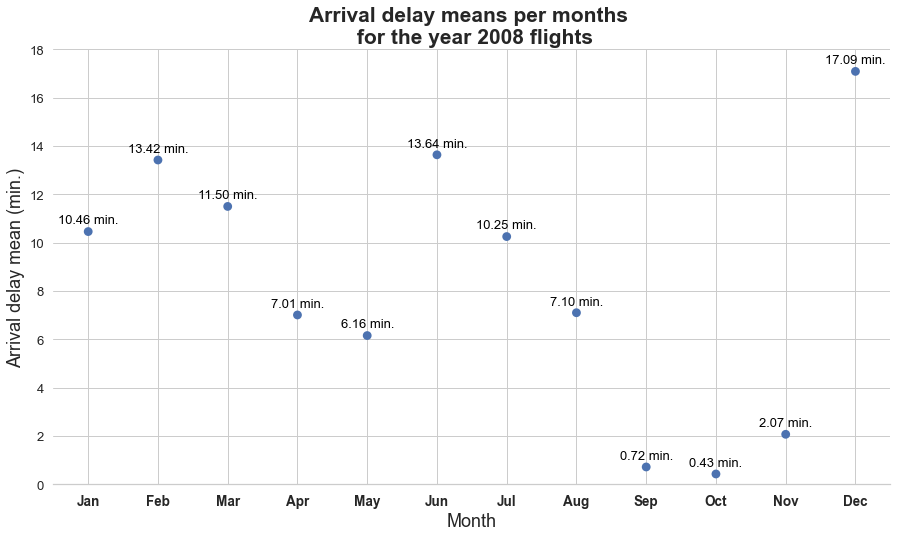

In [121]:
# plotting Month Vs ArrDelay means for all flights

month_arr_means = df_inv[~(df_inv['ArrDelay'].isin(zero_or_null))][['Month','ArrDelay']] \
                                                                  .groupby('Month').mean() \
                                                                  .sort_values(by='ArrDelay',ascending=False)

plt.figure(figsize=[15,8])

sns.pointplot(data=month_arr_means,
              x=month_arr_means.index , y='ArrDelay',
              linestyles='',color=sns.color_palette()[0])

sns.despine(left=True)
sns.set_theme(font_scale=1.19,style='ticks')

plt.title('Arrival delay means per months \n for the year 2008 flights',fontsize=21,weight='bold')
plt.xlabel('Month',fontsize=18)
plt.ylabel('Arrival delay mean (min.)',fontsize=18)

plt.ylim((0,18))
plt.grid(True,axis='both')

plt.xticks(fontsize=13.5)

# get the current tick locations and labels
locs, labels = plt.xticks(fontsize=13.5,weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    mean = month_arr_means.loc[label.get_text(),'ArrDelay']
    
    string = '{:0.2f} min.'.format(mean)
    
    # print the annotation next to the bar
    plt.text(loc, mean+.33, s=string, ha = 'center', color = 'black',fontsize=13);

The pointplot shows that months 'Dec', 'Jun', 'Feb', and 'Mar' had the highest arrival delays means exceeding 11 up to about 17 minutes during year 2008. However, 'Oct', 'Sep' and 'Nov' had the lowest arrival delays means from about 0.4 to 2 minutes amongst the other months.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\categorical.py:3720: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


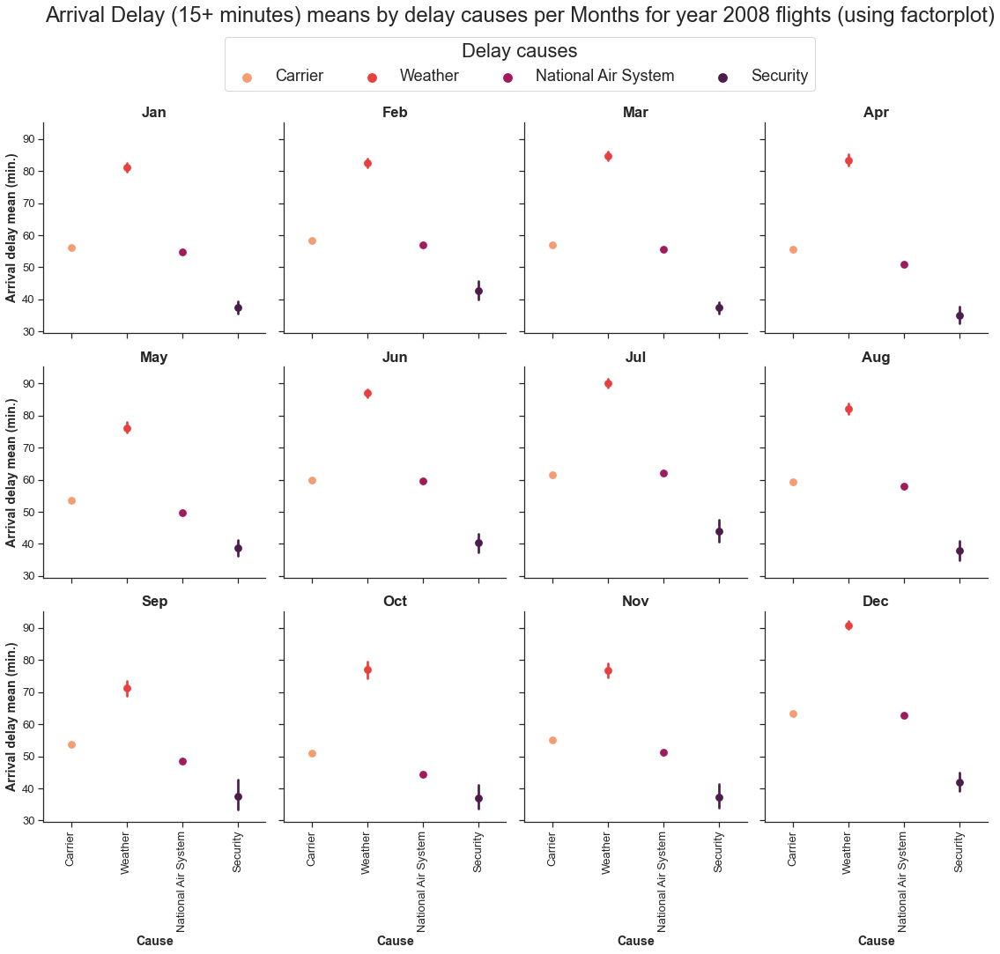

In [122]:
# ArrDelay means by causes per Months for flights with 15+ minutes arrival delay
# using factorplot(catplot now) instead of FacetGrid to overtake ordering and legend markers issues

g = sns.factorplot(data=melt_15,kind='point',
                   x='Cause',y='ArrDelay',
                   col='Month',
                   hue='Cause',palette = 'rocket_r',
                   col_wrap=4,
                   size = 4)#,xlim=(0,300))
sns.set(font_scale=1.4,style='whitegrid')

g.fig.suptitle('Arrival Delay (15+ minutes) means by delay causes per Months for year 2008 flights (using factorplot)',
               fontsize=24,x=0.331,y=1.115)
               
#g.map(sns.pointplot,'Cause','ArrDelay', order=melt_15.Cause.unique(),
#                    dodge=.7)#,linestyles='',scale=1.15,
# plt.legend(title='Delay causes',#title_fontsize =25,
#            loc='upper center',
#            ncol=4, markerscale = 2,
#            prop={'size':18},fontsize=14,
#            bbox_to_anchor=(0.331,1.085),
#            frameon=True,framealpha=.8)
# plt.legend()
g.set_titles('{col_name}',weight='bold')
g.add_legend(title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4, markerscale = 1.3,
             prop={'size':18},fontsize=14,
             bbox_to_anchor=(0.331,1.085),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22)
g.set_xticklabels(rotation=90)
g.set_xlabels('Cause',weight='bold')
g.set_ylabels('Arrival delay mean (min.)',weight='bold');#,color='blue',fontsize=15);

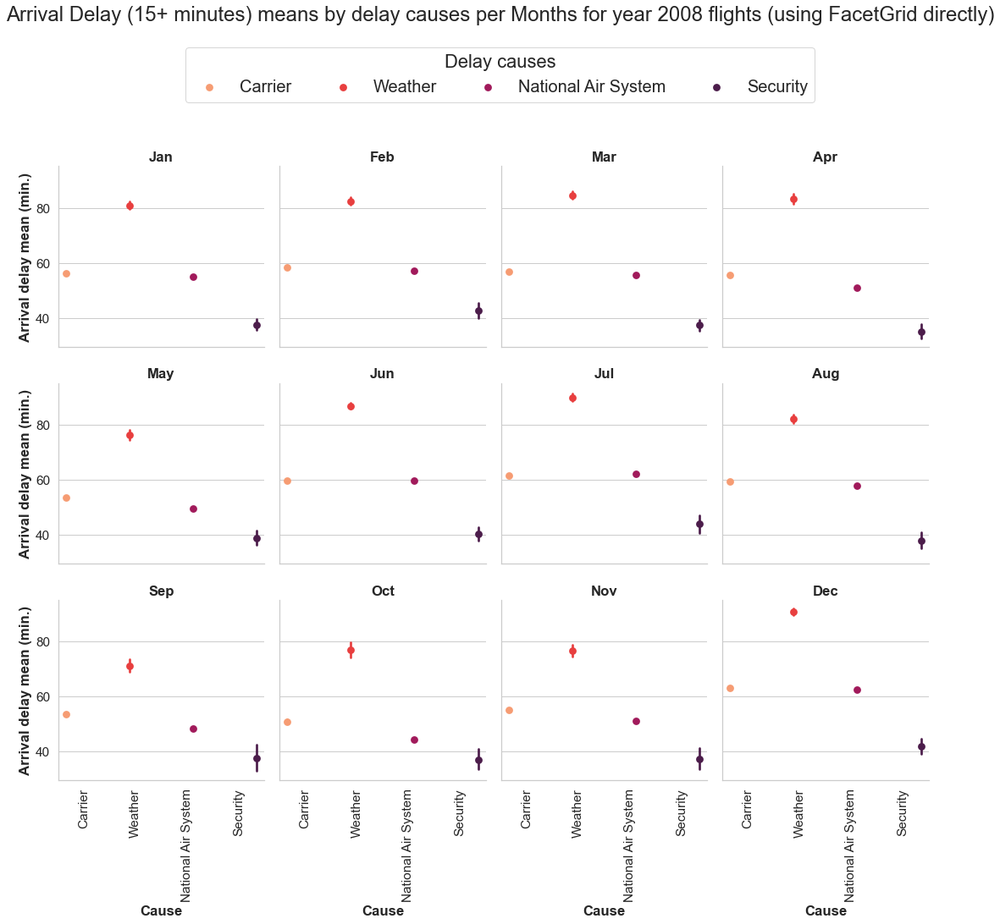

In [123]:
# ArrDelay means by causes per Months for flights with 15+ minutes arrival delay
sns.set(font_scale=1.4,style='whitegrid')
g = sns.FacetGrid(data=melt_15,col='Month',col_wrap=4,
                 height=4)#,xlim=(0,300))

g.fig.suptitle('Arrival Delay (15+ minutes) means by delay causes per Months for year 2008 flights (using FacetGrid directly)',
               fontsize=24,x=0.331,y=1.13)
g.map(sns.pointplot,'Cause','ArrDelay', order=melt_15.Cause.unique(),
                            hue=melt_15['Cause'],hue_order=melt_15.Cause.unique(),
                            palette = 'rocket_r',
                            dodge=.7)#,linestyles='',scale=1.15,

g.set_titles('{col_name}',weight='bold')
g.add_legend(title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4,
             prop={'size':20},
             bbox_to_anchor=(0.331,1.085),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22)
g.set_xticklabels(rotation=90)
g.set_xlabels('Cause',weight='bold')
g.set_ylabels('Arrival delay mean (min.)',weight='bold');#,color='blue',fontsize=15);

This figure represents faceted point plots version from a previous made faceted figure of bar plots.

The faceted plots here shows that arrival delays due to 'weather' had the highest means than arrival delays due to other causes all over months of year 2008. Then arrival delays due to 'Carrier' had the second order, then arrival delays due to 'NAS', and at last what were due to 'Security'.

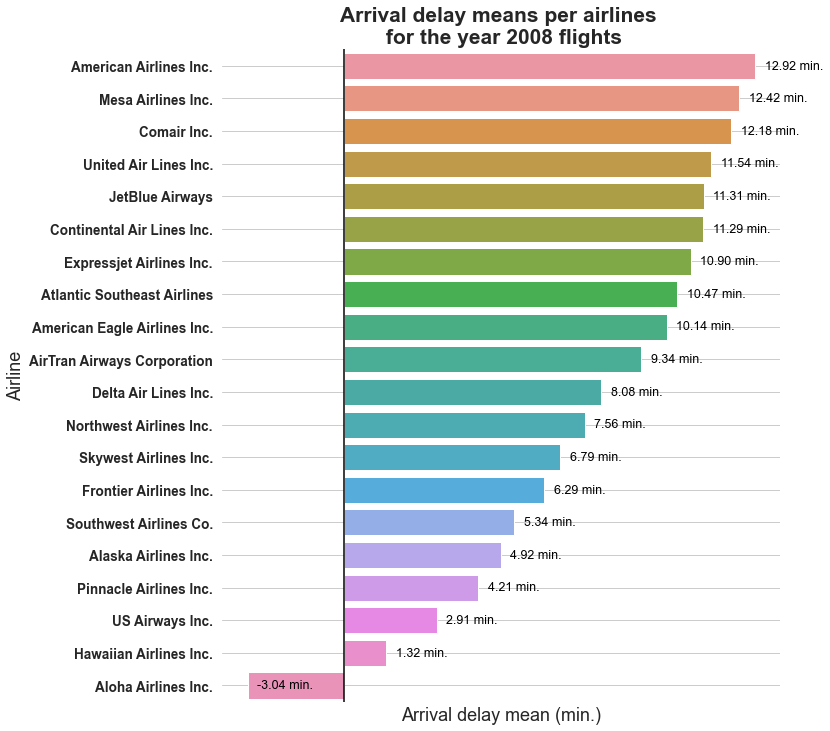

In [124]:
# ArrDelay means per Airlines

airlines_arr_means = df_inv[~(df_inv['ArrDelay'].isin(zero_or_null))][['Carrier','ArrDelay']] \
                                                                                    .groupby('Carrier').mean() \
                                                                                    .sort_values(by='ArrDelay',ascending=False)


plt.figure(figsize=[10,12])

sns.barplot(data=airlines_arr_means, y=airlines_arr_means.index , x='ArrDelay')#,linestyles='')

sns.despine(left=True,bottom=True)
sns.set_theme(font_scale=1.19,style='ticks')

plt.title('Arrival delay means per airlines \n for the year 2008 flights',fontsize=21,weight='bold')
plt.ylabel('Airline',fontsize=18)
plt.xlabel('Arrival delay mean (min.)',fontsize=18)
plt.xticks([])

#plt.ylim((0,18))
plt.grid(True)

loc , labels = plt.xticks(fontsize=13.5)
loc , labels = plt.yticks(fontsize=13.5)
plt.axvline(color='black')

# Recalculating the flights_counts for carriers
carrier_flights_count = airline_cancelled['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    mean = airlines_arr_means.loc[label.get_text(),'ArrDelay']
    
    string = '{:0.2f} min.'.format(mean)
    
    # print the annotation next to the bar
    plt.text(mean+.3, loc, s=string, va = 'center', color = 'black',fontsize=12.5);

The horizontal barplot shows that carriers 'American Airlines Inc.', 'Mesa Airlines Inc.', 'Comair Inc.', 'United Air Lines Inc.', 'JetBlue Airways', and 'Continental Air Lines Inc.', had the highest arrival delays means exceeding 11 up to about 13 minutes during year 2008. Also the plot shows that carriers 'Southwest Airlines Co.', 'Alaska Airlines Inc.', 'Pinnacle Airlines Inc.', 'US Airways Inc.', and 'Hawaiian Airlines Inc.', had the lowest arrival delays means from about 1 to about 5 minutes amongst the other carriers.

The new finding here is the arrival delays mean of 'Aloha Airlines Inc.' carrier. It is about negative 3 minutes indicating almost no notable arrival delays within this carrier flights.

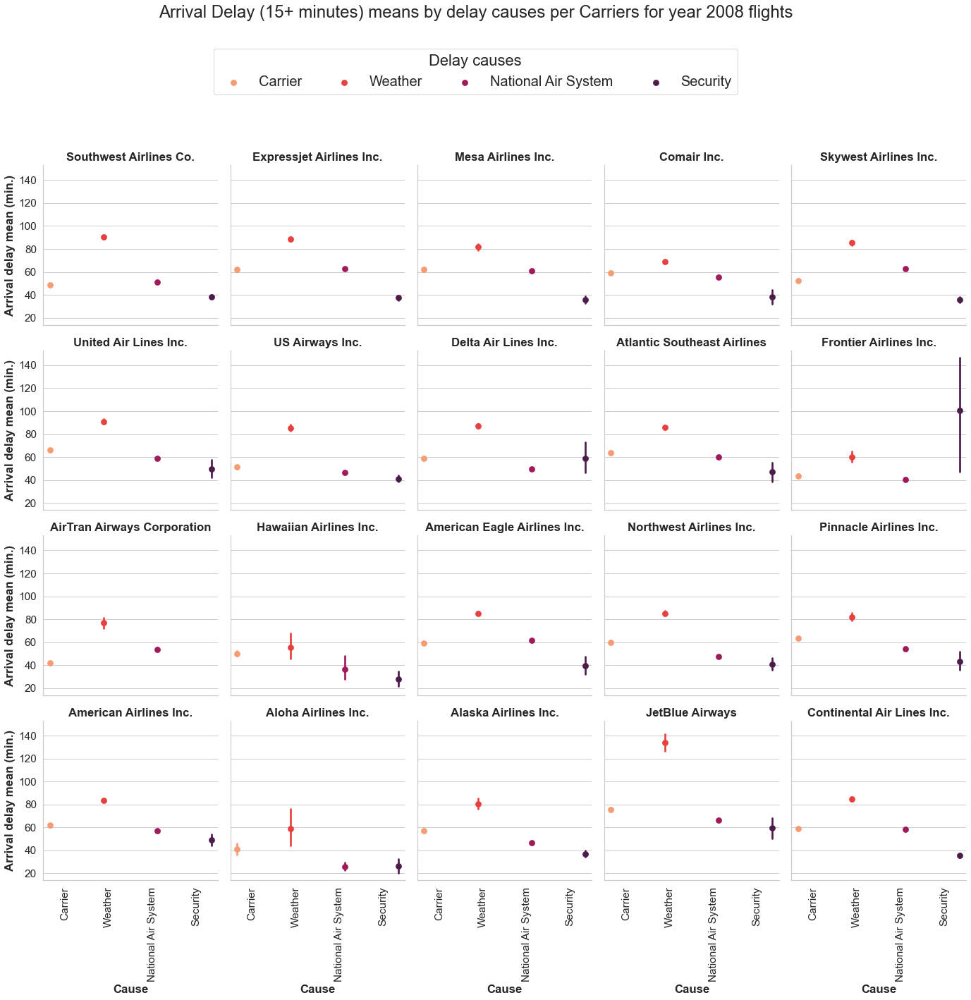

In [125]:
# ArrDelay means by causes per Carriers for flights with 15+ minutes arrival delay
sns.set(font_scale=1.4,style='whitegrid')

g = sns.FacetGrid(data=melt_15,col='Carrier',col_wrap=5,
                 height=4)#,xlim=(0,300))

g.fig.suptitle('Arrival Delay (15+ minutes) means by delay causes per Carriers for year 2008 flights',
               fontsize=24,x=0.331,y=1.13)
g.map(sns.pointplot,'Cause','ArrDelay', order=melt_15.Cause.unique(),
                            hue=melt_15['Cause'],hue_order=melt_15.Cause.unique(),
                            palette = 'rocket_r',
                            dodge=.7)#,linestyles='',scale=1.15,

g.set_titles('{col_name}',weight='bold')
g.add_legend(title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4,
             prop={'size':20},
             bbox_to_anchor=(0.331,1.085),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22)
g.set_xticklabels(rotation=90)
g.set_xlabels('Cause',weight='bold')
g.set_ylabels('Arrival delay mean (min.)',weight='bold');#,color='blue',fontsize=15);

This figure represents faceted point plots version from a previous made faceted figure of bar plots.

At a glance on the faceted point plots, on average amongst other causes, it clearly shows in general that, the 'Weather' had the highest impact on flights arrival delays within almost all carriers, except in case of 'Frontier Airlines Inc.' where probably by far,'Security' went up with the highest impact on flights arrival delays. Then, also on average, 'Carrier' and 'NAS' or national air system, are swapping the second and the third highest impacts, except in few carriers where 'Security' may exceed like in 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.

However, 'AirTran Airways Corporation' flights doesn't seem to be delayed due to security at all.

In [126]:
print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

airline_cancelled


 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


,Month,Carrier,CancellationCode
0,Jan,Southwest Airlines Co.,A
1,Jan,Southwest Airlines Co.,A
2,Jan,Southwest Airlines Co.,A
3,Jan,Southwest Airlines Co.,C
4,Jan,Southwest Airlines Co.,A
...,...,...,...
137429,Dec,Delta Air Lines Inc.,A
137430,Dec,Delta Air Lines Inc.,A
137431,Dec,Delta Air Lines Inc.,A
137432,Dec,Delta Air Lines Inc.,A


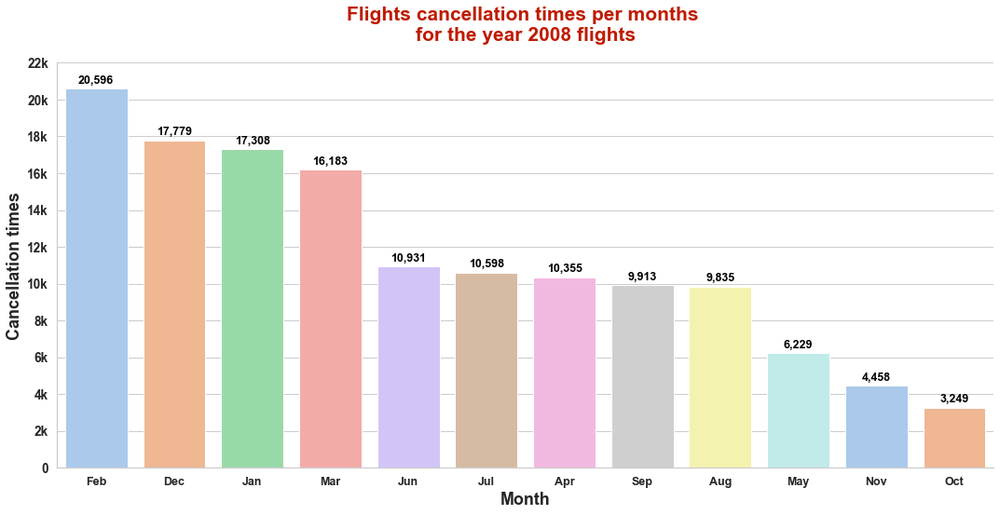

In [127]:
# Months Vs. flight cancellation times

plt.figure(figsize=(18,8))

ax = sns.countplot(data=airline_cancelled,
                   x='Month', order = airline_cancelled['Month'].value_counts().index,
                   #hue='CancellationCode',hue_order=['A','B','C','D'],
                   palette='pastel');
sns.despine()

plt.title('Flights cancellation times per months \nfor the year 2008 flights',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)

plt.xlabel('Month',fontsize=18,weight='bold')
plt.ylabel('Cancellation times',fontsize=18,weight='bold')

plt.xticks(fontsize=12.5,weight='bold')
plt.yticks(np.arange(0,23,2) * 1000,
           [0]+[str(n)+'k' for n in np.arange(2,23,2)],
           #[0,'2k','4k','6k','8k','10k','12k','14k','16k','18k','20k','22k'],
           fontsize=13.5,weight='bold')

#plt.grid(True,axis='y')

months_canc = airline_cancelled['Month'].value_counts()

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = months_canc[label.get_text()]
    
    string = f"{count:,}"
    
    # print the annotation next to the bar
    plt.text(loc, count+300, s=string, ha = 'center', color = 'black',fontsize=12.5,weight='bold');

The barplot shows that months 'Feb', 'Dec', 'Jan', and 'Mar', had the highest flights-cancellation counts exceeding 16.1k up to about 20.6k flights during year 2008. However, 'May', 'Nov', and 'Oct' had the lowest flights-cancellation counts from about 3.25k to about 6.23k flights amongst the other months.

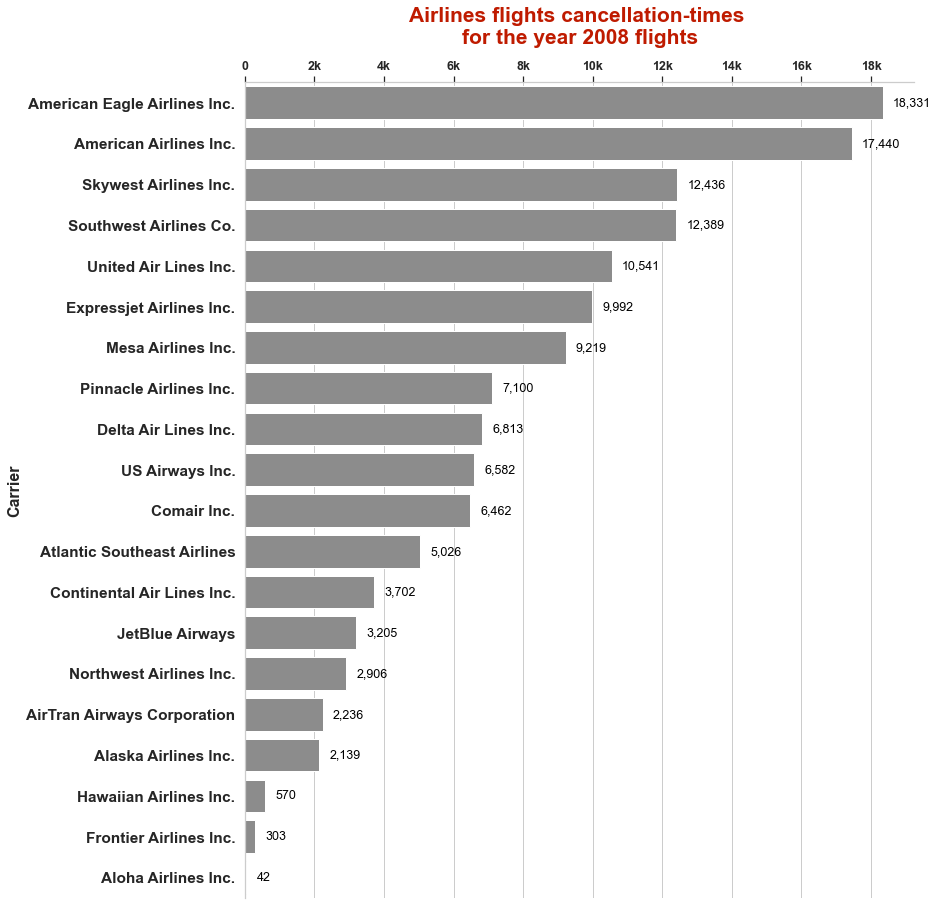

In [128]:
# cancellation times per airline

plt.figure(figsize=(12,15))

ax = sns.countplot(data=airline_cancelled,
                   y='Carrier',order=airline_cancelled['Carrier'].value_counts().index,
                   #hue='CancellationCode',hue_order=['A','B','C','D'],
                   color=sns.color_palette()[7]);

sns.despine(top=False,bottom=True)


plt.title('Airlines flights cancellation-times \nfor the year 2008 flights',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
plt.xlabel('')
plt.ylabel('Carrier',fontsize=16,weight='bold')

ax.xaxis.tick_top()

plt.xticks(np.arange(0,19000,2000),
           [0] + [str(n)+'k' for n in range(2,20,2)],
           #[0,'2k','4k','6k','8k','10k','12k','14k','16k','18k'],
           fontsize=12.5,weight='bold')

# Recalculating the flights_counts for carriers
carrier_flights_count = airline_cancelled['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    
    string = f"{count:,}"

    # print the annotation next to the bar
    plt.text(count+300, loc, s=string, va = 'center', color = 'black',fontsize=12.5);
    
plt.grid(True,axis='x');

The horizontal barplot shows that carriers 'American Eagle Airlines Inc.', 'American Airlines Inc.', 'Skywest Airlines Inc.', 'Southwest Airlines Co.', 'United Air Lines Inc.', and 'Expressjet Airlines Inc.', had the highest flights-cancellation counts from about 10k up to about 18.3k flights during year 2008. However, 'Hawaiian Airlines Inc.', 'Frontier Airlines Inc.', and 'Aloha Airlines Inc.' had the lowest flights-cancellation counts which are '570', '303', and '42' flights respectively, amongst the other carriers.


Hint: Colored lines indicate the Max and Min frequencies


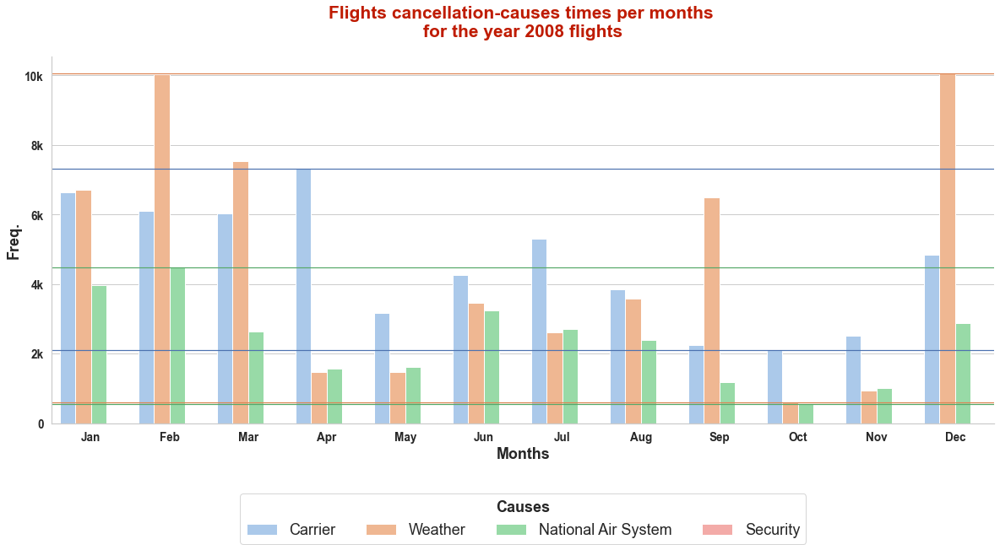

In [129]:
# Months flights cancellation Vs. delay causes times
plt.figure(figsize=(20,8))

ax = sns.countplot(data=airline_cancelled,
                   x='Month',
                   hue='CancellationCode',hue_order=['A','B','C','D'],
                   palette='pastel');
sns.despine()

plt.title('Flights cancellation-causes times per months \nfor the year 2008 flights',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)

plt.xlabel('Months',fontsize=18,weight='bold')
plt.ylabel('Freq.',fontsize=18,weight='bold')

#plt.xticks(np.arange(0,12),months)
plt.xticks(fontsize=13.5,weight='bold')
plt.yticks(np.arange(0,12000,2000),[0,'2k','4k','6k','8k','10k'],fontsize=13.5,weight='bold')

legend = plt.legend(title='Causes',
                    title_fontsize=18,ncol=4,loc='lower center',bbox_to_anchor=(.5,-.35),
                    #edgecolor='black',prop={'size': 22},
                    labels=['Carrier','Weather','National Air System','Security'],#causes,
                    fontsize=13,prop={'size':18})#'weight':'bold',
plt.setp(legend.get_title(),fontsize=18,weight='bold')                 #adjusting legend title
#plt.grid(True,axis='y')

# drawing max and min lines
max_min_lines = {'carrier':(7312,2097),
                 'weather':(10042,600),
                 'NAS':(4470,552)}
colors = (color for color in list(sns.color_palette()))
for m in max_min_lines:
    max,min = max_min_lines[m]
    color=next(colors)
    plt.axhline(max,color=color,linewidth=1.2, linestyle ='-')
    plt.axhline(min ,color=color,linewidth=1.2, linestyle ='-');

#'-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

print('\nHint: Colored lines indicate the Max and Min frequencies');

The clustered bar chart shows that "Weather" had the highest impact to cancel flights within months 'Feb', 'Dec', 'Jan', 'Mar', as well 'Sep'. However, the "Carrier" procedures itself had the second highest impact within the same months, and the highest impact within all other months. "National Air system" comes third in general, except it had the second highest impact to cancel a flight within months 'Apr', 'May', 'Jul', and 'Nov'.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:132: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  figlegend = self.fig.legend(handles, labels, **kwargs)


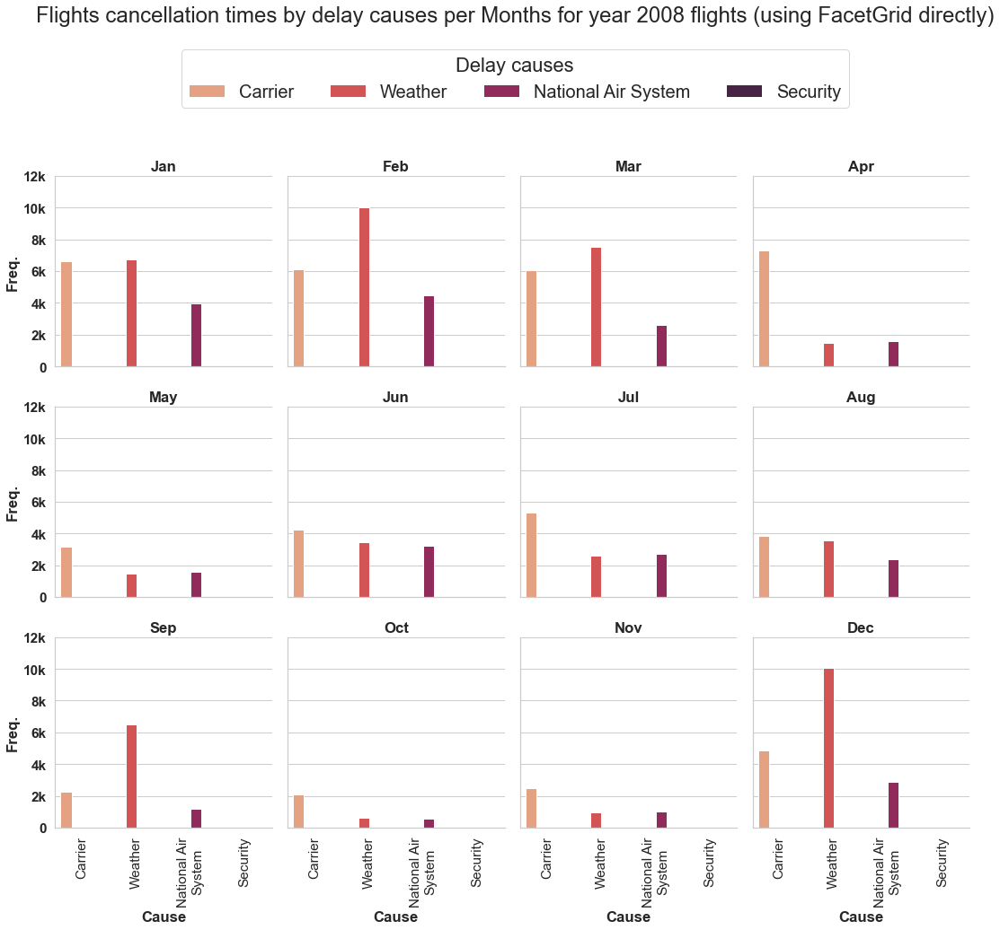

In [130]:
# Flights cancellation times by delay causes per Months 
sns.set(font_scale=1.4,style='whitegrid')
g = sns.FacetGrid(data=airline_cancelled,col='Month',col_wrap=4,
                 height=4)#,xlim=(0,300))

g.fig.suptitle('Flights cancellation times by delay causes per Months for year 2008 flights (using FacetGrid directly)',
               fontsize=24,x=0.331,y=1.13)
g.map(sns.countplot,'CancellationCode', order=['A','B','C','D'],
                            hue=airline_cancelled['CancellationCode'],hue_order=['A','B','C','D'],
                            palette = 'rocket_r',
                            dodge=.7)#,linestyles='',scale=1.15,

g.set_titles('{col_name}',weight='bold')
g.add_legend(labels=['Carrier', 'Weather', 'National Air System', 'Security'],
             title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4,
             prop={'size':20},
             bbox_to_anchor=(0.331,1.085),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22)
g.set_xticklabels(causes,rotation=90)
g.set_xlabels('Cause',weight='bold')
g.set_ylabels('Freq.',weight='bold')

ytickslabels = (g.axes[0].get_yticks()).astype('int')
ytickslabels = [0] + [str(int(n/1000))+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,weight='bold');#,color='blue',fontsize=15);

Faceted form of the last clustered bar chart.

In [131]:
airline_cancelled_dummies = pd.get_dummies(airline_cancelled,columns=['CancellationCode'],prefix='',prefix_sep='')

print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

airline_cancelled_dummies.groupby('Month').sum()  


 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


,A,B,C,D
Month,,,,
Jan,6635.0,6711.0,3962.0,0.0
Feb,6090.0,10034.0,4470.0,2.0
Mar,6038.0,7520.0,2621.0,4.0
Apr,7312.0,1479.0,1564.0,0.0
May,3157.0,1461.0,1608.0,3.0
Jun,4251.0,3448.0,3232.0,0.0
Jul,5292.0,2612.0,2694.0,0.0
Aug,3852.0,3582.0,2401.0,0.0
Sep,2246.0,6478.0,1188.0,1.0



Hint: Colored lines indicate the Max and Min frequencies


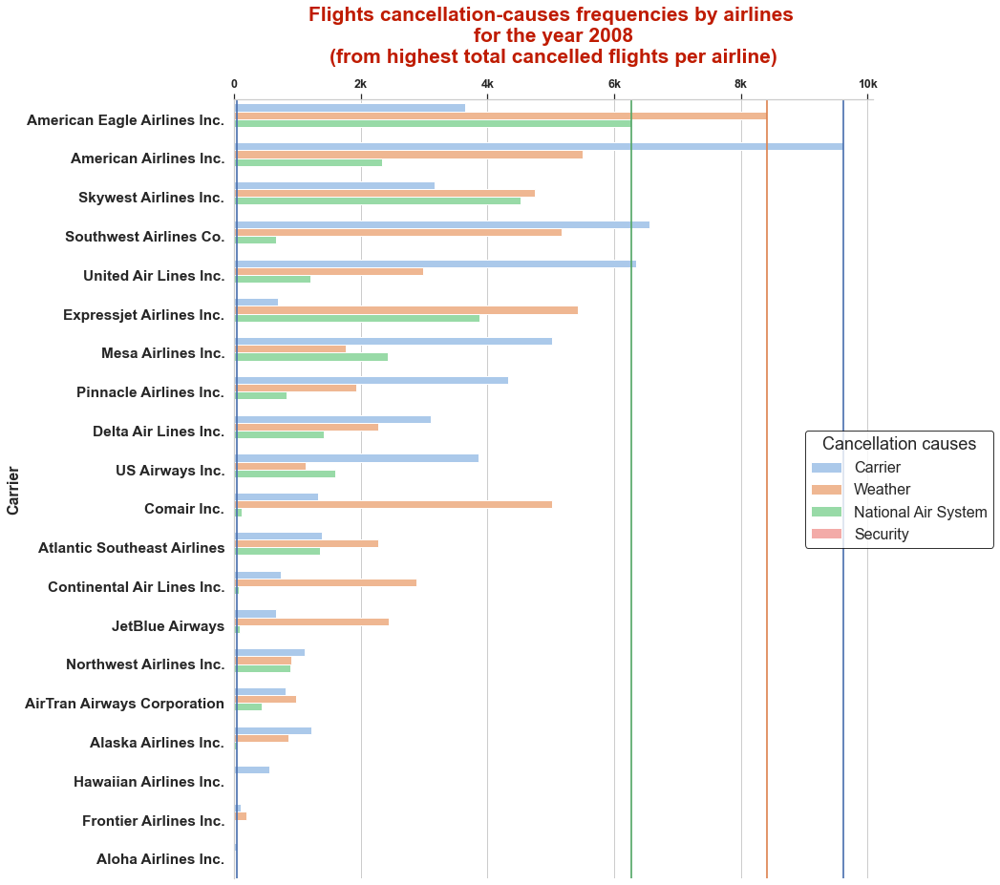

In [132]:
plt.figure(figsize=(12,15))

ax = sns.countplot(data=airline_cancelled,
                   y='Carrier',order = airline_cancelled['Carrier'].value_counts().index,
                   hue='CancellationCode',hue_order=['A','B','C','D'],
                   palette='pastel');

sns.despine(top=False,bottom=True)
#plt.grid(True,axis='x')
title = 'Flights cancellation-causes frequencies by airlines \nfor the year 2008'
plt.title(title + '\n(from highest total cancelled flights per airline)',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
plt.xlabel('')
plt.ylabel('Carrier',fontsize=16,weight='bold')

ax.xaxis.tick_top()
#ax.xaxis.set_label_position('top')  
#ax.set_xlabel('X LABEL')
#plt.xticks(rotation=80,weight='bold')
plt.xticks(np.arange(0,12,2)*1000,
           [0]+[str(n)+ 'k' for n in np.arange(2,12,2)],
           #[0,'2k','4k','6k','8k','10k'],
           fontsize=12.5,weight='bold')
plt.legend(title='Cancellation causes',title_fontsize=18,
           loc='center right',edgecolor='black', #prop={'size': 22},
           labels=['Carrier','Weather','National Air System','Security'],
           bbox_to_anchor=(1.2,.5),fontsize=16)
# Recalculating the flights_counts for carriers
#carrier_flights_count = airline_cancelled['Carrier'].value_counts()
#carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
#for loc, label in zip(locs, labels):
#    # get the text property for the label to get the correct count
#    count = carrier_flights_count[label.get_text()]
#    count_whole = carrier_flights_count_whole[label.get_text()]
#    
#    percentage_value = 100*count/count_whole
#    string = str(f"{count:,}") + ' ({:0.1f}% of total)'.format(percentage_value)# flights
#
#    # print the annotation next to the bar
#    plt.text(count+3000, loc, s=string, va = 'center', color = 'black',fontsize=12.5);

# drawing max and min lines
max_min_lines = {'carrier':(9609,42),
                 'weather':(8408,0),
                 'NAS':(6275,0)}
colors = (color for color in list(sns.color_palette()))
for m in max_min_lines:
    
    max,min = max_min_lines[m]
    color=next(colors)
    plt.axvline(max,color=color,linewidth=1.7, linestyle ='-')
    plt.axvline(min ,color=color,linewidth=1.7, linestyle ='-');

#'-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

print('\nHint: Colored lines indicate the Max and Min frequencies');

The horizontal clustered bar chart with Max and Min lines, shows that "Carrier" procedures had the highest impact to cancel flights within 11 Airlines carriers of 20, and the second highest impact within other 6, and the third highest impact in other 3. However, the "Weather" had the highest impact to cancel flights within 9 Airlines carriers of 20, and the second highest impact within other 8, and the third within other 2. "NAS" or National Air System had the second highest impact to cancel flights within 5 Airlines carriers of 20, and the third highest impact within other 13.

'American Airlines Inc.' which come second in total cancelled flights, had more cancellations due to 'Carrier' than other causes, even more than cancelled flights due to weather within 'American Eagle Airlines Inc.' which had the highest total cancelled flights, and most of them were cancelled due weather.

'Hawaiian Airlines Inc.'s flights-cancellation were because of 'Carrier', as a majority, and a few number cancelled due 'Weather'. However, 'Frontier Airlines Inc.'s cancelled-flights were because of 'Weather' then 'Carrier' respectively, as a majority, and a few number cancelled due 'NAS'.

All 'Aloha Airlines Inc.'s cancelled-flights were because of 'Carrier'.

Flights-cancellation due 'Security' doesn't seem to be the common.

c:\users\un\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:132: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  figlegend = self.fig.legend(handles, labels, **kwargs)


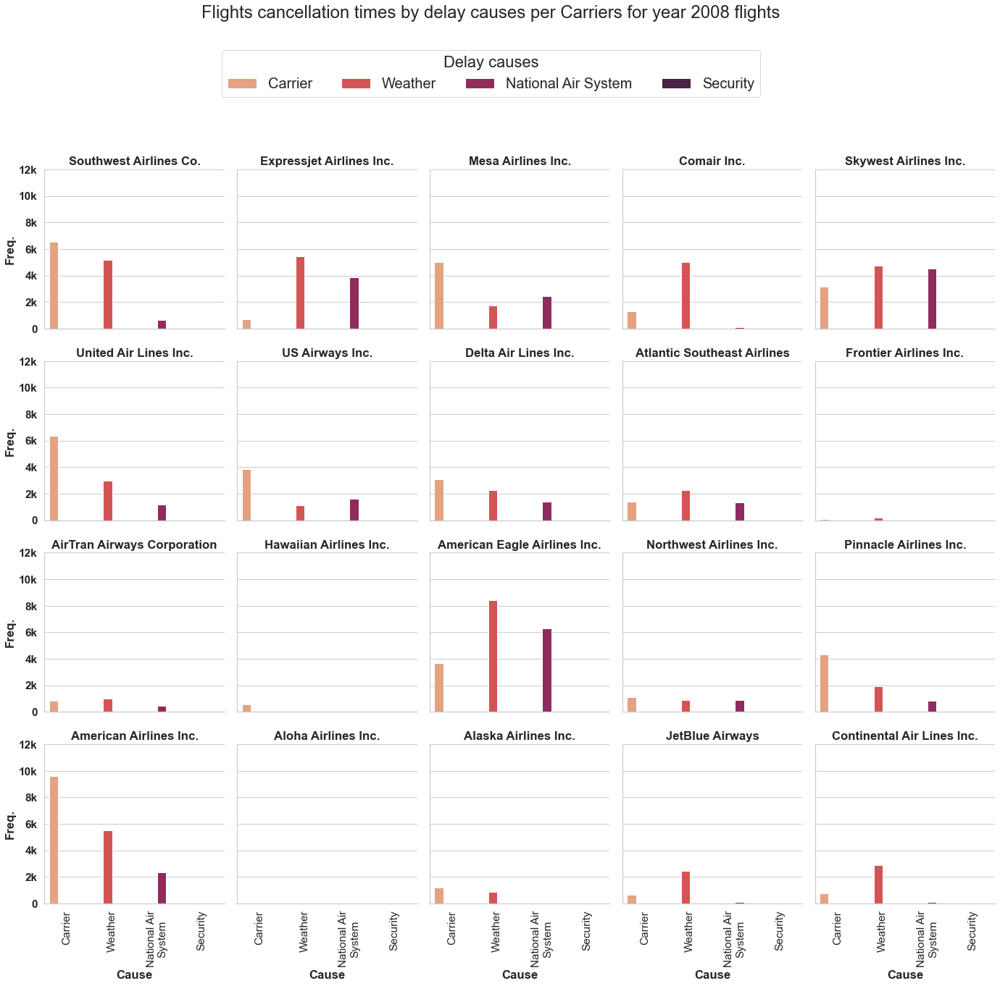

In [133]:
#  Flights cancellation times by delay causes per Carriers
sns.set(font_scale=1.4,style='whitegrid')

g = sns.FacetGrid(data=airline_cancelled,col='Carrier',col_wrap=5,
                 height=4)#,xlim=(0,300))

g.fig.suptitle('Flights cancellation times by delay causes per Carriers for year 2008 flights',
               fontsize=24,x=0.331,y=1.13)
g.map(sns.countplot,'CancellationCode', order=['A','B','C','D'],
                            hue=airline_cancelled['CancellationCode'],hue_order=['A','B','C','D'],
                            palette = 'rocket_r',
                            dodge=.7)#,linestyles='',scale=1.15,

g.set_titles('{col_name}',weight='bold')
g.add_legend(labels=['Carrier', 'Weather', 'National Air System', 'Security'],
             title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4,
             prop={'size':20},
             bbox_to_anchor=(0.331,1.085),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22)
g.set_xticklabels(causes,rotation=90)
g.set_xlabels('Cause',weight='bold')
g.set_ylabels('Freq.',weight='bold')#,color='blue',fontsize=15);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
ytickslabels = [0] + [str(int(n/1000))+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,weight='bold');


Faceted form of the last clustered bar chart.

In [134]:
# flights cancellation-causes times per airlines

airline_cancelled_dummies = pd.get_dummies(data=airline_cancelled,
                                           columns=['CancellationCode'],
                                           prefix='',
                                           prefix_sep='')
airline_cancelled_dummies.drop(columns='Month',inplace=True)
#airline_cancelled_dummies.rename(columns={'A':'Carrier cancellation',
#                                          'B':'Weather cancellation',
#                                          'C':'National Air system cancellation',
#                                          'D':'Security cancellation'},
#                                 inplace=True)

print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')
# 
airline_cancelled_dummies.groupby('Carrier').sum()                  # (A = carrier, B = weather, C = NAS, D = security)


 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


,A,B,C,D
Carrier,,,,
AirTran Airways Corporation,815.0,976.0,445.0,0.0
Alaska Airlines Inc.,1222.0,865.0,52.0,0.0
Aloha Airlines Inc.,42.0,0.0,0.0,0.0
American Airlines Inc.,9609.0,5495.0,2334.0,2.0
American Eagle Airlines Inc.,3644.0,8408.0,6275.0,4.0
Atlantic Southeast Airlines,1384.0,2283.0,1357.0,2.0
Comair Inc.,1328.0,5016.0,118.0,0.0
Continental Air Lines Inc.,746.0,2878.0,78.0,0.0
Delta Air Lines Inc.,3113.0,2283.0,1417.0,0.0


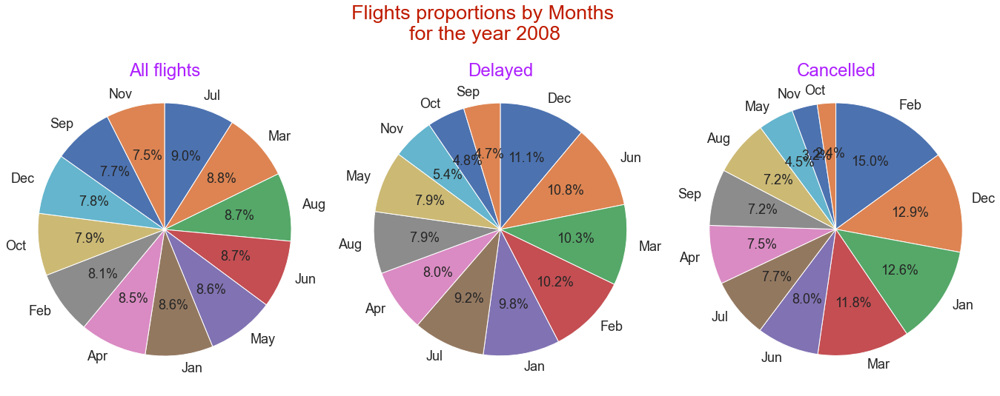

In [135]:
# Flights proportions by Months pie plots
plt.subplots(1,3)#,sharex=True,sharey=True)

plt.suptitle("Flights proportions by Months \nfor the year 2008",color='#BF1B00', y=1.03,fontsize=27)

plt.subplot(131)
# Total flights proportions by Months 
plt.title("All flights",color='#AD1FFF',y=.965, fontsize=24)

month_counts = df_inv['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,8),#radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18)
plt.axis("equal")


plt.subplot(132)
# Total delayed flights proportions by Months 
plt.title("Delayed", color='#AD1FFF',y=.965, fontsize=24)

month_counts = df_inv_15['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,8),#radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18)
plt.axis("equal")


plt.subplot(133)
# Total cancelled flights proportions by Months 

plt.title("Cancelled" ,color='#AD1FFF', y=.965,fontsize=24)

month_counts = airline_cancelled['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,8),#radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18)
plt.axis("equal");

It is clear that all 2008 months had close-ratios of recorded total flights frequencies, starting from about 7.5% up to about 9%. However, 9 months had close-ratios of flights delayed for 15+ minutes. 6 months had the ratios from about 9% up to 11%, and 3 others had a ratio about 8%.

'Feb' exceeded in the ratio of cancelled flights, with about 15% of total 2008 cancelled flights. Then 'Dec' and 'Jan' respectively with about 13%.

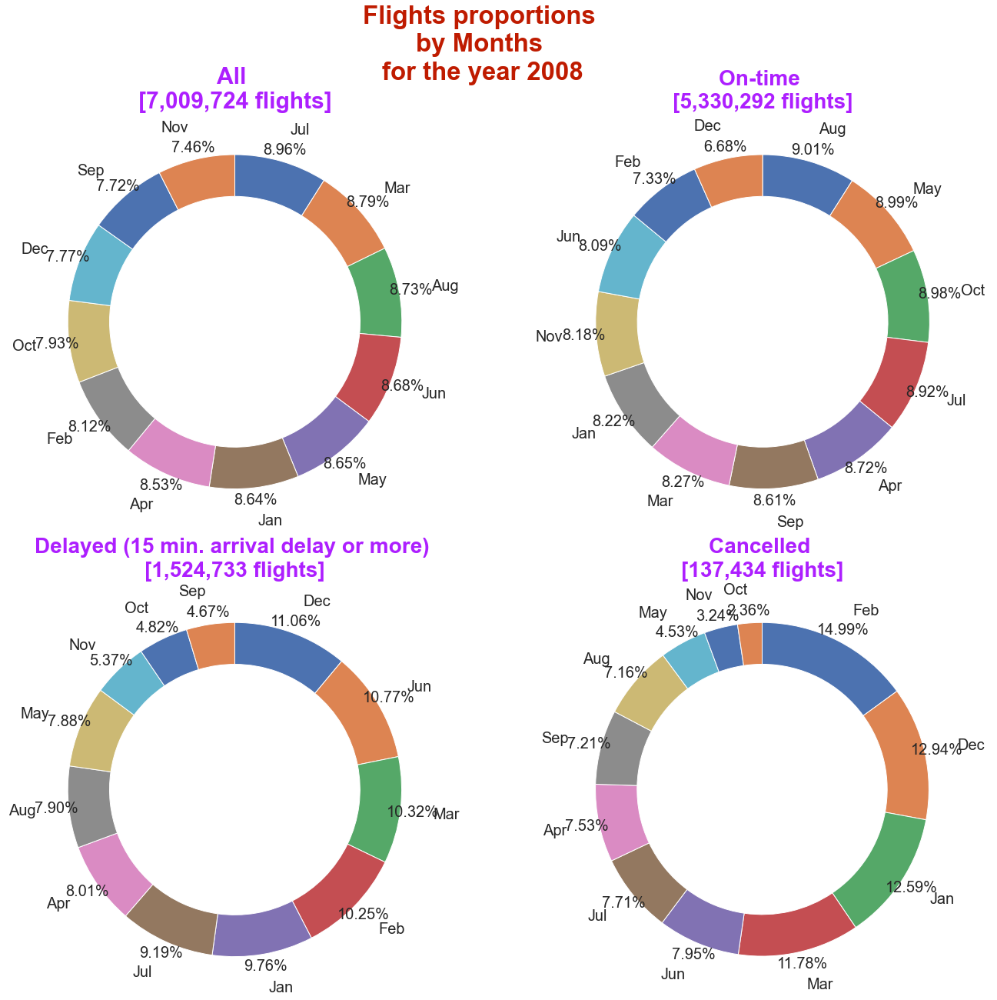

In [136]:
# Flights proportions by Months donut plots
plt.subplots(2,2)#,sharex=True,sharey=True)

plt.suptitle("Flights proportions \nby Months \nfor the year 2008",color='#BF1B00',fontsize=33,weight='bold', y=1)

plt.subplot(221)
# Total flights proportions by Months 
plt.title("All \n[7,009,724 flights]",color='#AD1FFF',y=1.068, fontsize=30,weight='bold')

month_counts = df_inv['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.197,wedgeprops = {'width' : .25},#radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal")


plt.subplot(222)
# Total on-time flights proportions by Months 

plt.title("On-time \n[5,330,292 flights]" ,color='#AD1FFF', y=1.068,fontsize=28,weight='bold')

month_counts = on_time['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.2,wedgeprops = {'width' : .25},##radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal");

plt.subplot(223)
# Total delayed flights proportions by Months 
plt.title("Delayed (15 min. arrival delay or more) \n[1,524,733 flights]", color='#AD1FFF',y=1.068, fontsize=28,weight='bold')

month_counts = df_inv_15['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.2,wedgeprops = {'width' : .25},##radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal")

plt.subplot(224)
# Total cancelled flights proportions by Months 

plt.title("Cancelled \n[137,434 flights]" ,color='#AD1FFF', y=1.068,fontsize=28,weight='bold')

month_counts = airline_cancelled['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.2,wedgeprops = {'width' : .25},##radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal")

plt.subplots_adjust(wspace=.15,hspace=.27);


A polished faceted figure of donut charts including data from the last 3 faceted pie charts, as well a donut for total 'on-time' flights proportions per months.

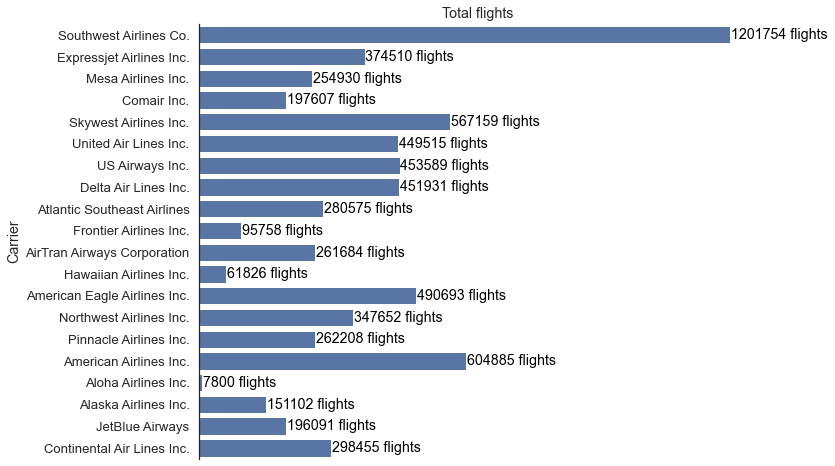

In [137]:
# bivariate plots of Carrier against flights counts for the whole data points df_inv  (7,009,728 rows)

sns.set(font_scale=1.19,style='white')

plt.figure(figsize=(10,8))
default_color = sns.color_palette()[0]
sns.countplot(data = df_inv, y = 'Carrier',color = default_color)

plt.title('Total flights')
sns.despine(bottom=True)
plt.xticks([])
plt.xlabel('')

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    # print the annotation just below the top of the bar
    plt.text(count+2000, loc, s=str(count) + ' flights', va = 'center', color = 'black');

From the horizontal bar chart, it clearly appears that 'Southwest Airlines Co.' had the highest total recorded flights within 2008. It looks that it had more recorded flights, than twice of carrier's in next order.

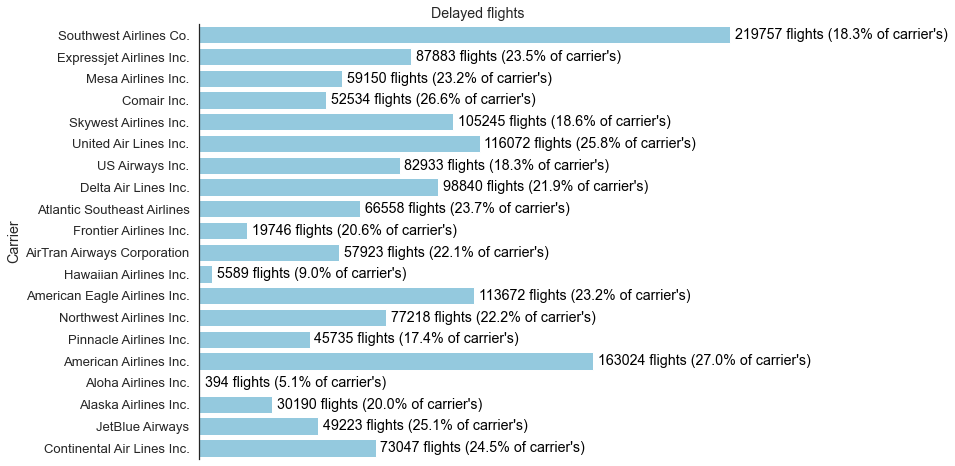

In [138]:
# bivariate plots of Carrier against flights counts 
# for the data points with 15 minutes or more delays in df_inv_15 (1,524,733 rows) 

plt.figure(figsize=(10,8))
default_color = sns.color_palette()[0]
sns.countplot(data = df_inv_15, y = 'Carrier',color = 'skyblue')
sns.set(font_scale=1.19,style='white')

plt.title('Delayed flights')

sns.despine(bottom=True)
plt.xticks([])
plt.xlabel('')

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv_15['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 

# get the current tick locations and labels
locs, labels = plt.yticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    string = str(count) + " flights ({:0.1f}% of carrier's)".format(100*count/count_whole)

    # print the annotation next to the bar
    plt.text(count+2000, loc, s=string, va = 'center', color = 'black');

From the horizontal bar chart, also it clearly shows that 'Southwest Airlines Co.' had the highest total count of 15+ minutes delayed flights within 2008. 'American Airlines Inc.' was in the next order.

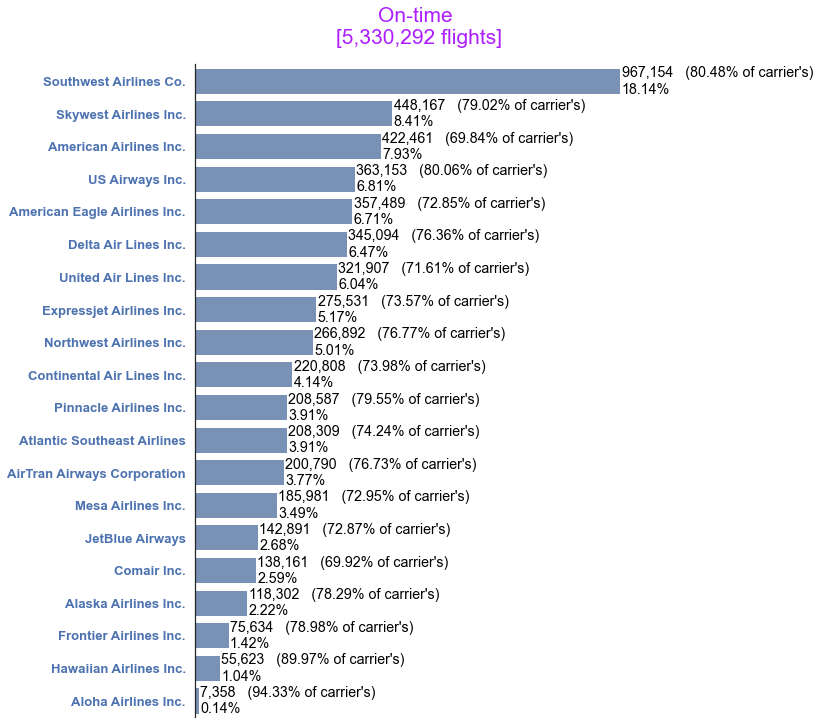

In [139]:
# on-time flights by Carriers 

plt.figure(figsize=(8,12))
carrier_counts = on_time['Carrier'].value_counts()

sns.set(font_scale=1.19,style='white')


sns.countplot(data = on_time, y = 'Carrier',
              order = carrier_counts.index,
              color = sns.color_palette('vlag')[0],)#sns.color_palette('viridis')[-3],# 'skyblue'
sns.despine(bottom=True)
plt.title('On-time \n[5,330,292 flights]',fontsize=21,color='#AD1FFF',y=1.023)#,x=.25

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Month',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = default_color)

# Recalculating the total flights counts for months

carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_counts[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/5330292
    
    string = str(f"{count:,}") + "   ({:0.2f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');

We can see here that also 'Southwest Airlines Co.' had the highest total count of on-time flights during 2008, even than twice of the carrier's in next order.

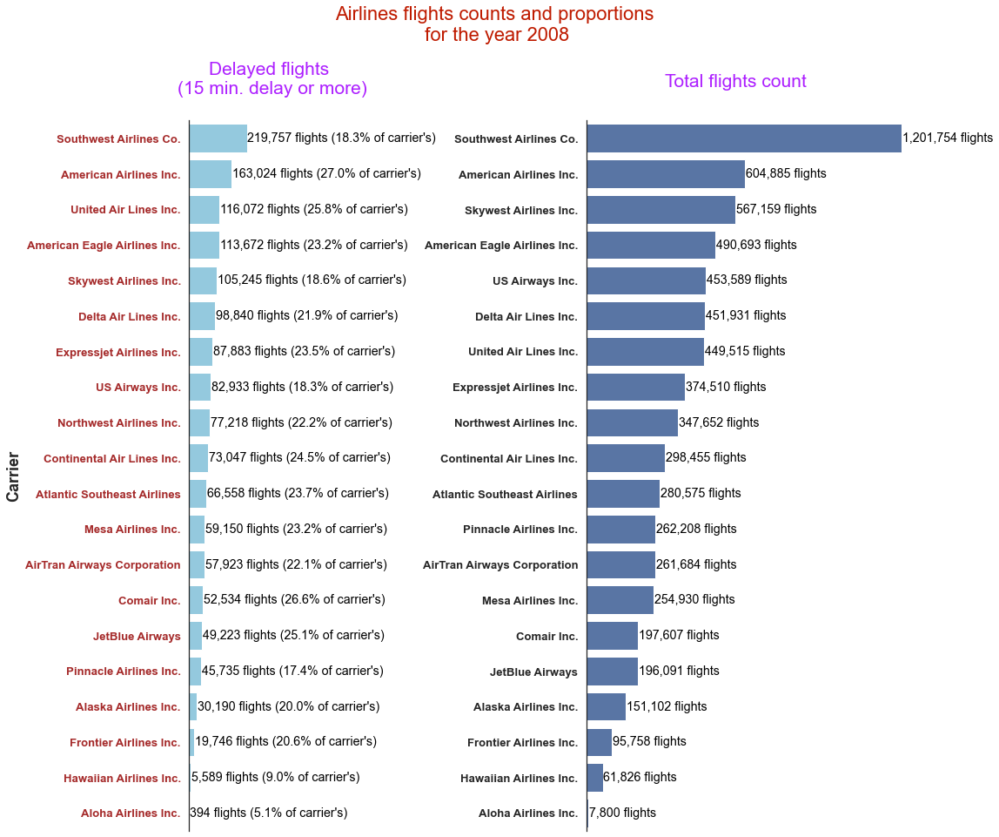

In [140]:
# bivariate plots of Carrier against flights counts
# for the whole data points df_inv (7,009,728 rows), against df_inv_15 (1,524,733  rows) 

default_color = sns.color_palette()[0]

fig, ax = plt.subplots(1, 2, sharex=True,figsize=(15,15))

plt.suptitle('Airlines flights counts and proportions\n for the year 2008'
          ,fontsize=22,color='#BF1B00',x=.45,y=1.002)

# first subplot
ax[0] = plt.subplot(1,2,1)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

sns.countplot(data = df_inv_15, y = 'Carrier',
              order = df_inv_15['Carrier'].value_counts().index,
              color = 'skyblue',
              ax=ax[0])

plt.title('Delayed flights \n(15 min. delay or more)',fontsize=21,color='#AD1FFF',x=.25,y=1.03)

plt.xlabel('')
plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv_15['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    string = str(f"{count:,}") + " flights ({:0.1f}% of carrier's)".format(percentage_value)

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
    
##################################    
# second subplot
ax[1] = plt.subplot(1,2,2)
sns.countplot(data = df_inv, y = 'Carrier',
              order = df_inv['Carrier'].value_counts().index,
              color = default_color,
              ax=ax[1])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title('Total flights count',fontsize=21,color='#AD1FFF',x=.45,y=1.04)
plt.xlabel('')
plt.ylabel('')

plt.xticks([])

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    string = str(f"{count:,}") + ' flights'
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
#plt.subplots_adjust(wspace=0.2);

    #if percentage_value >;
#plt.yticks([])

Faceted horizontal bar plots, for flights with arrival delay of 15+ minutes, versus all recorded flights counts, per carrier.

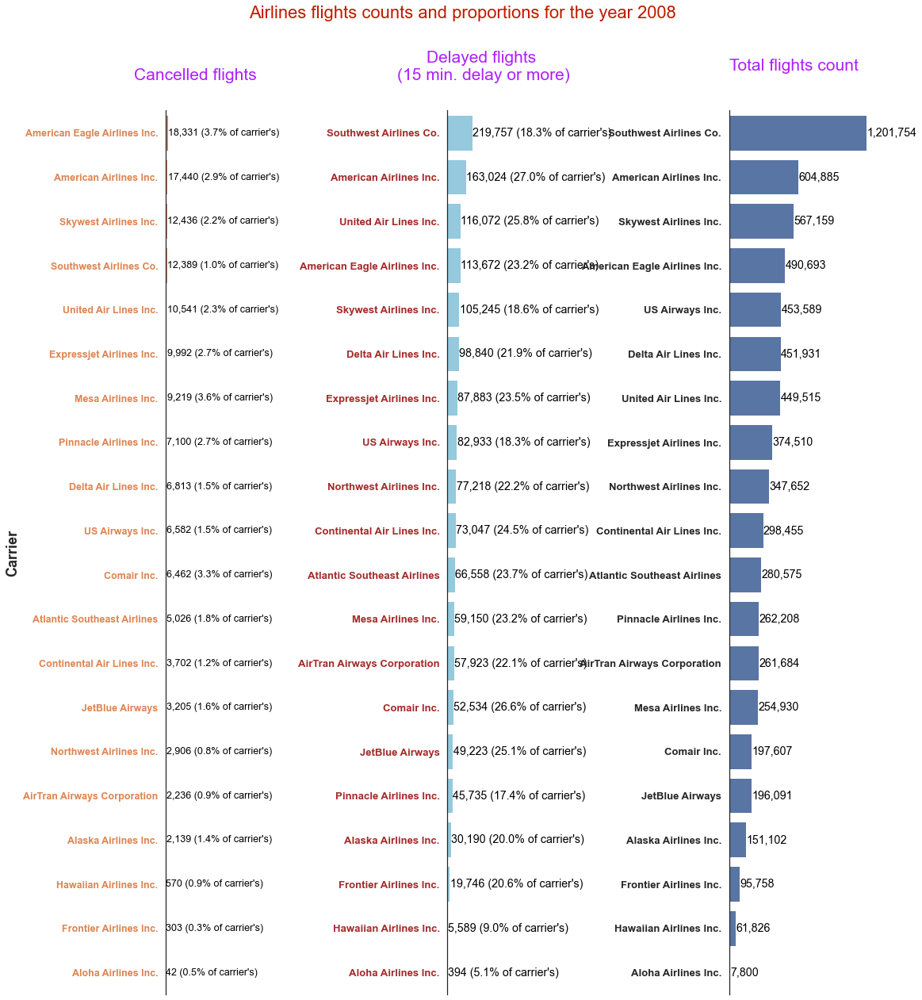

In [141]:
# bivariate plots of Carrier against flights counts
# for the whole data points df_inv (7,009,728 rows), against df_inv_15 (1,524,733  rows) 

default_color = sns.color_palette()[0]

fig, ax = plt.subplots(1, 3, sharex=True,figsize=(16,20.5))

plt.suptitle('Airlines flights counts and proportions for the year 2008',
             fontsize=22,color='#BF1B00',x=.45,y=.97)
# first subplot
ax[0] = plt.subplot(1,3,1)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)


sns.countplot(data = airline_cancelled ,
              y = 'Carrier',
              order = airline_cancelled['Carrier'].value_counts().index,
              color = sns.color_palette()[1],
              ax=ax[0])

plt.title('Cancelled flights',fontsize=21,color='#AD1FFF',x=.205,y=1.03)

plt.xlabel('')
plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = sns.color_palette()[1],fontsize=12.5)

# Recalculating the flights_counts for carriers
carrier_flights_count = airline_cancelled['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    string = str(f"{count:,}") + " ({:0.1f}% of carrier's)".format(percentage_value)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black',fontsize=12.5);
    
##################################    
# second subplot
ax[1] = plt.subplot(1,3,2)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

sns.countplot(data = df_inv_15, y = 'Carrier',
              order = df_inv_15['Carrier'].value_counts().index,
              color = 'skyblue',
              ax=ax[1])

plt.title('Delayed flights \n(15 min. delay or more)',fontsize=21,color='#AD1FFF',x=.25,y=1.03)

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv_15['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    string = str(f"{count:,}") + " ({:0.1f}% of carrier's)".format(percentage_value)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
    
##################################    
# third subplot
ax[2] = plt.subplot(1,3,3)
sns.countplot(data = df_inv, y = 'Carrier',
              order = df_inv['Carrier'].value_counts().index,
              color = default_color,
              ax=ax[2])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title('Total flights count',fontsize=21,color='#AD1FFF',x=.45,y=1.04)
plt.xlabel('')
plt.ylabel('')

plt.xticks([])

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    string = str(f"{count:,}") #+ ' flights'
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
plt.subplots_adjust(wspace=0.95);

    #if percentage_value >;
#plt.yticks([])

Faceted horizontal bar plots, for cancelled flights, versus flights with arrival delay of 15+ minutes, versus all recorded flights counts, per carrier.

'Southwest Airlines Co.' had the fourth highest total count of cancelled flights during 2008, after 'American Eagle Airlines Inc.', 'American Airlines Inc.', and 'Skywest Airlines Inc.' respectively.

### <font color='blue'>Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?</font>

> Bivariate investigation assures that in general, **'NAS' delays had more lower-values frequencies, then 'Carrier', for flights with 15+ minutes arrival delay**.

> In general, **Weather-delays had the highest mean, median, the wider IQR, and a wider range from its higher median to its third quartile** over other-causes delays. However, **delays of other-causes had much more distributions around their lower medians**. Carrier-delays had the second highest delays mean, then NAS's came third. At last, security-delays had the lowest delays mean.

> **'Carrier' and 'NAS' had the largest counts of lower-values delays for different months**, though 'NAS' exceeded in this almost all months. Some months had much more lower causes-delays values than others.

> **'Weather'-delays had the highest medians, and the largest third quartile ranges all over months**. Then came 'Carrier'-delays, except about 3 or 4 months where 'NAS'-delays had larger medians, but smaller third quartile ranges also. At last 'Security'-delays had lowest medians and third quartile ranges across months.

> **'Weather'-delays are the highest on average within different 2008 months**, notably in 'Jul' and 'Sep'. Then 'Carrier'-delays, 'NAS' or national air system-delays, and 'Security'-delays at last, come in order respectively.

> **Greater-values distributions due to 'Weather'-delays were the largest** all over months.

> **'Carrier', as well 'NAS'-delays, had the largest counts of lower-values for different carriers**, especially in cases of 'Southwest Airlines Co.' and 'American Airlines Inc.'. Some carriers had much more lower causes-delays values than others.

> **There weren't any 'Security'-delays in 'AirTran Airways Corporation'**. **Unlike in 'Frontier Airlines Inc.'**, where the highest median, as well the largest second and third quartiles ranges, were for 'Security'-delays against other delay-causes, in the carrier. 'Security'-delays in the same carrier had the largest IQR range, as well the range from the second to the third quartiles.

> **Weather-delays distributions were the highest at all within 'Mesa Airlines Inc.', 'Expressjet Airlines Inc.', 'JetBlue Airways', 'Skywest Airlines Inc.', 'AirTran Airways Corporation', and 'Aloha Airlines Inc.'**.

> **'Weather'-delays were the highest on average within almost the majority of carriers**. Then also, in general, 'Carrier'-delays, 'NAS' or national air system-delays, and 'Security'-delays at last, came in order, except in few carriers.
**Unlike the rule, 'Security'-delays were the highest on average within 'Frontier Airlines Inc.' and 'Delta Air Lines Inc.'**. 'Security'-delays also may were the second or the third in other carriers, such as 'United Air Lines Inc.' and 'American Airlines Inc.'.
However, **'AirTran Airways Corporation' flights doesn't seem to be delayed due to security at all**.

> **Flights that had weather-delays were probably to have the most arrival delays in general**. In the second stage, flights with carrier-delays were more probably to arrive before weather-delayed flights. At third, National Air System-delays stood up, and the NAS-delayed flights were more probably to arrive earlier than the first both causes. At last, in general, security-delayed flights were more probably to arrive faster than other delayed flights.

> **'Weather' had the highest impact on flights arrival delays within different 2008 months**. Then 'Carrier', 'NAS' or national air system, and 'Security' at last, come in order respectively in general, except for 'Jul' where 'Carrier' was third after 'NAS'.

> On average, amongst other delay-causes, **'Weather' had the highest impact on flights arrival delays within almost all carriers, except in case of 'Frontier Airlines Inc.'** where probably by far,'Security' went up with the highest impact on flights arrival delays. Then, also on average, 'Carrier' and 'NAS' or national air system, are swapping the second and the third highest impacts, except in few carriers where 'Security' may exceed like in 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.

> For all delayed or flights of 15+ arrival delay, **there were some kind of linearity between arrival delays, and some point before 250 minutes (and about 50 minutes for sampled data) of delays of different delay-causes**. 'Carrier' and NAS-delays had moderate correlations to arrival delays. There was a more spread range for carrier-delays overall, even than NAS-delays which come secondly with higher frequencies of lower values. At third, weather-delays come with a weaker correlation to arrival delay. Security-delays seemed not to have a significant correlation to arrival delays, with a small distribution range compared to other delay-causes.

> **More stronger moderate correlation between arrival delays and carrier-delays**, than the moderate one between arrival delays and NAS-delays.

> For the sample data, after log scaling causes-delays axes against original arrival delays axis, **the kind of linearity started from about 10<sup>1.1</sup> logarithmic minutes of delay-causes, between the log scaled values and original arrival delays**.

> **Arrival delays due to 'Weather' had a higher median (which is about 62 minutes), with a larger third quartile range, and a more wider greater values distribution from about 55 minutes to about 225 minutes** than arrival delays due to other causes. **Arrival delays due to 'Carrier and NAS' had much more distributions around and below their lower-medians**, indicating the higher frequencies of lower-values of arrival-delays due to both of those delay causes. As well, **both were the most to reach higher outliers** values in general. Probably, this made them to have a wider general ranges. However, arrival delays due to weather still have the highest median with a larger third quartile range as stated at first.

> For the whole flights of 15+ min. arrival delay, in general, **arrival-delays due to 'Security' had the lowest median, ranges, as well outliers, and the largest distribution around and below this lowest median, than arrival-delays due to other delay-causes**, which is more reasonable unlike the finding when checking the sampled data.

> **Arrival delays due to 'Weather' had the highest means, medians, with the widest third quartile ranges starting from those medians, and more greater-values distributions, within all 2008 months**, than arrival delays due to other causes. Arrival delays due to 'Carrier' came secondly, then due to 'NAS' or national air system at third in this, and finally arrival-delays due to 'Security'-delays, with more lower-values distribution, in order respectively in general. However, **it differed for 'Jun', and 'Jul' when the median of arrival-delays due to 'Carrier' was equal to arrival-delays' median due to 'NAS', for both months**. Meanwhile, **as usual for all months, arrival delays due to 'Security' had the lowest means, medians, with much of lower-values distributed under their lowest medians**.

> In general, **arrival delays due to 'Weather' had the highest medians, with the widest third quartile ranges starting from those medians, and higher greater-values distributions, within almost all carriers, notably in 'JetBlue Airways', except in case of 'Frontier Airlines Inc.'** where flights arrival delays due to 'Security' went up with the highest median and the widest second quartile range, and higher greater-values distribution. Then, also in general, **arrival delays due to 'Carrier' and 'NAS' or national air system, were swapping the second and the third highest medians, as well lower-values distributions except in few carriers** where arrival delays due to 'Security' may had greater medians and more greater-values distributions, like in 'United Air Lines Inc.', 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.

> Unlike usual regarding different-causes delays within all carriers, **'Northwest Airlines Inc.' had the highest outliers of 'Carrier'-delays,** that almost could reach about 2500 minutes delay.

> **Months 'Dec', 'Jun', 'Feb', and 'Mar' had the highest arrival delays means** exceeding 11 up to about 17 minutes during year 2008. However, **'Oct', 'Sep' and 'Nov' had the lowest** arrival delays means from about 0.4 to 2 minutes amongst the other months.

> **Carriers 'American Airlines Inc.', 'Mesa Airlines Inc.', 'Comair Inc.', 'United Air Lines Inc.', 'JetBlue Airways', and 'Continental Air Lines Inc.', had the most arrival delays means** exceeding 11 up to about 13 minutes during year 2008. However, **'Southwest Airlines Co.', 'Alaska Airlines Inc.', 'Pinnacle Airlines Inc.', 'US Airways Inc.', and 'Hawaiian Airlines Inc.', had the lowest arrival delays means** from about 1 to about 5 minutes amongst the other carriers.

> **Arrival delays mean of 'Aloha Airlines Inc.' was about negative 3 minutes, indicating almost no notable arrival delays** within this carrier flights.

> Months **'Feb', 'Dec', 'Jan', and 'Mar', had the highest flights-cancellation counts** exceeding 16.1k up to about 20.6k flights during year 2008. However, **'May', 'Nov', and 'Oct' had the lowest flights-cancellation counts** from about 3.25k to about 6.23k flights amongst the other months.

> Carriers **'American Eagle Airlines Inc.', 'American Airlines Inc.', 'Skywest Airlines Inc.', 'Southwest Airlines Co.', 'United Air Lines Inc.', and 'Expressjet Airlines Inc.', had the highest flights-cancellation counts** from about 10k up to about 18.3k flights during year 2008. However, **'Hawaiian Airlines Inc.', 'Frontier Airlines Inc.', and 'Aloha Airlines Inc.' had the lowest flights-cancellation counts** which are '570', '303', and '42' flights respectively, amongst the other carriers.

> **"Weather" had the highest impact to cancel flights within months 'Feb', 'Dec', 'Jan', 'Mar', as well 'Sep'**. However, the "Carrier" procedures itself had the second highest impact within the same months, and the highest impact within all other months. "National Air system" comes third in general, except it had the second highest impact to cancel a flight within months 'Apr', 'May', 'Jul', and 'Nov'.

> **"Carrier" procedures had the highest impact to cancel flights within 11 Airlines carriers of 20**, and the second highest impact within other 6, and the third highest impact in other 3. However, **the "Weather" had the highest impact to cancel flights within 9 Airlines carriers of 20**, and the second highest impact within other 8, and the third within other 2. **"NAS" or National Air System had the second highest impact to cancel flights within 5 Airlines carriers of 20**, and the third highest impact within other 13.

> **'American Airlines Inc.' which come second in total cancelled flights, had more cancellations due to 'Carrier'** than other causes, even more than cancelled flights due to weather within 'American Eagle Airlines Inc.', the carrier that recorded the highest total count of cancelled flights, which most of them were cancelled due weather.

> **'Hawaiian Airlines Inc.'s flights-cancellation were because of 'Carrier', as a majority,** and a few number cancelled due 'Weather'. However, 'Frontier Airlines Inc.'s cancelled-flights were because of 'Weather' then 'Carrier' respectively, as a majority, and a few number cancelled due 'NAS'. **All 'Aloha Airlines Inc.'s cancelled-flights were because of 'Carrier'**.

> **Flights-cancellation due 'Security' doesn't seem to be the common**.

> All **2008 months had close-ratios of recorded total flights frequencies**, starting from about 7.5% up to about 9%. However, 9 months had close-ratios of flights delayed for 15+ minutes. 6 months had the ratios from about 9% up to 11%, and 3 others had a ratio about 8%.

> **'Feb' exceeded in the ratio of cancelled flights**, with about 15% of total 2008 cancelled flights. Then 'Dec' and 'Jan' respectively with about 13%.

> **'Southwest Airlines Co.'** _recorded_:
     <br>_1<sup>st</sup>: **The highest total flights count within 2008**_. It looks that it had more recorded flights, than twice of carrier's in next order.
     <br>_2<sup>nd</sup>: **The highest total count of flights with 15+ minutes arrival delay within 2008**_, then 'American Airlines Inc.' was in the next order.
     <br>_3<sup>rd</sup>: **The highest total count of on-time flights during 2008**_, even than twice of the carrier's in next order.
     <br>_4<sup>th</sup>: **The fourth highest total count of cancelled flights during 2008**_, after 'American Eagle Airlines Inc.', 'American Airlines Inc.', and 'Skywest Airlines Inc.' respectively.

### <font color='blue'>Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?</font>

> __Not yet!__ However, this may come to light next section.

## <font color='blue'>Multivariate Exploration</font>

In [142]:
df_inv

,Month,Carrier,ArrDelay,Cancelled,CancellationCode,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,Jan,Southwest Airlines Co.,-14.0,0,NaN,NaN,NaN,NaN,NaN
1,Jan,Southwest Airlines Co.,2.0,0,NaN,NaN,NaN,NaN,NaN
2,Jan,Southwest Airlines Co.,14.0,0,NaN,NaN,NaN,NaN,NaN
3,Jan,Southwest Airlines Co.,-6.0,0,NaN,NaN,NaN,NaN,NaN
4,Jan,Southwest Airlines Co.,34.0,0,NaN,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
7009719,Dec,Delta Air Lines Inc.,14.0,0,NaN,NaN,NaN,NaN,NaN
7009720,Dec,Delta Air Lines Inc.,-2.0,0,NaN,NaN,NaN,NaN,NaN
7009721,Dec,Delta Air Lines Inc.,0.0,0,NaN,NaN,NaN,NaN,NaN
7009722,Dec,Delta Air Lines Inc.,9.0,0,NaN,NaN,NaN,NaN,NaN


In [143]:
df_inv_15               # Month 	 Carrier 	 ArrDelay       CarrierDelay	WeatherDelay	NASDelay	SecurityDelay

,Month,Carrier,ArrDelay,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,Jan,Southwest Airlines Co.,34.0,2.0,0.0,0.0,0.0
1,Jan,Southwest Airlines Co.,57.0,10.0,0.0,0.0,0.0
2,Jan,Southwest Airlines Co.,80.0,8.0,0.0,0.0,0.0
3,Jan,Southwest Airlines Co.,15.0,3.0,0.0,0.0,0.0
4,Jan,Southwest Airlines Co.,16.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
1524728,Dec,Delta Air Lines Inc.,19.0,0.0,0.0,19.0,0.0
1524729,Dec,Delta Air Lines Inc.,75.0,0.0,57.0,18.0,0.0
1524730,Dec,Delta Air Lines Inc.,99.0,1.0,0.0,19.0,0.0
1524731,Dec,Delta Air Lines Inc.,15.0,0.0,0.0,15.0,0.0


In [144]:
# 500 sample
df_inv_15_samp.reset_index(drop=True) 

,Month,Carrier,ArrDelay,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay
0,Jan,American Airlines Inc.,50.0,17.0,0.0,33.0,0.0
1,Oct,American Airlines Inc.,81.0,0.0,0.0,0.0,0.0
2,Dec,American Eagle Airlines Inc.,26.0,0.0,0.0,9.0,0.0
3,Feb,Delta Air Lines Inc.,84.0,0.0,20.0,39.0,0.0
4,Jun,American Eagle Airlines Inc.,72.0,0.0,0.0,9.0,0.0
...,...,...,...,...,...,...,...
495,Jun,Expressjet Airlines Inc.,79.0,79.0,0.0,0.0,0.0
496,Nov,United Air Lines Inc.,103.0,0.0,0.0,103.0,0.0
497,Mar,JetBlue Airways,145.0,0.0,0.0,145.0,0.0
498,Jun,US Airways Inc.,17.0,17.0,0.0,0.0,0.0


In [145]:
melt_15                       #  Month	Carrier		ArrDelay	Cause	Minutes

,Month,Carrier,ArrDelay,Cause,Minutes
0,Jan,Southwest Airlines Co.,34.0,Carrier,2.0
1,Jan,Southwest Airlines Co.,57.0,Carrier,10.0
2,Jan,Southwest Airlines Co.,80.0,Carrier,8.0
3,Jan,Southwest Airlines Co.,15.0,Carrier,3.0
4,Jan,Southwest Airlines Co.,37.0,Carrier,12.0
...,...,...,...,...,...
1704832,Dec,Continental Air Lines Inc.,84.0,Security,6.0
1704833,Dec,Continental Air Lines Inc.,21.0,Security,21.0
1704834,Dec,Continental Air Lines Inc.,15.0,Security,15.0
1704835,Dec,Continental Air Lines Inc.,15.0,Security,11.0


In [146]:
melt_samp_15                       #  Month	Carrier		ArrDelay	Cause	Minutes

,Month,Carrier,ArrDelay,Cause,Minutes
0,Jan,American Airlines Inc.,50.0,Carrier,17.0
1,Sep,Expressjet Airlines Inc.,18.0,Carrier,9.0
2,Jan,United Air Lines Inc.,24.0,Carrier,7.0
3,Oct,Skywest Airlines Inc.,35.0,Carrier,35.0
4,Oct,Atlantic Southeast Airlines,26.0,Carrier,3.0
...,...,...,...,...,...
561,Mar,JetBlue Airways,145.0,National Air System,145.0
562,Jan,Skywest Airlines Inc.,15.0,Security,15.0
563,Jan,Southwest Airlines Co.,79.0,Security,13.0
564,Dec,US Airways Inc.,24.0,Security,13.0


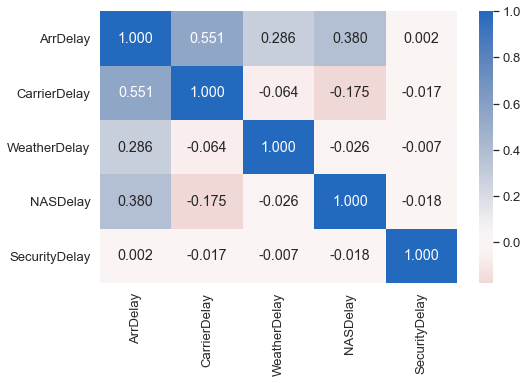

In [147]:
# correlation plot for ArrDelay and delay causes,
# for arrival delays of 15 minutes or more df_inv_15 (1,524,733 rows)

delays_cols = ['ArrDelay','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']

plt.figure(figsize = [8, 5])
sns.heatmap(df_inv_15[~zeros_mask][delays_cols].corr(),
            annot = True, fmt = '.3f',
            cmap = 'vlag_r', center = 0);

From the heatmap, we notice the stronger moderate correlation between arrival delays and carrier delays which was about positive 0.551; than the moderate one between arrival delays and NAS delays which was positive 0.380; and than the weaker one between arrival delays and weather delays which was positive 0.286.

The correlation between arrival delays and security delays was almost nonexistent, where the correlation was positive 0.002.

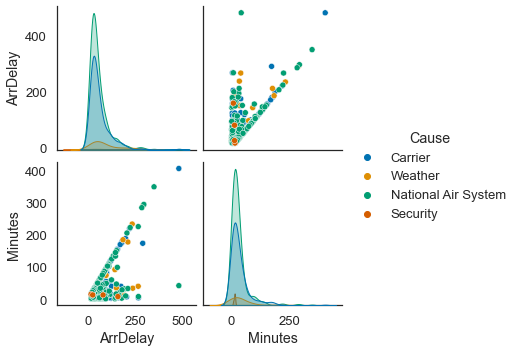

In [148]:
# exploring delays columns in "melt_samp_15" sampled dta of flights with 15+ min. arrival delay
    
sns.pairplot(melt_samp_15, vars=['ArrDelay','Minutes'], diag_kind="kde",
             hue="Cause",
             palette=sns.color_palette('colorblind')[:4]);

The plot for sampled data. It shows more frequencies for arrival delays due to 'NAS'; then due to 'Carrier', 'Weather' and 'Security' in order.

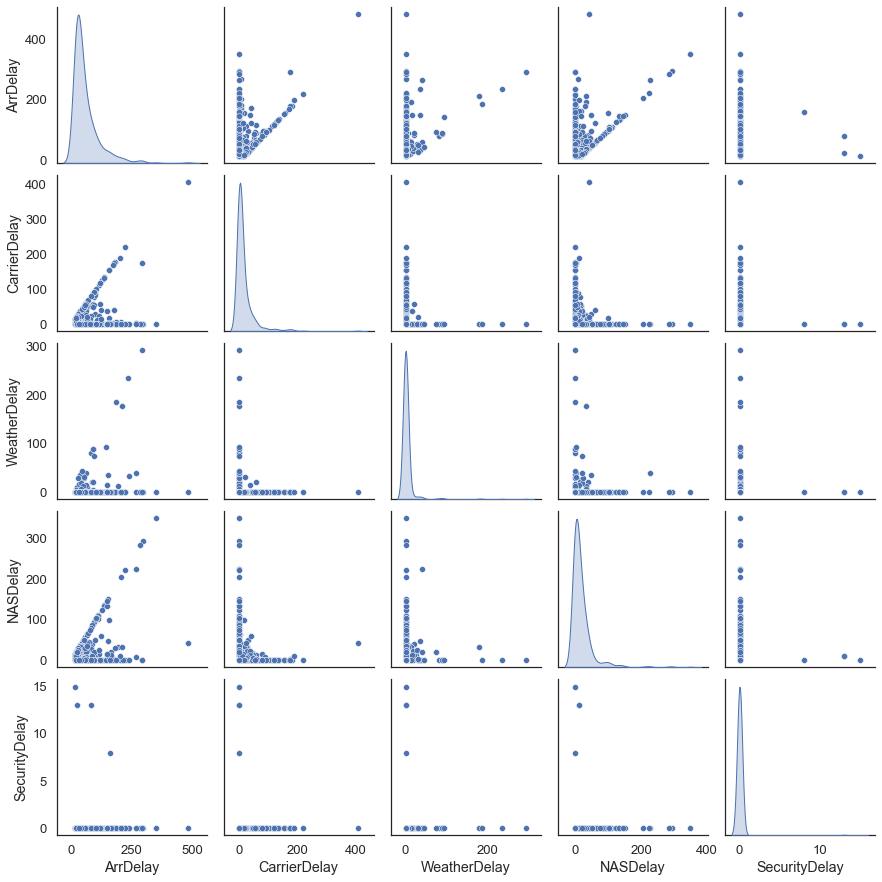

In [149]:
# exploring delays columns in "df_inv_15_samp" sampled dta of flights with 15+ min. arrival delay

#(using pairplot)
    
sns.pairplot(df_inv_15_samp, vars=delays_cols, diag_kind="kde");#,hue="Cause")

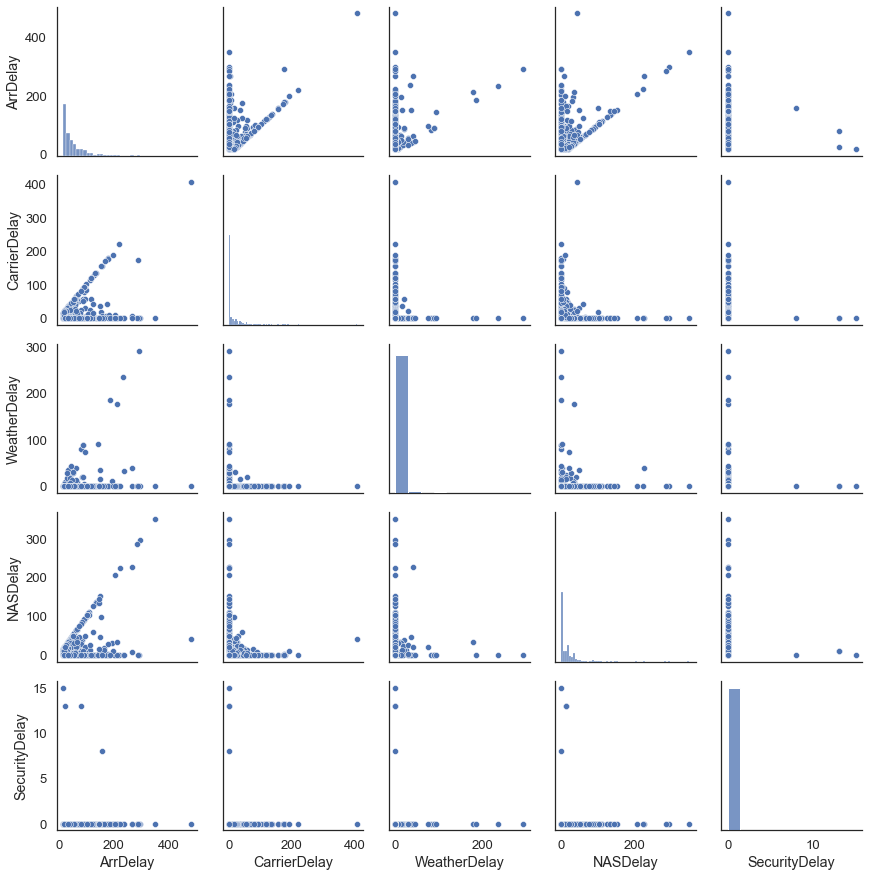

In [150]:
# PairedGrid for delays columns in "df_inv_15_samp" sampled dta of flights with 15+ min. arrival delay

# (using PairedGrid)
    
g = sns.PairGrid(df_inv_15_samp, vars=delays_cols)#,hue="Cause")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot);
#g.add_legend();

It could be hard to interpret the grid even for the sample data here. However, we may notice the stronger moderate correlation between ArrDelay and CarrierDelay assured by the heatmap before.

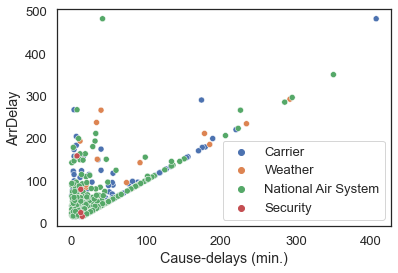

In [151]:
# Different-causes delays Vs. Arrival delays (for sampled data of flights with 15+ min. arrival delay)

sns.scatterplot(data=melt_samp_15, x='Minutes',y='ArrDelay',hue="Cause")
plt.xlabel('Cause-delays (min.)')
plt.legend();

This scatter plot for sample data shows larger range in carrier-delays due to outliers.

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/3920238421.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[0,0].set_yticklabels(labels = yticklabels)
C:\Users\UN\AppData\Local\Temp/ipykernel_2216/3920238421.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[0,0].set_xticklabels(labels = xticklabels);#,fontsize=15.5);


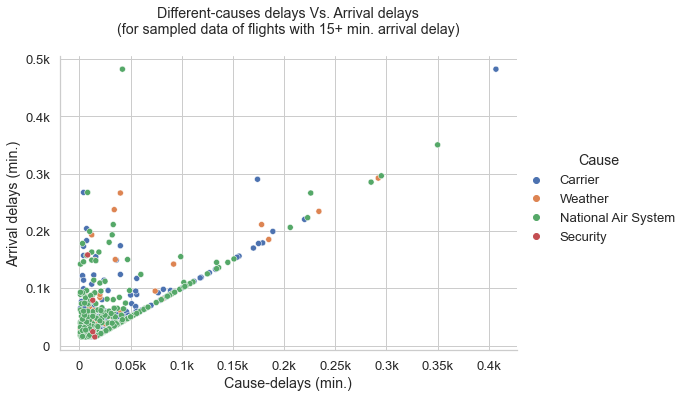

In [152]:
# Different-causes delays Vs. Arrival delays (for sampled data of flights with 15+ min. arrival delay)

sns.set(font_scale=1.19,style='whitegrid')
g = sns.PairGrid(melt_samp_15, x_vars='Minutes',y_vars='ArrDelay',hue="Cause",height=5,aspect=1.5)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()


plt.title('Different-causes delays Vs. Arrival delays\n(for sampled data of flights with 15+ min. arrival delay)\n')
plt.xlabel('Cause-delays (min.)')
plt.ylabel('Arrival delays (min.)')
#g.set_yticks(ticks = np.arange(0,3,0.5)*1000)
#yticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()[1:]]
yticklabels = [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()]
yticklabels = [label.replace('0.0k','0') for label in yticklabels]
g.axes[0,0].set_yticklabels(labels = yticklabels)

xticklabels = [str(n/1000) + 'k' for n in g.axes[0][0].get_xticks()]
xticklabels = [label.replace('0.0k','0') for label in xticklabels]
g.axes[0,0].set_xticklabels(labels = xticklabels);#,fontsize=15.5);

This is a polished version for the previous scatterplot but using PairGrid. It shows the higher frequencies of lower-delays values due to 'NAS'.

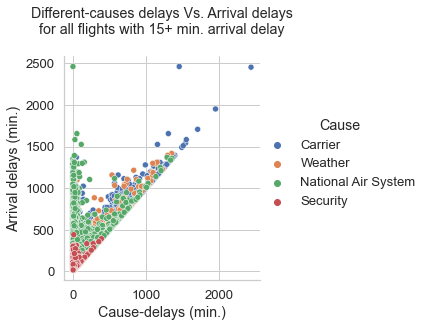

In [153]:
# Different-causes delays Vs. Arrival delays for all flights with 15+ min. arrival delay

g = sns.PairGrid(melt_15, x_vars='Minutes',y_vars='ArrDelay',hue="Cause",height=4)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

plt.title('Different-causes delays Vs. Arrival delays\nfor all flights with 15+ min. arrival delay\n')
plt.xlabel('Cause-delays (min.)')
plt.ylabel('Arrival delays (min.)');

The plot is for the all flights with 15+ minutes or more arrival delay. It backs the previous findings related to correlations, ranges, and lower-values frequencies. Arrival-delays due to 'Security' were the lowest count in general.

C:\Users\UN\AppData\Local\Temp/ipykernel_2216/772185180.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[0,0].set_yticklabels(labels = yticklabels)
C:\Users\UN\AppData\Local\Temp/ipykernel_2216/772185180.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[0,0].set_xticklabels(labels = xticklabels);


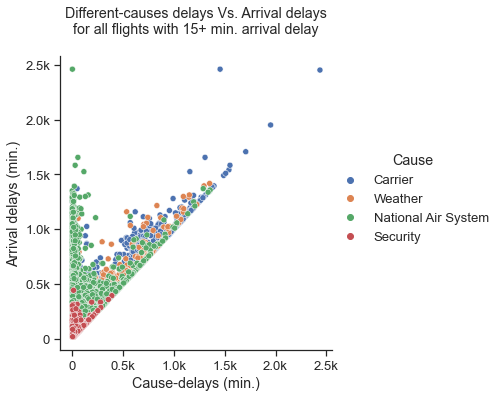

In [154]:
# Different-causes delays Vs. Arrival delays for all flights with 15+ min. arrival delay (polished)

sns.set(font_scale=1.19,style='ticks')
g = sns.PairGrid(melt_15, x_vars='Minutes',y_vars='ArrDelay',
                 hue="Cause",#palette=sns.color_palette(n_colors=4),
                 height=5,aspect=1)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

plt.title('Different-causes delays Vs. Arrival delays\nfor all flights with 15+ min. arrival delay\n')
plt.xlabel('Cause-delays (min.)')
plt.ylabel('Arrival delays (min.)')

yticklabels = [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()]
yticklabels = [label.replace('0.0k','0') for label in yticklabels]
g.axes[0,0].set_yticklabels(labels = yticklabels)

xticklabels = [str(n/1000) + 'k' for n in g.axes[0][0].get_xticks()]
xticklabels = [label.replace('0.0k','0') for label in xticklabels]
g.axes[0,0].set_xticklabels(labels = xticklabels);

A more polished plot of the previous.

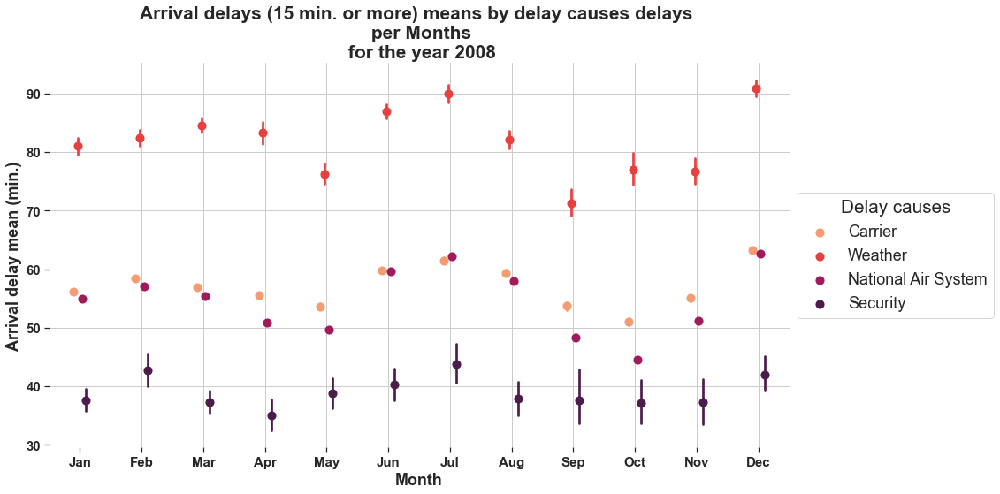

In [155]:
plt.figure(figsize = [15,8])

ax = sns.pointplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                   linestyles='',dodge= 0.2,scale=1.15
                  ,palette = 'rocket_r')

ax.set_title('Arrival delays (15 min. or more) means by delay causes delays \n per Months\n for the year 2008',
             fontsize=21,weight='bold')
ax.set_xlabel('Month',fontsize=18,weight='bold')
ax.set_ylabel('Arrival delay mean (min.)',fontsize=18,weight='bold')

plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

legend = ax.legend(loc = 6, ncol = 1,  framealpha = .8, title = 'Delay causes',# labels=causes,  
                   fontsize=14, bbox_to_anchor = (1,0.5),prop={'size':18},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large')  

sns.despine(left=True,bottom=True)
plt.grid(True);

This is a polished multivariate point plot of previous bivariate point-plots faceted by months, of arrival-delays means given by delay-causes.

In [156]:
columns={'ArrDelay':'Arrival delay mean (min.)','Minutes':'Cause delay mean (min.)'}

#melt_15[list(set(melt_15.columns) -{'Cancelled'})].groupby(['Month','Cause']).mean().rename(columns=columns) 
melt_15.groupby(['Month','Cause']).mean().rename(columns=columns)

Arrival delay mean (min.)  Cause delay mean (min.)
Month Cause                                                                  
Jan   Carrier                              56.171442                36.079481
      National Air System                  54.892898                28.103122
      Security                             37.524057                16.790637
      Weather                              80.988028                43.981173
Feb   Carrier                              58.401192                36.286006
      National Air System                  57.075527                27.780957
      Security                             42.727987                17.863208
      Weather                              82.425008                44.660814
Mar   Carrier                              56.856152                34.910855
      National Air System                  55.464507                26.868463
      Security                             37.348328                17.435986
      Weather                              84.570406                46.547068
Apr   Carrier                              55.486343                35.108070
      National Air System                  50.932327                25.086923
      Security                             35.063025                16.060924
      Weather                              83.361501                48.953925
May   Carrier                              53.620574                33.535753
      National Air System                  49.617749                26.008819
      Security                             38.816701                19.859470
      Weather                              76.167979                41.997025
Jun   Carrier                              59.820534                35.793324
      National Air System                  59.588023                30.752175
      Security                             40.255499                17.959391
      Weather                              86.900625                47.672530
Jul   Carrier                              61.506064                39.506669
      National Air System                  62.192084                33.147465
      Security                             43.842610                25.193858
      Weather                              89.995229                55.242421
Aug   Carrier                              59.367418                38.772434
      National Air System                  57.919304                30.155358
      Security                             37.902116                19.613757
      Weather                              82.097683                46.223175
Sep   Carrier                              53.721025                39.542116
      National Air System                  48.372589                27.562945
      Security                             37.636816                23.995025
      Weather                              71.277867                50.443945
Oct   Carrier                              51.009869                34.557236
      National Air System                  44.460146                24.703283
      Security                             37.105634                18.609155
      Weather                              76.976979                42.444265
Nov   Carrier                              55.038367                33.525817
      National Air System                  51.180908                28.693960
      Security                             37.261411                16.958506
      Weather                              76.694975                38.078099
Dec   Carrier                              63.262444                33.489687
      National Air System                  62.661970                27.564933
      Security                             41.957162                16.306560
      Weather                              90.865911                44.833603

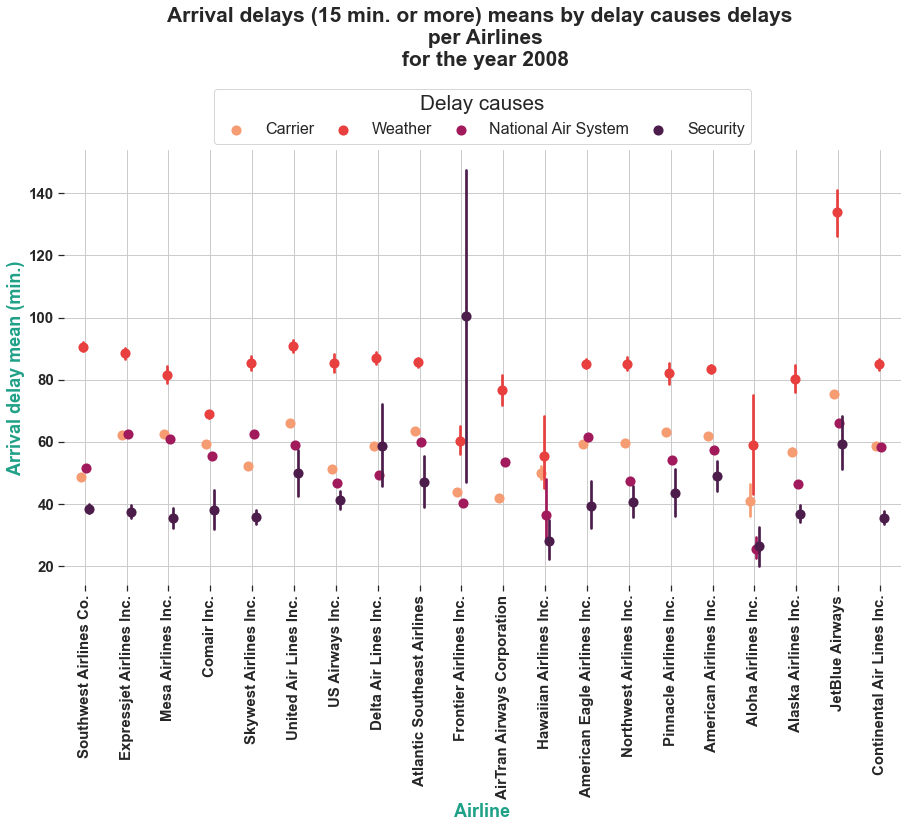

In [157]:
plt.figure(figsize = [15,8])

#plt.suptitle('Arrival delay means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.pointplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                   linestyles='',dodge= 0.2,scale=1.15
                  ,palette = 'rocket_r')
title = 'Arrival delays (15 min. or more) means by delay causes delays \n per Airlines'

ax.set_title(title+'\n for the year 2008',fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay mean (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large')  

sns.despine(left=True,bottom=True)
plt.grid(True);

This is a polished multivariate point plot of previous bivariate point-plots faceted by carriers, of arrival-delays means given by delay-causes.

In [158]:
columns={'ArrDelay':'Arrival delay mean (min.)','Minutes':'Cause delay mean (min.)'}
melt_15.groupby(['Carrier','Cause']).mean().rename(columns=columns)
#melt_15[list(set(melt_15.columns) -{'Cancelled'})].groupby(['Carrier','Cause']).mean().rename(columns=columns)

Arrival delay mean (min.)  \
Carrier                     Cause                                            
AirTran Airways Corporation Carrier                              42.115972   
                            National Air System                  53.588426   
                            Weather                              76.769874   
Alaska Airlines Inc.        Carrier                              56.899871   
                            National Air System                  46.367842   
...                                                                    ...   
US Airways Inc.             Weather                              85.449527   
United Air Lines Inc.       Carrier                              66.042223   
                            National Air System                  59.105156   
                            Security                             49.883721   
                            Weather                              91.000000   

                                                 Cause delay mean (min.)  
Carrier                     Cause                                         
AirTran Airways Corporation Carrier                            31.822994  
                            National Air System                26.499704  
                            Weather                            51.468619  
Alaska Airlines Inc.        Carrier                            38.939147  
                            National Air System                19.703027  
...                                                                  ...  
US Airways Inc.             Weather                            40.166798  
United Air Lines Inc.       Carrier                            36.718466  
                            National Air System                29.436918  
                            Security                           38.627907  
                            Weather                            41.386162  

[79 rows x 2 columns]

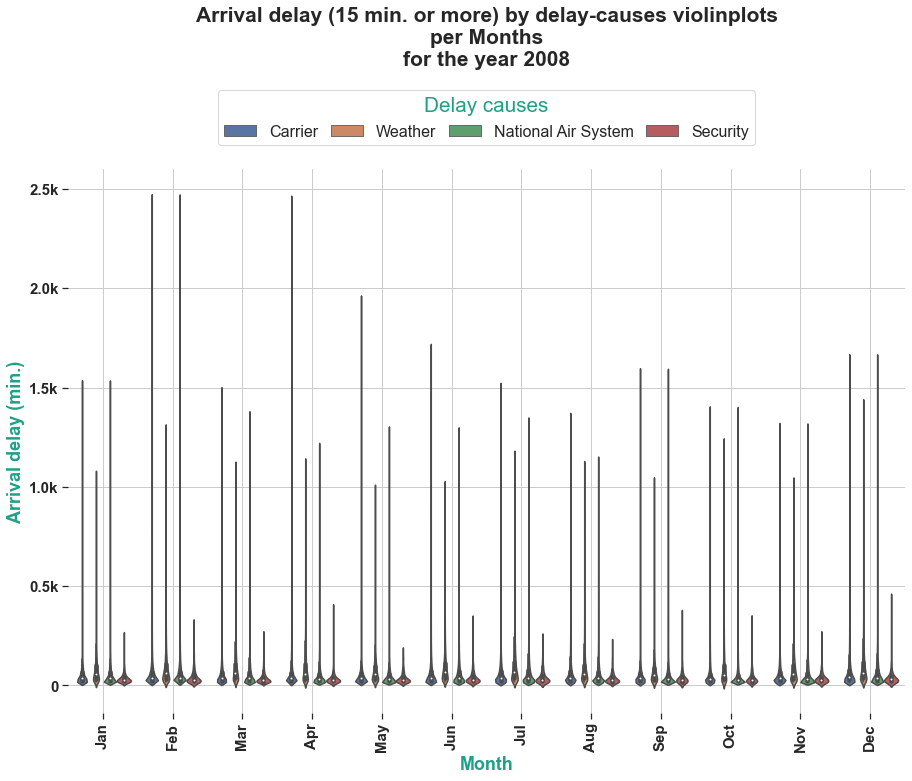

In [159]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                    #order=month_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')


title = 'Arrival delay (15 min. or more) by delay-causes violinplots\nper Months'# (from highest total arrival delay mean)'
        

ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

This is a polished multivariate violin plot of previous bivariate violin-plots faceted by months, of arrival-delays by delay-causes.

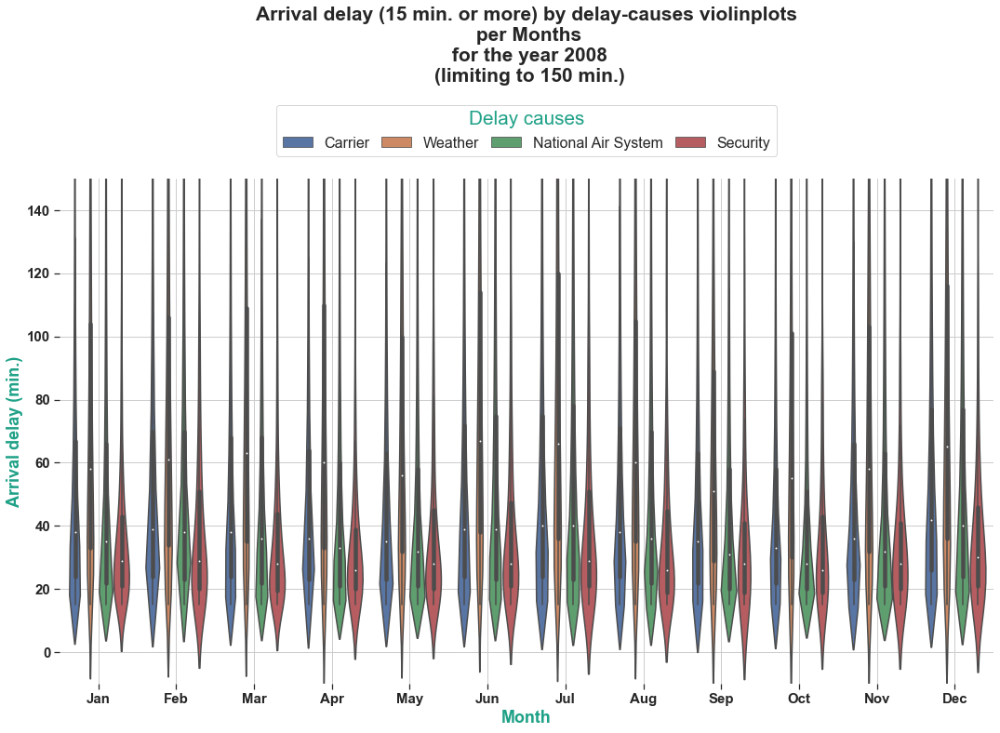

In [160]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                    #order=month_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Months'# (from highest total arrival delay mean)'
ax.set_title(title +'\n for the year 2008' + '\n (limiting to 150 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(-10,150)
plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

The last violin plot with limited range.

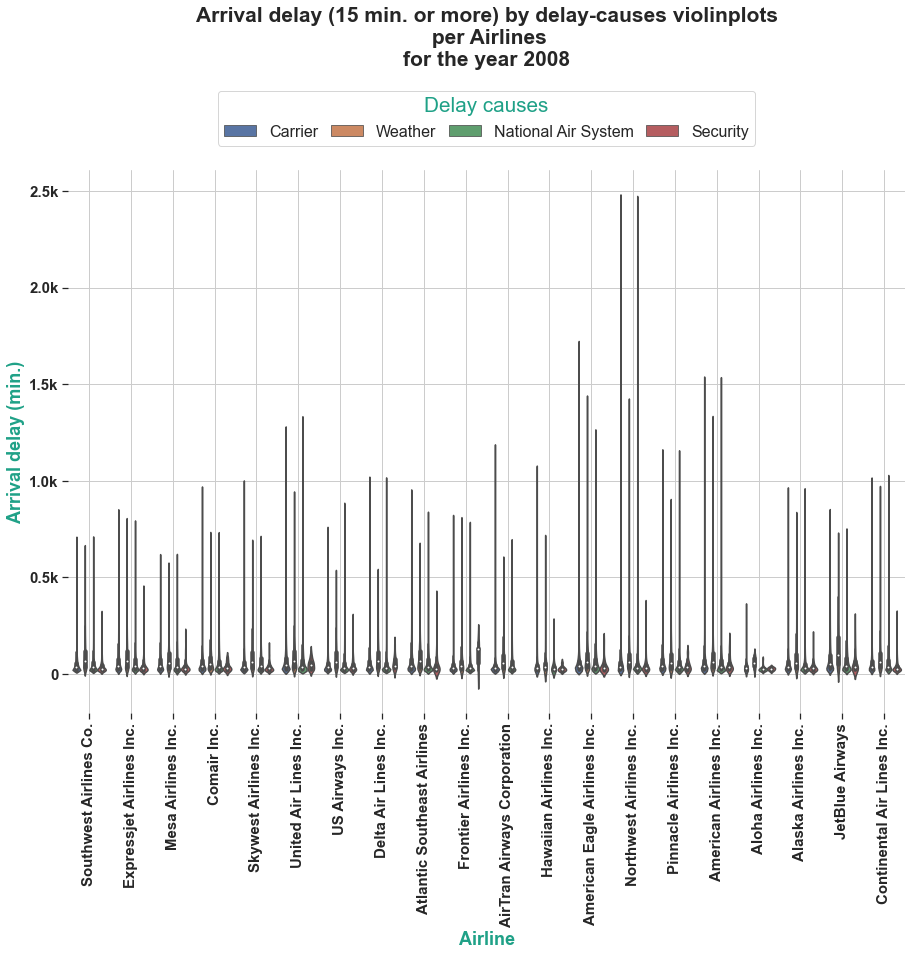

In [161]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                 #order=airlines_arr_means.index,
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Airlines' # (from highest total arrival delay mean)'
        
ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)

plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

This is a polished multivariate violin plot of previous bivariate violin-plots faceted by carriers, of arrival-delays by delay-causes.

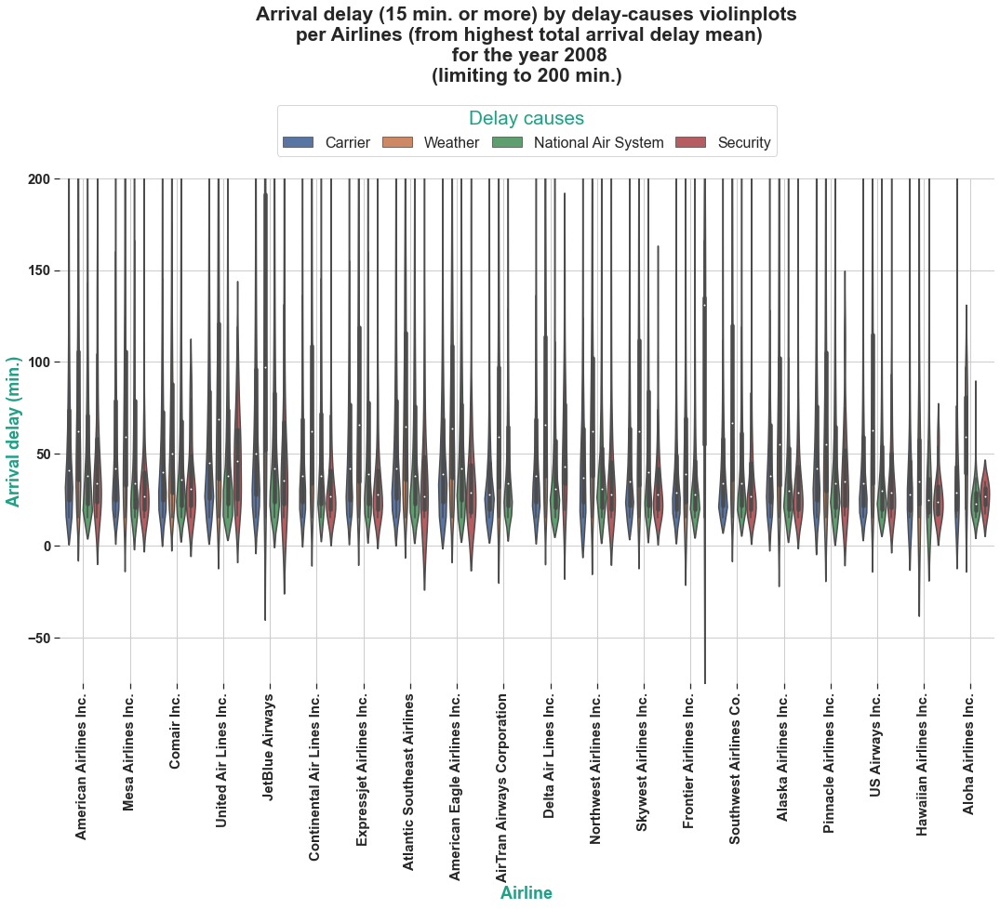

In [162]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                    order=airlines_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Airlines (from highest total arrival delay mean)'
ax.set_title(title + '\n for the year 2008' + '\n(limiting to 200 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(-75,200)
plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large',color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);  

The last violin plot with limited range.

### <font color='blue'>Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?</font>

> **Almost all findings from previous faceted univariate and bivariate plots came again** in this section with more ease in investigating.

> Multivariate investigation assures the **stronger moderate correlation between arrival delays and carrier delays** which was about positive 0.551; than the **moderate one between arrival delays and NAS delays** which was positive 0.380; and than the **weaker one between arrival delays and weather delays** which was positive 0.286.However, **The correlation between arrival delays and security delays was almost nonexistent**, where the correlation was positive 0.002.

> **More frequencies for arrival delays due to 'NAS'**; then due to 'Carrier', 'Weather' and 'Security' in order.

> **The higher frequencies of arrival lower-delays values were due to 'NAS'**. However, arrival delays due to 'Security' may had much lower values than all.

### <font color='blue'>Were there any interesting or surprising interactions between features?</font>

> Arrival delays were thought to have at least the highest correlation with weather delays. **However, 'Carrier' and 'NAS'-delays had more higher correlation than 'Weather'-delays with arrival delays**.

> What was of surprising also, **the arrival delays mean of 'Aloha Airlines Inc.' carrier, which was about negative 3 minutes** indicating almost no notable arrival delays within this carrier flights.

> At the end of your report, make sure that you export the notebook as an
html file from the `File > Download as... > HTML` menu. Make sure you keep
track of where the exported file goes, so you can put it in the same folder
as this notebook for project submission. Also, make sure you remove all of
the quote-formatted guide notes like this one before you finish your report!

In [25]:
sns.color_palette()

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'


In [608]:
sns.color_palette('dark')

[(0.0, 0.10980392156862745, 0.4980392156862745),
 (0.6941176470588235, 0.25098039215686274, 0.050980392156862744),
 (0.07058823529411765, 0.44313725490196076, 0.10980392156862745),
 (0.5490196078431373, 0.03137254901960784, 0.0),
 (0.34901960784313724, 0.11764705882352941, 0.44313725490196076),
 (0.34901960784313724, 0.1843137254901961, 0.050980392156862744),
 (0.6352941176470588, 0.20784313725490197, 0.5098039215686274),
 (0.23529411764705882, 0.23529411764705882, 0.23529411764705882),
 (0.7215686274509804, 0.5215686274509804, 0.0392156862745098),
 (0.0, 0.38823529411764707, 0.4549019607843137)]

In [26]:
sns.color_palette('viridis')

[(0.275191, 0.194905, 0.496005),
 (0.212395, 0.359683, 0.55171),
 (0.153364, 0.497, 0.557724),
 (0.122312, 0.633153, 0.530398),
 (0.288921, 0.758394, 0.428426),
 (0.626579, 0.854645, 0.223353)]

In [27]:
sns.color_palette('rocket')

[(0.20973515, 0.09747934, 0.24238489),
 (0.43860848, 0.12177004, 0.34119475),
 (0.67824099, 0.09192342, 0.3504148),
 (0.8833417, 0.19830556, 0.26014181),
 (0.95381595, 0.46373781, 0.31769923),
 (0.96516917, 0.70776351, 0.5606593)]

In [28]:
sns.color_palette('vlag')

[(0.4305964, 0.56276546, 0.74956387),
 (0.66563334, 0.72242871, 0.81414642),
 (0.89443865, 0.89721298, 0.9202854),
 (0.94742246, 0.87278899, 0.86691076),
 (0.85164413, 0.65142189, 0.64145983),
 (0.76133542, 0.43410655, 0.42592523)]

In [ ]:
fuel_econ[['trans', 'comb']].groupby(['trans']).mean().sort_values(['comb'], ascending = False).index


# Find the order in which you want to display the Facets
# For each transmission type, find the combined fuel efficiency
group_means = fuel_econ[['trans', 'comb']].groupby(['trans']).mean()

# Select only the list of transmission type in the decreasing order of combined fuel efficiency
group_order = group_means.sort_values(['comb'], ascending = False).index

# Use the argument col_order to display the FacetGrid in the desirable group_order
g = sns.FacetGrid(data = fuel_econ, col = 'trans', col_wrap = 7, col_order = group_order)
g.map(plt.hist, 'comb')

In [ ]:
g = sns.FacetGrid(data = fuel_econ_subset, hue = 'trans_type', 
                 hue_order = ['Automatic','Manual'],size = 4, aspect = 1.5) 
g.map(sns.regplot, 'displ', 'comb', x_jitter=0.04,fit_reg=False)
plt.xlabel('Displacement (1)')
plt.ylabel('Combined Fuel Eff. (mpg)');

In [ ]:
g = sns.FacetGrid(data = fuel_econ, col = 'VClass',row = 'trans_type',
                 margin_titles = True)
sns.set_theme(style='whitegrid')
g.map(plt.scatter, 'displ' , 'comb')
g.set_titles(row_template='{row_name}', col_template='{col_name}')

In [ ]:
plt.figure(figsize=(12,5))
ax = sns.barplot(data = fuel_econ, x = 'trans_type', y = 'displ', hue = 'VClass')
ax.legend(loc = 8, ncol = 3, framealpha = .8, title = 'VClass')

In [ ]:
# evenly sampled time at 200ms intervals
t = np.arange(0., 5., 0.2)

# red dashes, blue squares and green triangles
plt.plot(t, t, 'r--', t, t**2, 'bs', t, t**3, 'g^')

In [ ]:
ax = plt.subplot()

t = np.arange(0.0, 5.0, 0.01)
s = np.cos(2*np.pi*t)
line, = plt.plot(t, s, lw=2)

plt.annotate('local max', xy=(2, 1), xytext=(3, 1.5),
             arrowprops=dict(facecolor='black', shrink=0.05),
             )

In [ ]:
# loading in the data, sampling to reduce points plotted
fuel_econ = pd.read_csv('fuel-econ.csv')

np.random.seed(2018)
sample = np.random.choice(fuel_econ.shape[0], 200, replace = False)
fuel_econ_subset = fuel_econ.loc[sample]

# plotting the data
plt.figure(figsize = [7,4])
plt.scatter(data = fuel_econ_subset, x = 'displ', y = 'comb', c = 'co2',
            cmap = 'viridis_r')
plt.title('Fuel Efficiency and CO2 Output by Engine Size')
plt.xlabel('Displacement (l)')
plt.ylabel('Combined Fuel Eff. (mpg)')
plt.colorbar(label = 'CO2 (g/mi)');

In [ ]:
# YOUR CODE HERE
plt.figure(figsize=(10,6))
sb.set(font_scale=2,style='white')

plt.scatter(data = pokemon,x='defense', y='speed', c = 'special-defense', cmap ='viridis_r')
plt.xlabel('Defence')
plt.ylabel('Speed')
plt.colorbar(label='Special Defense');

In [ ]:
g = sb.FacetGrid(data = pkmn_types_subset , hue = 'type' ,size = 5 ,aspect = 1.5)
g.map(sb.regplot, 'weight' ,'height',fit_reg=True)
#g.map(plt.scatter, 'weight' ,'height')#,fit_reg=False)

#g.set(xscale='log')
g.add_legend();

In [ ]:
# 'solutions_multiv.py' solution code

type_cols = ['type_1','type_2']
non_type_cols = pokemon.columns.difference(type_cols)
pkmn_types = pokemon.melt(id_vars = non_type_cols, value_vars = type_cols, 
                          var_name = 'type_level', value_name = 'type').dropna()

pokemon_sub = pkmn_types.loc[pkmn_types['type'].isin(['fairy','dragon'])]

# plotting
g = sb.FacetGrid(data = pokemon_sub, hue = 'type', size = 5)
g.map(plt.scatter, 'weight','height')
g.set(xscale = 'log') # need to set scaling before customizing ticks
x_ticks = [0.1, 0.3, 1, 3, 10, 30, 100, 300, 1000]
g.set(xticks = x_ticks, xticklabels = x_ticks)
g.add_legend()

In [ ]:
# YOUR CODE HERE
sedan_classes = ['Minicompact Cars', 'Subcompact Cars', 'Compact Cars', 'Midsize Cars', 'Large Cars']

# Returns the types for sedan_classes with the categories and orderedness
# Refer - https://pandas.pydata.org/pandas-docs/version/0.23.4/generated/pandas.api.types.CategoricalDtype.html
vclasses = pd.api.types.CategoricalDtype(ordered=True, categories=sedan_classes)

# Use pandas.astype() to convert the "VClass" column from a plain object type into an ordered categorical type 
fuel_econ['VClass'] = fuel_econ['VClass'].astype(vclasses)

In [ ]:
# MODIFY THIS CODE
g = sb.FacetGrid(data = pokemon_sub, hue = 'type',palette=['#ee99ac','#7038f8'], size = 5)
g.map(plt.scatter, 'weight','height')
g.add_legend(title='Pokemon type',fontsize=15)
g.set(xscale = 'log')

g.set_xlabels('Weight (kg) "log scale"')
g.set_ylabels('Height (m)')
plt.title("Heights and Weights for Fairy- and Dragon-type Pokemon")


#************
# set up a dictionary to map types to colors
type_colors = {'fairy': '#ee99ac', 'dragon': '#7038f8'}

# plotting
g = sb.FacetGrid(data = pokemon_sub, hue = 'type', size = 5,
                 palette = type_colors)
g.map(plt.scatter, 'weight','height')
g.set(xscale = 'log') # need to set scaling before customizing ticks
x_ticks = [0.1, 0.3, 1, 3, 10, 30, 100, 300, 1000]
g.set(xticks = x_ticks, xticklabels = x_ticks)

# add labels and titles
g.set_xlabels('Weight (kg)')
g.set_ylabels('Height (m)')
plt.title('Heights and Weights for Fairy- and Dragon-type Pokemon')
plt.legend(['Fairy', 'Dragon'], title = 'Pokemon Type')

In [ ]:
# convert cut, color, and clarity into ordered categorical types
ordinal_var_dict = {'cut': ['Fair','Good','Very Good','Premium','Ideal'],
                    'color': ['J', 'I', 'H', 'G', 'F', 'E', 'D'],
                    'clarity': ['I1', 'SI2', 'SI1', 'VS2', 'VS1', 'VVS2', 'VVS1', 'IF']}

for var in ordinal_var_dict:
    pd_ver = pd.__version__.split(".")
    if (int(pd_ver[0]) > 0) or (int(pd_ver[1]) >= 21): # v0.21 or later
        ordered_var = pd.api.types.CategoricalDtype(ordered = True,
                                                    categories = ordinal_var_dict[var])
        diamonds[var] = diamonds[var].astype(ordered_var)
    else: # pre-v0.21
        diamonds[var] = diamonds[var].astype('category', ordered = True,
                                             categories = ordinal_var_dict[var])

In [ ]:
# univariate plots of cut, color, and clarity grades

plt.figure(figsize=(15,9))
sns.set(font_scale=1.14,style='white')
plt.suptitle('Frequencies of cut, color, and clarity',fontsize=18)

# Cut plot
plt.subplot(1,3,1)

cut_classes = ['Ideal', 'Premium', 'Very Good', 'Good','Fair']
cclasses = pd.api.types.CategoricalDtype(ordered=True, categories=cut_classes)
diamonds['cut'] = diamonds['cut'].astype(cclasses)

sns.countplot(diamonds['cut'])
sns.despine()
plt.title('Cut quality classes',fontsize=15)
plt.xticks(rotation=15)

# Color plot
plt.subplot(1,3,2)

color_classes = ['J', 'I', 'H', 'G', 'F', 'E', 'D']
crclasses = pd.api.types.CategoricalDtype(ordered=True, categories=color_classes)
diamonds['color'] = diamonds['color'].astype(crclasses)

#plt.bar(x=diamonds['color'].value_counts().index ,height=diamonds['color'].value_counts())
sns.countplot(diamonds['color'])
sns.despine()
plt.title('Color classes',fontsize=15)
plt.ylabel('')

# Clarity plot
plt.subplot(1,3,3)

clarity_classes = ['IF','I1','SI2','SI1','VS2','VS1','VVS2','VVS1']
clclasses = pd.api.types.CategoricalDtype(ordered=True, categories=clarity_classes)
diamonds['clarity'] = diamonds['clarity'].astype(clclasses)

sns.countplot(diamonds['clarity'])
sns.despine()
plt.title('Clarity classes',fontsize=15)
plt.ylabel('')
plt.xticks(rotation=15)
#plt.tight_layout()
;

In [ ]:
# univariate plots of cut, color, and clarity grades

plt.figure(figsize=(15,12))
sns.set(font_scale=1.14,style='white')
plt.suptitle('Frequencies of cut, color, and clarity',fontsize=18)

# Cut plot
plt.subplot(3,1,1)

cut_classes = ['Ideal', 'Premium', 'Very Good', 'Good','Fair']
cclasses = pd.api.types.CategoricalDtype(ordered=True, categories=cut_classes)
diamonds['cut'] = diamonds['cut'].astype(cclasses)

sns.countplot(diamonds['cut'])
sns.despine()
plt.title('Cut quality classes',fontsize=15)
plt.xticks(rotation=15)
plt.grid(True)

# Color plot
plt.subplot(3,1,2)

color_classes = ['J', 'I', 'H', 'G', 'F', 'E', 'D']
crclasses = pd.api.types.CategoricalDtype(ordered=True, categories=color_classes)
diamonds['color'] = diamonds['color'].astype(crclasses)

#plt.bar(x=diamonds['color'].value_counts().index ,height=diamonds['color'].value_counts())
sns.countplot(diamonds['color'])
sns.despine()
plt.title('Color classes',fontsize=15)
plt.grid(True)
#plt.ylabel('')

# Clarity plot
plt.subplot(3,1,3)

clarity_classes = ['IF','I1','SI2','SI1','VS2','VS1','VVS2','VVS1']
clclasses = pd.api.types.CategoricalDtype(ordered=True, categories=clarity_classes)
diamonds['clarity'] = diamonds['clarity'].astype(clclasses)

sns.countplot(diamonds['clarity'])
sns.despine()
plt.title('Clarity classes',fontsize=15)
#plt.ylabel('')
plt.xticks(rotation=15)
#plt.tight_layout()
plt.grid(True)
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=1.4);

In [ ]:
# multivariate plot of price by cut and color, for approx. 1 carat diamonds

plt.figure(figsize=(13,8))
sns.boxplot(data=diamonds_1, x='cut',y='price',hue='color',dodge=0.7)
plt.legend(loc='upper center',ncol=7,markerscale =.6)
plt.yscale('log')

In [ ]:
# multivariate plot of price by cut and color, for approx. 1 carat diamonds

plt.figure(figsize=(13,8))
sns.barplot(data=diamonds_1, x='cut',y='price',hue='color',dodge=0.7,palette='rocket_r')
plt.legend(loc='upper center',ncol=7, frameon=True,framealpha = .8)

In [ ]:
plt.figure(figsize=(15,8))
sns.pointplot(data=diamonds_1, x='cut',y='price',hue='color',dodge=0.4,linestyles='')
plt.legend(loc='upper center',ncol=7, frameon=True,framealpha = .8)

In [ ]:
# multivariate plot of price by cut and color, for approx. 1 carat diamonds

plt.figure(figsize=(13,8))
g = sns.FacetGrid(data=diamonds_1,col='color',hue='cut',col_wrap=3,size=4)
g.map(sns.pointplot, 'cut','price',dodge=0.7,linestyles='',
      order=ordinal_var_dict['cut'])
g.set_xticklabels(rotation=15)

g.add_legend(loc=4,ncol=2)#, frameon=True,framealpha = .8)

In [ ]:
plt.figure(figsize = [12,8])

ax = sns.pointplot(data = diamonds_1c, x = 'color', y = 'price', hue = 'cut',
                   linestyles='',dodge= 0.2,scale=1.15
                  ,palette = 'rocket_r')

# special handling of tick marks following seaborn function - you might try
# doing a log transform on the data itself instead of this workaround.

ax.set_title('Price against levels of color and cut\n for diamonds of about 1 carat weight',fontsize=21)
ax.set_xlabel('Color',fontsize=18)
ax.set_ylabel('Price (log scale)',fontsize=18)

plt.xticks(fontsize=15)

ax.set_yscale('log')

plt.yticks([3000, 5000, 8000], ['3k', '5k', '8k'],fontsize=15)
ax.set_yticklabels([], minor = True)

legend = ax.legend(loc = 6, ncol = 1,  framealpha = .8, title = 'Cut', fontsize=12, bbox_to_anchor = (1,0.5) )
plt.setp(legend.get_title(),fontsize='x-large')   # 'xx-small'
#plt.rcParams['legend.title_fontsize'] = 'xx-small'

sns.despine(left=True,bottom=True)
plt.grid(True)
plt.show();

⮋➷⤋⟱⇓⟹⇛⇒ᐅ➢➤⮚